In [1]:
import os
import json
import glob
import lzma
import numpy as np
import pandas as pd
import datetime

import matplotlib.pyplot as plt
from matplotlib import colors
from mpl_toolkits.axes_grid1 import make_axes_locatable

import operator
from functools import reduce
from itertools import product
from scipy.ndimage import measurements

import tensorflow as tf

SEED = 420

LOG_DIR = os.path.join('../models', 'train_log')
DATA_DIR = '../data'
TRAIN_DIR = os.path.join(DATA_DIR, 'training')
EVAL_DIR = os.path.join(DATA_DIR, 'evaluation')
TEST_DIR = os.path.join(DATA_DIR, 'test')

df_sub = pd.read_csv(os.path.join(DATA_DIR, 'sample_submission.csv'))

train_ids = [fn.split('.json')[0] for fn in os.listdir(TRAIN_DIR)]
eval_ids = [fn.split('.json')[0] for fn in os.listdir(EVAL_DIR)]
test_ids = [fn.split('.json')[0] for fn in os.listdir(TEST_DIR)]
eval_ids = list(set(eval_ids).difference(test_ids))

train_filepaths = glob.glob(TRAIN_DIR + '/*')
eval_filepaths = glob.glob(EVAL_DIR + '/*')
test_filepaths = glob.glob(TEST_DIR + '/*')

id_to_filepath = {}

for task_id in train_ids:
    id_to_filepath[task_id] = os.path.join(TRAIN_DIR, f'{task_id}.json')
for task_id in eval_ids:
    id_to_filepath[task_id] = os.path.join(EVAL_DIR, f'{task_id}.json')

In [2]:
def load_task(filepath, verbose=0):
    if verbose:
        task_id = filepath.split('/')[-1].split('.json')[0]
        group = filepath.split('/' + task_id)[0].split('/')[-1]
        print(f"Loading {group} task {task_id}")
    with open(filepath, 'r') as f:
        task = json.load(f)
    return task

def load_task_from_id(task_id):
    task_filename = f'{task_id}.json'
    task_filepath = None
    for root in [TRAIN_DIR, EVAL_DIR, TEST_DIR]:
        if task_filename in os.listdir(root):
            task_filepath = os.path.join(root, task_filename)
    if task_filepath is None:
        raise ValueError(f'`task_id` {task_id} not found.')
    return load_task(task_filepath)

def strip_task(filepath):
    return filepath.split('/')[-1].split('.json')[0]
        

def flattener(pred):
    str_pred = str([row for row in pred])
    str_pred = str_pred.replace(', ', '')
    str_pred = str_pred.replace('[[', '|')
    str_pred = str_pred.replace('][', '|')
    str_pred = str_pred.replace(']]', '|')
    return str_pred

def unflattener(str_pred):
    pred = []
    for row in str_pred.strip('|').split('|'):
        pred.append([int(row[i]) for i in range(len(row))])
    return np.array(pred, dtype=np.uint8)

# https://github.com/fchollet/ARC/blob/master/apps/css/common.css
COLORS = [
    '#000000',
    '#0074D9',
    '#FF4136',
    '#2ECC40',
    '#FFDC00',
    '#AAAAAA',
    '#F012BE',
    '#FF851B',
    '#7FDBFF',
    '#870C25',
]

idx_to_color = {
    0: 'black',
    1: 'blue',
    2: 'red',
    3: 'green',
    4: 'yellow',
    5: 'grey',
    6: 'pink',
    7: 'orange',
    8: 'light blue',
    9: 'brown',
}

color_to_idx = {v: k for k, v in idx_to_color.items()}

idx_to_hex = {
    0: '#000000',
    1: '#0074D9',
    2: '#FF4136',
    3: '#2ECC40',
    4: '#FFDC00',
    5: '#AAAAAA',
    6: '#F012BE',
    7: '#FF851B',
    8: '#7FDBFF',
    9: '#870C25',
}

cmap = colors.ListedColormap(COLORS)
norm = colors.Normalize(vmin=0, vmax=9)
grid_params = {
    'cmap': cmap,
    'norm': norm
}

def generate_idx_to_rgb(hex_list):
    idx_to_rgb = {}
    for i, color in enumerate(hex_list):
        h = color.strip('#')
        rgb = tuple(int(h[i:i+2], 16) for i in (0, 2, 4))
        idx_to_rgb[i] = rgb
    return idx_to_rgb

idx_to_rgb = generate_idx_to_rgb(COLORS)

In [92]:
################################################################################
# plot functions
################################################################################

def plot_grid(x, ax=None, title=None, **kwargs):
    kwargs = dict(grid_params, **kwargs)
    x = np.asarray(x)
    
    ax = ax or plt.axes()
    ax.imshow(x, **kwargs)
    
    ax.set_title(title, size=16)
    ax.set_xticks(list(range(x.shape[1])))
    ax.set_yticks(list(range(x.shape[0])))
    [ax.axvline(i+0.5, c='#555', lw=.75) for i in range(x.shape[1])]
    [ax.axhline(i+0.5, c='#555', lw=.75) for i in range(x.shape[0])]
    
    
def plot_grids(x, ch_to_symbols=None, mask_th=0, num_grids=8):
    num_samples = len(x)
    if num_grids < num_samples:
        indices = np.random.choice(range(num_samples), 
                                   num_grids,
                                   replace=False)
    else:
        indices = range(num_samples)
        num_grids = num_samples
    
    fig, ax = plt.subplots(1, 
                           num_grids, 
                           figsize=(num_grids * 5, num_grids * 4))
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    ax = ax if isinstance(ax, np.ndarray) else [ax]
    
    for i, idx in enumerate(indices):
        x_grid = x[idx]
        if ch_to_symbols is not None:
            x_grid = channel_to_grid(x_grid, ch_to_symbols[idx], mask_th)
        plot_grid(x_grid, ax=ax[i])
    
    plt.show();
    
    
def plot_gradient(x, ax=None, show_color_bar=True):
    ax = ax or plt.axes()
    p = ax.imshow(x)
    
    if show_color_bar:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.1)
        fig.colorbar(p, cax=cax)
    
    ax.set_xticks(list(range(x.shape[1])))
    ax.set_yticks(list(range(x.shape[0])))
    [ax.axvline(i+0.5, c='#555', lw=.5) for i in range(x.shape[1])]
    [ax.axhline(i+0.5, c='#555', lw=.5) for i in range(x.shape[0])];
    
    return ax

    
def plot_task(task, pred_fn=None, task_id=None, **kwargs):
    """Plots the train and test input & outputs for a `task`."""
    num_train = len(task['train'])
    num_test = len(task['test'])
    num_rows = 3 if pred_fn else 2
    N = num_train + num_test
    
    fig, ax = plt.subplots(num_rows, 
                           N, 
                           figsize=(6 * N, 12), 
                           dpi=50)
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    
    if task_id is not None:
        print(task_id)
    
    for i in range(num_train):
        x_grid = np.array(task['train'][i]['input'])
        y_grid = np.array(task['train'][i]['output'])

        plot_grid(x_grid, ax[0][i], title=f'train_{i} in', **kwargs)
        plot_grid(y_grid, ax[1][i], title=f'train_{i} out', **kwargs)
        
        if pred_fn is not None:
            y_pred = pred_fn(x_grid)
            plot_grid(y_pred, ax[2][i], title=f'train_{i} pred', **kwargs)
        
    for i in range(num_test):
        x_grid = np.array(task['test'][i]['input'])
        plot_grid(x_grid, ax[0][num_train+i], title=f'test_{i} in', **kwargs)
        
        if task['test'][i].get('output'):
            y_grid = np.array(task['test'][i]['output'])
            plot_grid(y_grid, ax[1][num_train+i], title=f'test_{i} out', **kwargs)
        
        if pred_fn is not None:
            y_pred = pred_fn(x_grid)
            plot_grid(y_pred, ax[2][num_train+i], title=f'test_{i} pred', **kwargs)
        
    plt.show()
    
    
def get_input_output(samples):
    x_grids = []
    y_grids = []
    for i in range(len(samples)):
        x_grids.append(np.array(samples[i]['input']))
        if samples[i].get('output'):
            y_grids.append(np.array(samples[i]['output']))
        
    return x_grids, y_grids

def score_task(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    
#     if y_true.shape != y_pred.shape:
#         raise ValueError("Output and prediction shapes don't match. "
#                         f"Expected {y_true.shape}, got {y_pred.shape}")
    
    score = np.sum(y_true == y_pred) / y_pred.size
    return score


def score_tasks(y_true, y_pred):
    if not isinstance(y_true, list):
        y_true = [y_true]
    if not isinstance(y_pred, list):
        y_pred = [y_pred]
    return np.mean([score_task(y_true[i], y_pred[i]) for i in range(len(y_true))])


def solve_task_symbolic(task, solve_fn, plot_task=True, **kwargs):
    train_samples = task['train']
    test_samples = task['test']

    num_train = len(train_samples)
    num_test = len(test_samples)
    N = num_train + num_test
    
    if plot_task:
        fig, ax = plt.subplots(3, 
                               N, 
                               figsize=(6 * N, 12), 
                               dpi=50)
        plt.subplots_adjust(wspace=0.3, hspace=0.3)

    is_scores = []
    oos_scores = []
    oos_preds = []

    for i in range(num_train):
        x_train = train_samples[i]['input']
        y_train = train_samples[i]['output']
        y_pred = solve_fn(x_train)
        is_scores.append(score_task(y_train, y_pred))
        
        if plot_task:
            plot_grid(x_train, ax[0][i], title=f'train_{i} in', **kwargs)
            plot_grid(y_train, ax[1][i], title=f'train_{i} out', **kwargs)
            plot_grid(y_pred, ax[2][i], title=f'train_{i} pred', **kwargs)
    
    for i in range(num_test):
        x_test = test_samples[i]['input']
        y_pred = solve_fn(x_test)
        
        if plot_task:
            plot_grid(x_test, ax[0][num_train+i], title=f'test_{i} in', **kwargs)
            plot_grid(y_pred, ax[2][num_train+i], title=f'test_{i} pred', **kwargs)

        if test_samples[i].get('output'):
            y_test = test_samples[i]['output']
            oos_scores.append(score_task(y_test, y_pred))
            if plot_task:
                plot_grid(y_test, ax[1][num_train+i], title=f'test_{i} out', **kwargs)

        oos_preds.append(y_pred)
        
    
    print(f'IS acc  : {np.mean(is_scores):.4f}')
    if len(oos_scores) > 0:
        print(f'OOS acc : {np.mean(oos_scores):.4f}')
    
    return np.array(oos_preds)

In [4]:
# dataframe utils
def display_row(s):
    if len(s) == 1 & isinstance(s, pd.DataFrame):
        s = s.iloc[0]
    with pd.option_context('display.max_rows', None, 'display.max_columns', None): 
        print(s)

def loc_all(conditions):
    return reduce(operator.and_, conditions, True)

def loc_any(conditions):
    return reduce(operator.or_, conditions, True)

def subset_df(df, conditions, how='all'):
    if how == 'any':
        return df.loc[loc_any(conditions(df))]
    else:
        return df.loc[loc_all(conditions(df))]

# non essential functions
def compute_objs(x, background_color=None):
    x = np.asarray(x)
    if background_color:
        _x = np.ravel(x[0]).tolist()
        background_color = max(set(_x), key=_x.count)
    else:
        background_color = 0
    return measurements.label(x != background_color)[1]

def compute_freq(x, value):
    return np.ravel(x).tolist().count(value)

def compute_most_freq(x):
    _x = np.ravel(x).tolist()
    return max(set(_x), key=_x.count)
    
def compute_objectness(x):
    x = np.asarray(x)
    bkgr_color = compute_most_freq(x)
    num_bkgr_color = compute_freq(x, bkgr_color)
    num_objs = measurements.label(x != bkgr_color)[1]
    return num_objs, bkgr_color, num_bkgr_color


In [884]:
################################################################################

# geometric functions (objects)

################################################################################

def identity(x):
    return x

def transpose(x):
    h, w = x.shape
    y = np.zeros((w, h), dtype=np.uint8)

    for i in range(w):
        for j in range(h):
            y[i][j] = x[j][i]
    return y

def rot90(x):
    n, m = x.shape
    return np.array([[x[n-1-i,j] for i in range(n)] for j in range(m)])

def flip_x(x):
    n, m = x.shape
    return np.array([[x[i,m-1-j] for j in range(m)] for i in range(n)])

def flip_y(x):
    _x = x.T
    n, m = _x.shape
    return np.array([[_x[i,m-1-j] for j in range(m)] for i in range(n)]).T

def flip_xy(x):
    return flip_y(flip_x(x))


################################################################################

# algorithmic complexity functions

################################################################################

COMPRESSION_METHODS = [
    'lzma',
#     'gzip',
#     'zlib',
#     'bz2'
]

METHOD_TO_BOUND = {
    'lzma': 60,
    'gzip': 21,
    'zlib': 9,
    'bz2': 37
}


def compute_complexity(x, method='lzma'):
    if method not in COMPRESSION_METHODS:
        raise(f'Unrecognized method {method}')
    bound = METHOD_TO_BOUND.get(method, 0)
    
    if isinstance(x, np.ndarray):
        x = x.tolist()
    if isinstance(x, list):
        x = flattener(x)
    
    bytes_in = x.encode('utf-8')
    num_bytes_out = len(eval(method).compress(bytes_in)) - bound
    return num_bytes_out, num_bytes_out / len(bytes_in)


# state functions
from numpy.lib.stride_tricks import as_strided

def tile_array(x, h_factor, w_factor):
    h, w = x.shape
    hs, ws = x.strides
    x_up = as_strided(x, (h, h_factor, w, w_factor), (hs, 0, ws, 0))
    return x_up.reshape(h * h_factor, w * w_factor)


def copy_state(x):
    return x.copy()


################################################################################

# object functions 

################################################################################

def compute_object_matrix(x, background_color=0):
    num_labels = 0
    object_matrix = np.zeros_like(x, dtype=np.uint8)
    values = [v for v in set(np.unique(x)) if v != background_color]
    
    for v in values:
        matrix, n = measurements.label(x == v)
        matrix[matrix != 0] += num_labels
        object_matrix = object_matrix + matrix
        num_labels += n
    
    return object_matrix

def get_objects(x, f=None, background_color=0):
    """Returns a list of object coordinates, colors, and shapes.
    
    Applies a function THEN saves off the indices, meta data, etc
    """
    x = np.asarray(x)
    if f is not None:
        x = f(x)
    x_1d = np.ravel(x).tolist()
    
    obj_matrix = compute_object_matrix(x, background_color)
    labels = np.unique(obj_matrix)[1:]
    
    if len(labels) > 0:
        # construct object with coordinates, colors, and shape
        objs = []
        for label in labels:
            coords = np.array(list(zip(*np.where(obj_matrix == label))), dtype=np.uint8)
            symbols = x[tuple(zip(*coords))]
            shape = np.ptp(coords, axis=0) + 1
            objs.append(Object(symbols, coords, shape))
    else:
        objs = [identity_object(x)]
        
    return objs


def identity_object(x):
    x = np.asarray(x)
    n, m = x.shape
    coords = np.array(list(product(range(n), range(m))), dtype=np.uint8)
    values = x.ravel()
    shape = np.array([n,m], dtype=np.uint8)
    return Object(symbols, coords, shape)


def plot_object(values, coordinates, shape):
    """Plots an object."""
    xy = coordinates - coordinates.min(axis=0)
    obj = np.zeros(shape, dtype=np.uint8)
    obj[tuple(zip(*xy))] = values
    plot_grid(obj)
    
    
################################################################################

# state functions

################################################################################

from numpy.lib.stride_tricks import as_strided

def tile_array(x, h_factor, w_factor):
    h, w = x.shape
    hs, ws = x.strides
    x_up = as_strided(x, (h, h_factor, w, w_factor), (hs, 0, ws, 0))
    return x_up.reshape(h * h_factor, w * w_factor)


def project_to_2d(w, indices):
    indices = np.asarray(indices, dtype=int)
    output_x = indices // w
    output_y = indices % w
    return output_x, output_y


def project_to_1d(w, coordinates):
    """Returns indices on a 1D vector that correspond to the 2D `coordinates`."""
    coordinates = np.asarray(coordinates, dtype=np.uint8)
    indices = coordinates[:,1] % w + (coordinates[:,0] * w)
    return indices


def matched_filter(x_input, obj, coordinates, shape):
    """Slides a filter (object) across a state and checks for matches."""
    x_input = np.asarray(x_input)
    x_input_1d = x_input.ravel()

    input_h, input_w = x_input.shape
    strided_h = output_h - shape[0] + 1
    strided_w = output_w - shape[1] + 1

    coordinates_scaled = coordinates - coordinates.min(axis=0)
    indices = project_to_1d(output_w, coordinates_scaled)
    matches = []

    # slide the object across every possible region and check for matches
    for i in range(strided_h):
        for j in range(strided_w):
            strided_indices = indices + j + i * output_w
            if all(x_input_1d[strided_indices] == obj):
                matches.append([tuple(map(tuple, coordinates)), tuple(strided_indices)])
    
    return matches


# def get_background_color(x_grids):
#     x_flat = list(map(np.ravel, x_grids))
#     values_inter = reduce(set.intersection, map(set, x_flat))
#     if len(values_inter) == 0:
#         return 0
#     elif len(values_inter) == 1:
#         return list(values_inter)[0]
#     else:
#         return max(values_inter, key=[v for x in x_flat for v in x].count)
    
def get_background_color(x, y):
    if 0 in x or 0 in y:
        return 0
    # compute ratio of color to number of objects with color
    xy = np.concatenate((np.ravel(x), np.ravel(y))).tolist()
    return max(xy, key=xy.count)


################################################################################

# core utils 

################################################################################

def intersection(*args):
    """Returns a list of intersected values from a group of iterables
    sorted by the first appearance of an element."""
    results = []
    elements = []
    for iterable in args:
        if not isinstance(iterable, set):
            results.append(next(map(set, [iterable])))
        else:
            results.append(iterable)
        elements.extend(list(iterable))
    return sorted(reduce(set.intersection, results), key=elements.index)

def union(*args):
    results = []
    elements = []
    for iterable in args:
        if not isinstance(iterable, set):
            results.append(next(map(set, [iterable])))
        else:
            results.append(iterable)
        elements.extend(list(iterable))
    return sorted(reduce(set.union, results), key=elements.index)

def diff(*args):
    results = []
    elements = []
    for iterable in args:
        if not isinstance(iterable, set):
            results.append(next(map(set, [iterable])))
        else:
            results.append(iterable)
        elements.extend(list(iterable))
    return sorted(reduce(set.difference, results), key=elements.index)


def sample_coordinate(n, m, random_state=None):
    if random_state:
        return (random_state.choice(range(n)), random_state.choice(range(m)))
    else:
        return (np.random.choice(range(n)), np.random.choice(range(m)))

    
# random utils

from tensorflow_core.python.framework.convert_to_constants import convert_variables_to_constants_v2
from google.protobuf.json_format import MessageToDict

def save_model(model, filename, sched=None, **params):
    """Saves model weights and configurations to disk.
    
    Parameters
    ----------
    model : tf.keras.Model
        Model.
    filename : str
        Output path to save model configurations.
    """
    model.save_weights(filename)
    
    if len(params) > 0:
        tensor_params = {k: tf.constant(v.value) for k, v in params.items()}
    else:
        tensor_params = {}

    concrete_fn = model.call.get_concrete_function(
        x=tf.TensorSpec([None, None, None, model.num_channels]), 
        **tensor_params)
    concrete_fn = convert_variables_to_constants_v2(concrete_fn)
    graph_def = concrete_fn.graph.as_graph_def()
    graph_json = MessageToDict(graph_def)
    model_json = {
      'format': 'graph-model',
      'modelTopology': graph_json,
      'weightsManifest': [],
    }
    
    with open(f'{filename}.json', 'w') as f:
        json.dump(model_json, f)
        
        
def cleanup(min_files=1):
    ckpt_dirs = os.listdir(LOG_DIR)
    for filename in ckpt_dirs:
        filepath = os.path.join(LOG_DIR, filename)
        if len(os.listdir(filepath)) < min_files:
            os.rmdir(filepath)
            

In [6]:
import gzip
import lzma
import zlib
import bz2


def generate_df_meta(task_filepaths):
    """Generates a dataframe of algorithmic complexity scores for each task."""
    df_meta = pd.DataFrame()

    for i, filepath in enumerate(task_filepaths):
        task_id = strip_task(filepath)
        task = load_task(filepath)
        x_train, y_train = get_input_output(task['train'])
        x_test, y_test = get_input_output(task['test'])

        data = {
            'task_id': [task_id],
            'filepath': [filepath],
            'num_train_samples': len(x_train),
            'num_test_samples': len(x_test)
        }
        
        # shape
        train_inp_shape = np.array([x.shape for x in x_train])
        train_out_shape = np.array([x.shape for x in y_train])
        test_inp_shape = np.array([x.shape for x in x_test])
        
        data['train_input_shape_w_uq'] = len(np.unique(train_inp_shape[:,0]))
        data['train_input_shape_w_mode'] = compute_most_freq(train_inp_shape[:,0])
        data['train_input_shape_h_uq'] = len(np.unique(train_inp_shape[:,1]))
        data['train_input_shape_h_mode'] = compute_most_freq(train_inp_shape[:,1])
        data['train_output_shape_w_uq'] = len(np.unique(train_out_shape[:,0]))
        data['train_output_shape_w_mode'] = compute_most_freq(train_out_shape[:,0])
        data['train_output_shape_h_uq'] = len(np.unique(train_out_shape[:,1]))
        data['train_output_shape_h_mode'] = compute_most_freq(train_out_shape[:,1])
        
        train_shape_delta = train_inp_shape - train_out_shape
        data['train_shape_delta_w_mean'] = train_shape_delta[:,0].mean()
        data['train_shape_delta_h_mean'] = train_shape_delta[:,1].mean()
        
        data['test_input_shape_w_uq'] = len(np.unique(test_inp_shape[:,0]))
        data['test_input_shape_w_mode'] = compute_most_freq(test_inp_shape[:,0])
        data['test_input_shape_h_uq'] = len(np.unique(test_inp_shape[:,1]))
        data['test_input_shape_h_mode'] = compute_most_freq(test_inp_shape[:,1])
        
        # objectness
        train_inp_objs = np.array([compute_objectness(x) for x in x_train])
        train_out_objs = np.array([compute_objectness(x) for x in y_train])
        test_inp_objs = np.array([compute_objectness(x) for x in x_test])
        
        data['train_input_bkgr_color_mode'] = np.argmax(np.bincount(train_inp_objs[:,1]))
        data['train_input_bkgr_color_uq'] = len(np.unique(train_inp_objs[:,1]))
        data['train_input_bkgr_color_count_mean'] = np.mean(train_inp_objs[:,2])
        data['train_input_num_objects_mean'] = np.mean(train_inp_objs[:,0])
        data['train_input_num_objects_std'] = np.std(train_inp_objs[:,0])
        
        data['train_output_bkgr_color_mode'] = np.argmax(np.bincount(train_out_objs[:,1]))
        data['train_output_bkgr_color_uq'] = len(np.unique(train_out_objs[:,1]))
        data['train_input_bkgr_color_count_mean'] = np.mean(train_out_objs[:,2])
        data['train_output_num_objects_mean'] = np.mean(train_out_objs[:,0])
        data['train_output_num_objects_std'] = np.std(train_out_objs[:,0])
        
        data['test_input_bkgr_color_mode'] = np.argmax(np.bincount(test_inp_objs[:,1]))
        data['test_input_bkgr_color_uq'] = len(np.unique(train_out_objs[:,1]))
        data['train_input_bkgr_color_count_mean'] = np.mean(test_inp_objs[:,2])
        data['test_input_num_objects_mean'] = np.mean(test_inp_objs[:,0])
        data['test_input_num_objects_std'] = np.std(test_inp_objs[:,0])
        
        # algorithmic complexity
        if len(y_test) > 0:
            test_out_objs = np.array([compute_objectness(x) for x in y_test])
            data['test_output_bkgr_color_mode'] = np.argmax(np.bincount(test_out_objs[:,1]))
            data['test_output_bkgr_color_uq'] = len(np.unique(test_out_objs[:,2]))
            data['test_output_bkgr_color_count_mean'] = np.mean(test_out_objs[:,2])
            data['test_output_num_objects_mean'] = np.mean(test_out_objs[:,0])
            data['test_output_num_objects_std'] = np.std(test_out_objs[:,0])       
        
        for method in COMPRESSION_METHODS:
            
            train_inp_comp = [compute_complexity(x, method) for x in x_train]
            train_out_comp = [compute_complexity(x, method) for x in y_train]
            test_inp_comp = [compute_complexity(x, method) for x in x_test]

            data[f'train_input_bytes_mean_{method}'] = [np.mean(train_inp_comp, 0)[0]]
            data[f'train_input_ratio_mean_{method}'] = [np.mean(train_inp_comp, 0)[1]]
            data[f'train_input_ratio_std_{method}'] = [np.std(train_inp_comp, 0)[1]]
            data[f'train_output_bytes_mean_{method}'] = [np.mean(train_out_comp, 0)[0]]
            data[f'train_output_ratio_mean_{method}'] = [np.mean(train_out_comp, 0)[1]]
            data[f'train_output_ratio_std_{method}'] = [np.std(train_out_comp, 0)[1]]
            data[f'test_input_bytes_mean_{method}'] = [np.mean(test_inp_comp, 0)[0]]
            data[f'test_input_ratio_mean_{method}'] = [np.mean(test_inp_comp, 0)[1]]
            data[f'test_input_ratio_std_{method}'] = [np.std(test_inp_comp, 0)[1]]
            
            
            if len(y_test) > 0:
                test_out_comp = [compute_complexity(y, method) for y in y_test]

                data[f'test_output_bytes_mean_{method}'] = [np.mean(test_out_comp, 0)[0]]
                data[f'test_output_ratio_mean_{method}'] = [np.mean(test_out_comp, 0)[1]]
                data[f'test_output_ratio_std_{method}'] = [np.std(test_out_comp, 0)[1]]
        
        df_meta = pd.concat((df_meta, pd.DataFrame(data)), ignore_index=True)
    
    return df_meta

In [7]:
functions = [identity, rot90, transpose, flip_x, flip_y, flip_xy]

def solver(task, functions):

    x_train, y_train = get_input_output(task['train'])
    x_test, y_test = get_input_output(task['test'])
    
    in_shapes_train = np.array([x.shape for x in x_train], np.uint8)
    out_shapes_train = np.array([x.shape for x in y_test] ,np.uint8)
    inp_shapes_test = np.array([x.shape for x in x_test], np.uint8)
    
    slv = ShapeSolver().fit(in_shapes_train, out_shapes_train)
    pred_shapes_train = slv.predict(in_shapes_train)
    if not np.all(in_shapes_train == pred_shapes_train):
        return [], []
        

    num_train = len(x_train)
    num_test = len(x_test)

    h_in, w_in = x_train[0].shape
    h_out, w_out = y_train[0].shape

    programs = []

    # apply to symmetric, non-invariant tasks
    for f in functions:
        in_objs_train = [get_objects(x, f) for x in x_train]
        num_in_objs_train = list(map(len, in_objs_train))
        num_objs_x0 = num_in_objs_train[0]

        if all([num_objs_x0 == n for n in num_in_objs_train]):
            for i in range(num_objs_x0):
                # find any matching input coordinates and where they map to
                matches = [conv(y_train[j], *in_objs_train[j][i]) for j in range(num_train)]
                candidates = intersection(matches)
                # NEED to handle when there are 2 or more candidates
                if len(candidates) > 0:
                    programs.extend([(f, *candidates[i]) for i in range(len(candidates))])

    is_preds = []
    oos_preds = []

    if len(programs) > 0:
        for i in range(len(x_train)):
            x = x_train[i]
            y_pred = np.zeros((h_out, w_out), dtype=np.uint8)
            for j in range(len(programs)):
                f, x_coord, y_idx = programs[j]
                y_pred[project_to_2d(w_out, y_idx)] = f(x)[tuple(zip(*x_coord))]
            is_preds.append(y_pred)

        for i in range(len(x_test)):
            x = x_test[i]
            y_pred = np.zeros((h_out, w_out), dtype=np.uint8)

            for j in range(len(programs)):
                f, x_coord, y_idx = programs[j]
                y_pred[project_to_2d(w_out, y_idx)] = f(x)[tuple(zip(*x_coord))]
            oos_preds.append(y_pred)

    return is_preds, oos_preds

In [8]:
df_train = generate_df_meta(train_filepaths)
df_eval = generate_df_meta(eval_filepaths)
df_test = generate_df_meta(test_filepaths)

conditions = lambda df: [
    df['train_input_shape_w_uq'] == 1,
    df['train_input_shape_h_uq'] == 1,
    
    df['train_output_shape_w_uq'] == 1,
    df['train_output_shape_h_uq'] == 1,
    
#     df['train_input_shape_w_mode'] == df['train_input_shape_h_mode'],
    
#     df['train_input_bkgr_color_uq'] == 1,
#     df['train_output_bkgr_color_uq'] == 1,
    
#     df['train_input_bkgr_color_mode'] == 0,
#     df['train_output_bkgr_color_mode'] == 0,
]    

df_cond_train = subset_df(df_train, conditions)
df_cond_eval = subset_df(df_eval, conditions)
df_cond_test = subset_df(df_test, conditions)

In [9]:
def generate_prediction(filepaths, solver, functions, df_pred=None, show=False):
    if df_pred is not None:
        df_pred = df_pred.copy()
        df_pred['IS_acc'] = 0
    else:
        df_pred = pd.DataFrame(columns=['output_id', 'output', 'IS_score', 'OOS_score'])
    
    for filepath in filepaths:
        task_id = strip_task(filepath)
        task = load_task(filepath)
        y_pred_train, y_pred_test = solver(task, functions)
        
        data = {
            'output_id': task_id,
            'output': '',
            'IS_score': 0,
            'OOS_score': None
        }
        
        if len(y_pred_train) > 0:
            x_train, y_train = get_input_output(task['train'])
            x_test, y_test = get_input_output(task['test'])
            print(task_id)
            train_acc = score_tasks(y_train, y_pred_train)
            data['IS_acc'] = train_acc
            
            print(task_id)
            print('-'*12)
            print(f'IS  : {train_acc:.4f}')
            if len(y_test) > 0:
                test_acc = score_tasks(y_test, y_pred_test)
                print(f'OOS : {test_acc:.4f}')
                data['OOS_score'] = test_acc
            print()
            
            if show:
                plot_task(task)
                for i in range(len(y_train)):
                    plot_grid(y_pred_train[i])
                    plt.show()
            for i in range(len(y_pred_test)):
                if show:
                    plot_grid(y_pred_test[i])
                    plt.show()
                output_id = f'{task_id}_{i}'
                y_pred_str = flattener(y_pred_test[i].tolist())
                data['output'] = y_pred_str
        
        df_pred = df_pred.append(data, ignore_index=True)
        
    
    print(f"IS score  : {(df_pred['IS_score'] == 1).sum()} / {len(df_pred)}")
    print(f"OOS score : {(df_pred['OOS_score'] == 1).sum()} / {len(df_pred)}")
    return df_pred

In [10]:
class ShapeSolver(object):
    """Linear shape solver."""
    def __init__(self):
        self.coef_ = None
        self.w_coef_ = None
        self.h_coef_ = None
        self.n_coef = None
        
    def fit(self, input_shapes, output_shapes):
        input_shapes = np.asarray(input_shapes, dtype=np.uint8)
        output_shapes = np.asarray(output_shapes, dtype=np.uint8)
        n = len(input_shapes)
        
        h_input = np.hstack((np.expand_dims(input_shapes[:,0], axis=1), 
                             np.ones((n, n-1))))
        h_output = output_shapes[:,0]
        
        w_input = np.hstack((np.expand_dims(input_shapes[:,1], axis=1), 
                             np.ones((n, n-1))))
        w_output = output_shapes[:,1]
        
        if np.linalg.det(h_input) == 0:
            self.h_coef_ = np.concatenate(([1], np.zeros(n-1)))
        else:
            self.h_coef_ = np.linalg.solve(h_input, h_output)
        
        if np.linalg.det(w_input) == 0:
            self.w_coef_ = np.concatenate(([1], np.zeros(n-1)))
        else:
            self.w_coef_ = np.linalg.solve(w_input, w_output)
        
        self.coef_ = np.vstack((self.h_coef_, self.w_coef_))
        self.n_coef = self.coef_.shape[1]
        return self
    
    def predict(self, input_shapes):
        input_shapes = np.array(input_shapes, dtype=np.uint8)
        if input_shapes.ndim == 1:
            input_shapes = np.expand_dims(input_shapes, axis=0)
        n = len(input_shapes)
        
        h_input = np.hstack((np.expand_dims(input_shapes[:,0], axis=1), 
                             np.ones((n, self.n_coef-1))))
        w_input = np.hstack((np.expand_dims(input_shapes[:,1], axis=1), 
                             np.ones((n, self.n_coef-1))))
        
        h_output = np.dot(h_input, self.h_coef_)
        w_output = np.dot(w_input, self.w_coef_)
        
        return np.stack((h_output, w_output), axis=1)

In [11]:
correct = []
for i,fp in enumerate(eval_filepaths):
    task = load_task(fp)
    x0, y0 = get_input_output(task['train'])
    x1, y1 = get_input_output(task['test'])
    
    x0_input_shapes = np.array([x.shape for x in x0], np.uint8)
    x0_output_shapes = np.array([x.shape for x in y0] ,np.uint8)
    x1_input_shapes = np.array([x.shape for x in x1], np.uint8)
    x1_output_shapes = np.array([x.shape for x in y1] ,np.uint8)
    
    slv = ShapeSolver().fit(x0_input_shapes, x0_output_shapes)
    if np.alltrue(x0_output_shapes == slv.predict(x0_input_shapes)):
        if np.alltrue(x1_output_shapes == slv.predict(x1_input_shapes)):
            correct.append(fp)
#         print(i, 'train')
#         break
#     if not np.alltrue(x1_output_shapes == slv.predict(x1_input_shapes)):
#         print(i, 'test')
#         break

In [12]:
# for fp in df_eval.loc[df_eval['filepath'].isin(correct)].sort_values('train_input_bytes_mean_lzma')['filepath']:
#     task = load_task(fp,1)
#     plot_task(task)

In [13]:
def shift_obj(state, obj, state_f=None, steps=None):
    if state_f is not None:
        state = state_f(state)
    pass

In [14]:
# # apply to symmetric, non-invariant tasks
# for f in functions:
#     objs = [get_objects(x, f) for x in x_train]
#     num_obs_per_sample = list(map(len, objs))
#     num_objs_x0 = num_obs_per_sample[0]

#     if all([num_objs_x0 == n for n in num_obs_per_sample]):
#         for i in range(num_objs_x0):
#             # find any matching input coordinates and where they map to
#             matches = [conv(y_train[j], *objs[j][i]) for j in range(num_train)]
#             candidates = intersection(matches)
#             # NEED to handle when there are 2 or more candidates
#             if len(candidates) > 0:
#                 programs.extend([(f, *candidates[i]) for i in range(len(candidates))])

In [15]:
def pattern_sweep(task, random_state=None):
    x_train, y_train = get_input_output(task['train'])
    x_test, y_test = get_input_output(task['test'])
    
    n_in, m_in = x_train[0].shape
    n_out, m_out = y_train[0].shape
    
    input_objs_train = [get_objects(x) for x in x_train]
    output_objs_train = [get_objects(y) for y in y_train]
    input_objs_test = [get_objects(x) for x in x_test]
    
    input_ij_to_color = {}
    output_ij_to_input_ij = {}
    
    # map each output coordinate to the input coordinate with the matched color 
    for i in range(n_out):
        for j in range(m_out):
            seq = [y[i][j] for y in y_train]
            matches = [k for k, v in input_ij_to_color.items() if v == seq]
            if len(matches) > 0:
                # need to handle when there are multiple matches
                output_ij_to_input_ij[(i,j)] = matches[0]
                if len(matches) > 1:
                    print(i, j, matches)
            else:
                output_ij_to_input_ij[(i,j)] = None # sample_coordinate(n_in, m_in, random_state)
    
    is_preds = []
    oos_preds = []
    
    for idx in range(len(x_train)):
        x_train_idx = x_train[idx]
        y_pred = np.zeros((n_out, m_out), dtype=int)
        for i in range(n_out):
            for j in range(m_out):
                coord = output_ij_to_input_ij[(i,j)]
                print(coord)
                y_pred[i,j] = x_train_idx[coord] if coord else 10
        is_preds.append(y_pred)
        
    print('\n\n\n')
    for idx in range(len(x_test)):
        x_test_idx = x_test[idx]
        y_pred = np.zeros((n_out, m_out), dtype=int)
        
        for i in range(n_out):
            for j in range(m_out):
                coord = output_ij_to_input_ij[(i,j)]
                print(coord)
                y_pred[i,j] = x_test_idx[coord] if coord else 10
#                 y_pred[i,j] = x_test_idx[output_ij_to_input_ij[(i,j)]]
        oos_preds.append(y_pred)
 
    return is_preds, oos_preds

In [885]:
class Type(object):
    """DSL data type base class."""
    def __init__(self, name):
        self.name = name
        self._hash = hash(self.name)

    def __hash__(self):
        return self._hash

    def __eq__(self, other):
        return hash(self) == hash(other)

    def __str__(self):
        return self.name

    def __repr__(self):
        return self.name
    

class FunctionType(Type):
    
    def __init__(self, input_type, output_type):
        super(FunctionType, self).__init__(
            f'F({str(input_type)}, {str(output_type)})'
        )
        self.input_type = input_type if isinstance(input_type, tuple) else (input_type,)
        self.output_type = output_type
        

INT = Type('INT')
STR = Type('STR')
BOOL = Type('BOOL')
LIST = Type('LIST')
ARRAY = Type('ARRAY')
NULL = Type('NULL')


class Variable(object):
    """DSL base variable class."""
    
    def __init__(self, data_source, dtype):
        self.data_source = data_source
        self._dtype = dtype
        self._name = str(data_source)
        if dtype in (LIST, ARRAY):
            self._hash = hash(tuple(np.ravel(data_source)))
        else:
            self._hash = hash(data_source)
            
    @property
    def dtype(self):
        return self._dtype

    @property
    def value(self):
        return self._data

    def __hash__(self):
        return self._hash

    def __eq__(self, other):
        if not isinstance(other, Variable):
            return False
        return self._data == other._data and self._dtype == other._dtype

    def __str__(self):
        return self._name

    def __repr__(self):
        return self._name

    def __call__(self, value):
        if value is None:
            return NULL
        elif isinstance(value, (int, INT)):
            return Int(value)
        elif isinstance(value, (list, LIST)):
            return List(value)
        elif isinstance(value, (np.ndarray, ARRAY)):
            return Array(value)
        else:
            raise ValueError(f'Unrecognized type {type(value)}')
    
#     @classmethod
#     def construct(self, value, value_type=None):
#         if value is None:
#             return null_

#         if value_type is None:
#             raw_type = type(value)
#             if raw_type == int:
#                 value_type = int_
#             elif raw_type == list:
#                 value_type = list_

#         if value_type == int_:
#             return Int(value)
#         elif value_type == list_:
#             return List(value)
#         else:
#             raise ValueError(f'Unrecognized type {value_type}')


class Int(Variable):
    """DSL int data type."""
    def __init__(self, data):
        super(Int, self).__init__(data, INT)

class Str(Variable):
    def __init__(self, data):
        super(Str, self).__init__(data, STR)
        
class List(Variable):
    """DSL list data type."""
    def __init__(self, data):
        super(List, self).__init__(data, LIST)
        
class Array(Variable):
    """DSL array data type."""
    def __init__(self, data):
        super(Array, self).__init__(data, ARRAY)

Null = Variable(None, NULL)


class Function(Variable):
    """DSL function base class."""
    def __init__(self, name, f, input_type, output_type):
        super(Function, self).__init__(f, FunctionType(input_type, output_type))
        self.name = name

    def __call__(self, *args):
        for arg in args:
            if arg is NULL:
                raise NullInputError(f'{self.name}({args})')
        raw_args = [x.value for x in args]
        output_raw = self._data(*raw_args)
        output_value = Variable(output_raw, self.output_type)
        return output_value

    @property
    def input_type(self):
        return self.dtype.input_type

    @property
    def output_type(self):
        return self.dtype.output_type

    def __eq__(self, other):
        if not isinstance(other, Function):
            return False
        return self.name == other.name

    def __hash__(self):
        return hash(self.name)

    def __repr__(self):
        return str(self)

    def __str__(self):
        return self.name #+ '(' + str(self.input_type) + ',' + str(self.output_type + ')'
    
    
class Program(object):
    """
    Attributes:
        input_types (tuple): tuple of Type (INT,LIST) representing inputs
        stmts (tuple): tuple of statements. each statement is pair of function, tuple of mixed type representing arguments
        types (tuple): tuple of Type for all variables
        prefix (str): prefix string that completely describes program
    """
    def __init__(self, input_types, statements):
        self.input_types = input_types if isinstance(input_types, tuple) else (input_types,)
        self.statements = tuple(statements)
        self._functions = [stmt[0] for stmt in self.statements]
        self.output_types = [f.dtype.output_type for f in self._functions]
        self.dtypes = (*self.input_types, *self.output_types)
        self._prefix = self._set_prefix()
        self._hash = hash(self.prefix)

    def functions(self):
        for fn, args in self.statements:
            yield fm
            for arg in args:
                if isinstance(arg, Function):
                    yield arg
    @property
    def prefix(self):
        self._prefix
        
    def _set_prefix(self):
        expressions = [x.name for x in self.input_types]
        for f, inputs in self.statements:
            expressions.append(','.join(map(str, [f] + list(inputs))))

        return '|'.join(expressions)

    def __str__(self):
        return self.prefix

    def __repr__(self):
        return str(self)

    def __hash__(self):
        return self._hash

    def __eq__(self, other):
        return hash(self) == hash(other)

    def __lt__(self, other):
        return self.prefix < other.prefix

    @classmethod
    def parse(cls, prefix):
        input_types = []
        stmts = []

        def get_stmt(term):
            stmt = []
            for inner in term.split(','):
                if inner.isdigit():
                    stmt.append(int(inner))
                else:
                    stmt.append(NAME2FUNC[inner])
            return stmt[0], tuple(stmt[1:])

        for tok in prefix.split('|'):
            if ',' in tok:
                stmts.append(get_stmt(tok))
            else:
                if tok == INT.name:
                    typ = INT
                elif tok == LIST.name:
                    typ = LIST
                else:
                    raise ValueError('invalid input type {}'.format(tok))
                input_types.append(typ)

        return Program(input_types, tuple(stmts))

    def __call__(self, *inputs):
        if not self.statements:
            return NULL
        values = list(inputs)
        for f, inputs in self.statements:
            args = []
            for x in inputs:
                if isinstance(x, int):
                    args.append(values[x])
                else:
                    args.append(x)
            value = f(*args)
            values.append(value)
        return values[-1]

In [886]:
def pal_per_example(examples):
    if examples is None:
        return [{}]
    palettes = []
    for x in examples:
        x = x.ravel().tolist()
        palettes.append(sorted(set(x), key=x.index))
    return palettes

In [926]:
class Object(object):
    
    def __init__(self, symbols, coordinates, shape):
        self.symbols = symbols
        self.coordinates = coordinates
        self.shape = shape
        
        self._xy = self.coordinates - self.coordinates.min(axis=0)
        self._obj = np.zeros(self.shape, dtype=np.uint8)
        self._obj[tuple(zip(*self._xy))] = self.symbols
        self._parent = None
        self._children = None
        
        self._dtype = self._obj.dtype
        
    @property
    def size(self):
        return len(self.symbold)
    
    def __repr__(self):
        return (f'<Object: shape={tuple(self.shape)}, dtype={self._dtype}, '
                f'numpy=\n{self._obj.__repr__()}>')
    
    def __eq__(self, other):
        if isinstance(other, Object):
            return np.alltrue(self._obj == other._obj)
        else:
            return False
    
    def plot(self):
        plot_object(self.symbols, self.coordinates, self.shape)
        

class Example(object):
    
    def __init__(self):
        self.data_source = None
        self.input = None
        self.output = None
        self.objects = None
        
        self.train_objects = None
        self.test_objects = None

    def __eq__(self, other):
        return np.alltrue(self.output == other)
    
        
class Palette(Example):
    """Symbols (colors)."""
    
    def __init__(self):
        self.input_palettes = None
        self.output_palettes = None
        self.example_palettes = None
        self.input_palette = None
        self.output_palette = None
        self._palette = None
        self.shared_input_palette = None
        self.shared_output_palette = None
        self.input_palette_sizes = None
        self.output_palette_sizes = None
        
        self.ch_to_colors = None
    
    def _set_palette(self):
        self.background_colors = self._get_background_colors()
        
        self.input_palettes, self.output_palettes, self.example_palettes = self._get_palette()

        self.input_palette = union(*self.input_palettes)
        self.output_palette = union(*self.output_palettes)
        self._palette = union(self.input_palette, self.output_palette)
        
        self.shared_input_palette = intersection(*self.input_palettes)
        self.shared_output_palette = intersection(*self.output_palettes)
        self.shared_example_palettes = [
            intersection(*p) for p in zip(self.input_palettes, self.output_palettes)
        ]
        
        self.input_palette_sizes = list(map(len, self.input_palettes))
        self.output_palette_sizes = list(map(len, self.output_palettes))
        
    @property
    def palette(self):
        return self._palette
    
    @property
    def palette_size(self):
        return len(self._palette)
    
    @property
    def new_colors(self):
        """New colors in the output not found in the input."""
        return diff(self.output_palette, self.input_palette, {self.background_color})
    
    @property
    def missing_colors(self):
        """Missing colors from the input not found in the output."""
        return diff(self.input_palette, self.output_palette, {self.background_color})
    
    @property
    def max_input_palette(self):
        return max(self.input_palette_sizes)
    
    @property
    def max_output_pallete(self):
        return max(self.output_palette_sizes)
    
    @property
    def max_palette_size(self):
        return max(self.max_input_palette, self.max_output_pallete)
    
    @property
    def shared_palette(self):
        return set(self.shared_input_palette) & set(self.shared_output_palette)
    
    def default_background(self):
        return 0
    
    def _get_background_colors(self):
        return [get_background_color(x, y) for x, y in self.examples]

    def _get_palette(self):
        input_palettes = pal_per_example(self.input)
        output_palettes = pal_per_example(self.output)
        example_palettes = [union(input_palettes[i], output_palettes[i])
                            for i 
                            in range(len(input_palettes))]
        return input_palettes, output_palettes, example_palettes
    

class Shape(Example):
    
    def __init__(self):
        self.input_shapes = None
        self.output_shapes = None
        self._shapes = None
        
    def _set_shape(self):
        self.input_shapes = np.array([x.shape for x in self.input], np.uint8)
        self.output_shapes = np.array([x.shape for x in self.output], np.uint8)
                                 
        self._shapes = np.concatenate([self.input_shapes, self.output_shapes], 
                                      axis=0)
        
    @property
    def shapes(self):
        return self._shapes
    
    @property
    def max_shape(self):
        return self.shapes.max(axis=0)
    
    @property
    def min_shape(self):
        return self.shapes.min(axis=0)
    
    @property
    def max_height(self):
        return self.shapes[:,0].max()
        
    @property
    def max_width(self):
        return self.shapes[:,1].max()
    
    @property
    def min_height(self):
        return self.shapes[:,0].min()
        
    @property
    def min_width(self):
        return self.shapes[:,1].min()
    
    
class Task(Shape, Palette):
    
    def __init__(self, filepath):
        self.filepath = filepath
        
        self.data_source = self._load()
        self._train = self.data_source['train']
        self._test = self.data_source['test']
        self.train_input, self.train_output = get_input_output(self._train)
        self.test_input, self.test_output = get_input_output(self._test)
        self.train = list(zip(self.train_input, self.train_output))
        self.test = list(zip(self.test_input, self.test_output))
        self.input = self.train_input + self.test_input
        self.output = self.train_output + self.test_output
        self._id = self.filepath.split('/')[-1].split('.json')[0]
        
        self._set_objects()
        self._set_shape()
        self._set_palette()
        self._set_ch_to_colors()
        
    @property
    def num_samples(self):
        return len(self.input)
    
    @property
    def num_train(self):
        return len(self.train)
    
    @property
    def num_test(self):
        return len(self.test)
    
    @property
    def examples(self):
        return self.train + self.test
    
    @property
    def name(self):
        return self._id
    
    def __repr__(self):
        return f'<Task: {self._id}>'
    
    def __len__(self):
        return self.num_samples
    
    def _load(self):
        return load_task(self.filepath)
    
    def _set_objects(self):
        self.objects = []
        for example in self.examples:
            self.objects.append([get_objects(x) for x in example])
    
    def _set_ch_to_colors(self):
        self.ch_to_colors = []
        shared_palette = union(self.shared_input_palette, self.shared_output_palette)
        for idx in range(self.num_samples):
            ch_to_color = {}
            background_color = {self.background_colors[idx]}
#             ex_shared_palette = diff(shared_palette, background_color)
            palette = diff(self.input_palettes[idx], background_color)
            
            # redo this but leave out background color
            for i in range(self.max_palette_size-1):
                ch_to_color[i] = palette[i]

            self.ch_to_colors.append(ch_to_color)
    
    def plot(self):
        plot_task(self.data_source)

In [1105]:
# task = Task(id_to_filepath['93b581b8'])
task = Task(id_to_filepath['77fdfe62'])

In [766]:
for obj in task.objects[0][0]:
    break

In [932]:
for c in task.ch_to_colors:
    print([idx_to_color[i] for i in c.values()])

['brown', 'green', 'orange', 'light blue']
['yellow', 'pink', 'red', 'blue']
['green', 'pink', 'grey', 'red']
['green', 'blue', 'red', 'grey']


The object of "red" which is in all tasks (input & output) is shared by the other colors

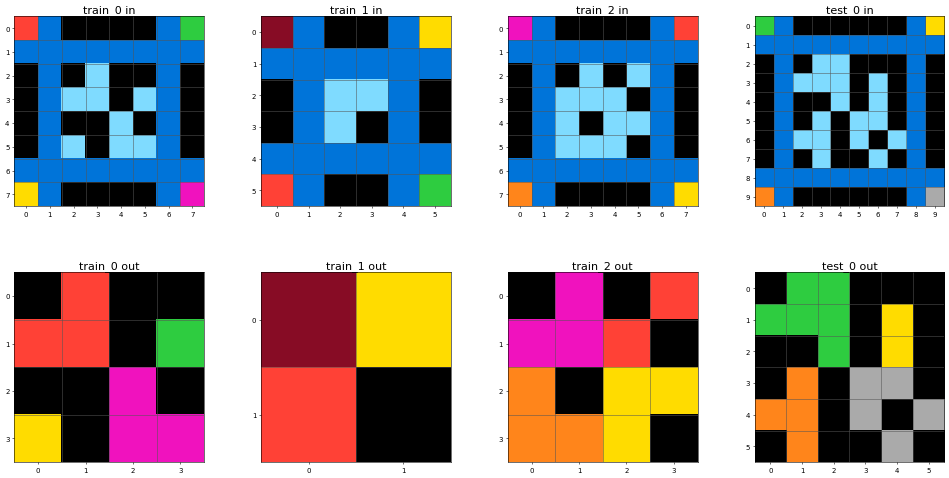

In [1106]:
task.plot()

1a (recommendation). The color exists in ALL example (input AND output)
and DOESNT change (or changes very little)
    - SHOULD TAKE THE DISTRIBUTION OF THE COLORS FROM INPUT TO OUTPUT.
        - if the distribution for the color changes then the color is important
1. color exists in all inputs, but not output, while all other colors exist
   in in both input and output
2. Same as 1, but the color exists in all output and not input
3. IF 1 and 2 do not hold, check if the distribution from input to output changes w.r.t the other colors

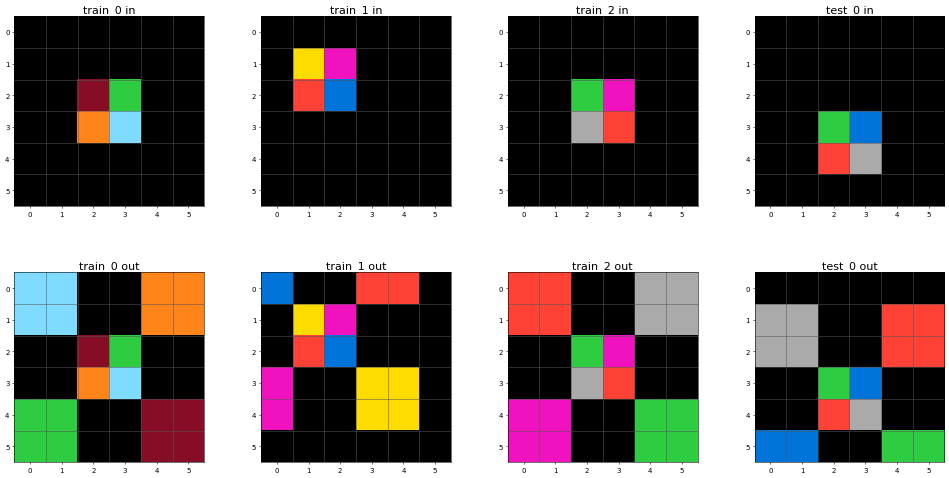

In [632]:
task.plot()

1e0a9b12


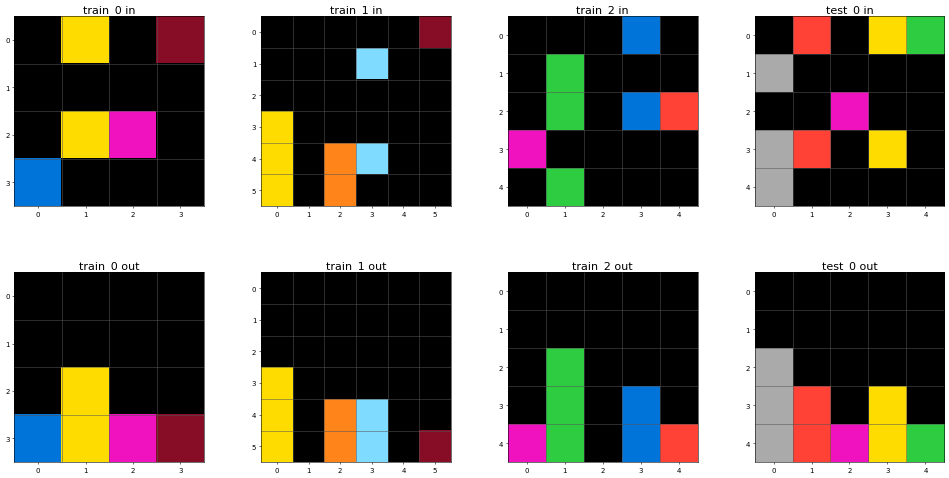

1b2d62fb


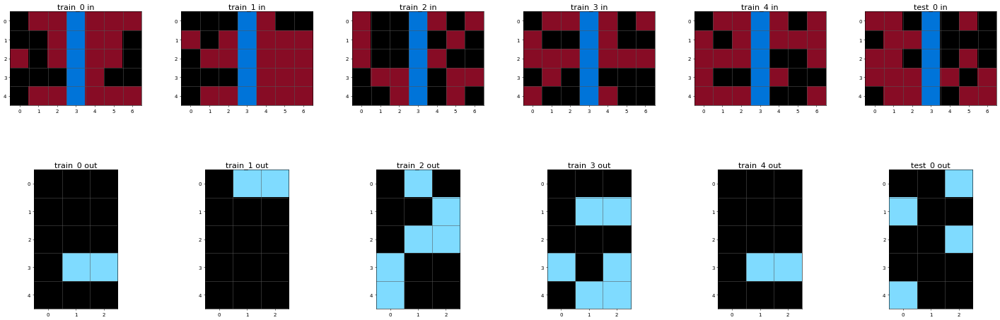

77fdfe62


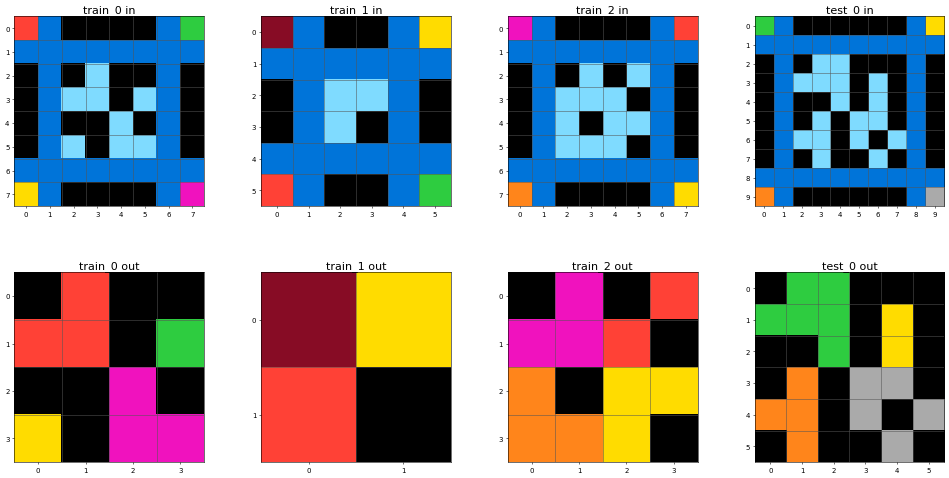

8d510a79


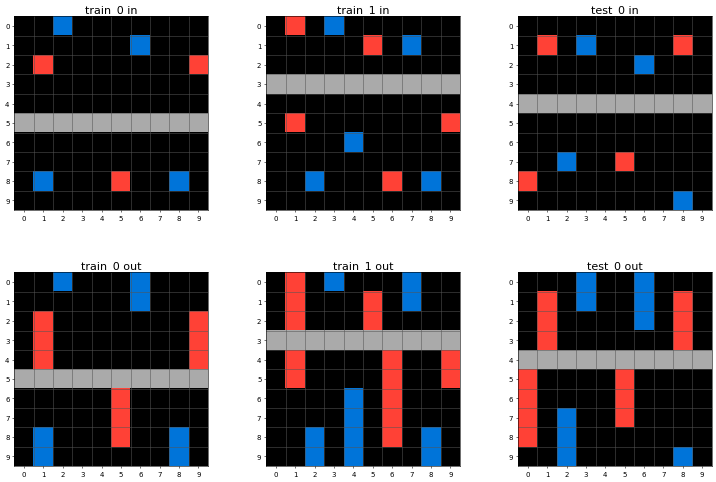

9edfc990


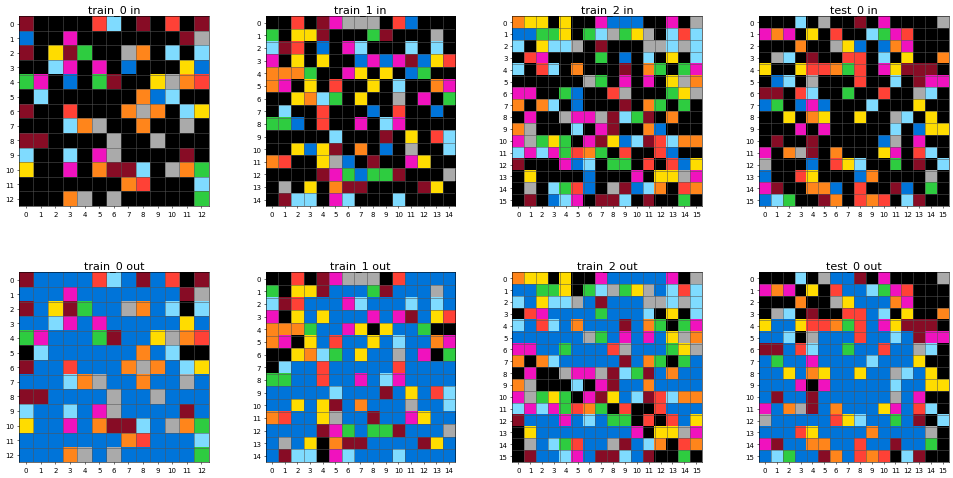

bb43febb


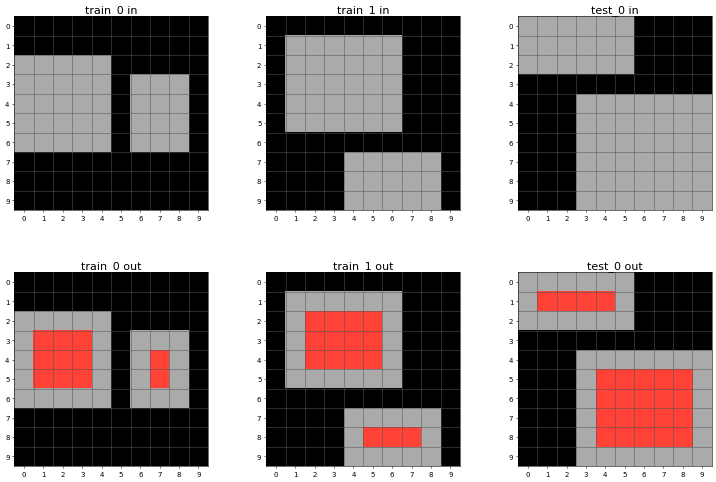

aedd82e4


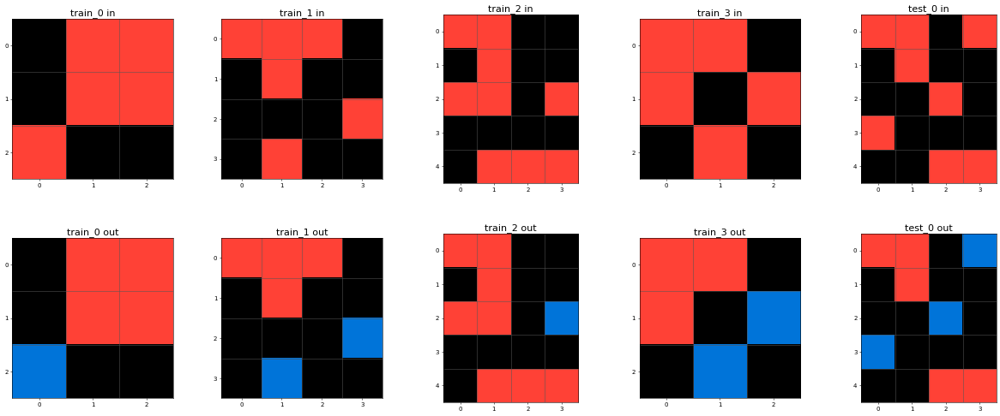

25d487eb


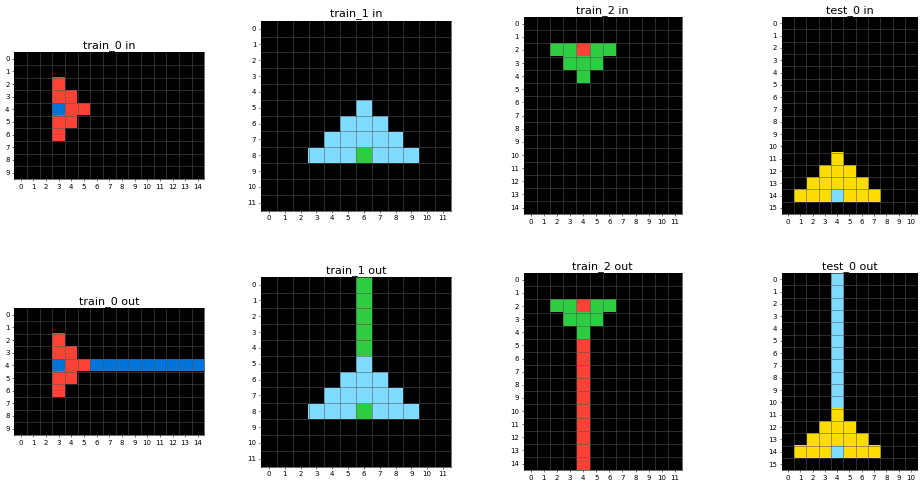

d89b689b


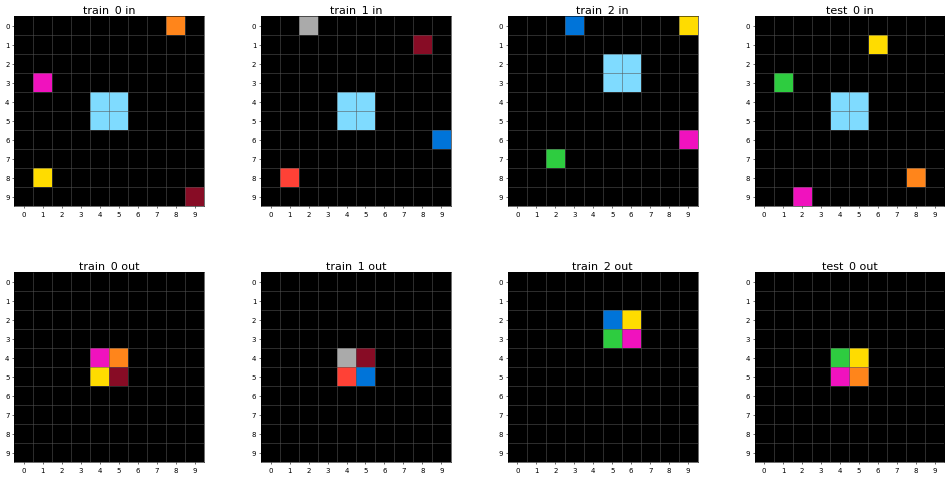

7447852a


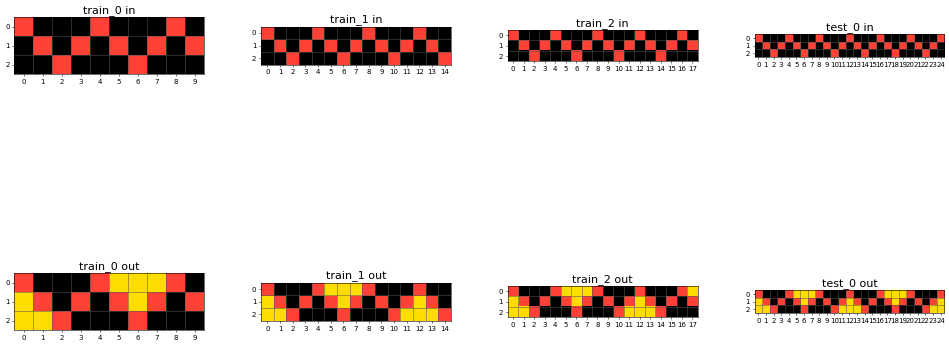

9af7a82c


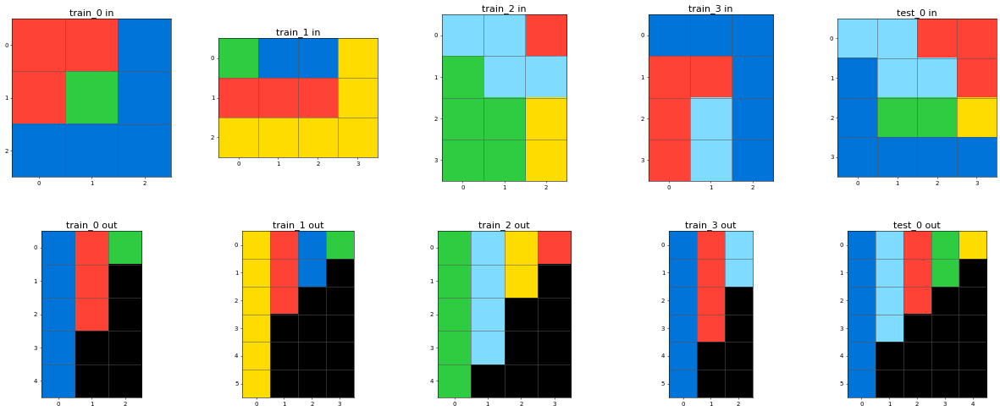

a2fd1cf0


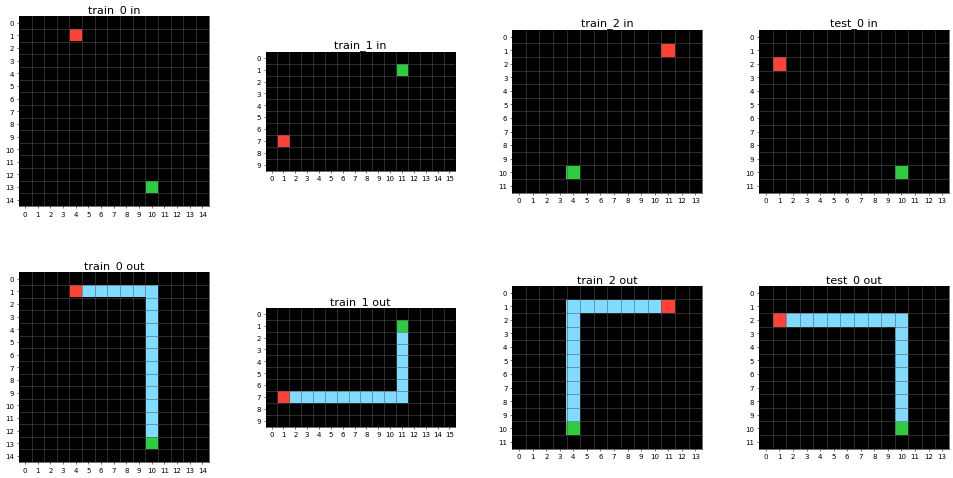

8efcae92


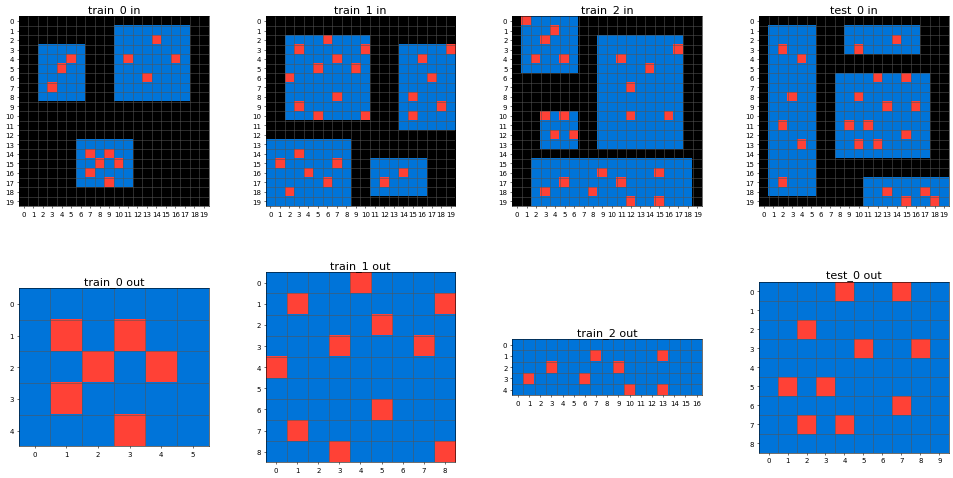

855e0971


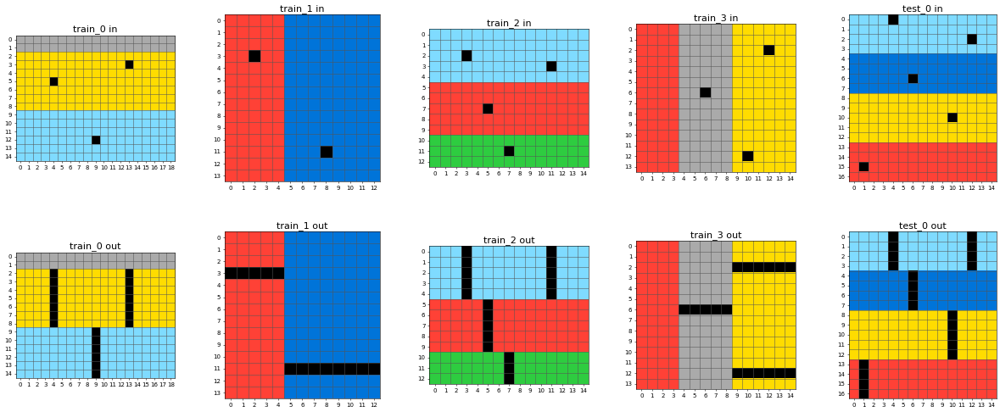

0d3d703e


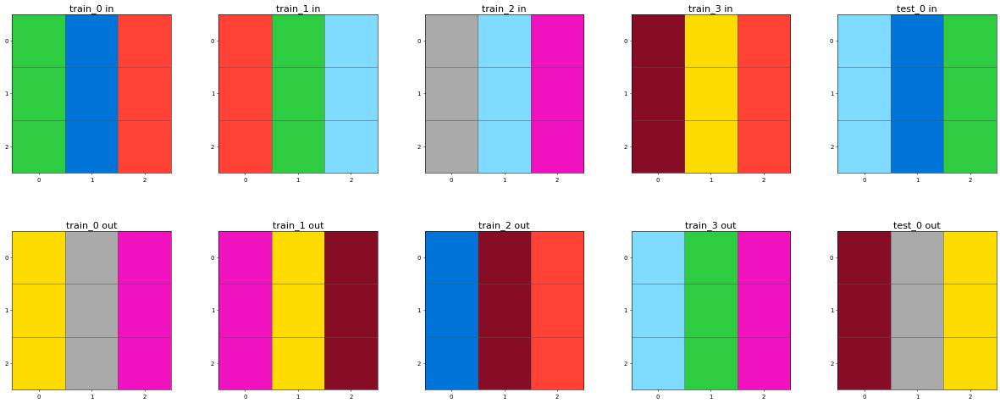

8d5021e8


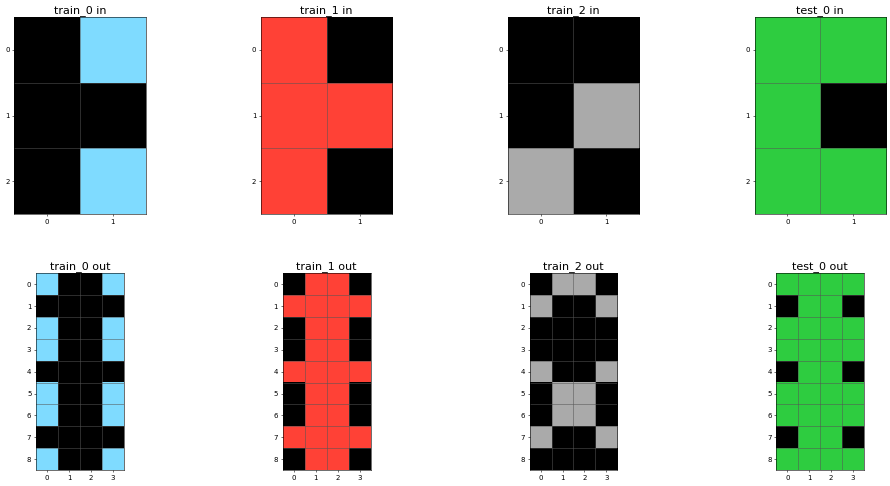

d43fd935


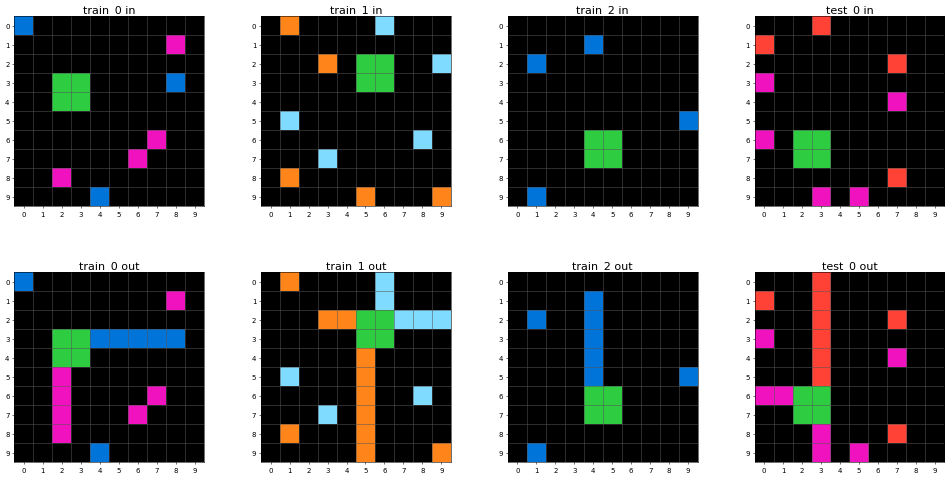

7837ac64


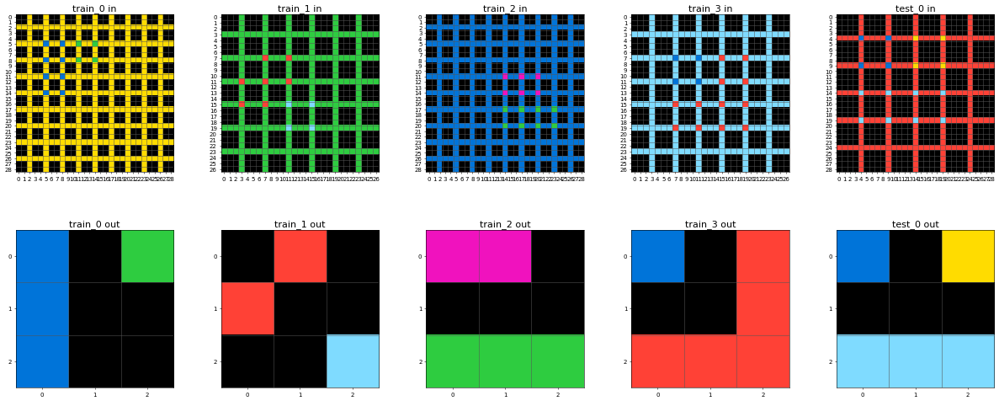

39e1d7f9


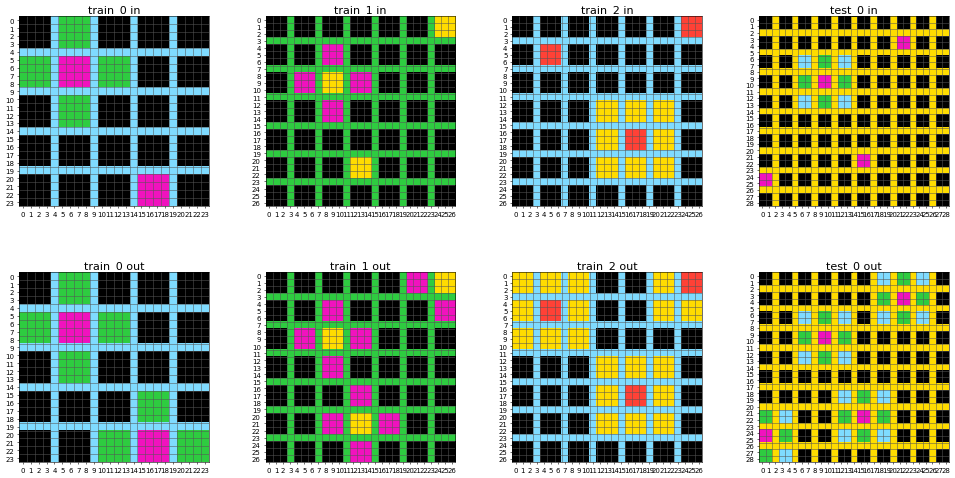

4c5c2cf0


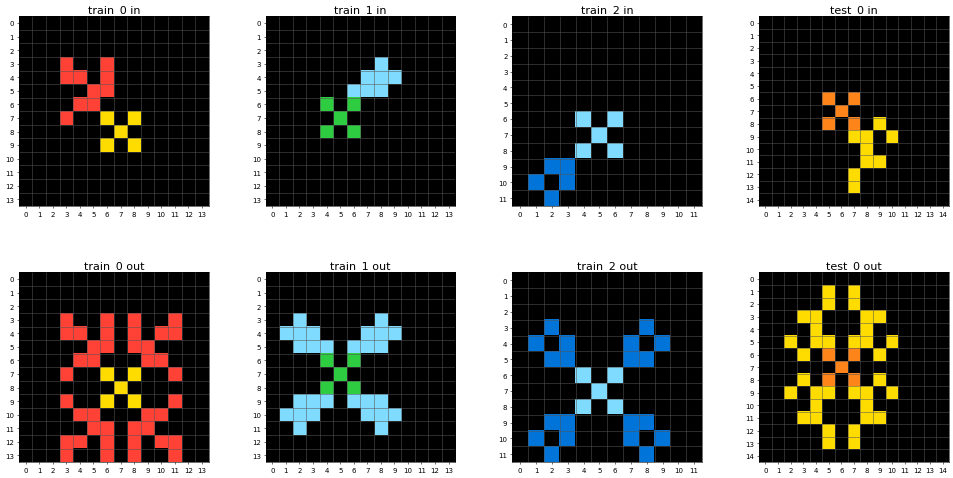

3aa6fb7a


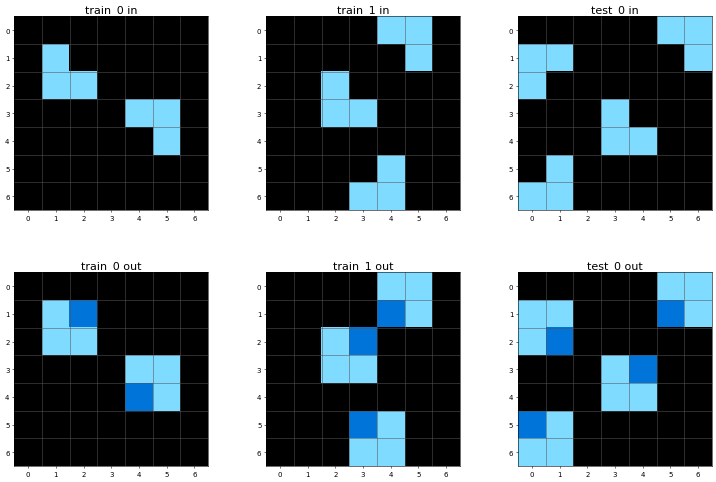

25d8a9c8


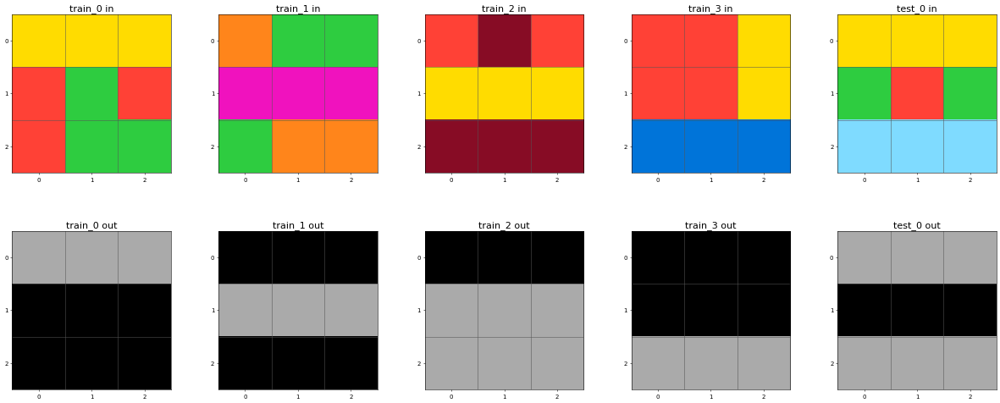

1f0c79e5


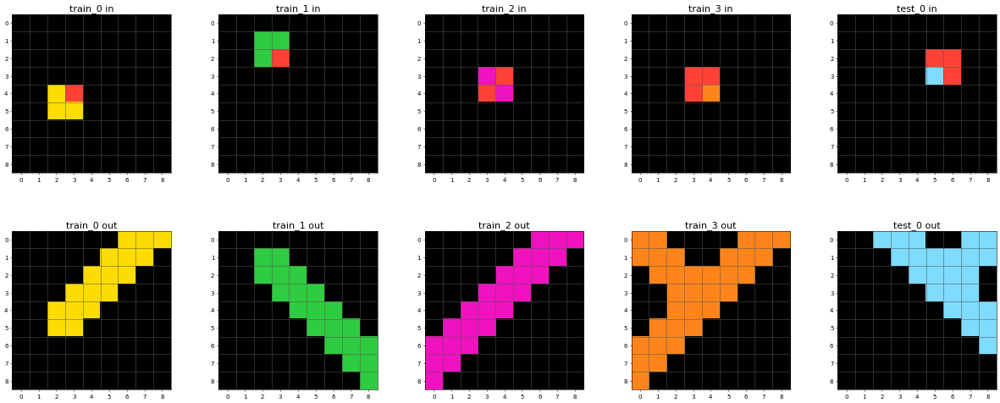

868de0fa


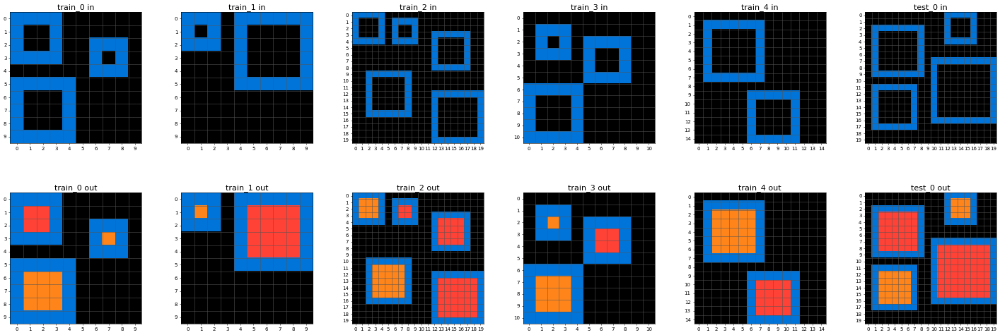

8e1813be


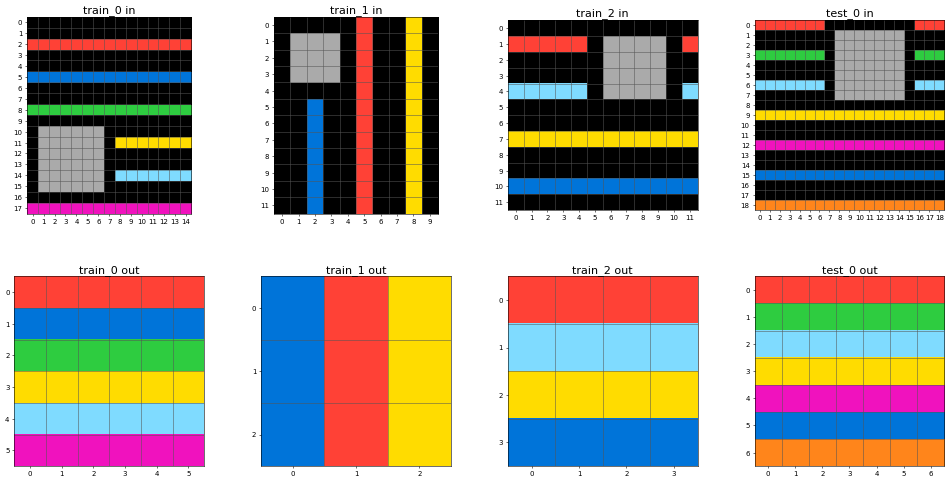

4c4377d9


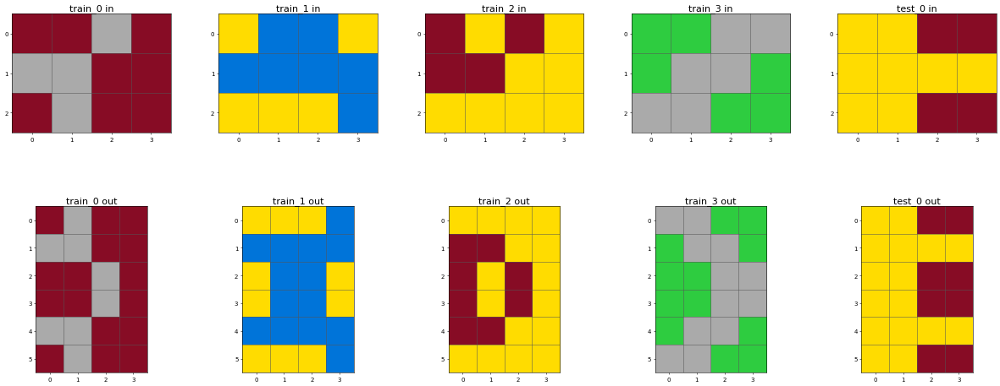

ce4f8723


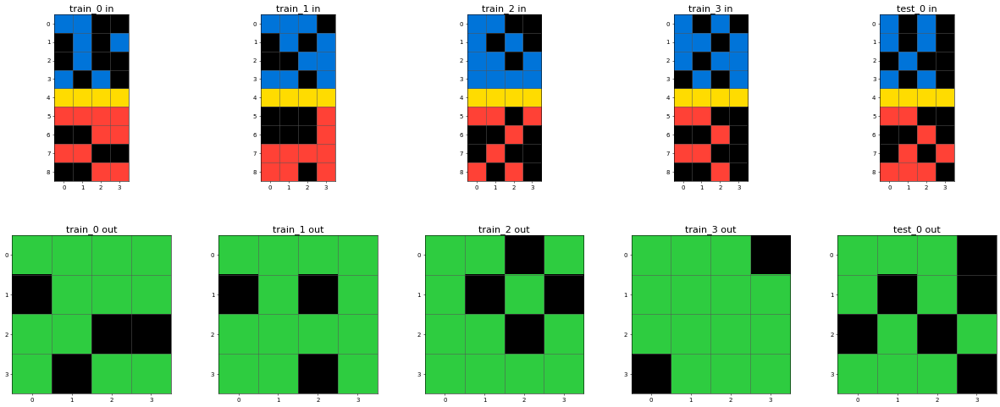

3bdb4ada


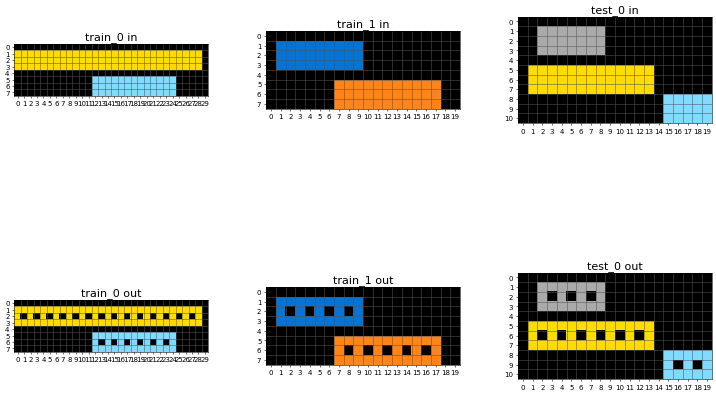

29c11459


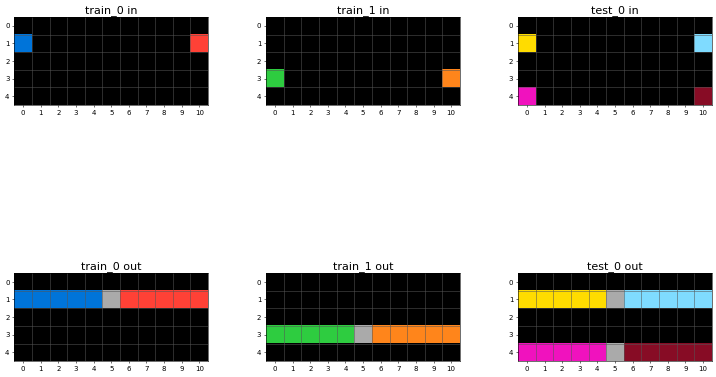

496994bd


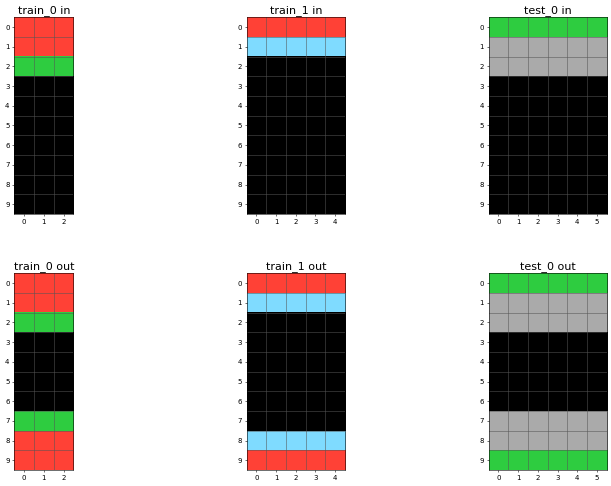

4be741c5


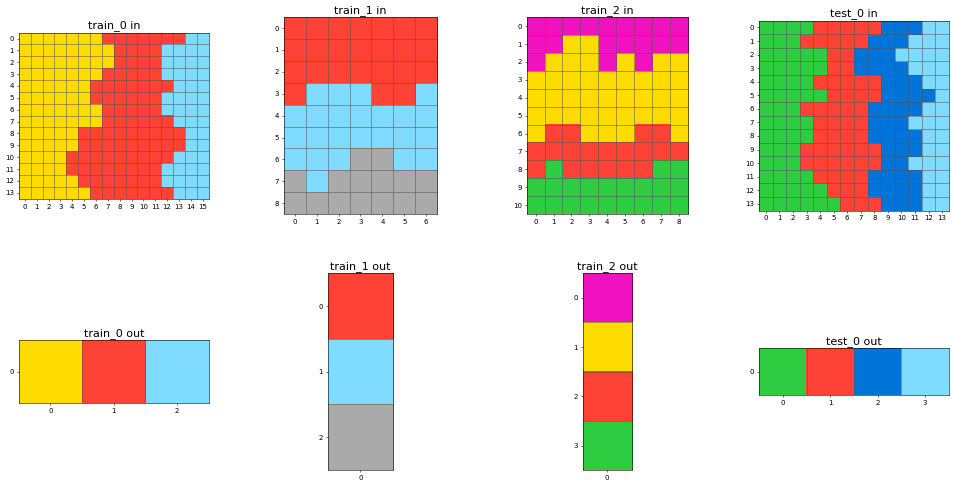

ac0a08a4


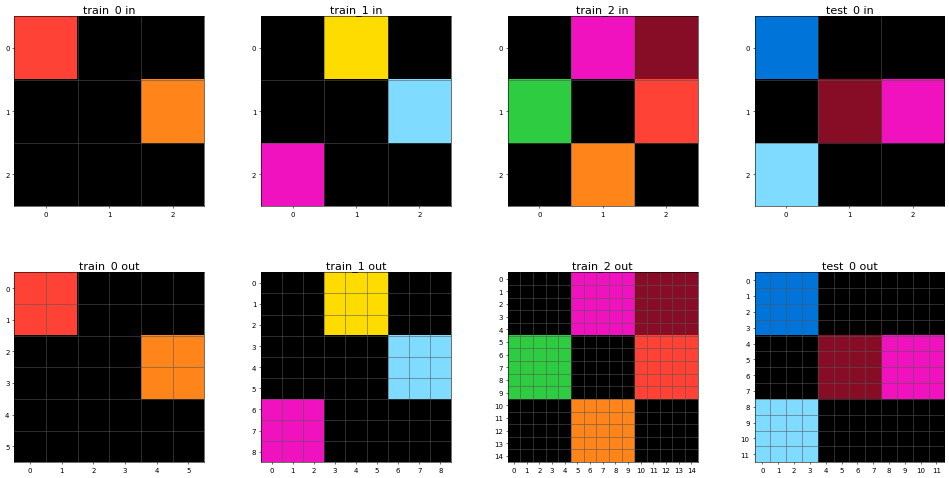

caa06a1f


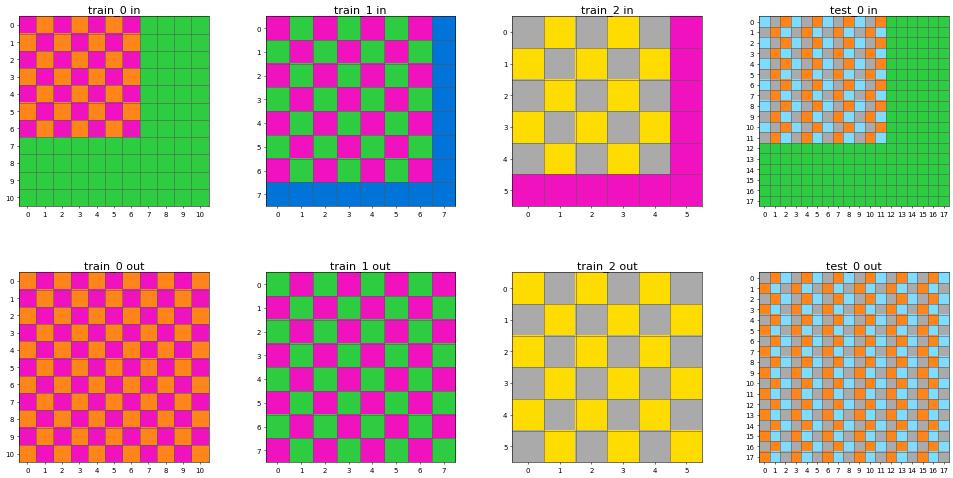

f25fbde4


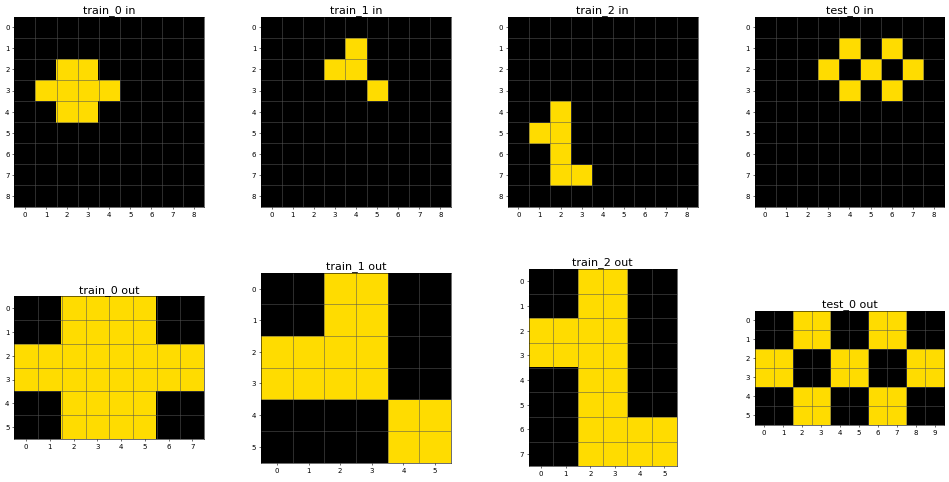

ec883f72


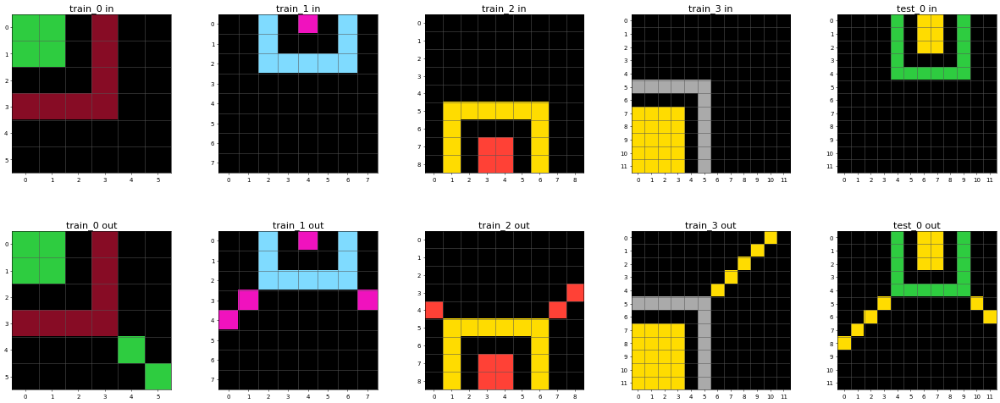

a416b8f3


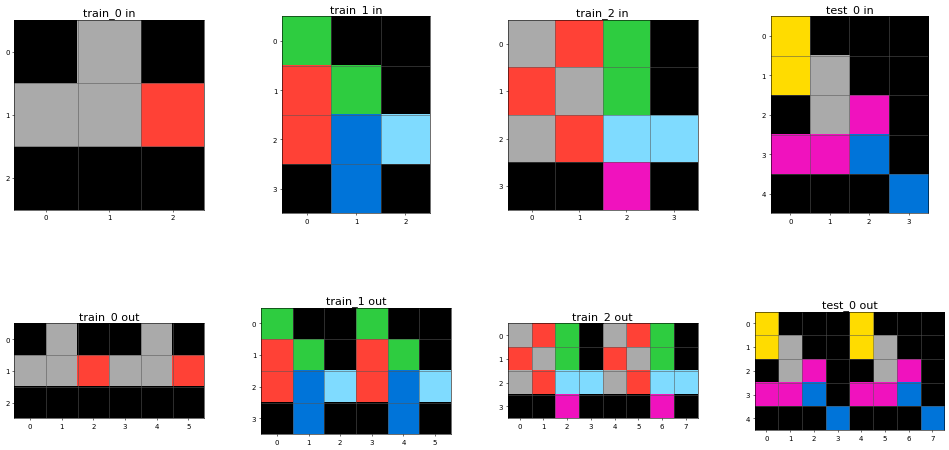

b94a9452


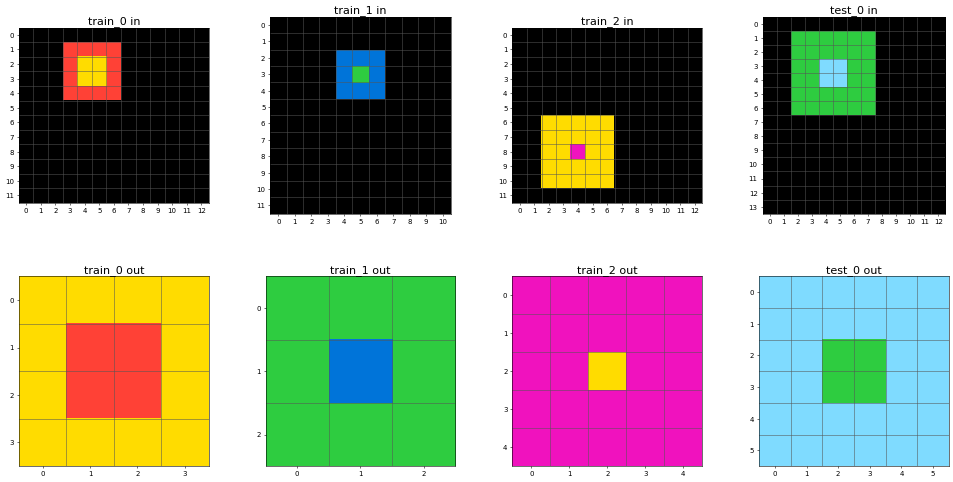

dc1df850


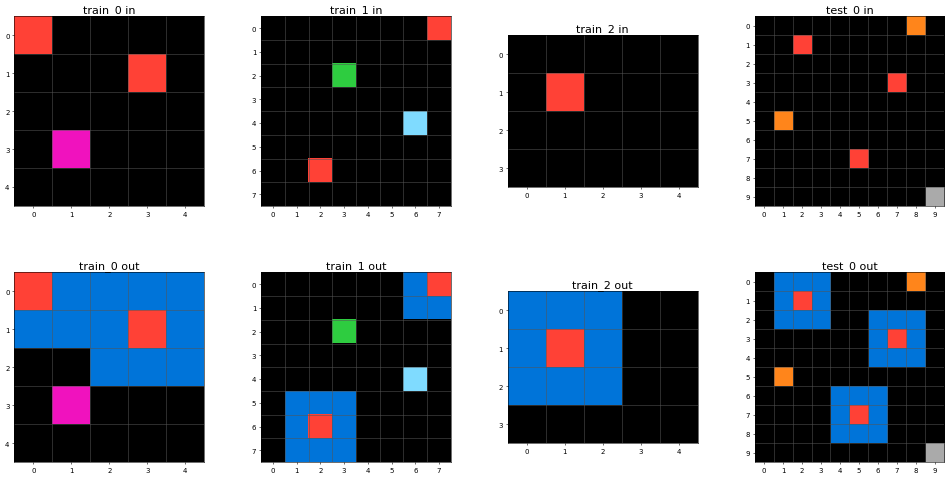

28e73c20


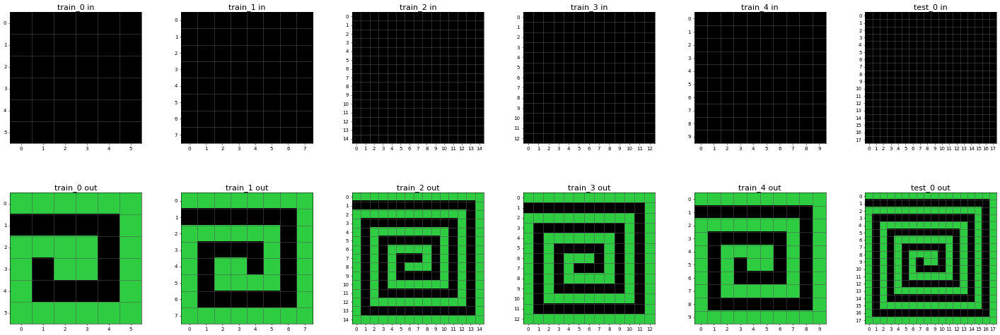

3906de3d


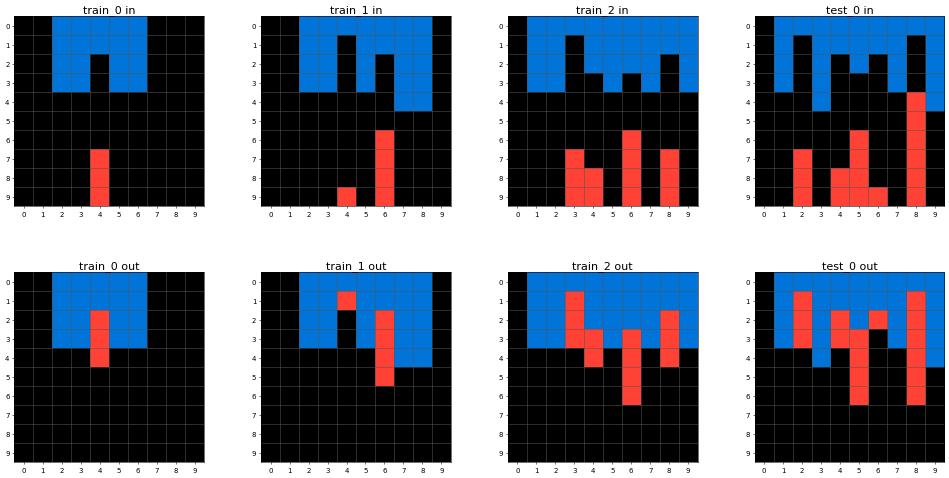

253bf280


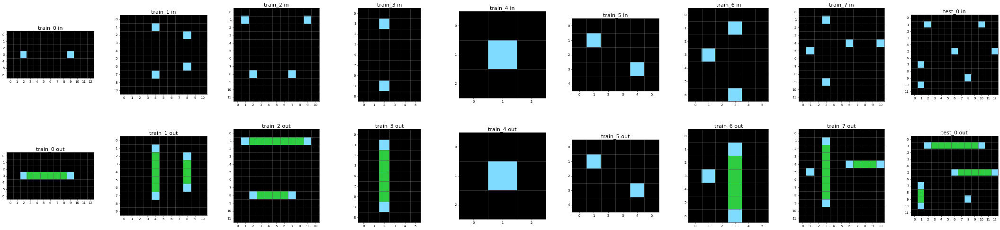

045e512c


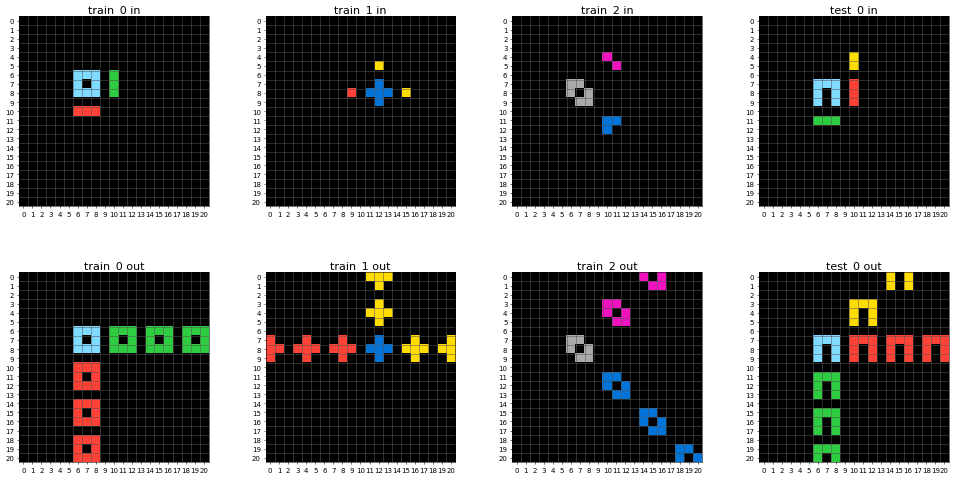

a85d4709


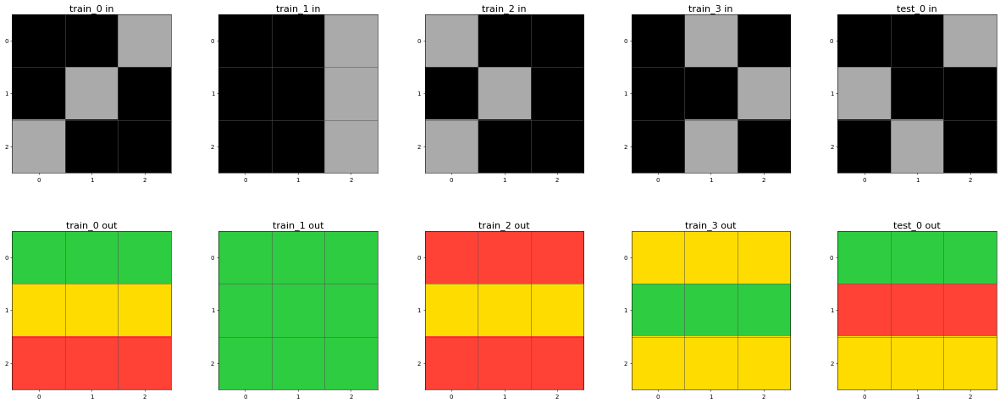

2013d3e2


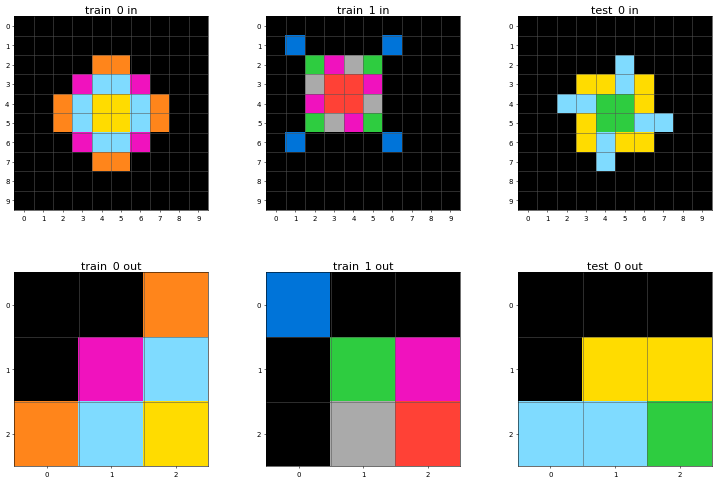

6cdd2623


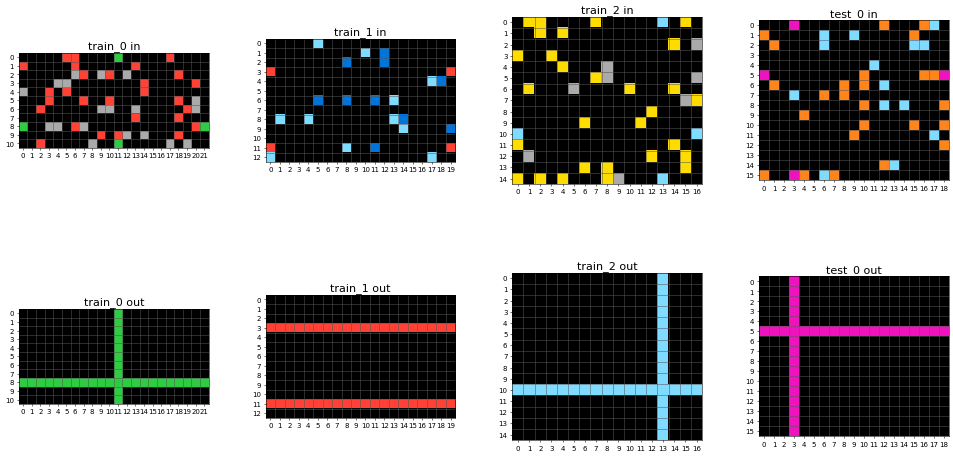

d687bc17


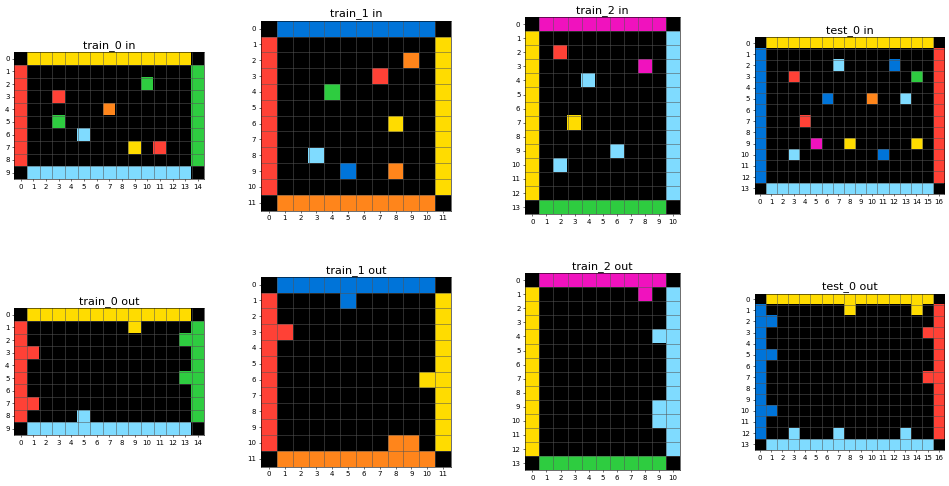

264363fd


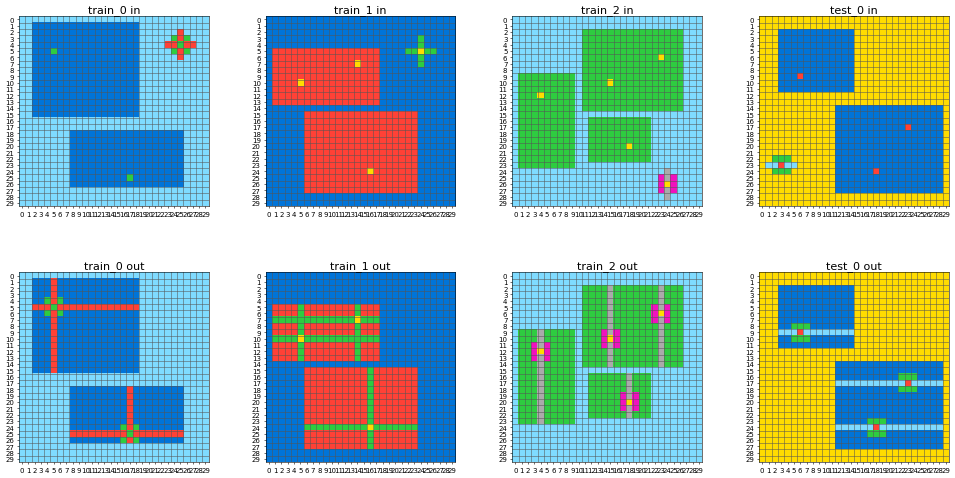

cf98881b


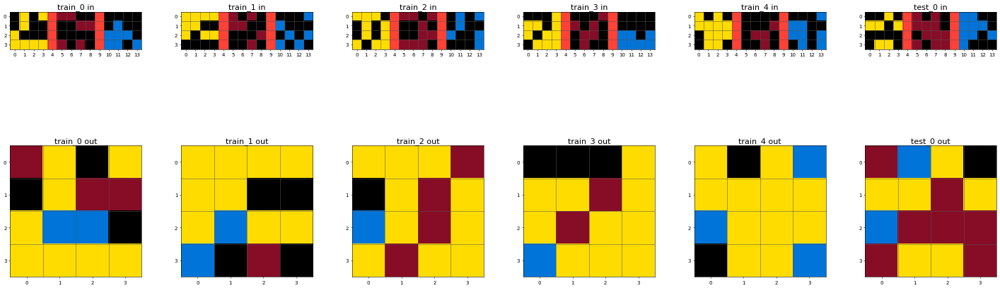

9d9215db


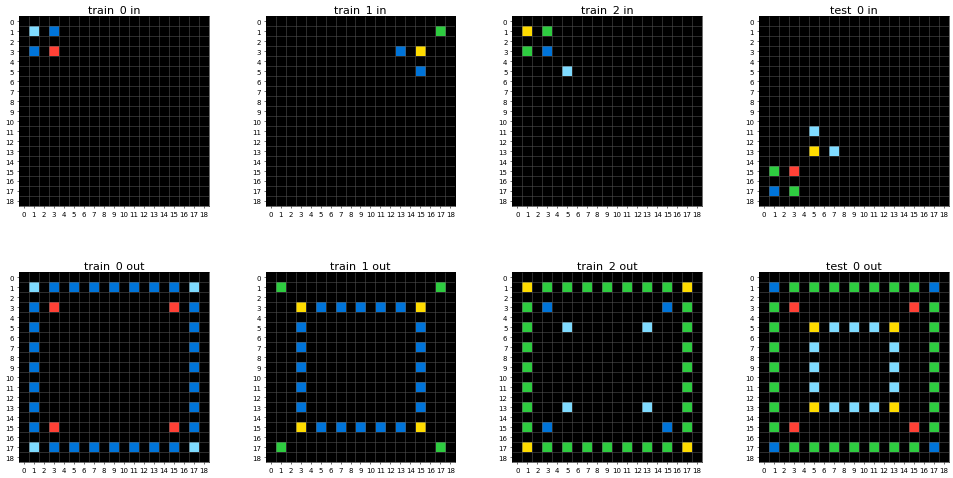

1caeab9d


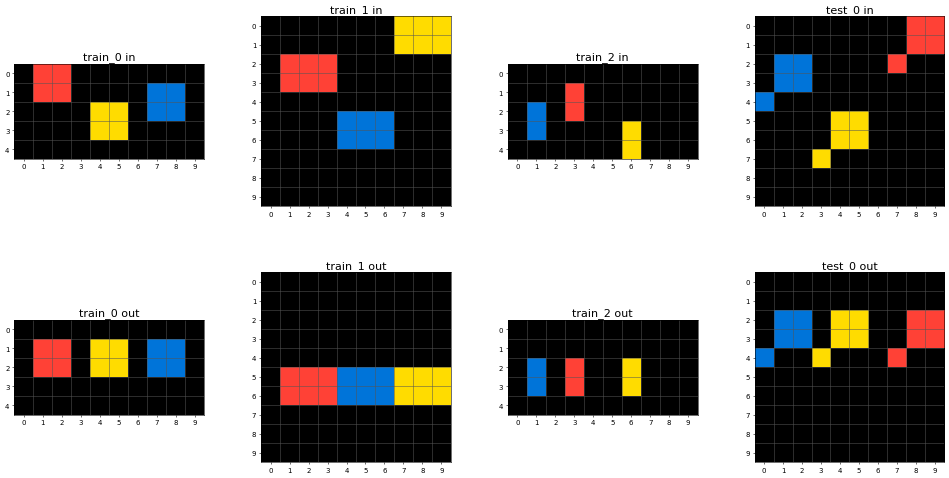

91413438


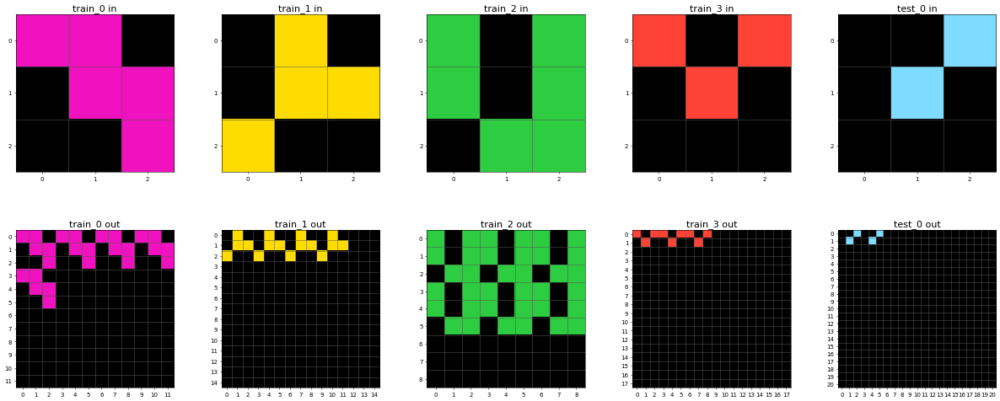

cce03e0d


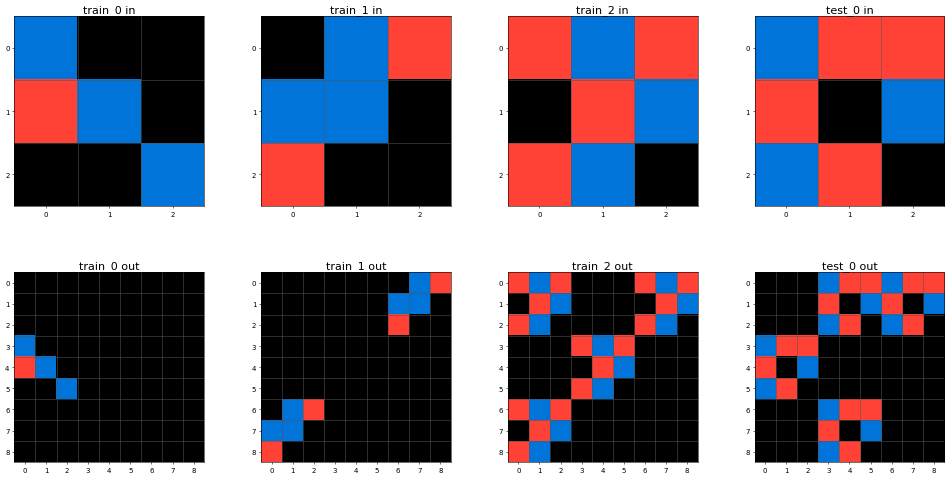

74dd1130


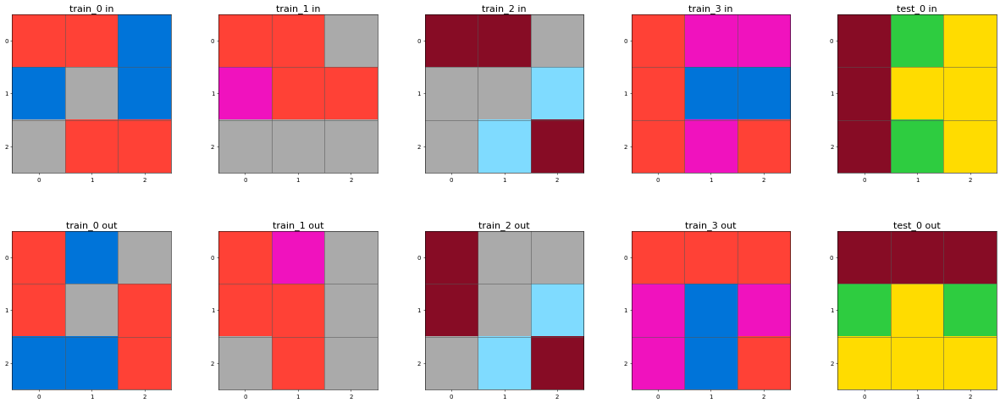

941d9a10


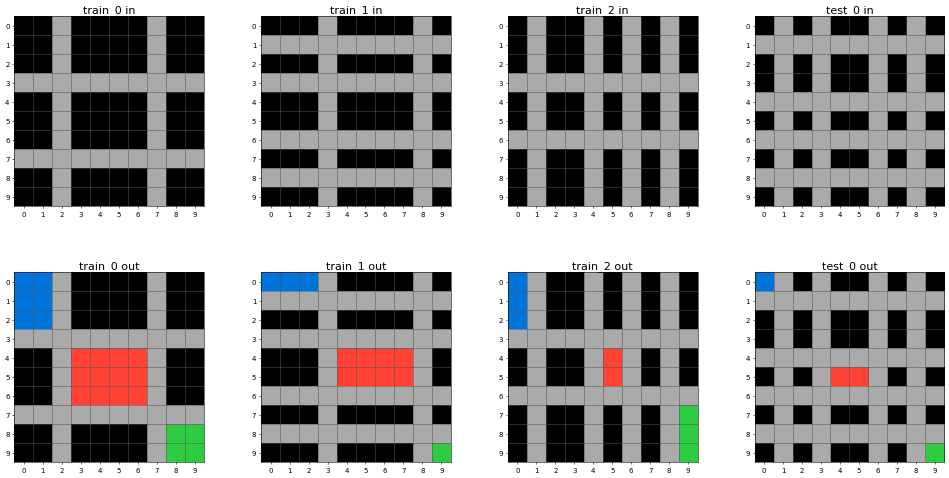

a5313dff


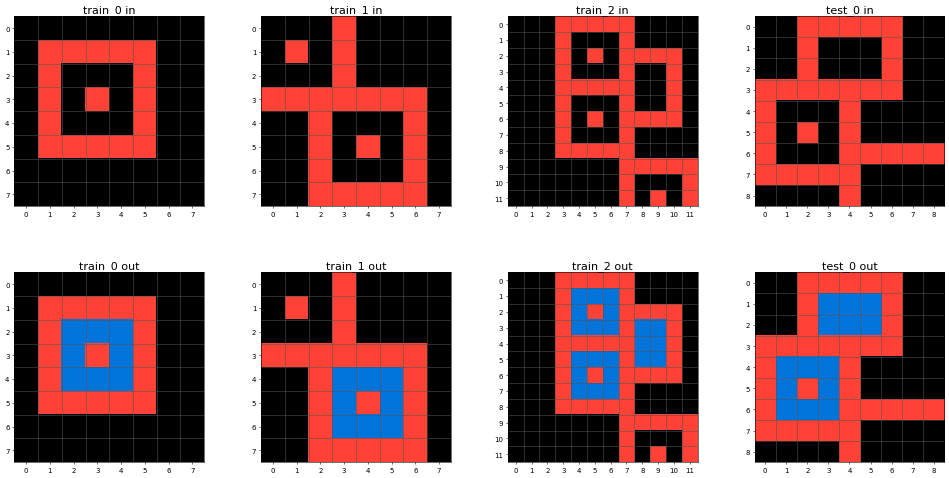

543a7ed5


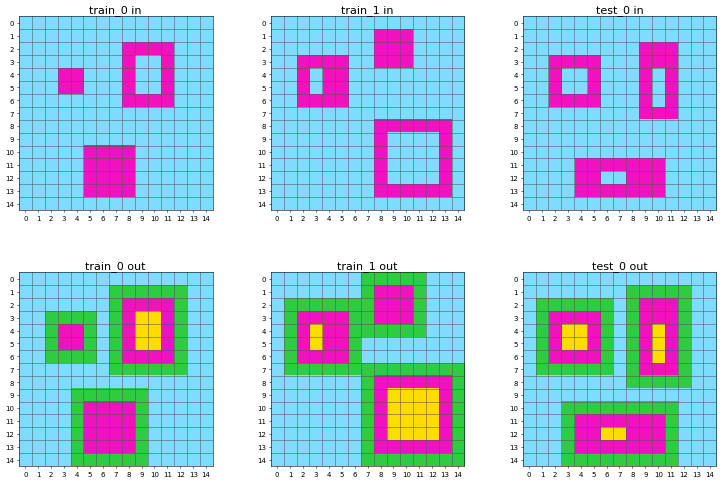

ecdecbb3


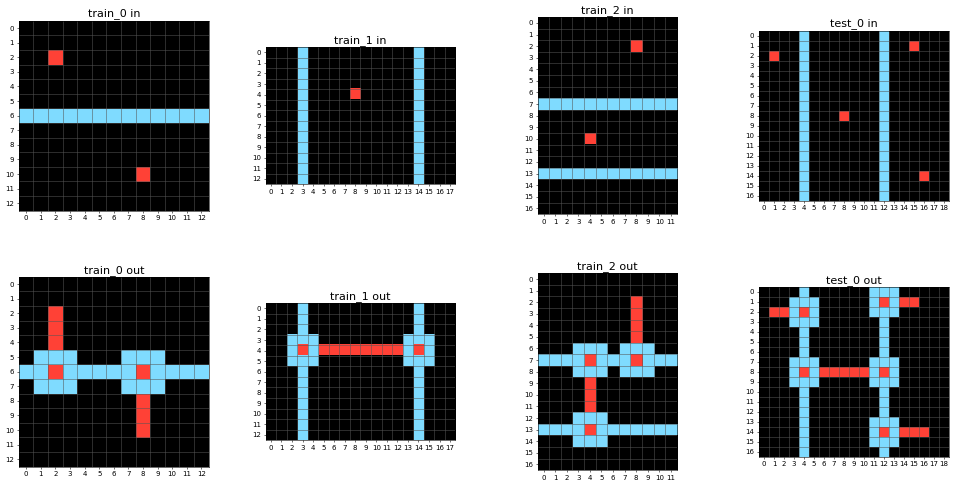

36d67576


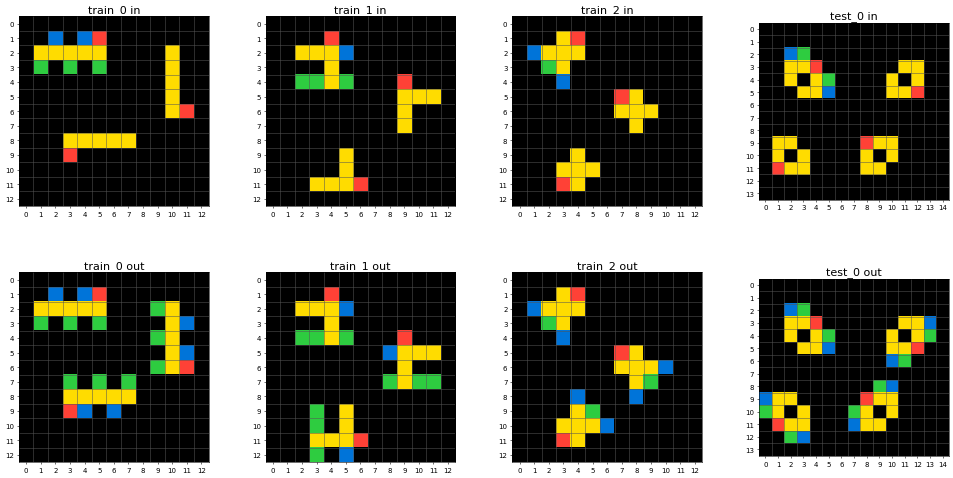

a87f7484


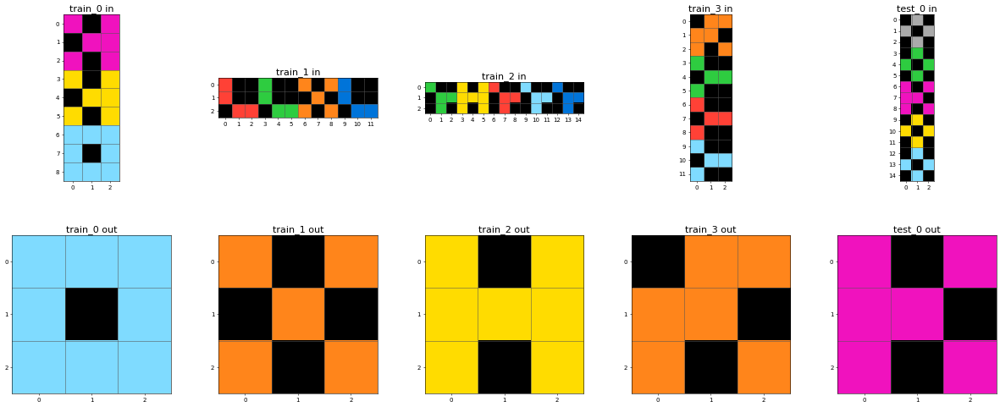

6e02f1e3


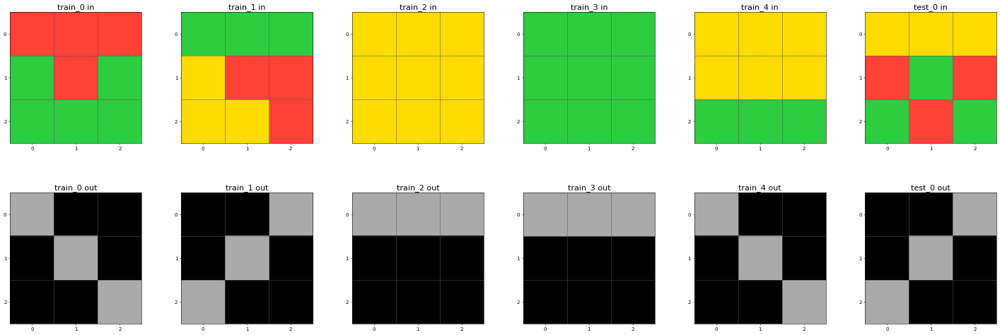

b775ac94


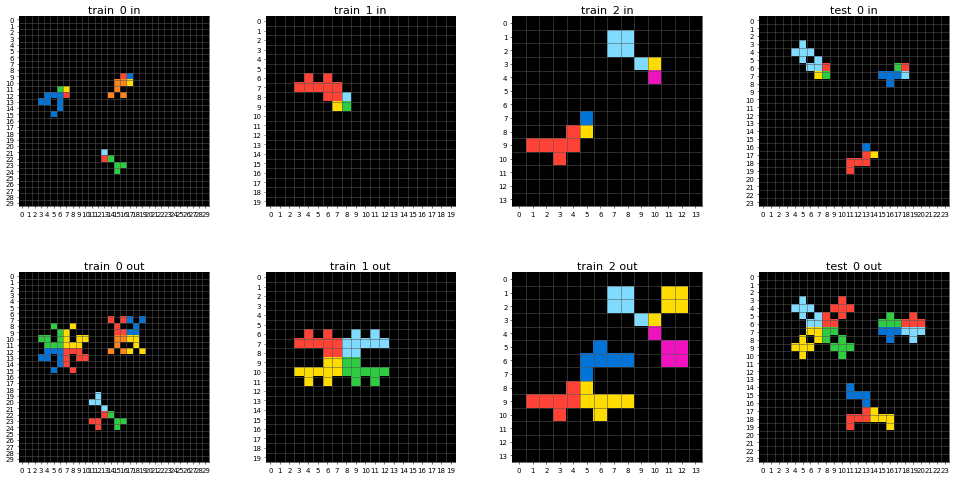

2281f1f4


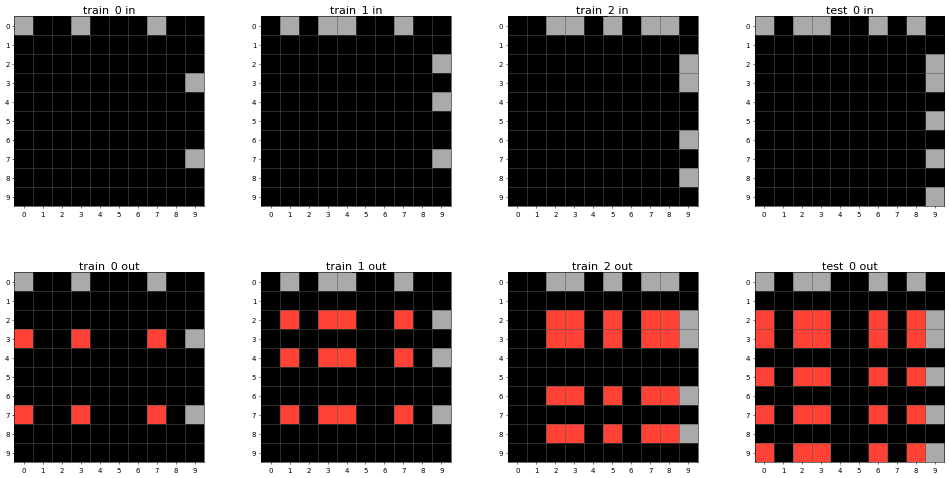

469497ad


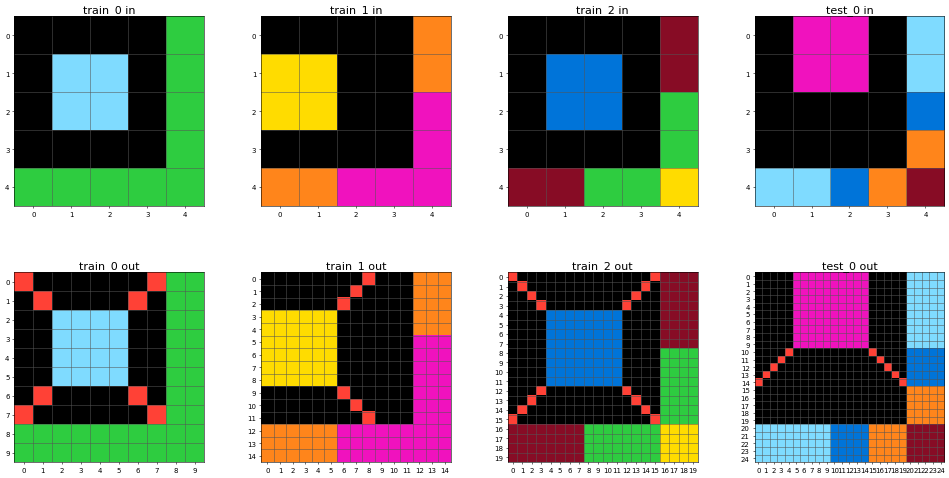

4093f84a


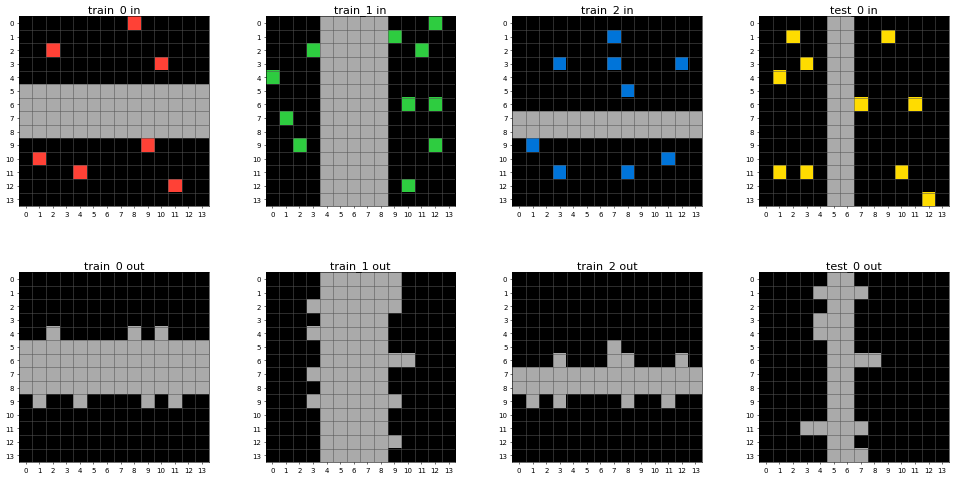

9ecd008a


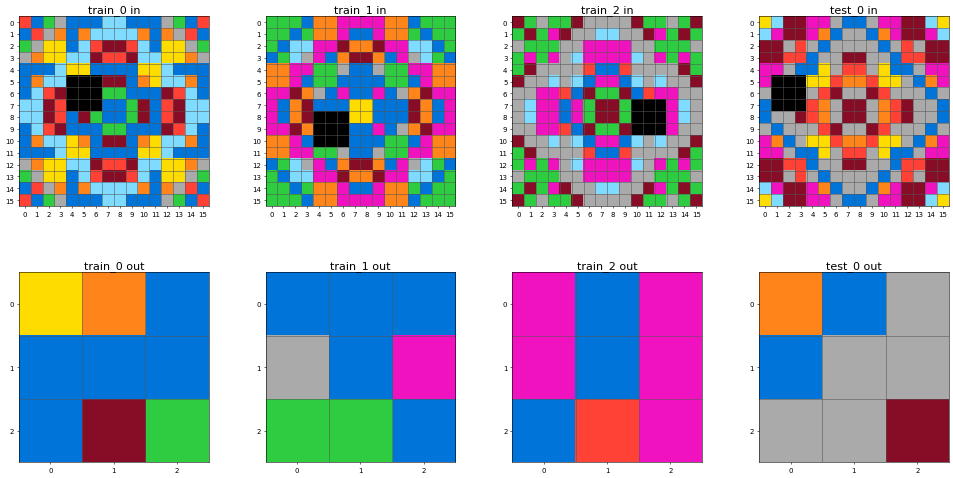

a3325580


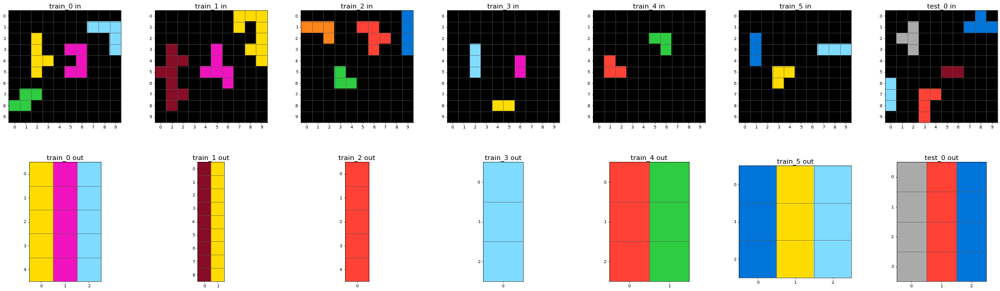

d6ad076f


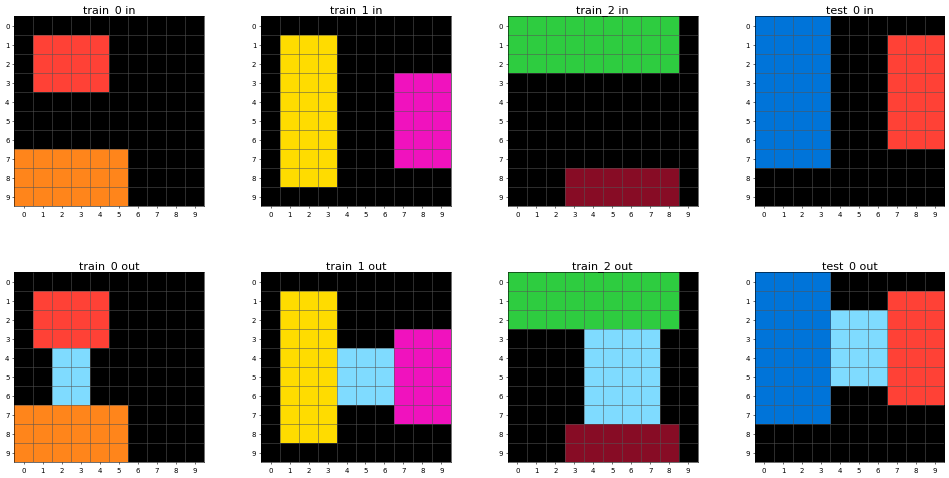

6a1e5592


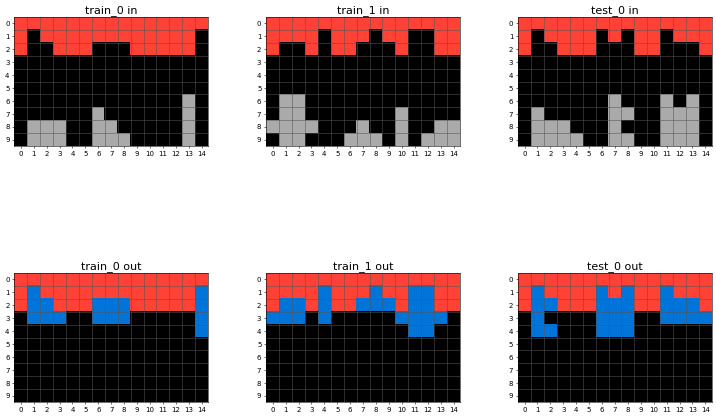

ae4f1146


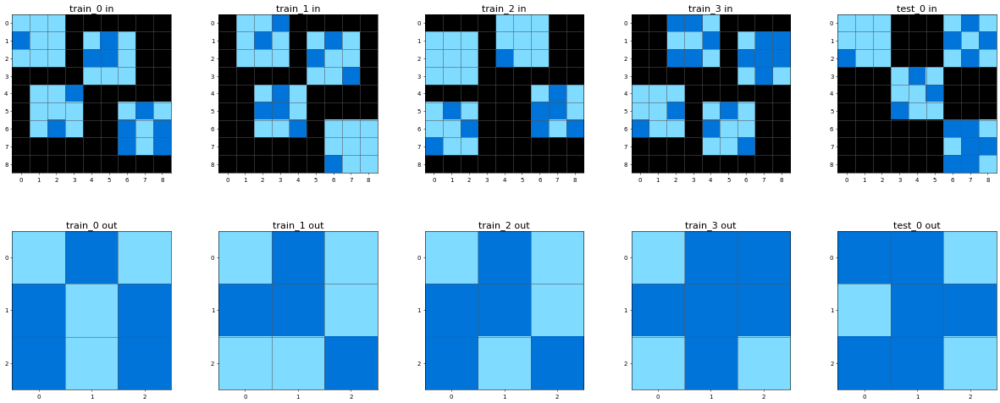

60b61512


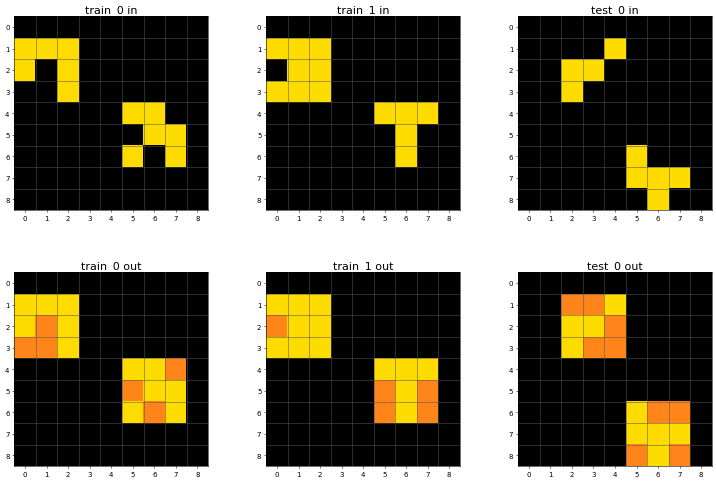

27a28665


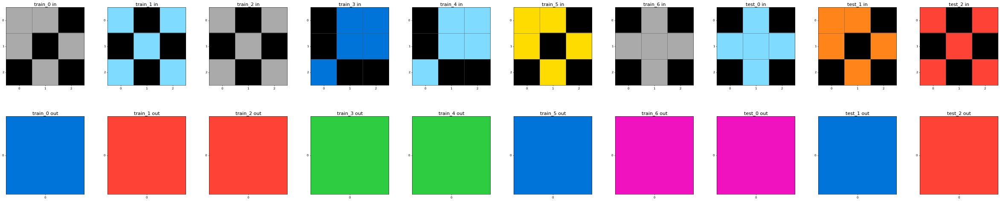

31aa019c


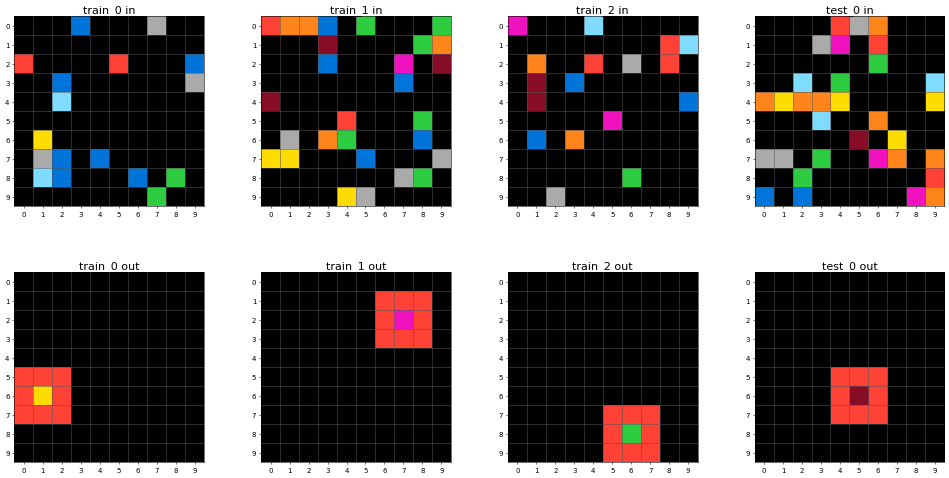

44f52bb0


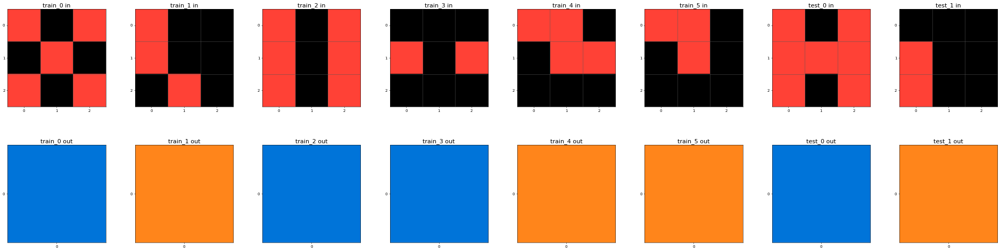

e76a88a6


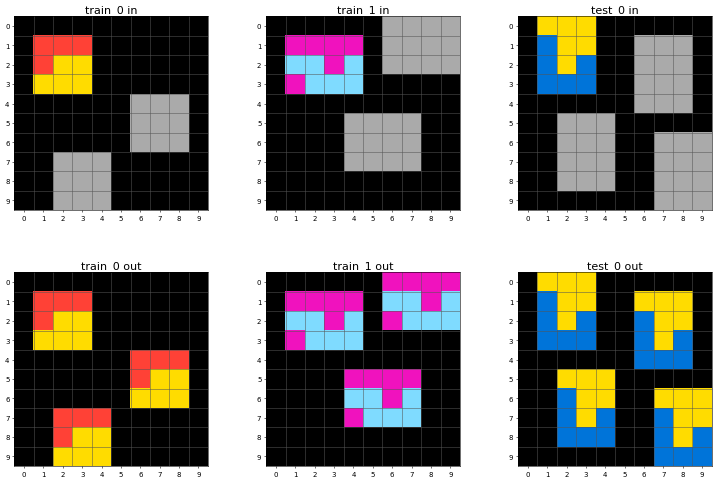

a78176bb


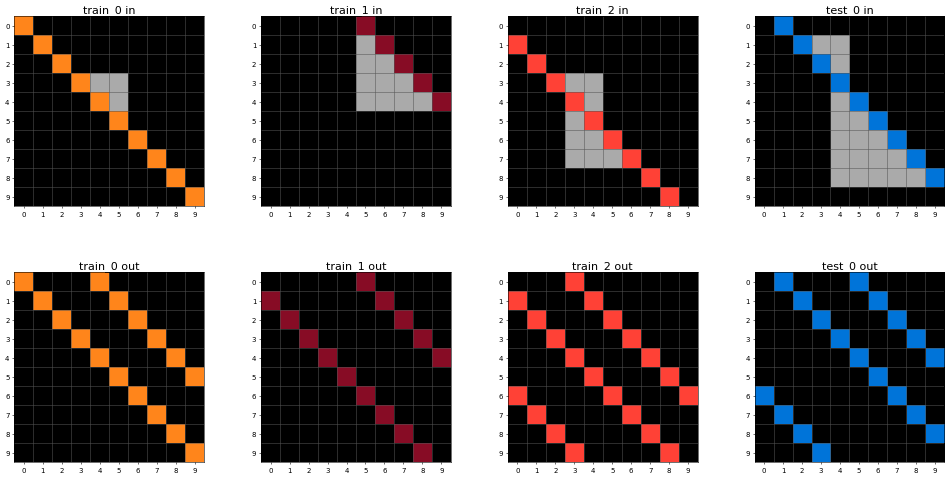

780d0b14


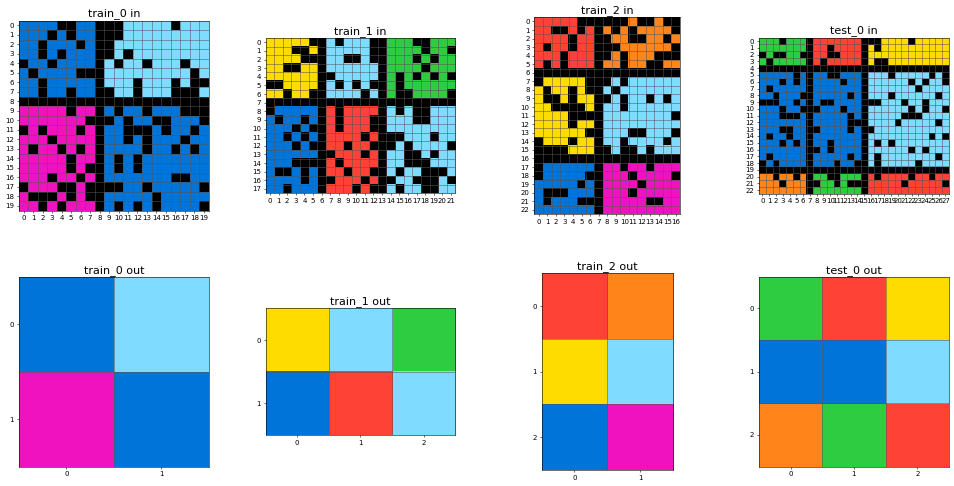

623ea044


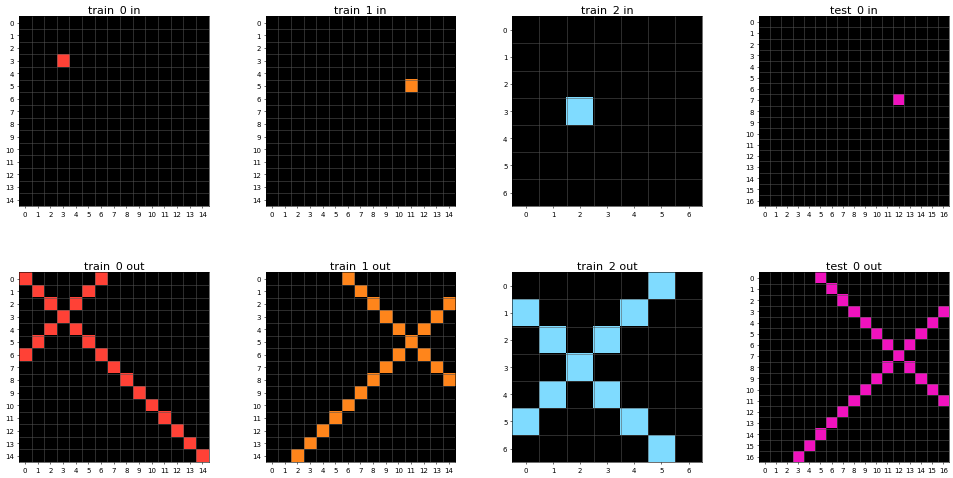

6455b5f5


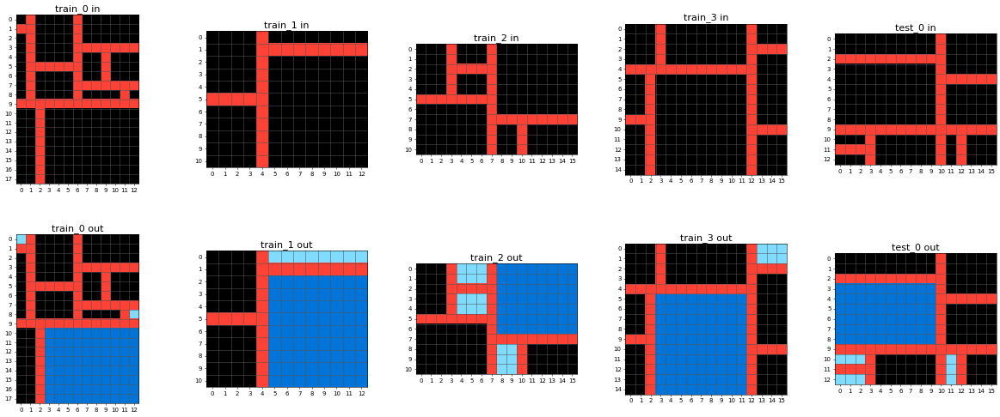

94f9d214


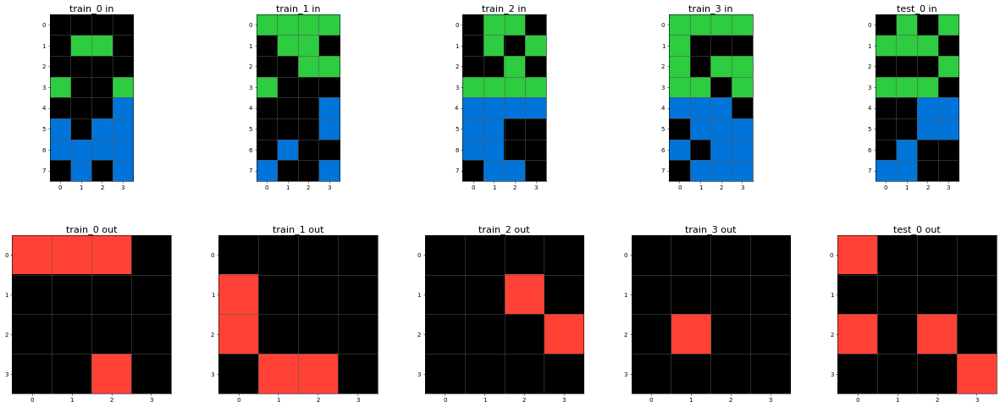

d511f180


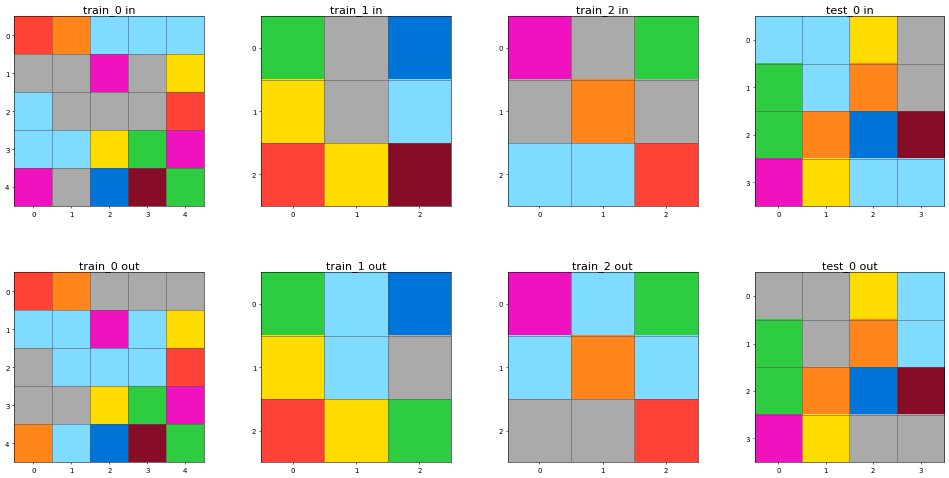

73251a56


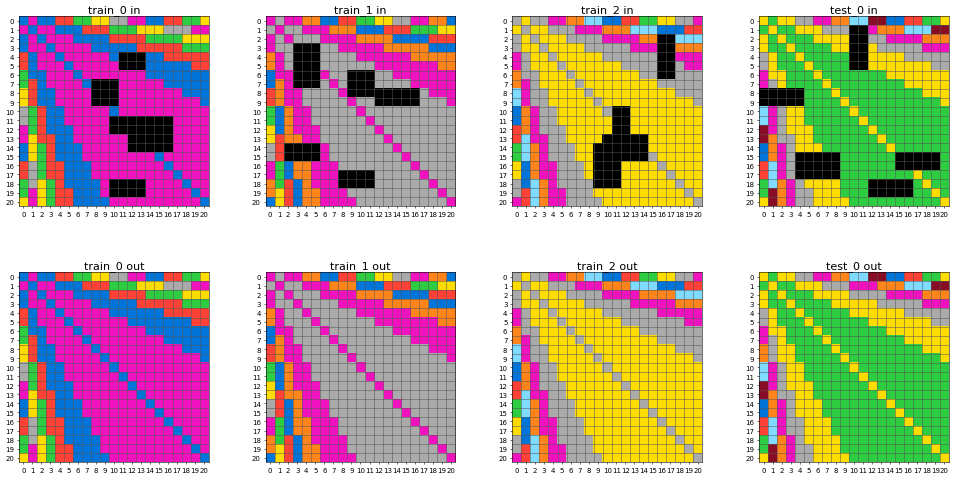

a61f2674


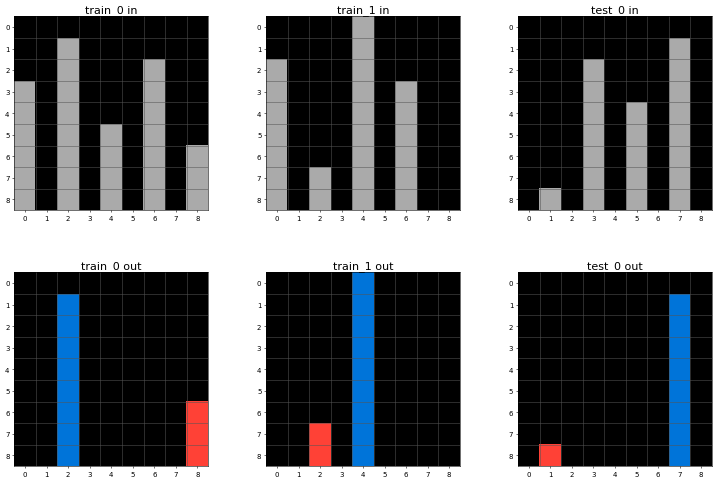

d9f24cd1


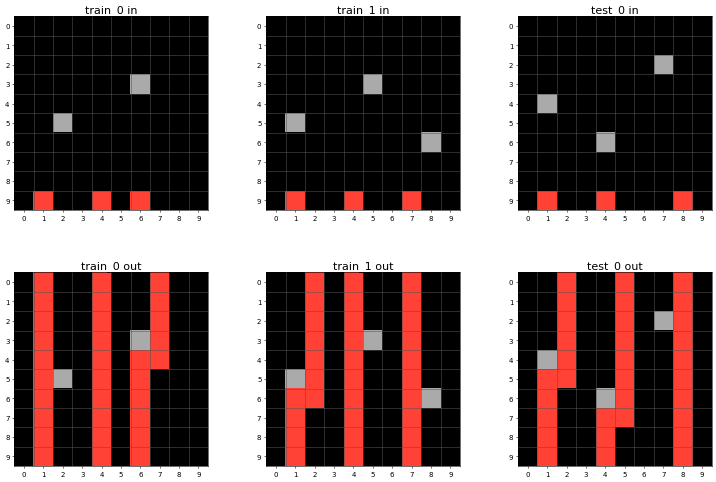

e8593010


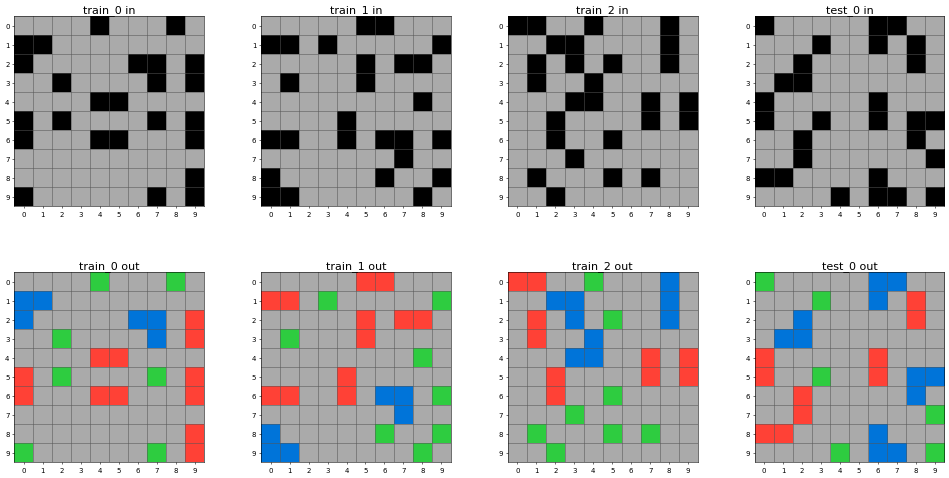

6cf79266


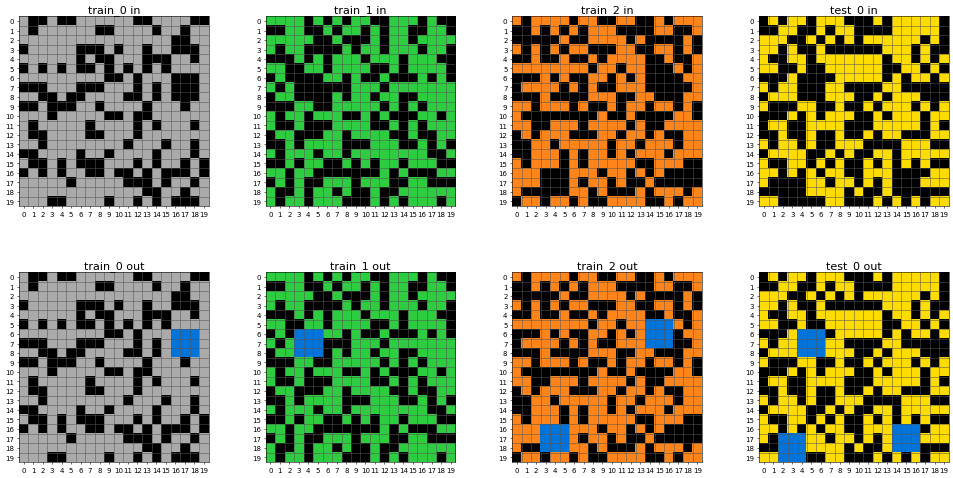

b782dc8a


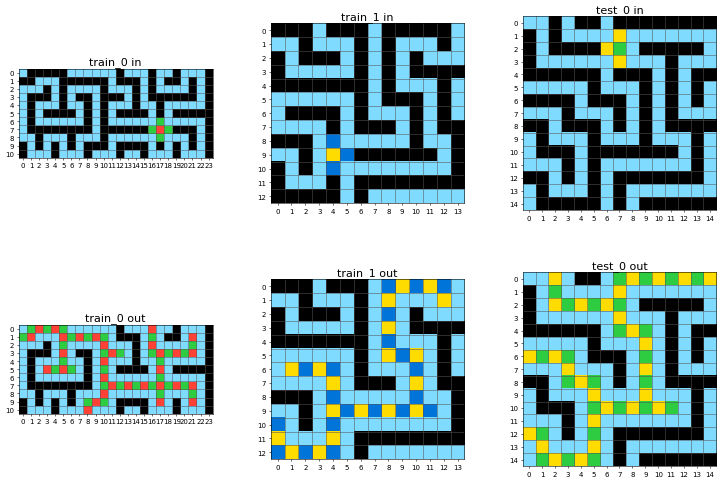

b9b7f026


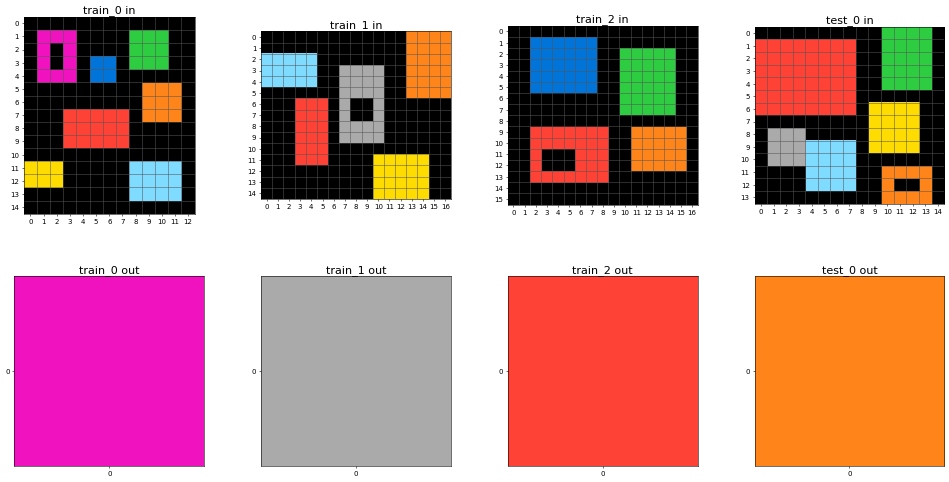

444801d8


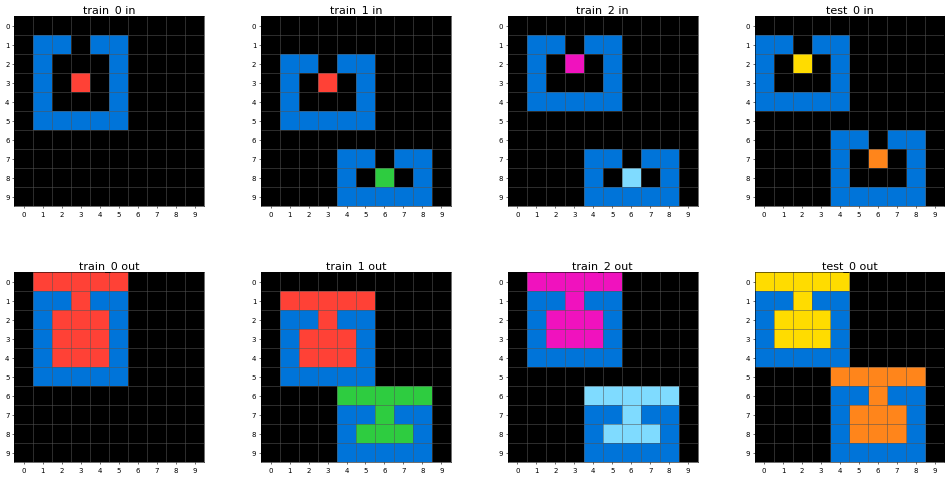

7fe24cdd


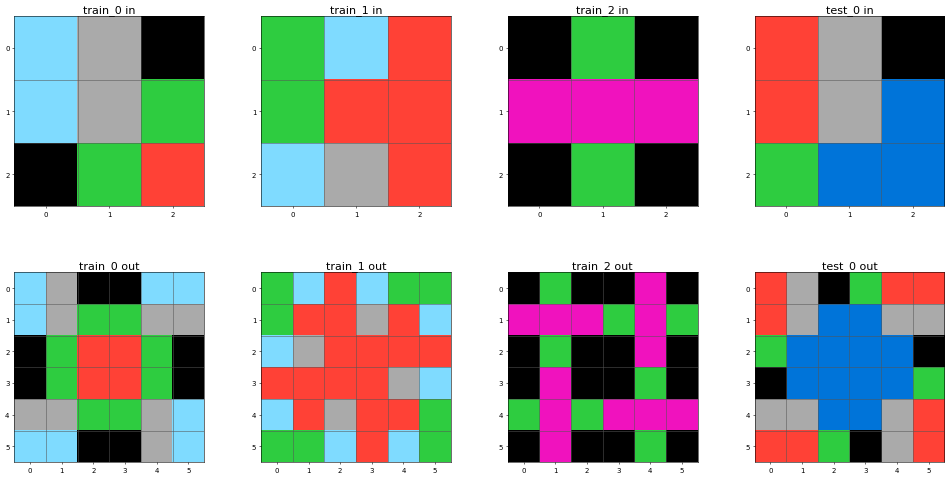

9aec4887


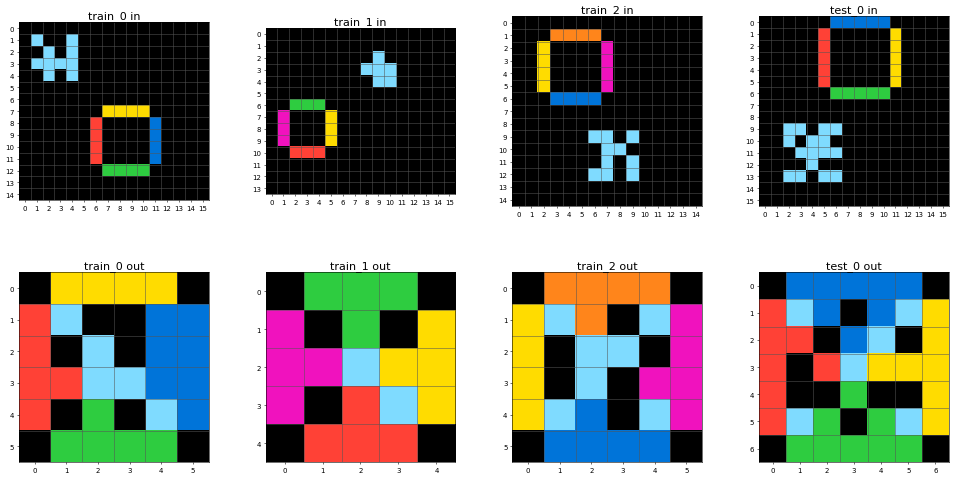

508bd3b6


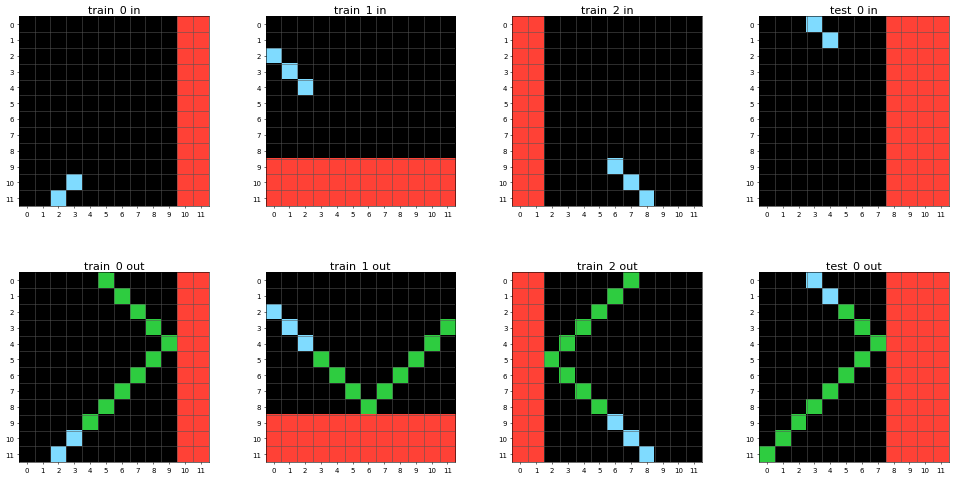

d22278a0


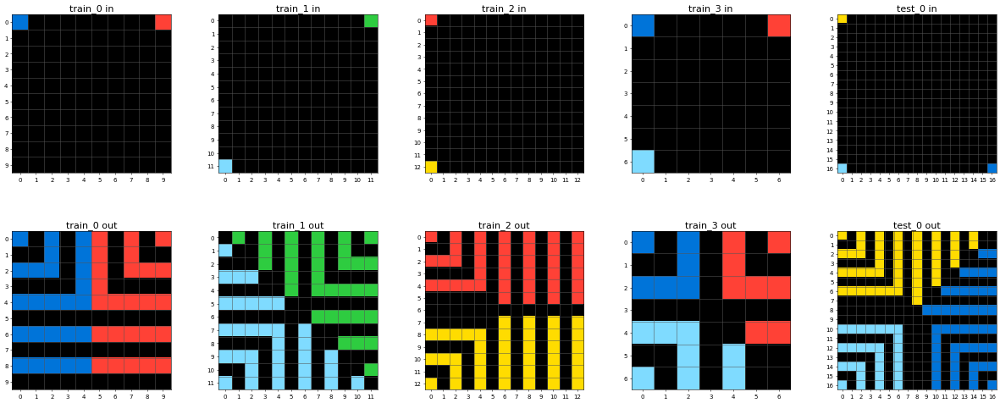

d4469b4b


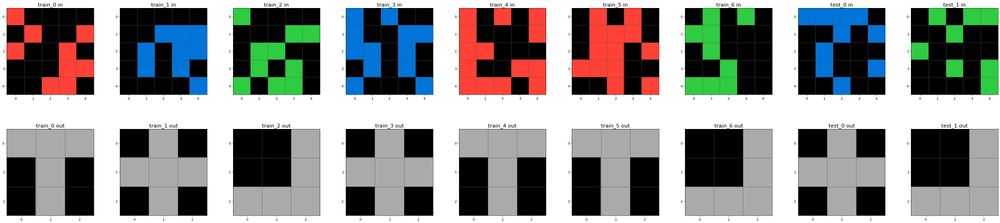

47c1f68c


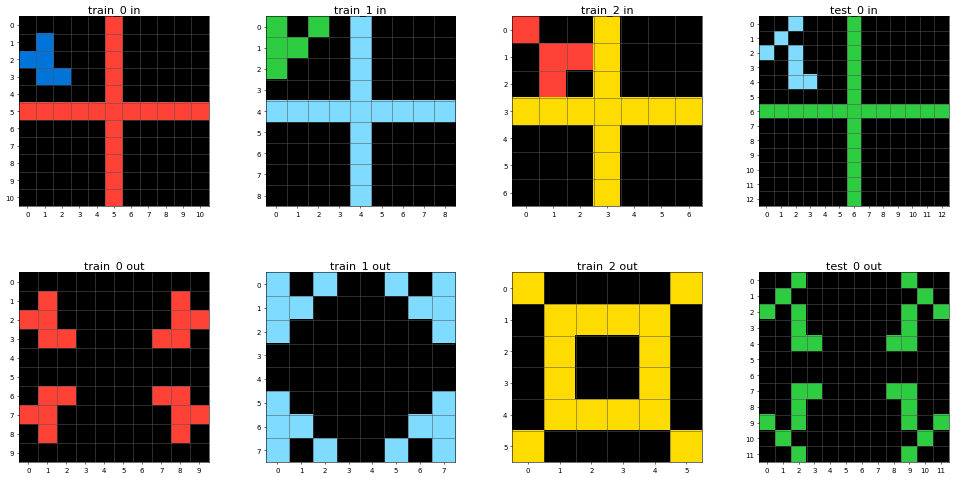

c59eb873


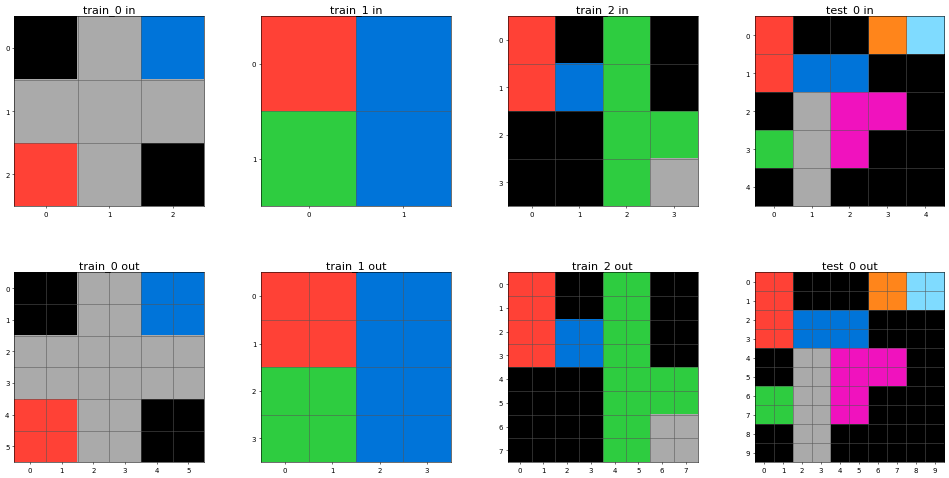

36fdfd69


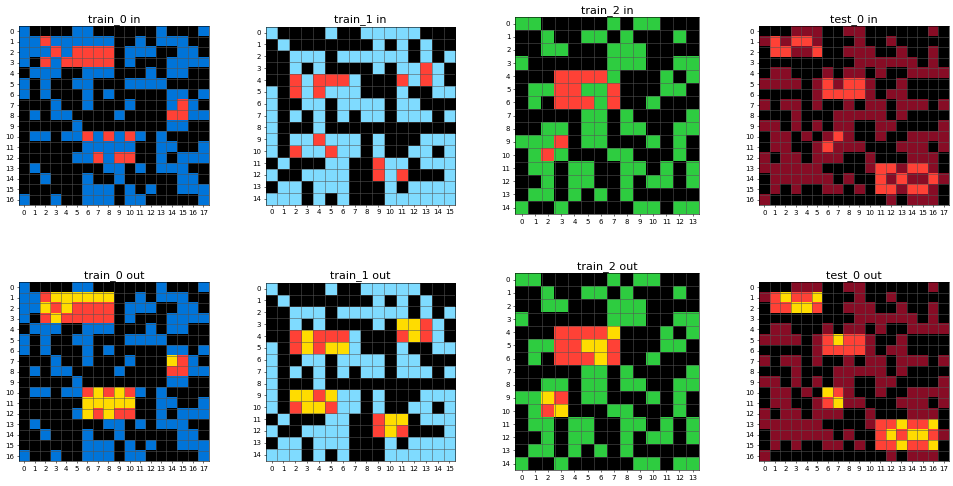

445eab21


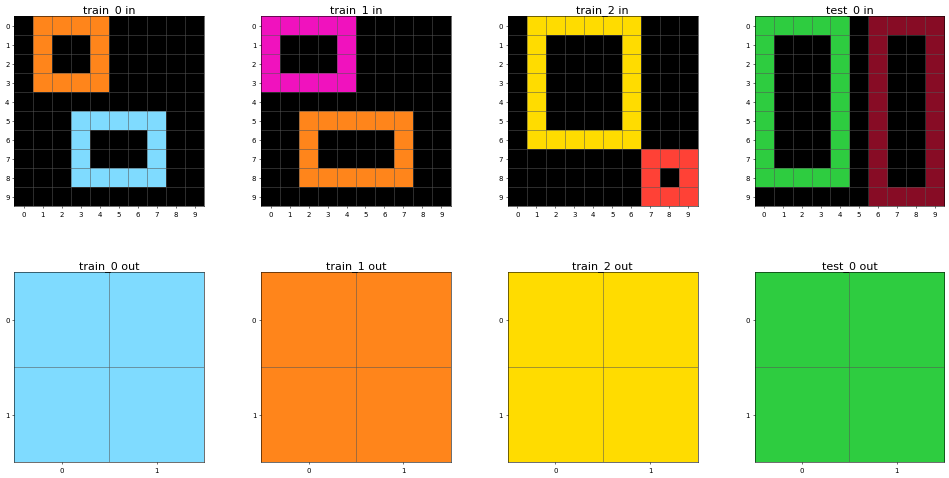

49d1d64f


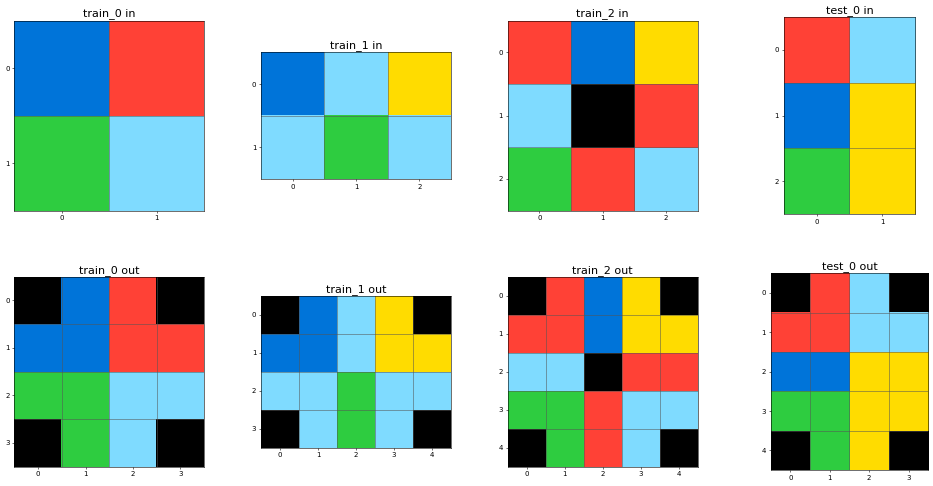

321b1fc6


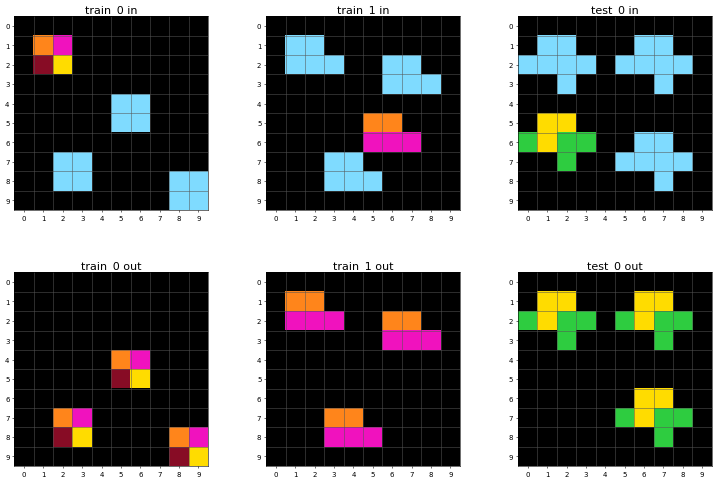

2bee17df


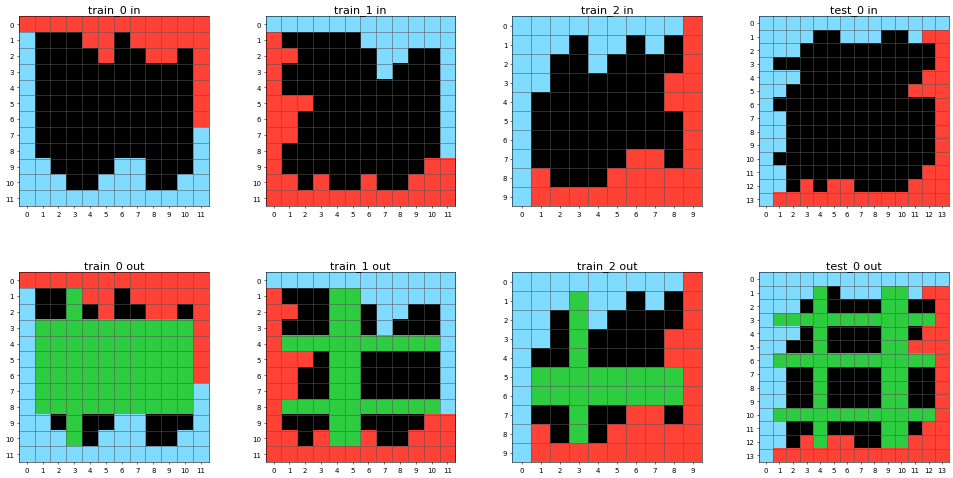

62c24649


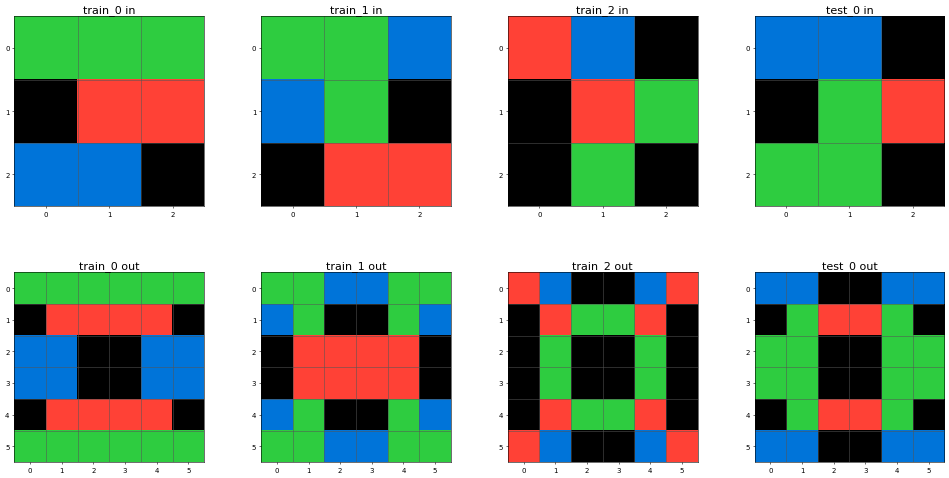

137eaa0f


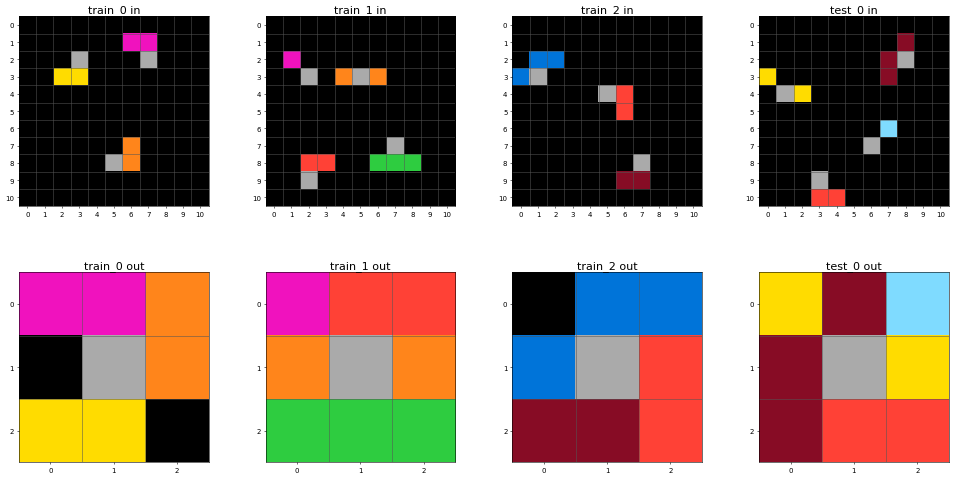

f8b3ba0a


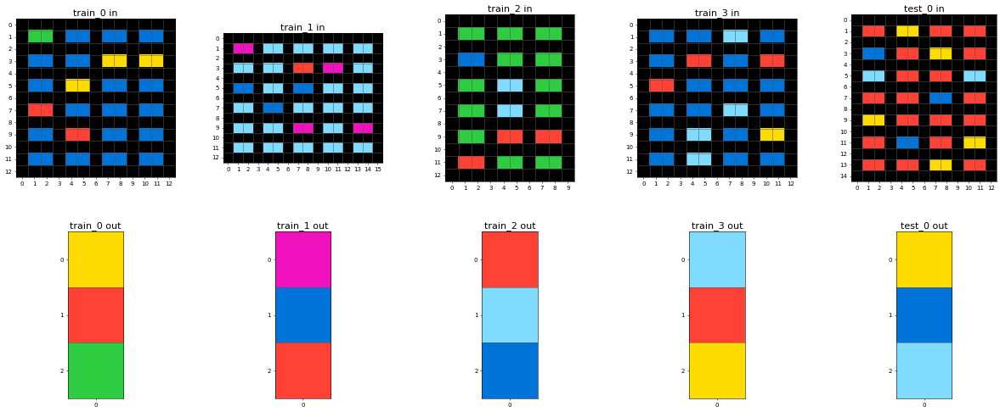

7c008303


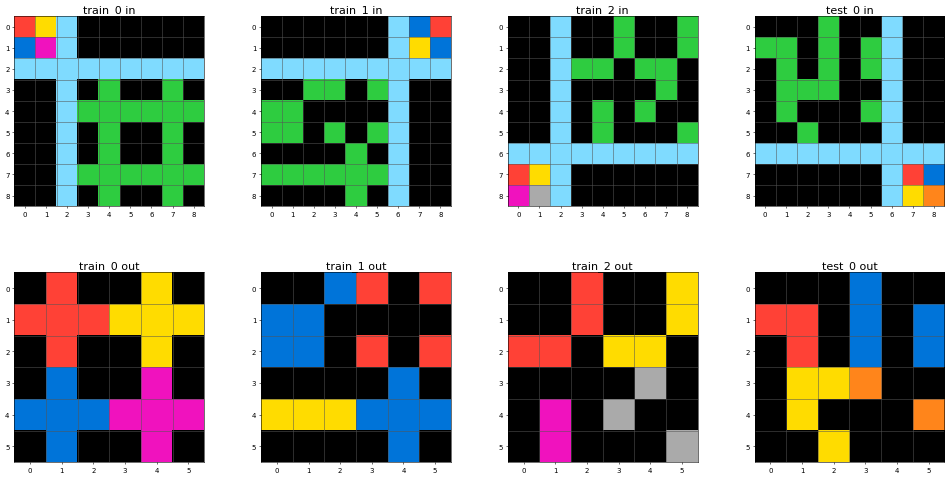

f5b8619d


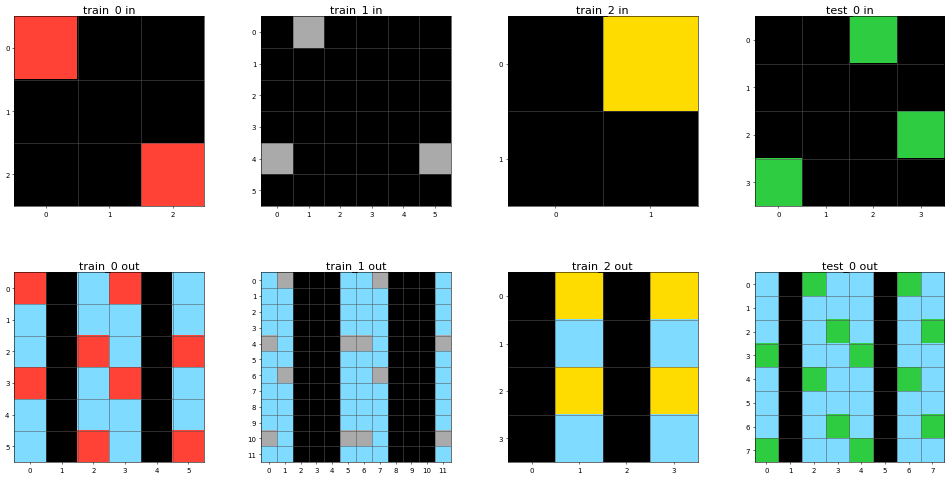

834ec97d


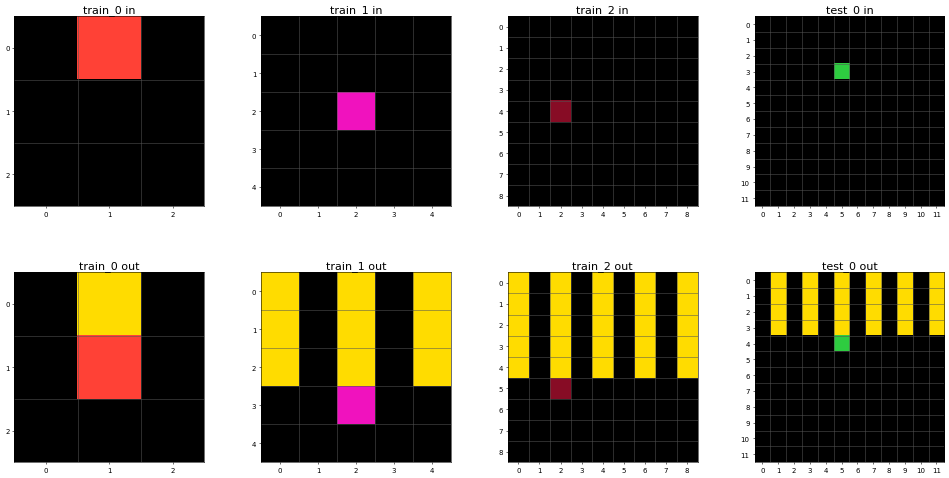

46f33fce


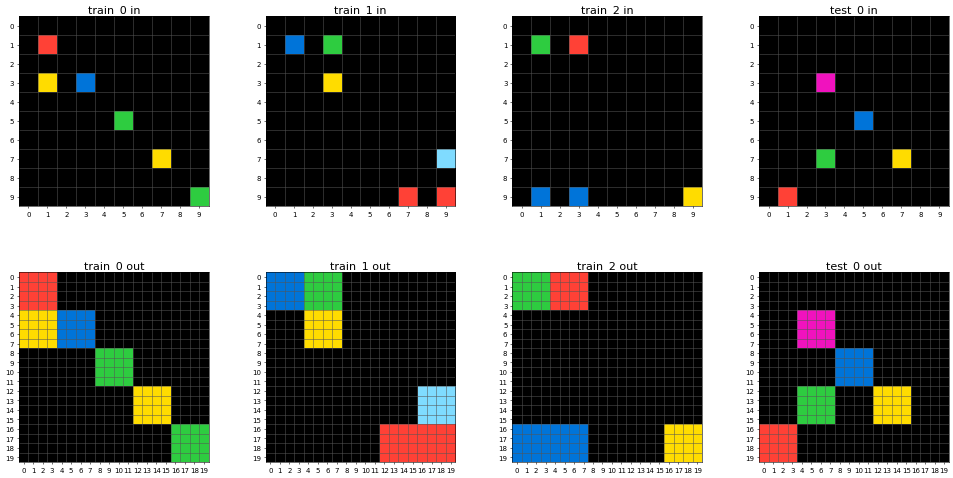

aba27056


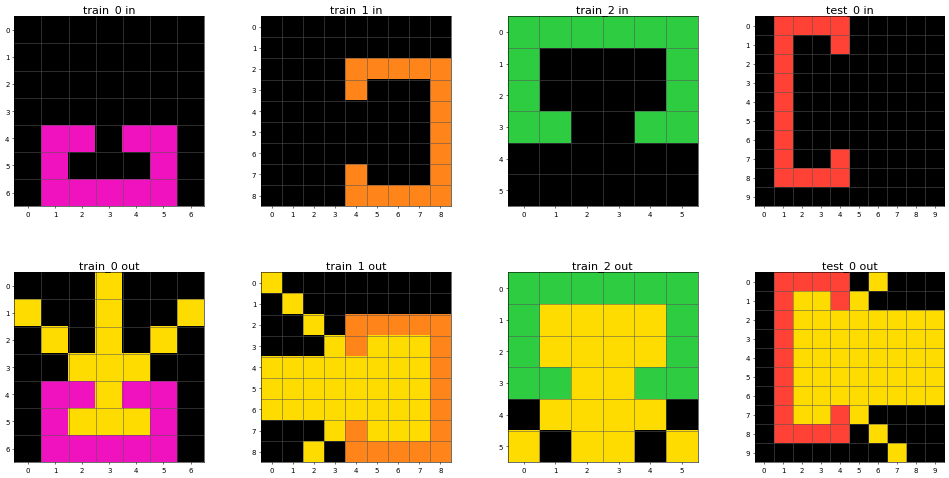

1c786137


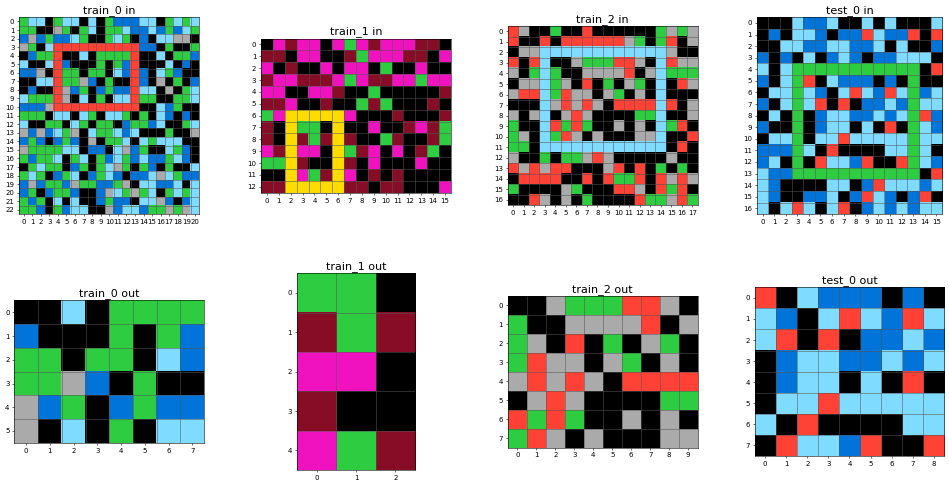

ef135b50


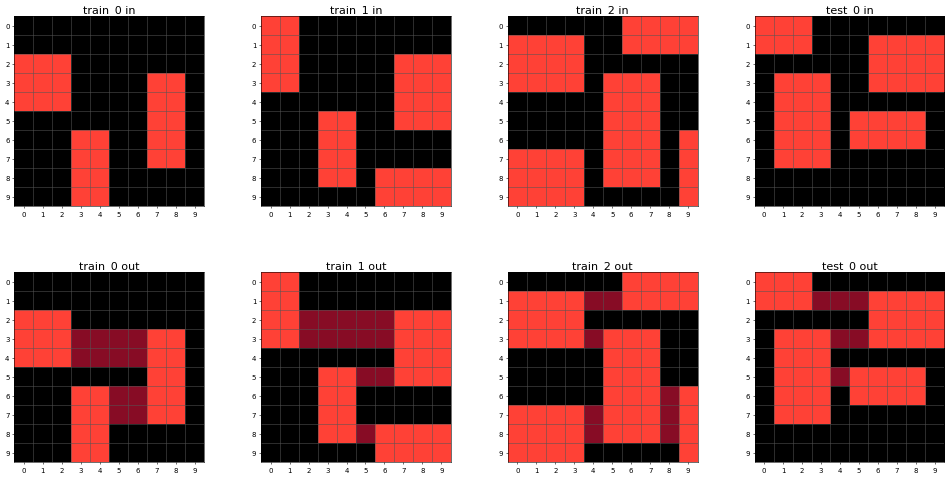

bc1d5164


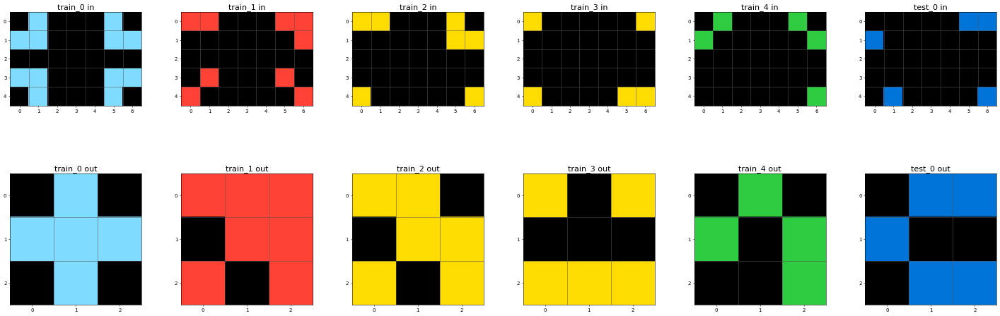

776ffc46


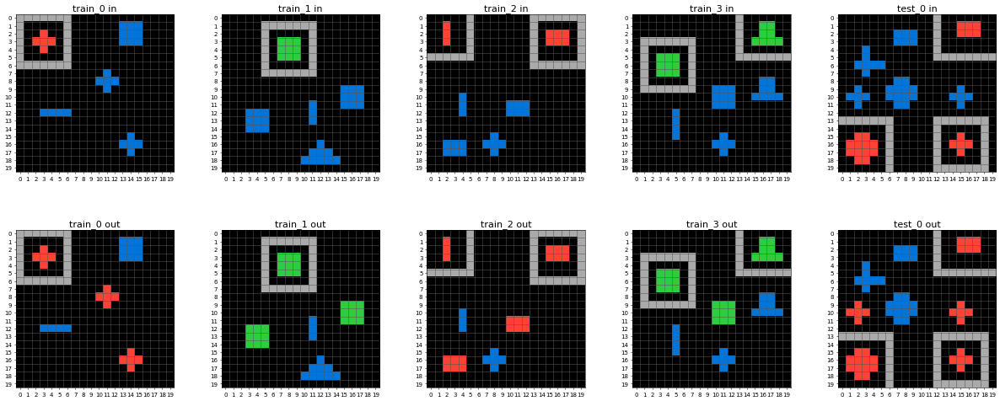

e179c5f4


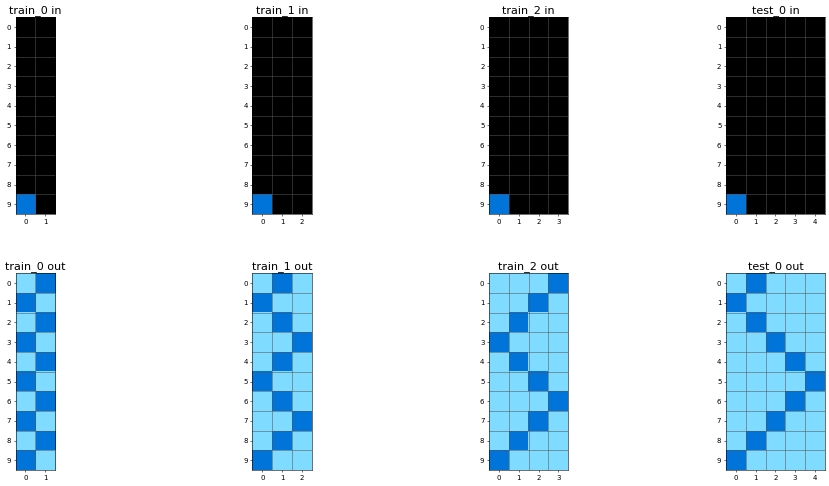

6b9890af


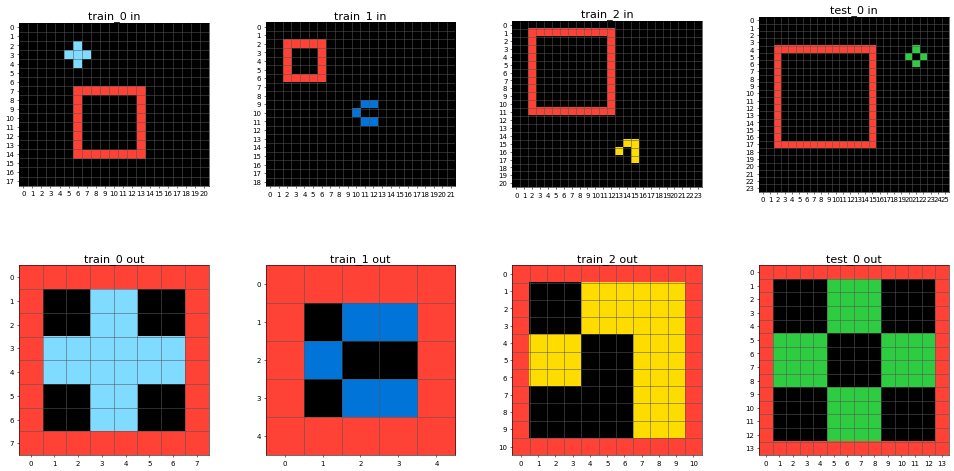

c444b776


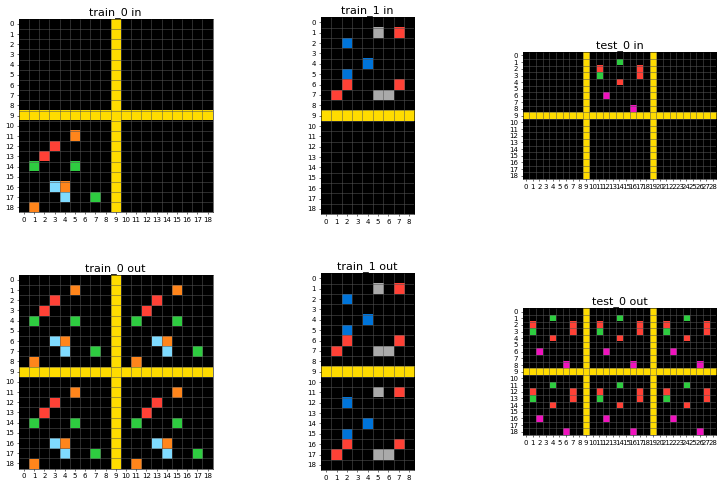

d07ae81c


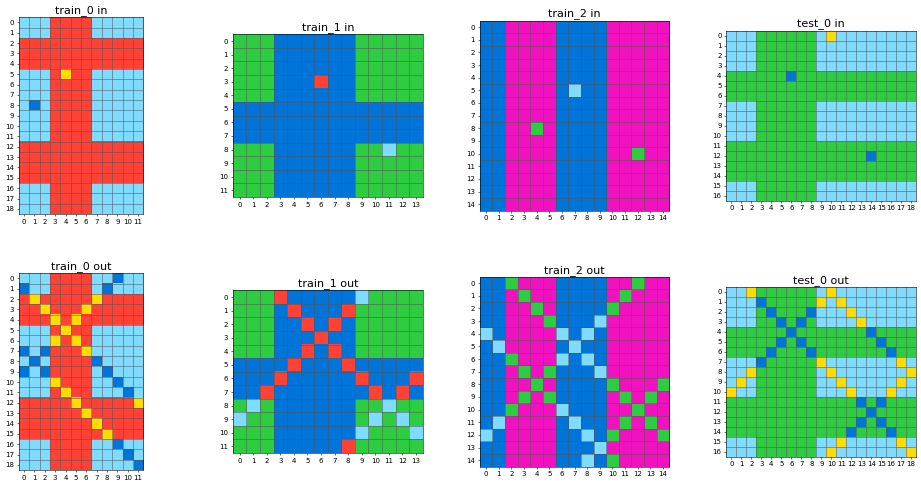

234bbc79


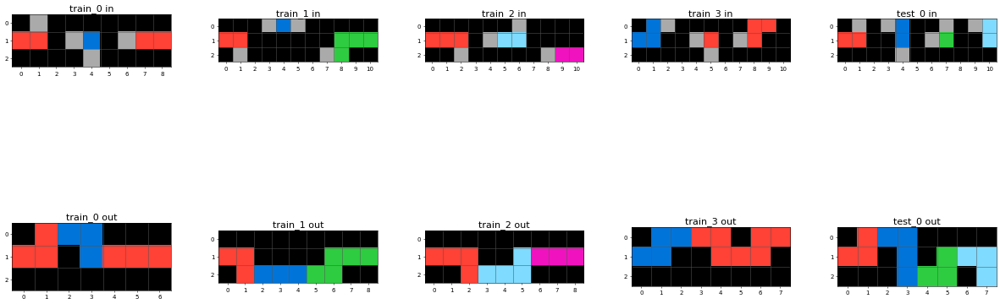

1e32b0e9


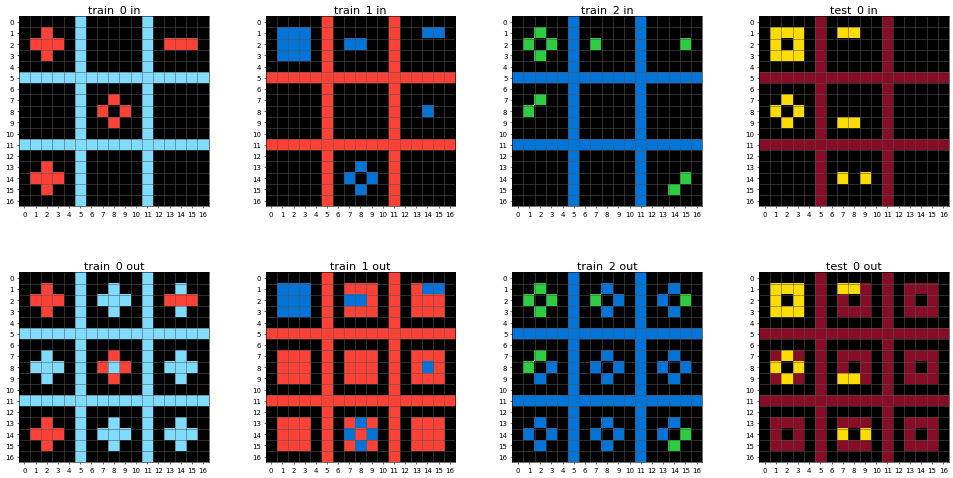

98cf29f8


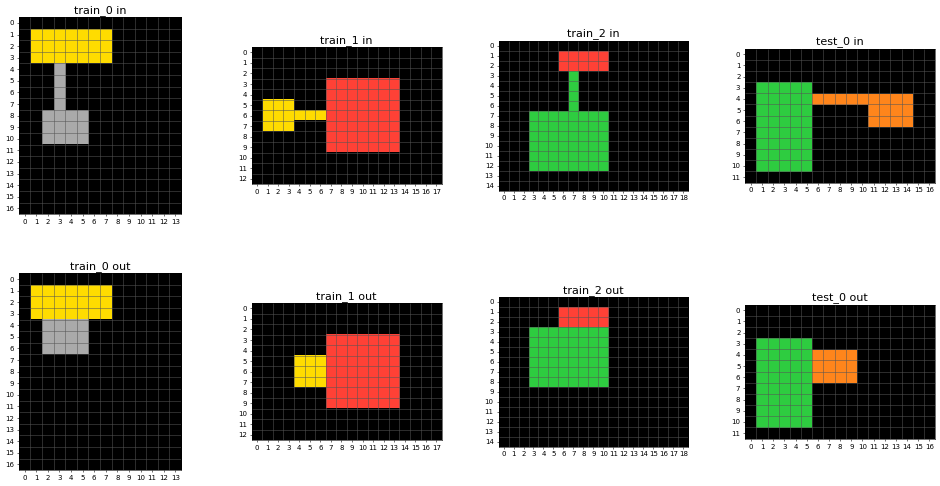

41e4d17e


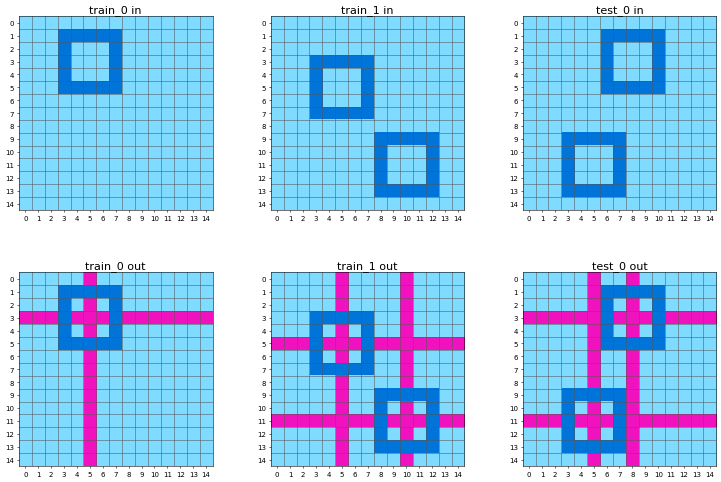

1b60fb0c


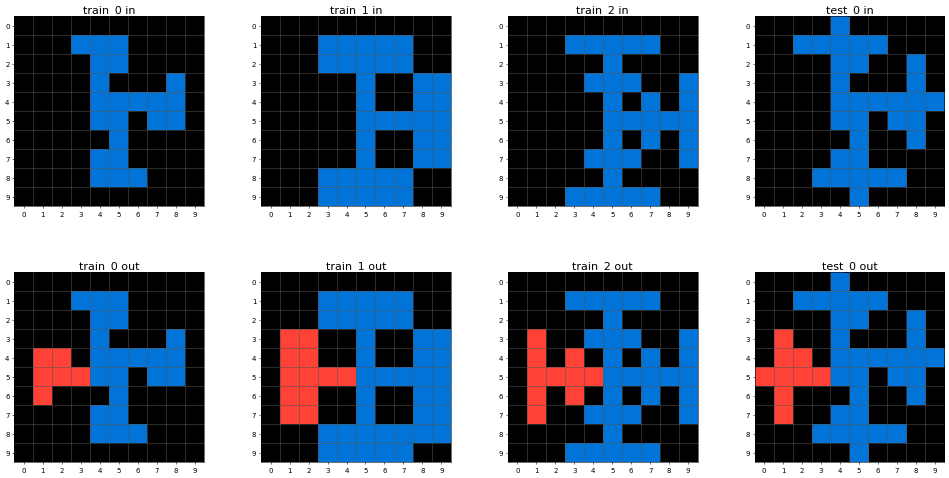

9f236235


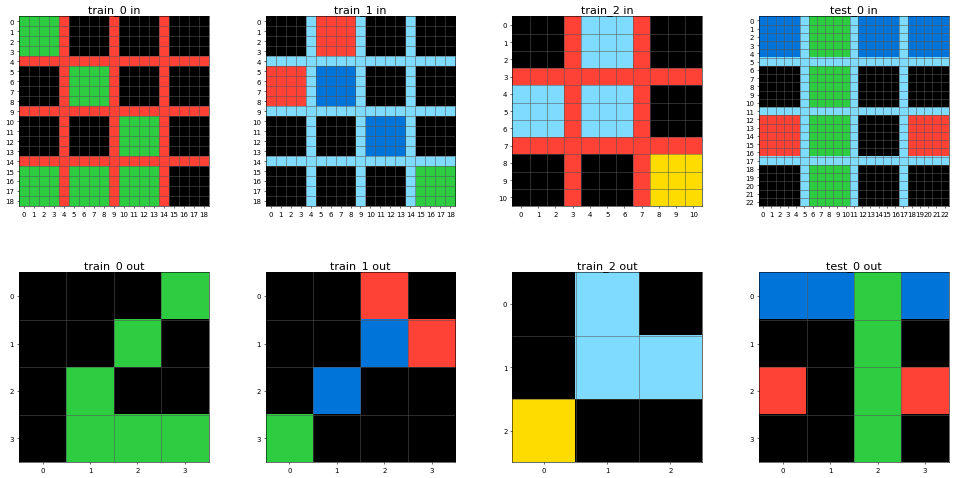

a699fb00


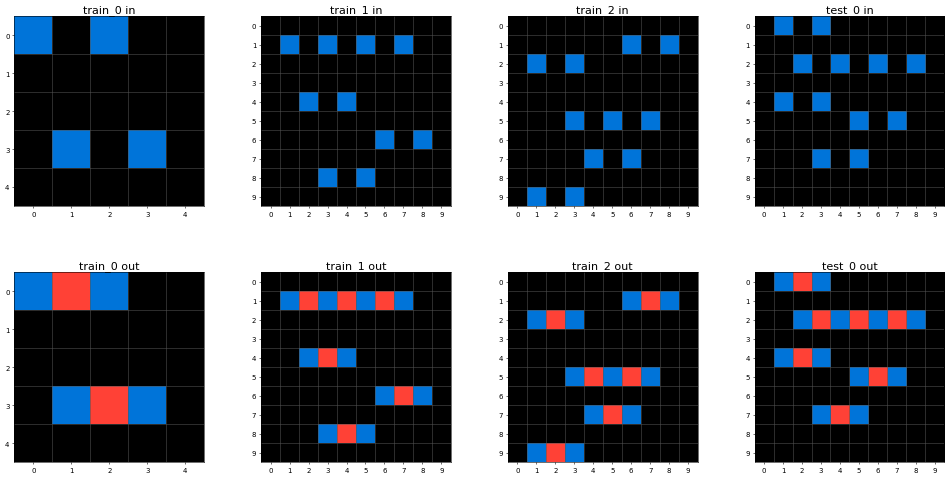

017c7c7b


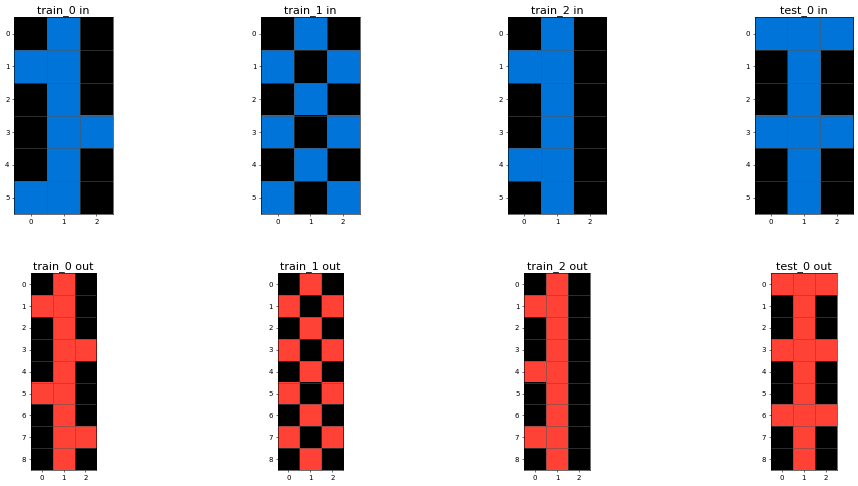

f76d97a5


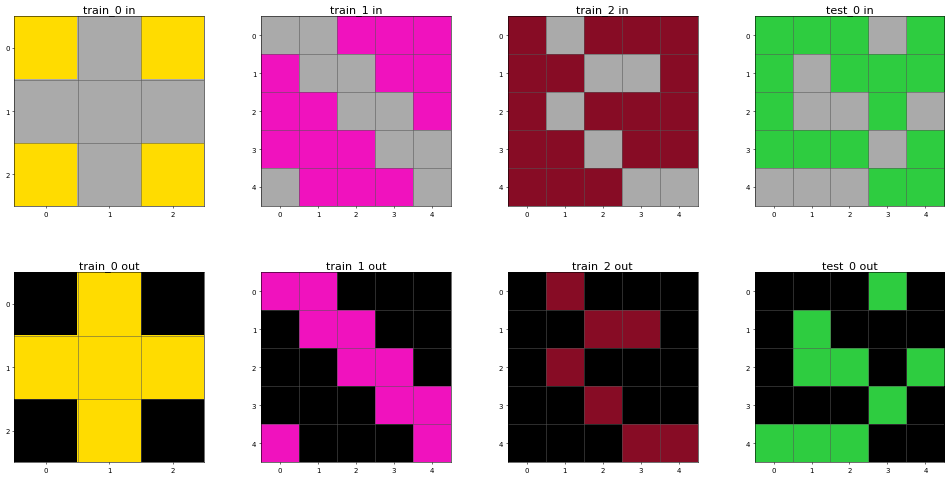

fcb5c309


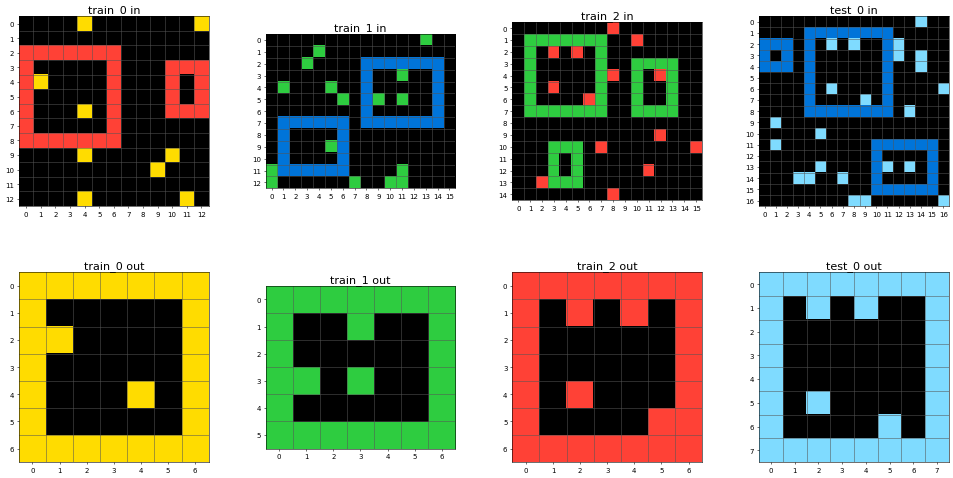

3428a4f5


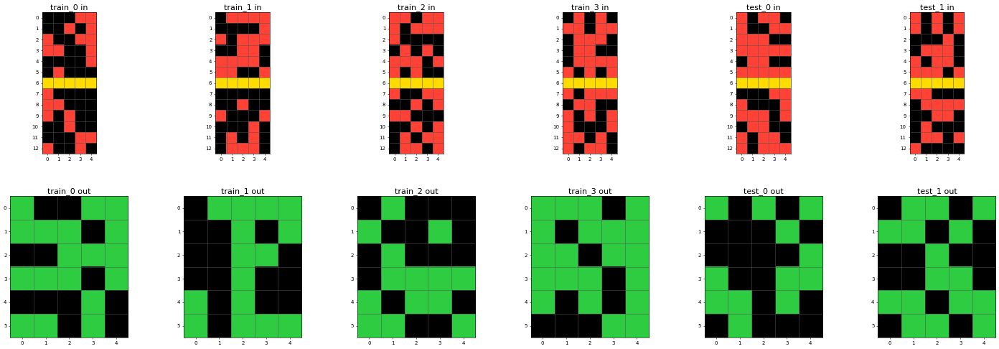

72322fa7


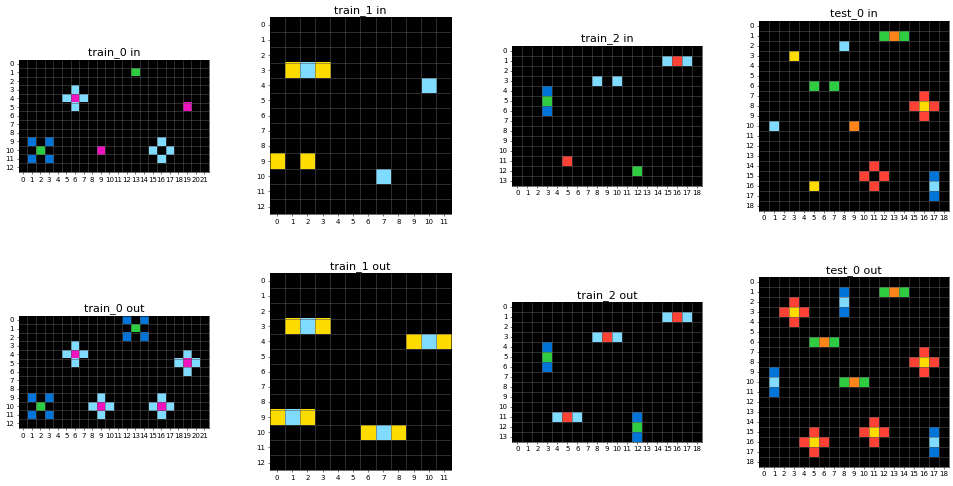

963e52fc


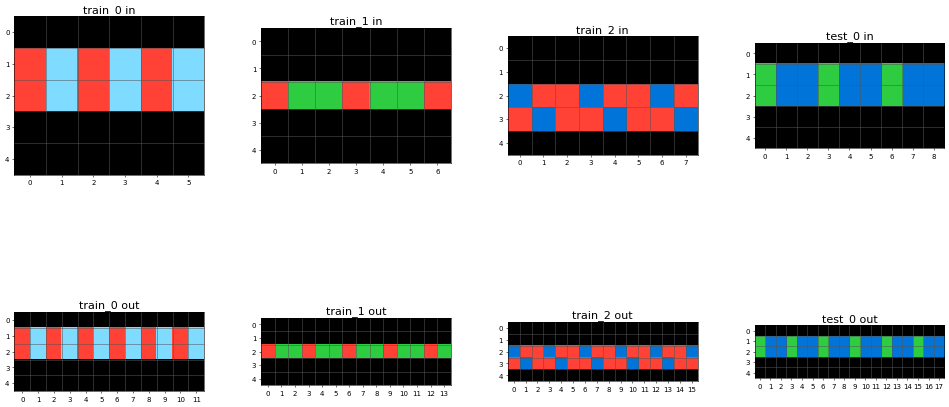

c9e6f938


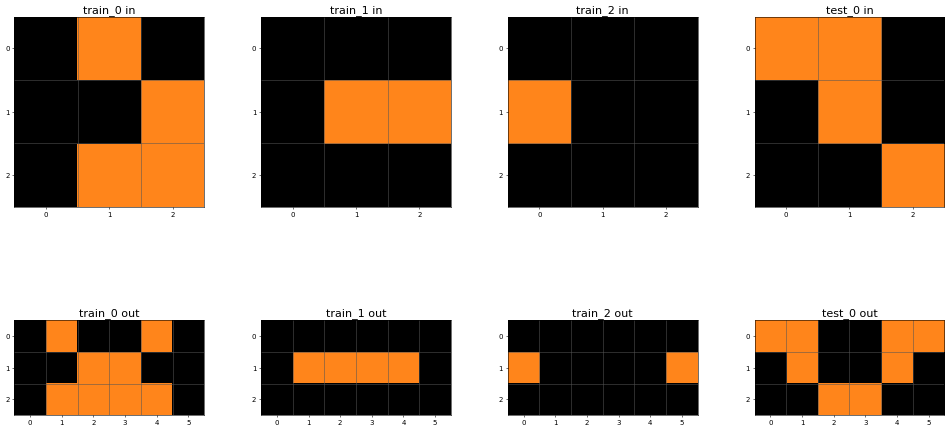

bda2d7a6


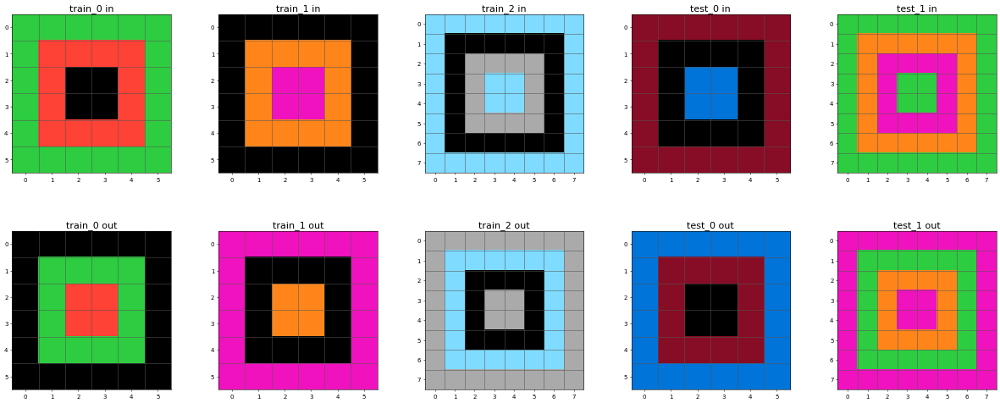

44d8ac46


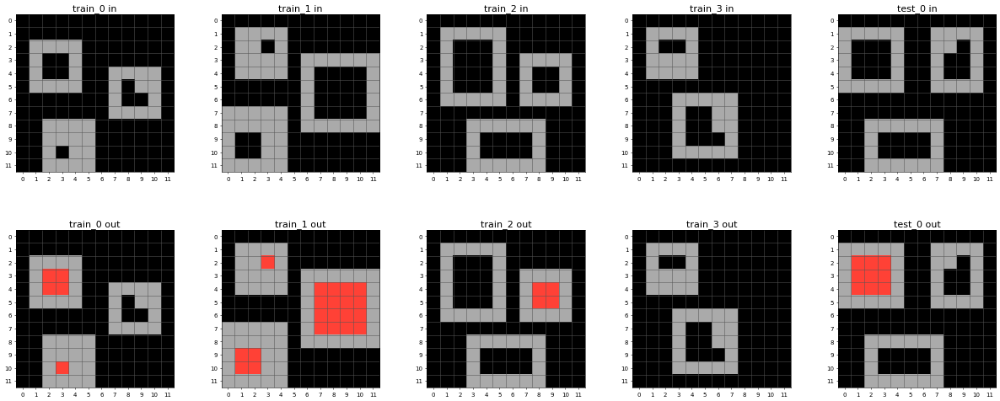

6d75e8bb


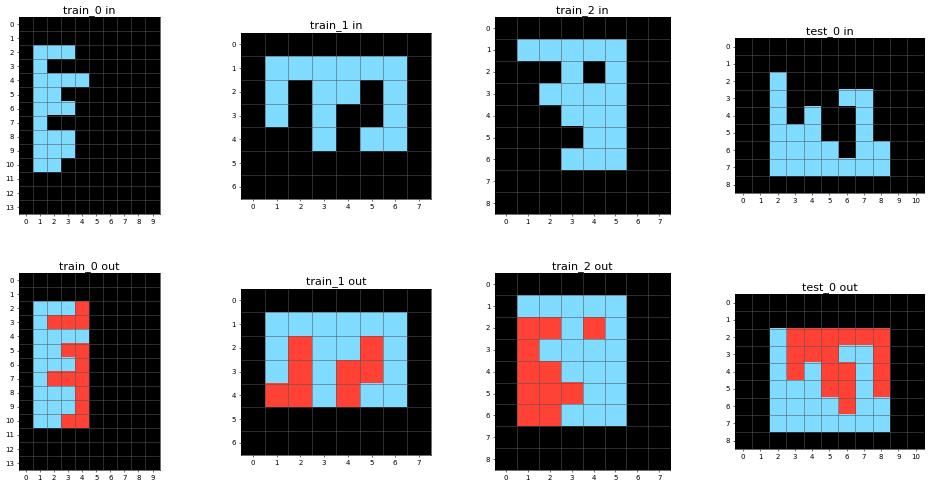

50cb2852


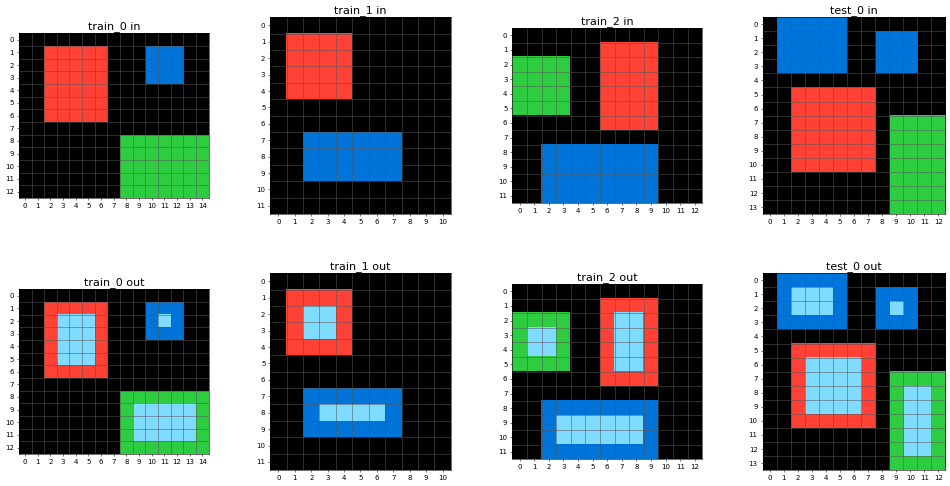

fcc82909


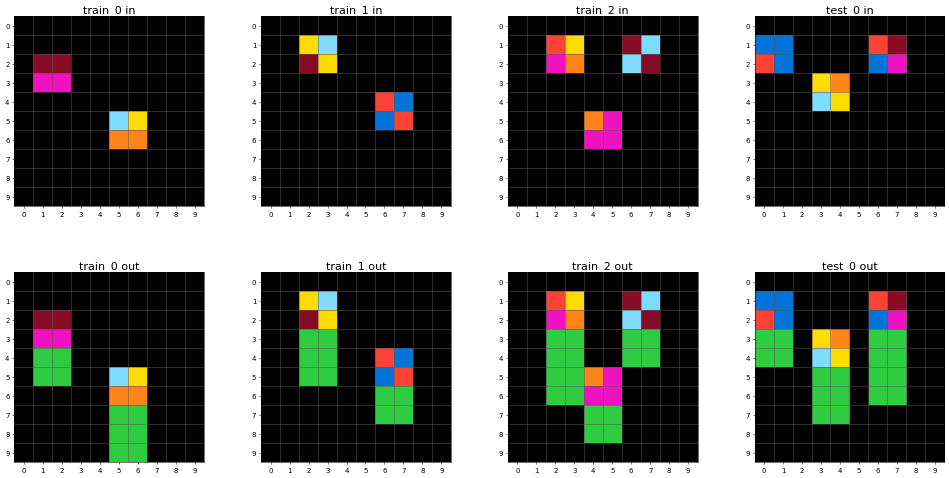

f25ffba3


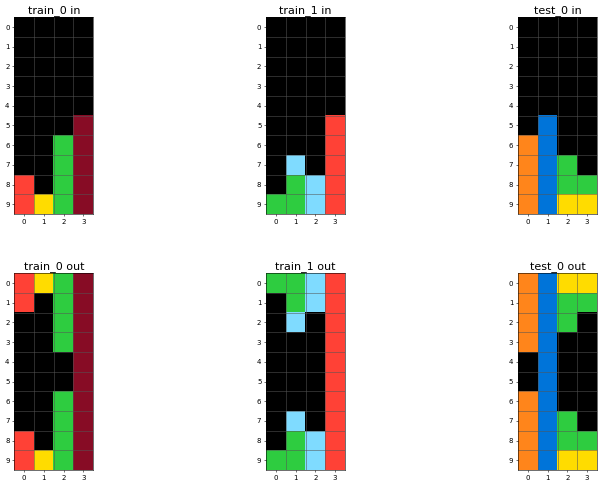

d23f8c26


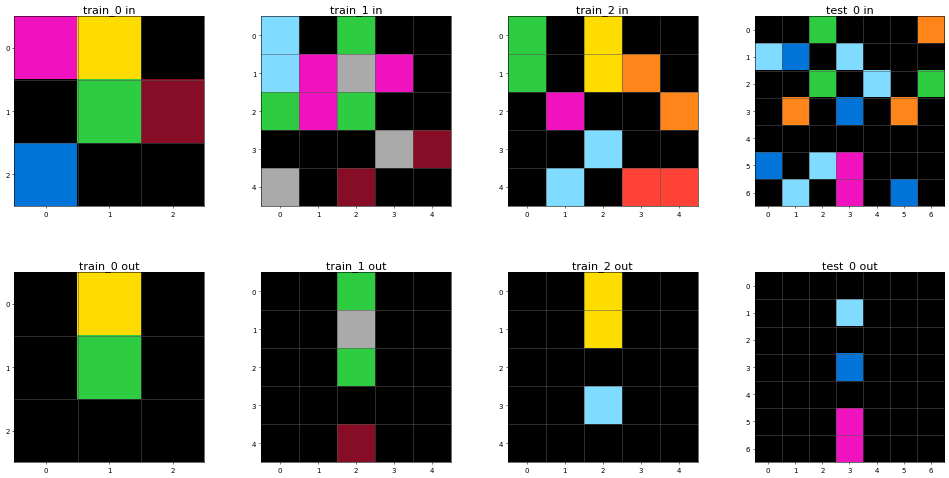

4290ef0e


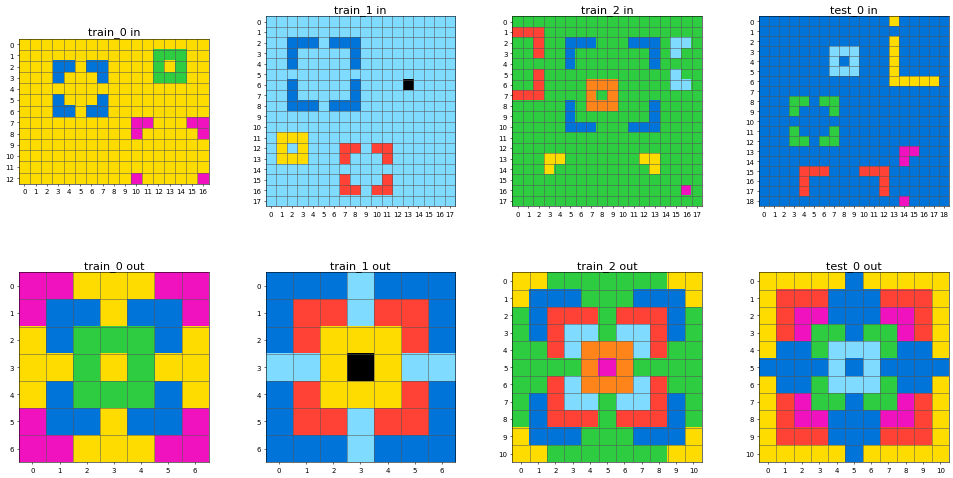

662c240a


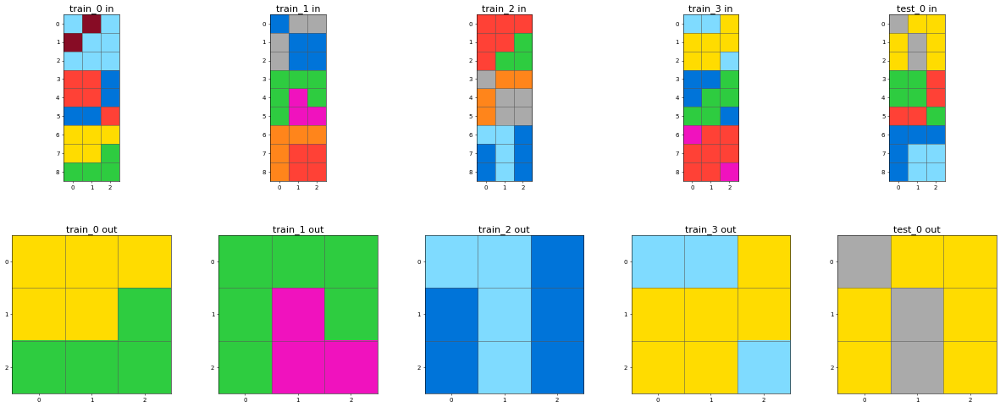

7e0986d6


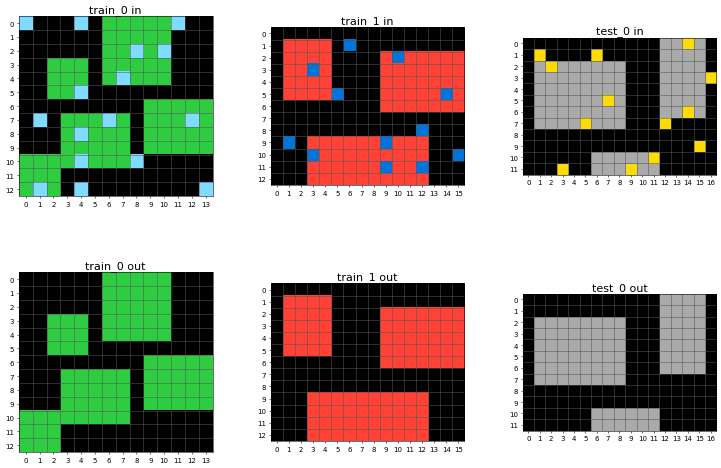

06df4c85


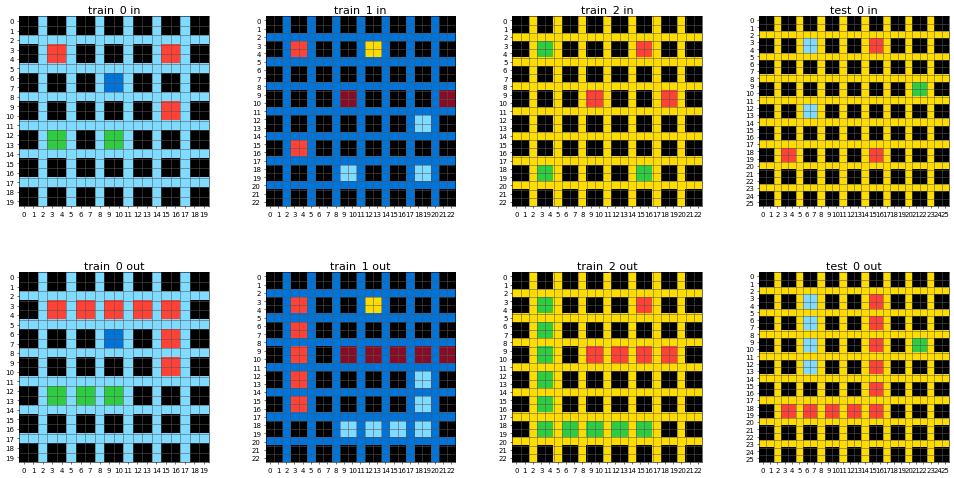

0520fde7


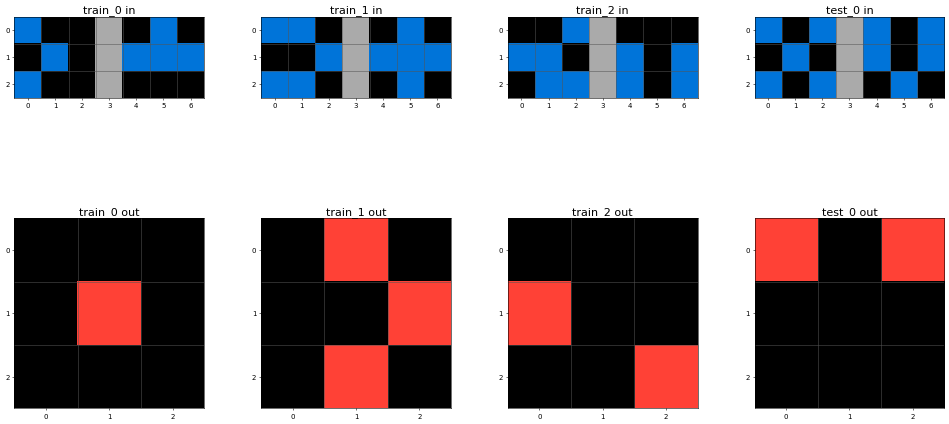

3befdf3e


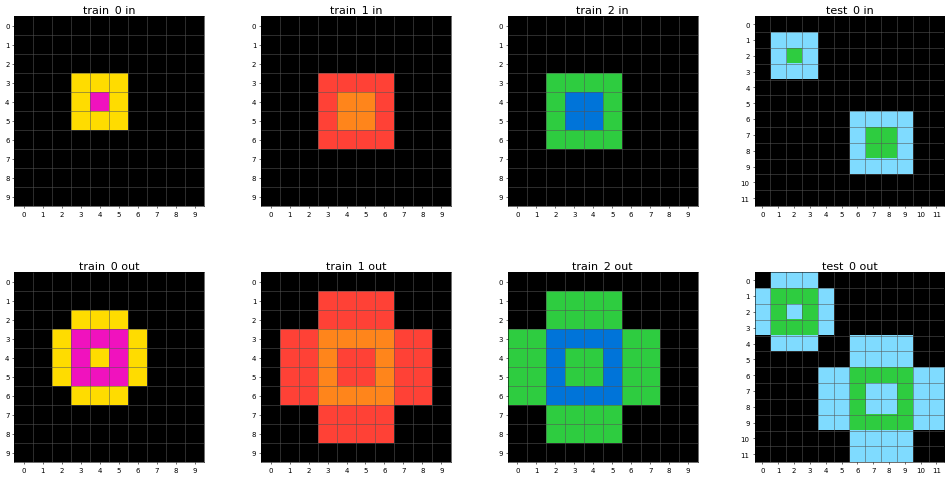

d8c310e9


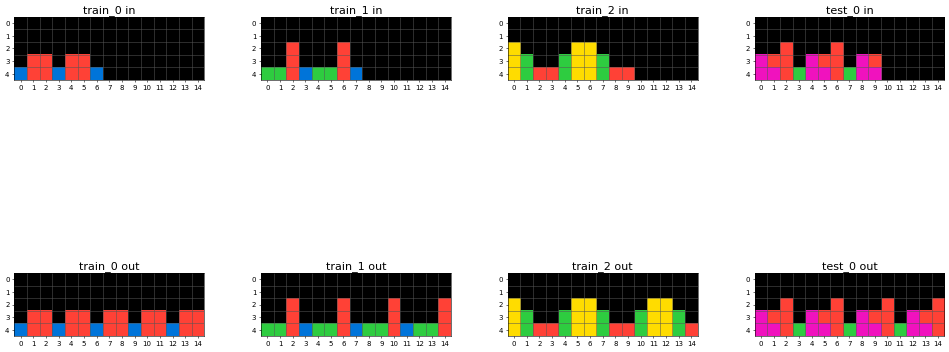

6855a6e4


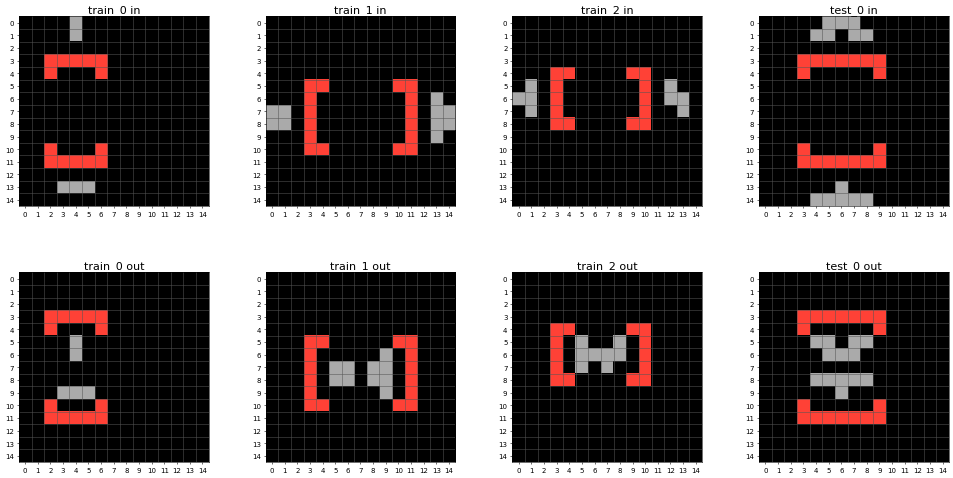

c8f0f002


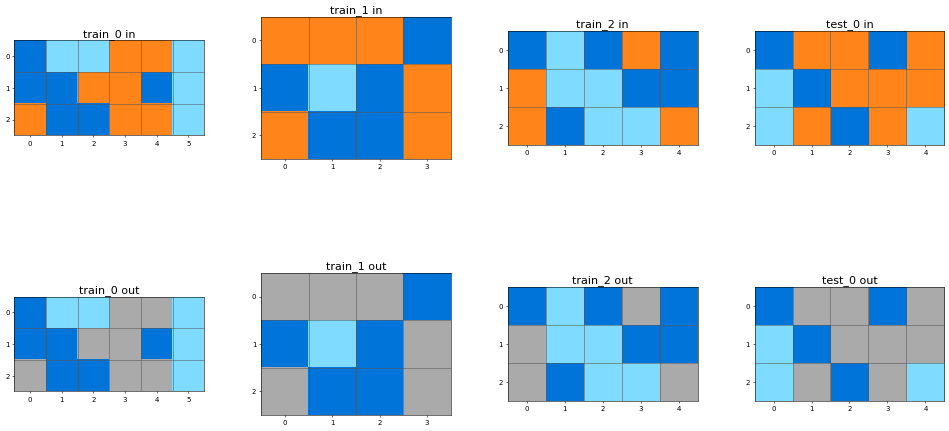

2bcee788


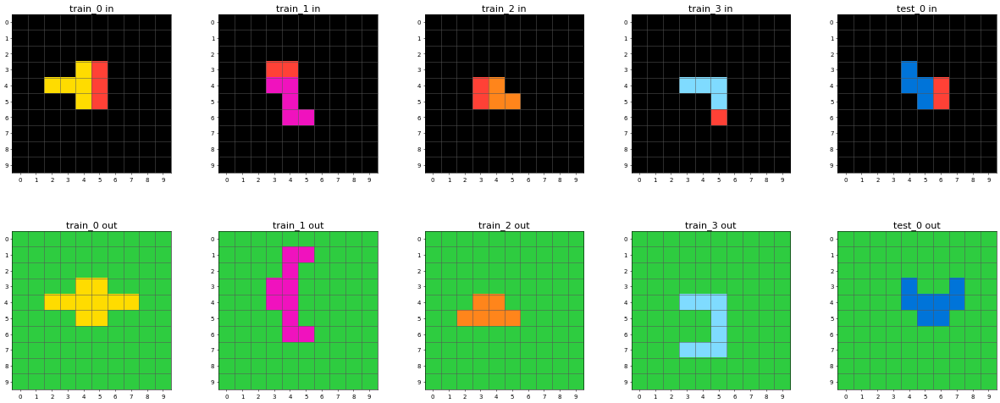

b1948b0a


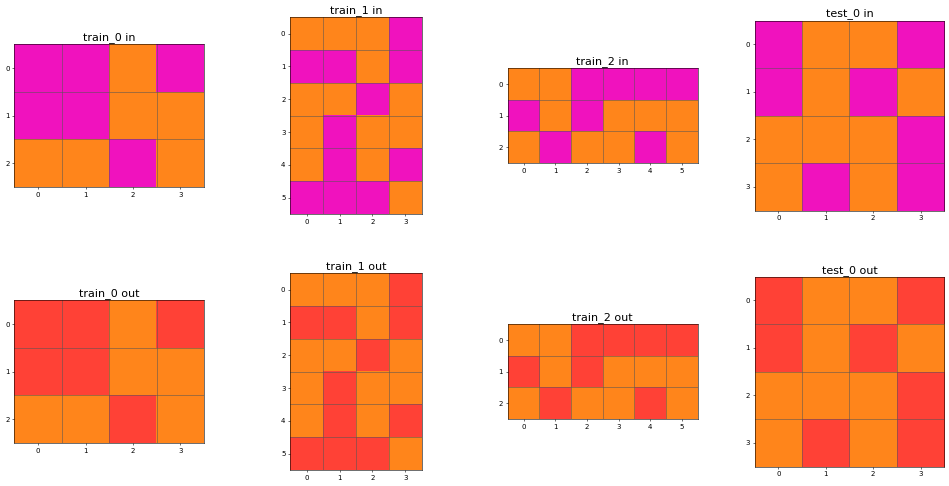

5521c0d9


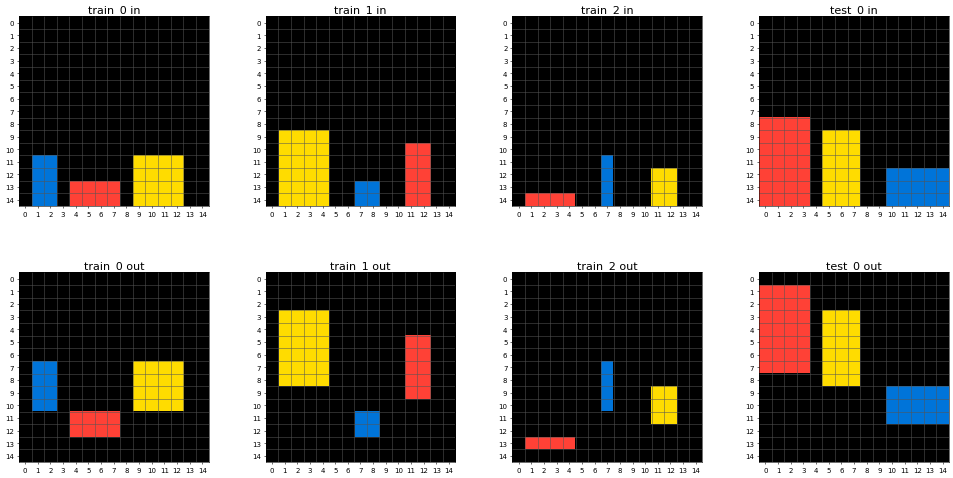

d0f5fe59


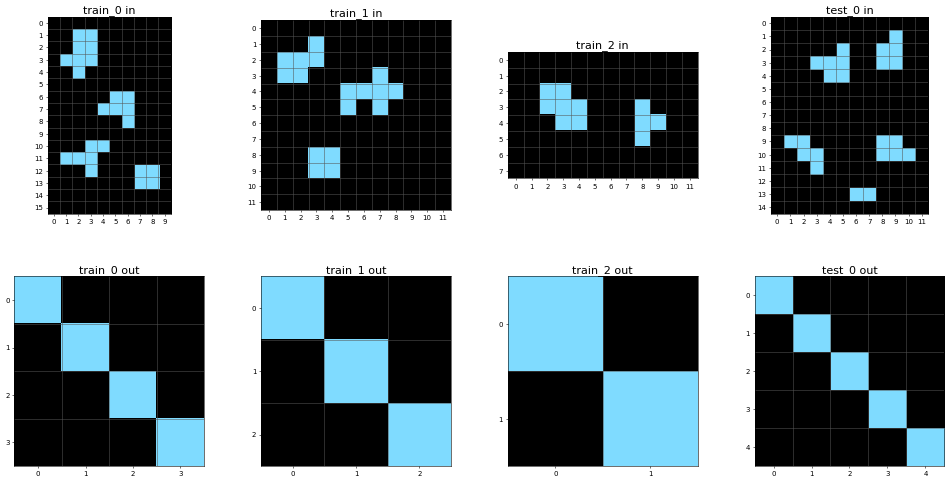

3bd67248


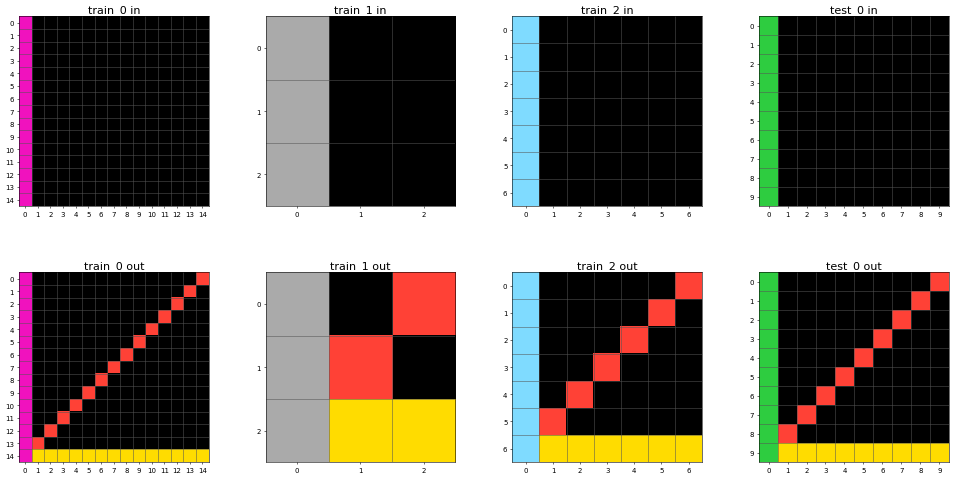

928ad970


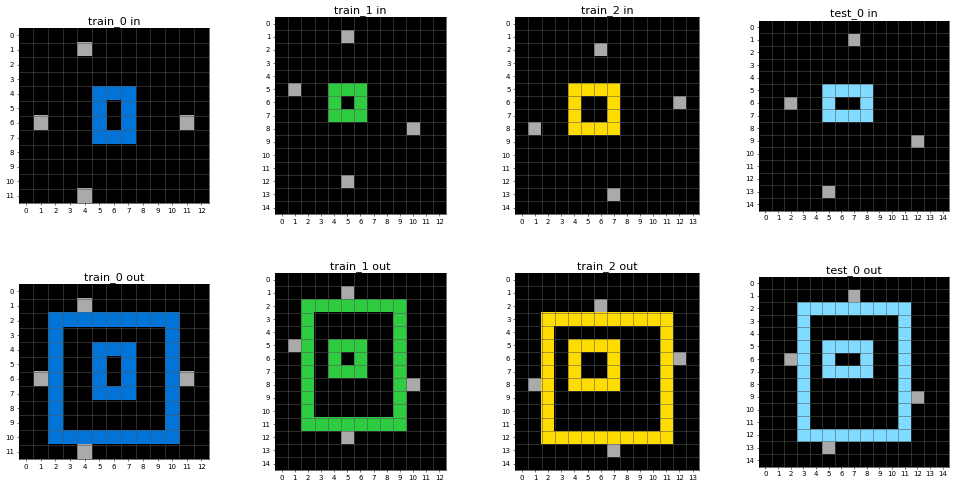

97999447


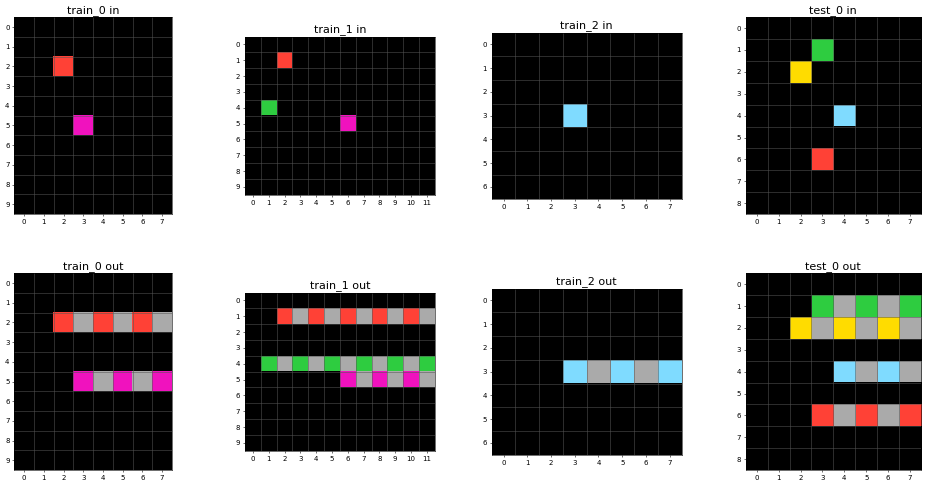

ce602527


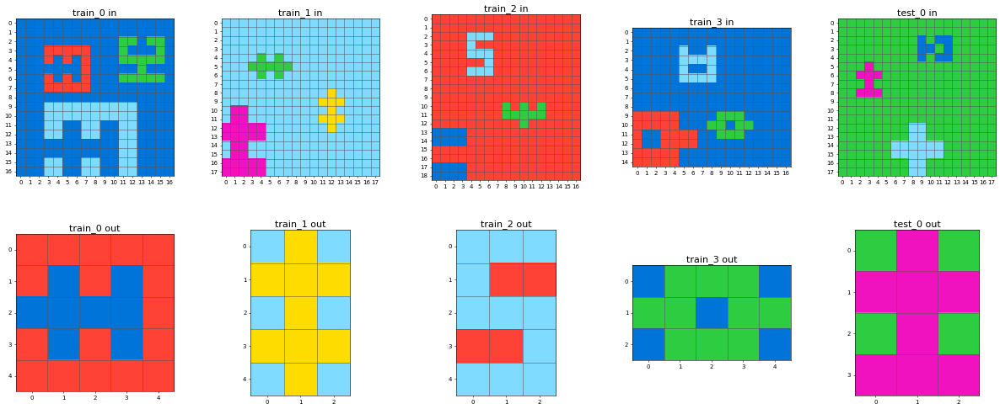

7b7f7511


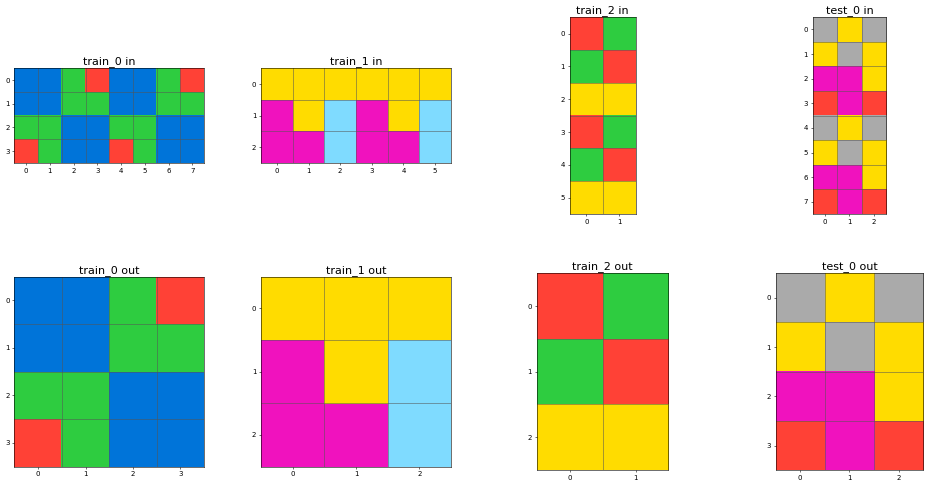

ff28f65a


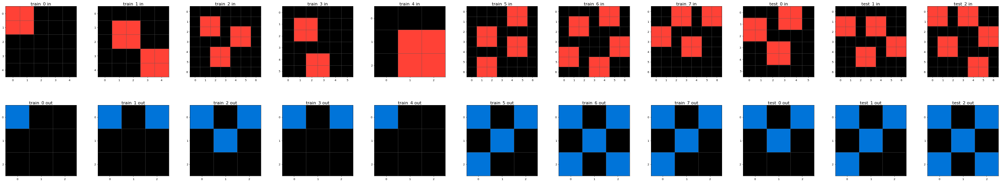

ea786f4a


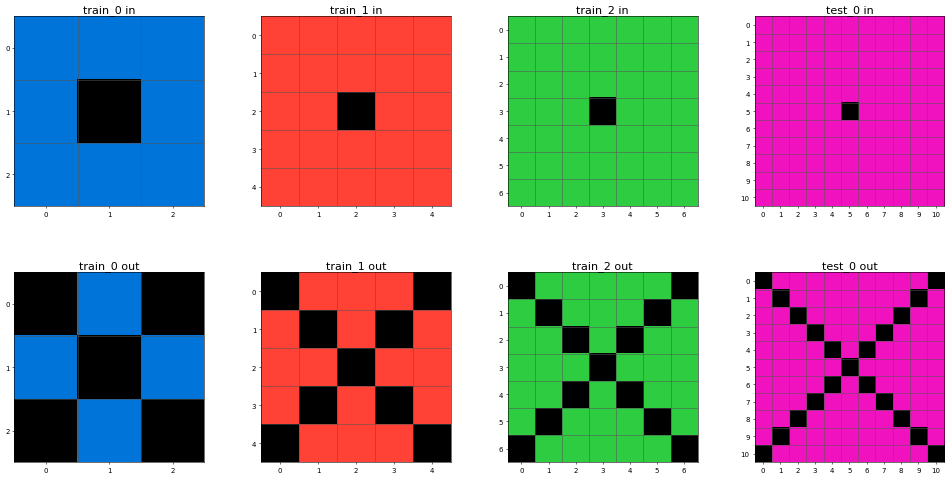

3c9b0459


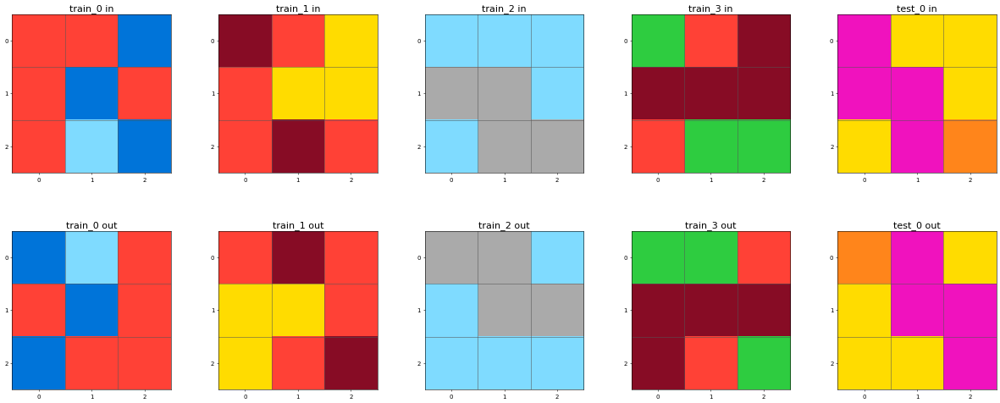

6c434453


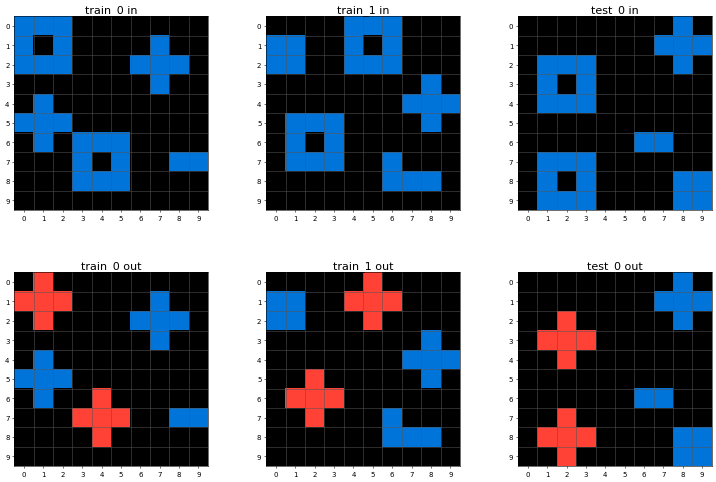

05f2a901


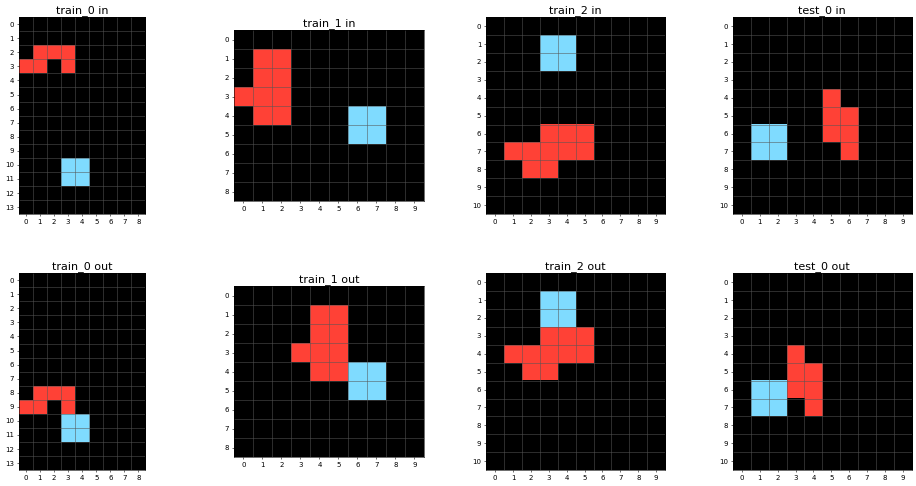

ea32f347


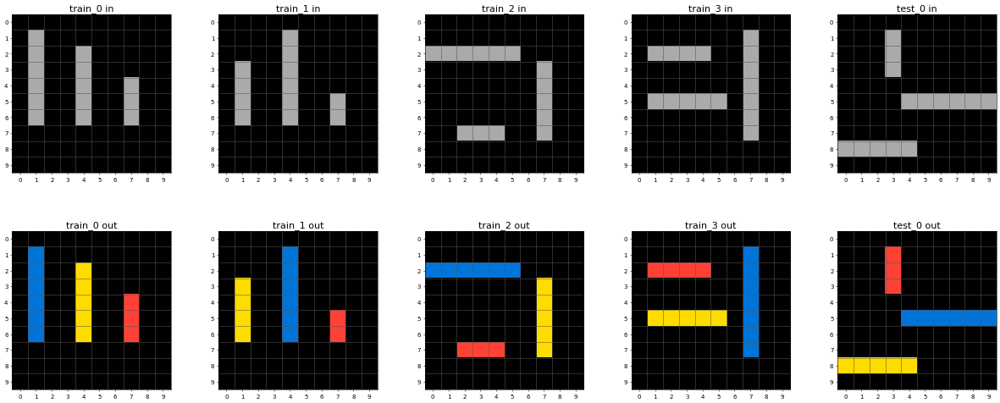

88a62173


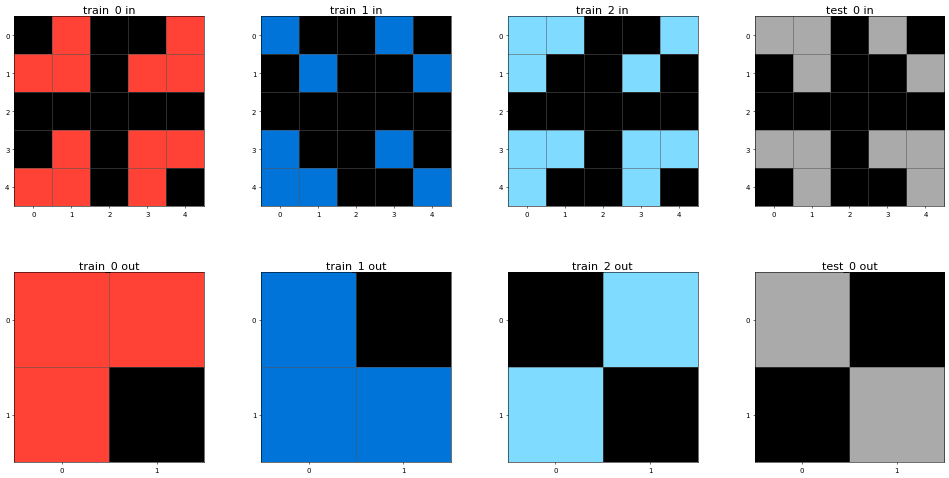

f15e1fac


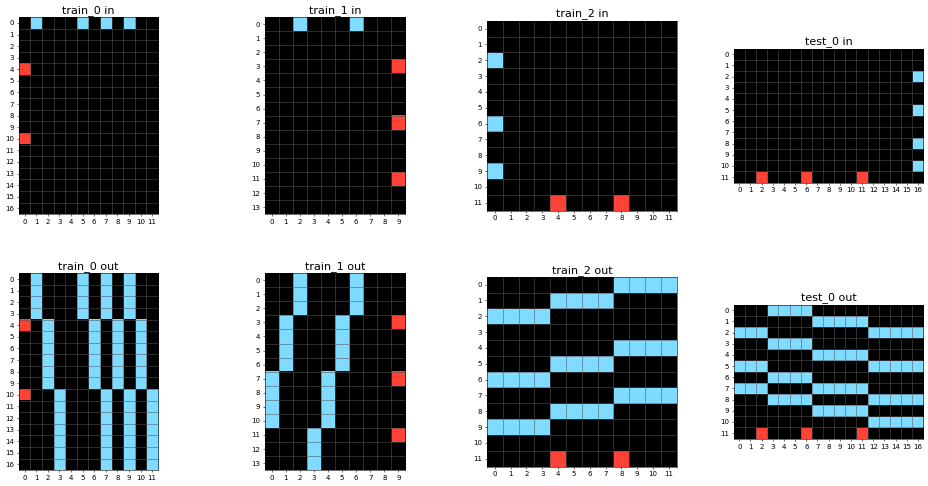

b8cdaf2b


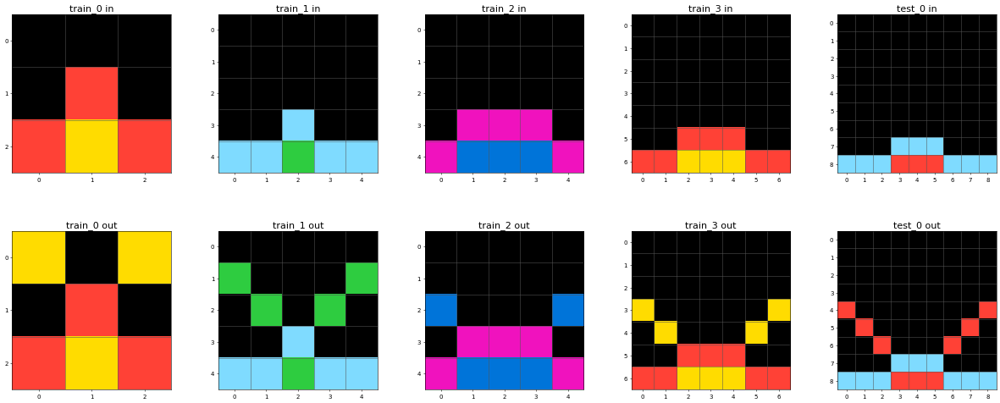

a740d043


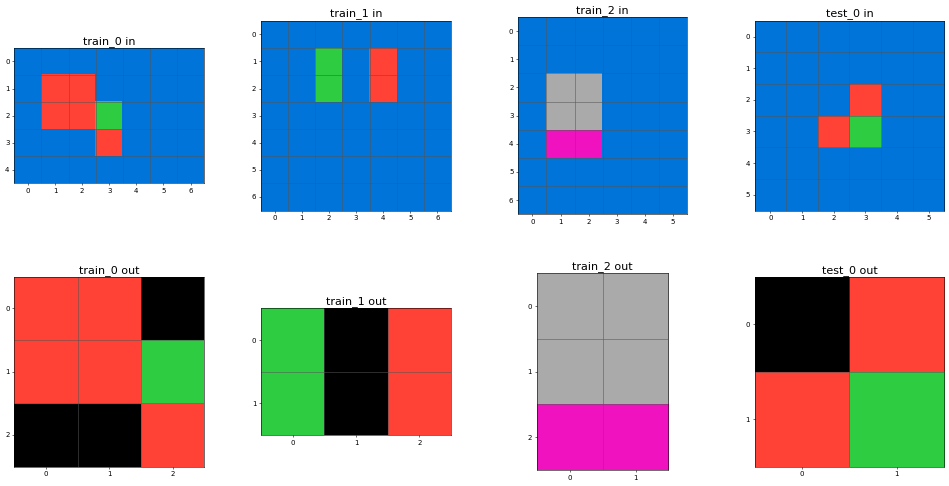

ba26e723


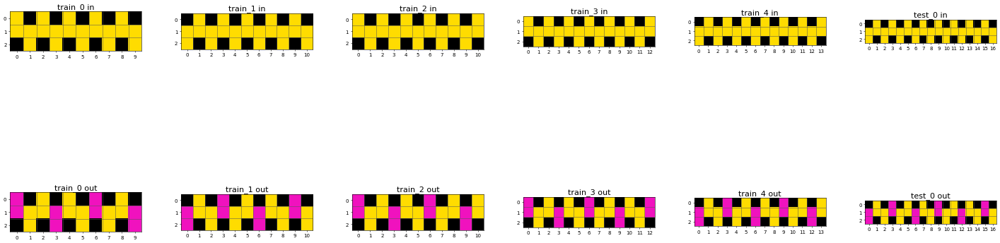

3af2c5a8


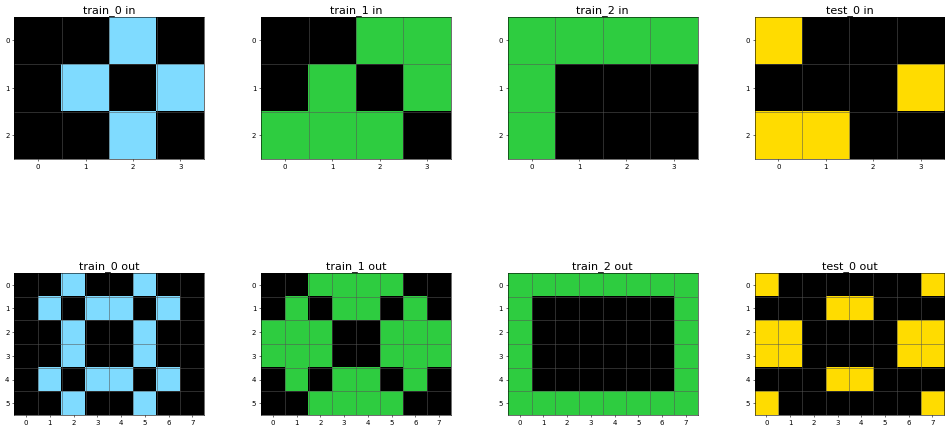

d631b094


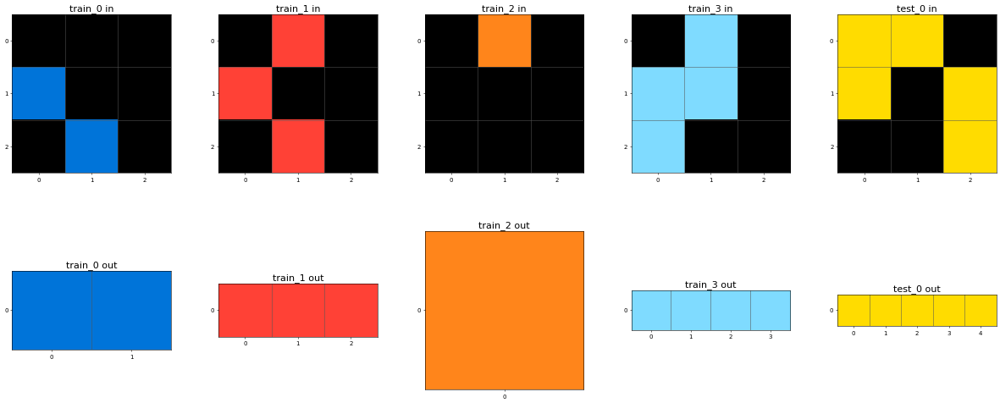

a48eeaf7


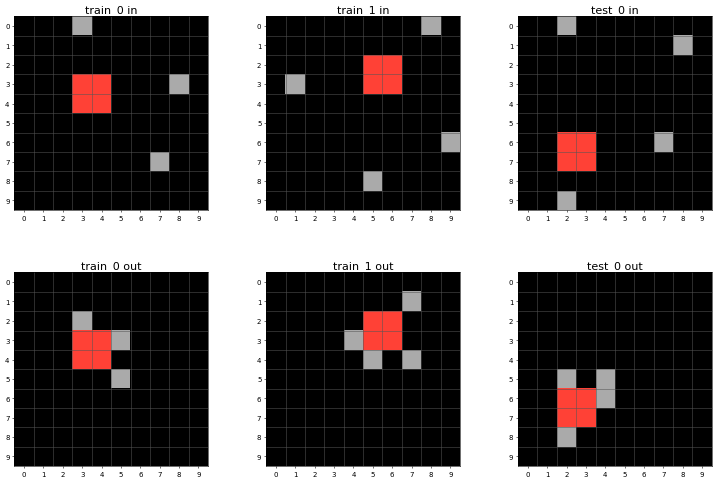

f8ff0b80


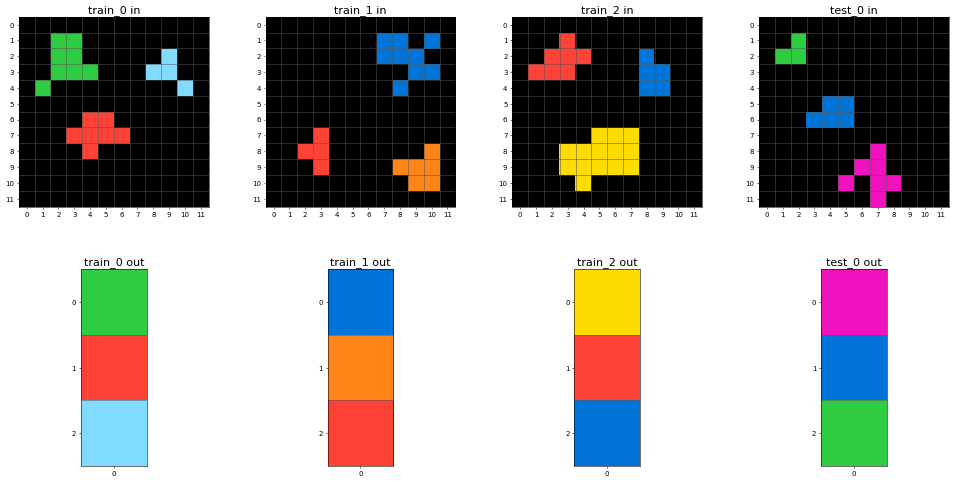

91714a58


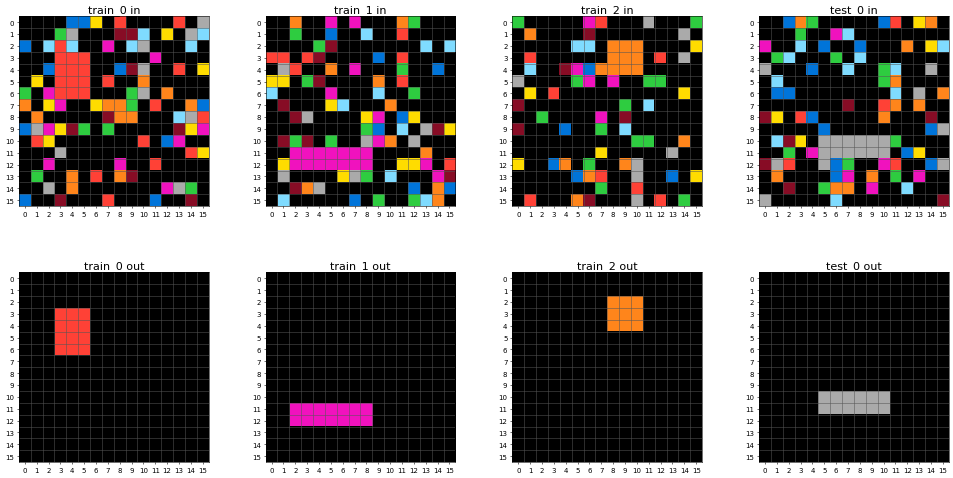

eb281b96


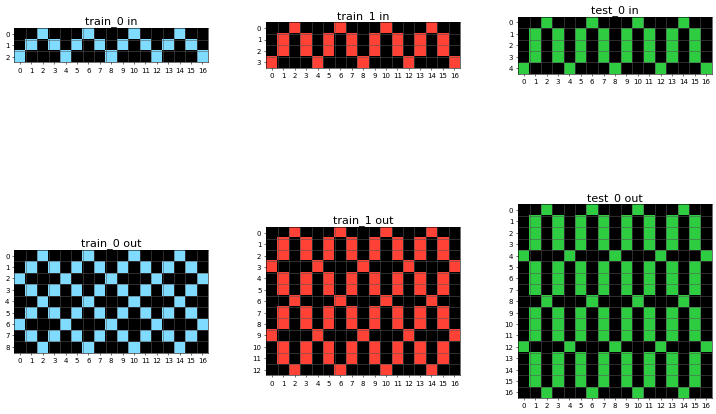

1a07d186


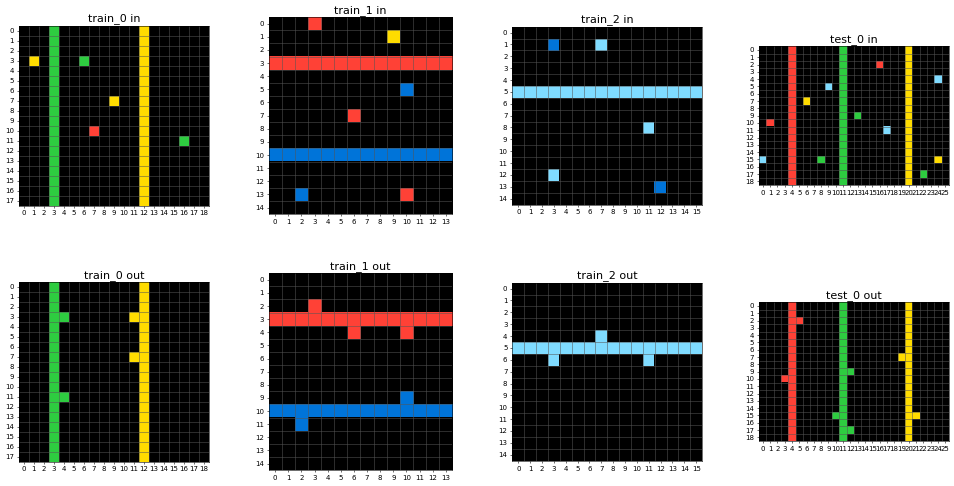

d10ecb37


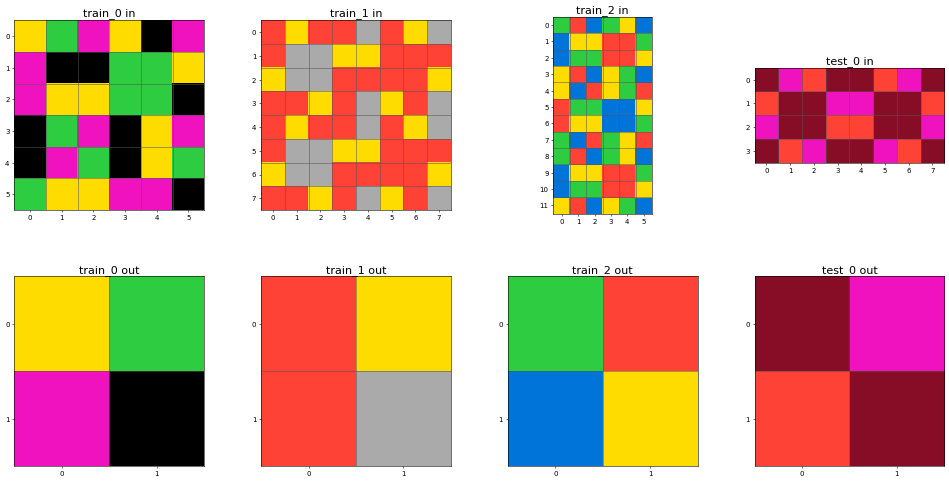

4612dd53


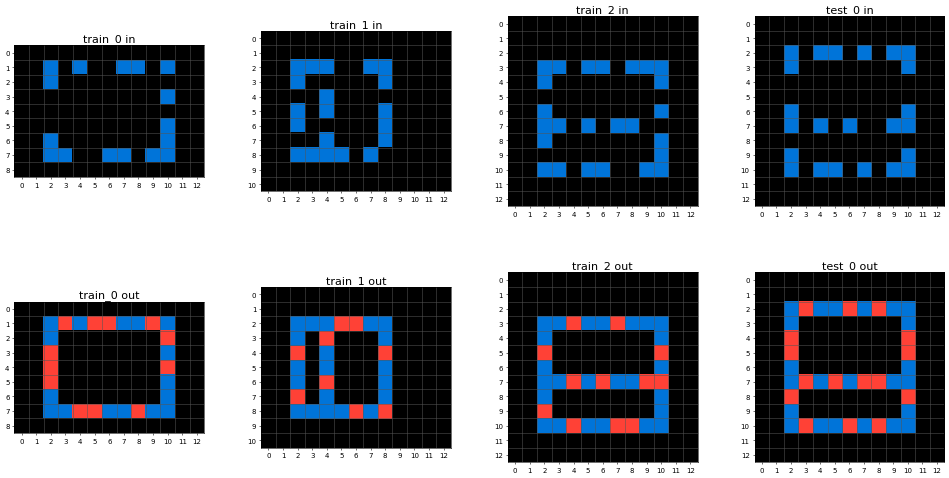

0962bcdd


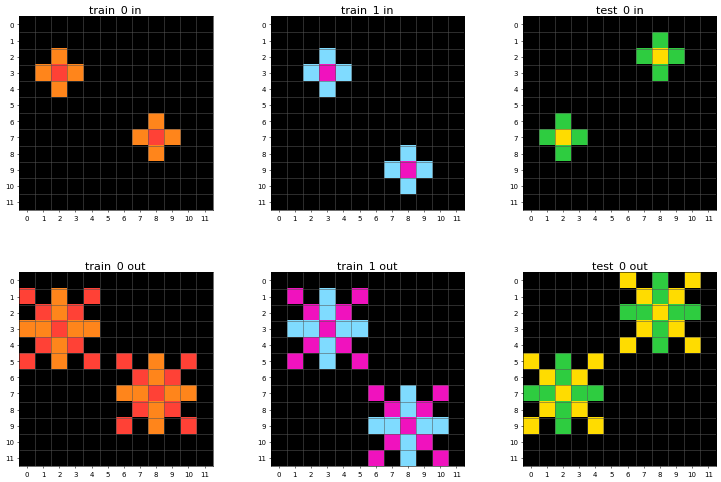

a5f85a15


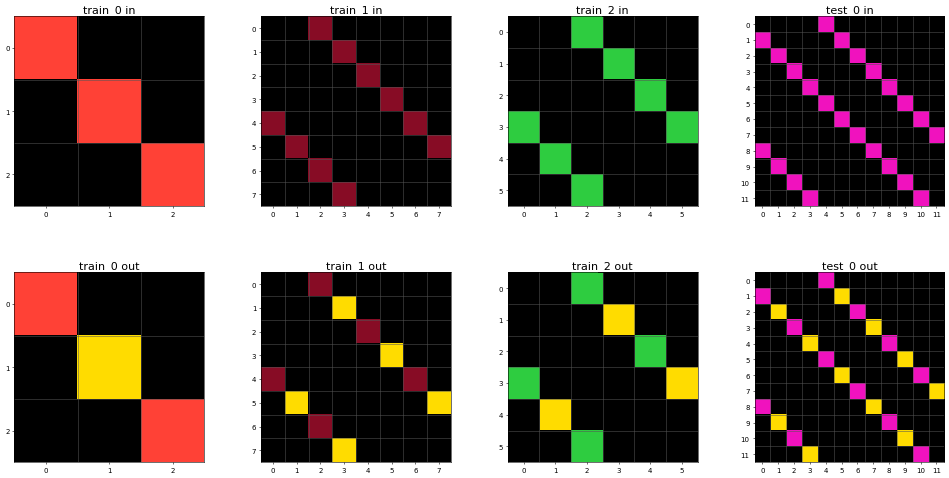

dc433765


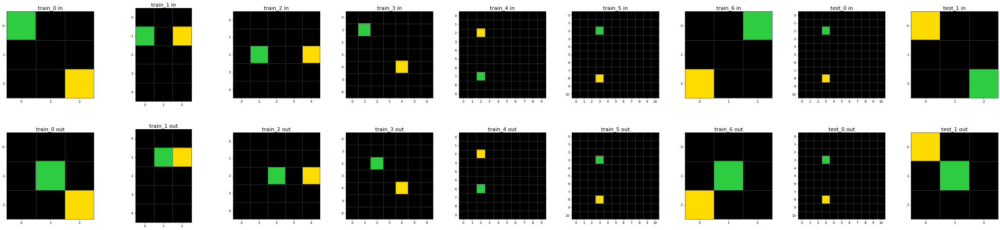

3631a71a


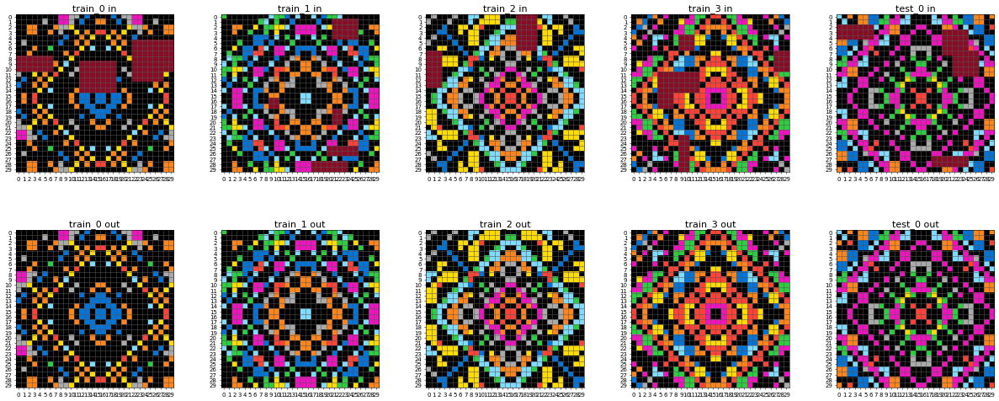

56ff96f3


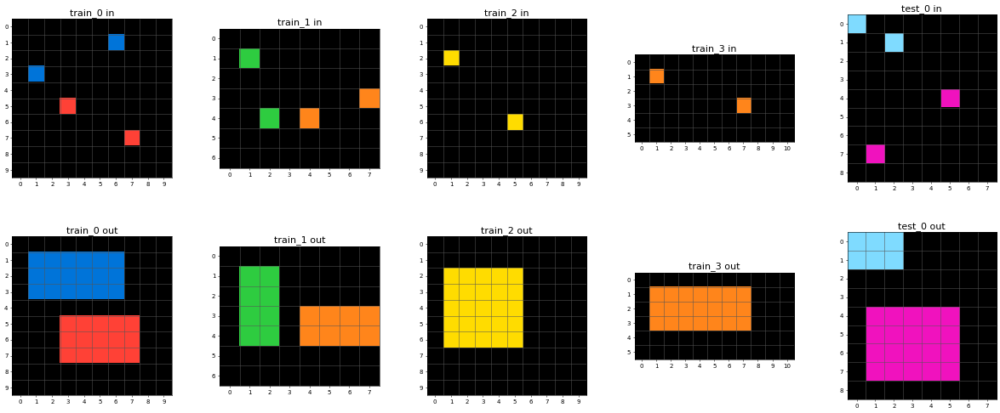

a3df8b1e


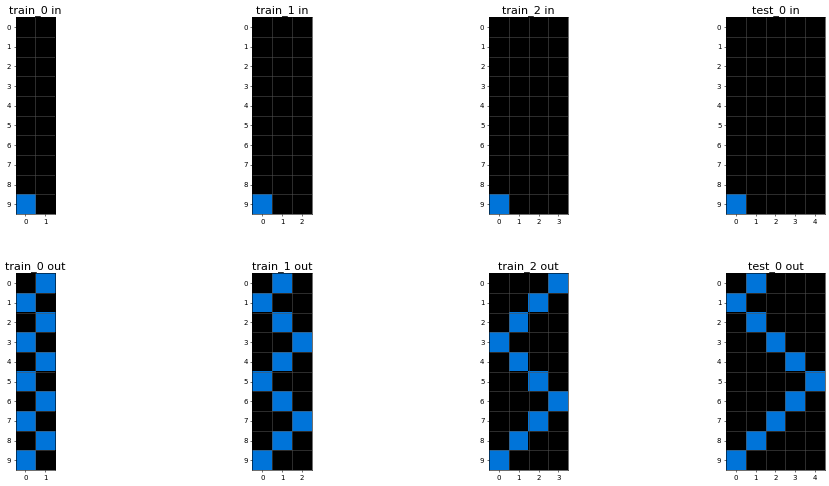

46442a0e


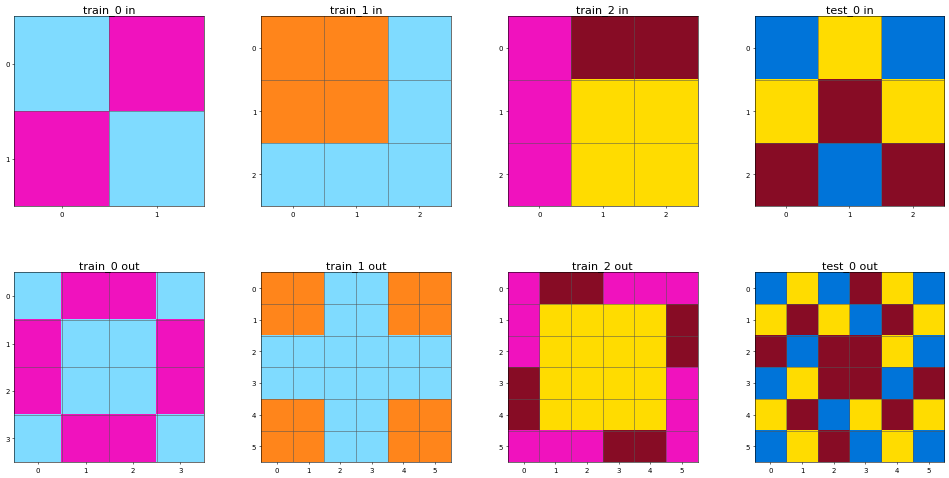

5bd6f4ac


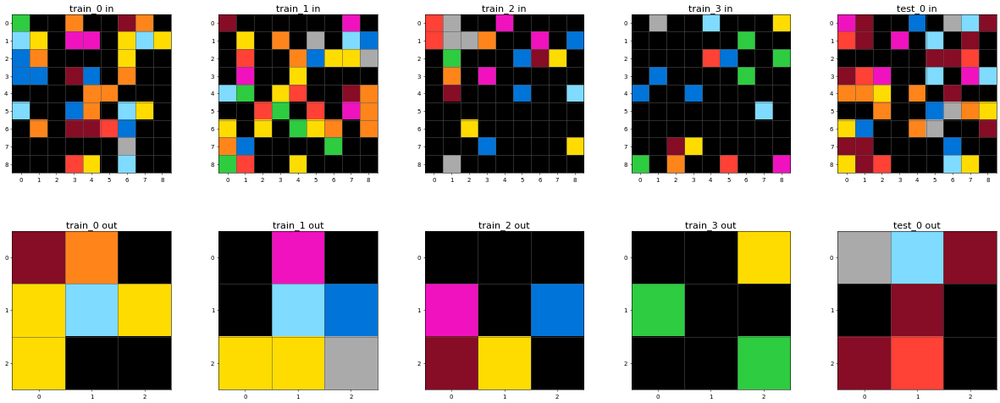

80af3007


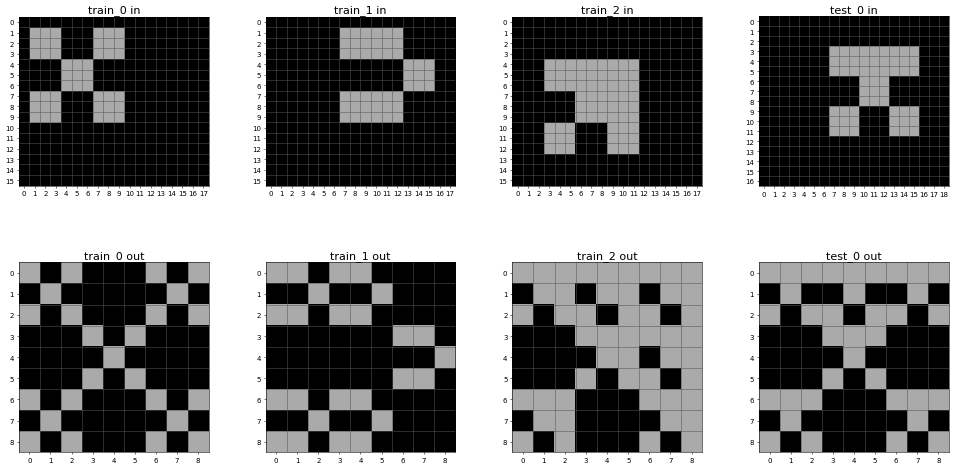

90c28cc7


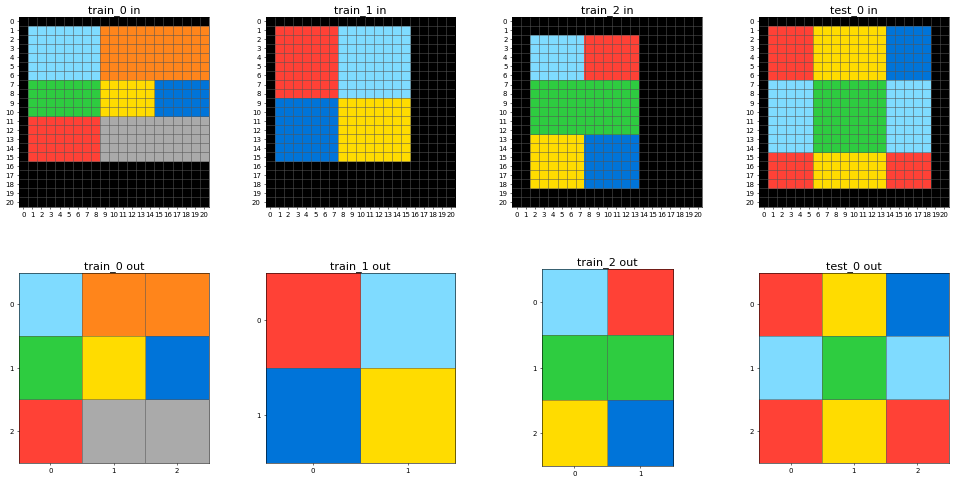

db3e9e38


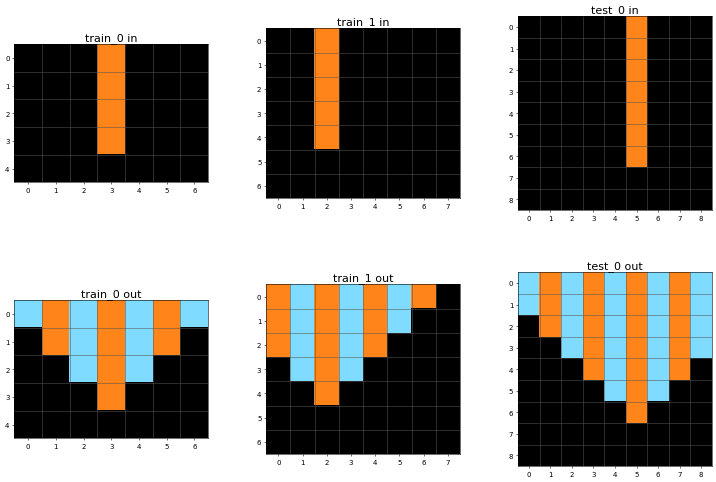

3345333e


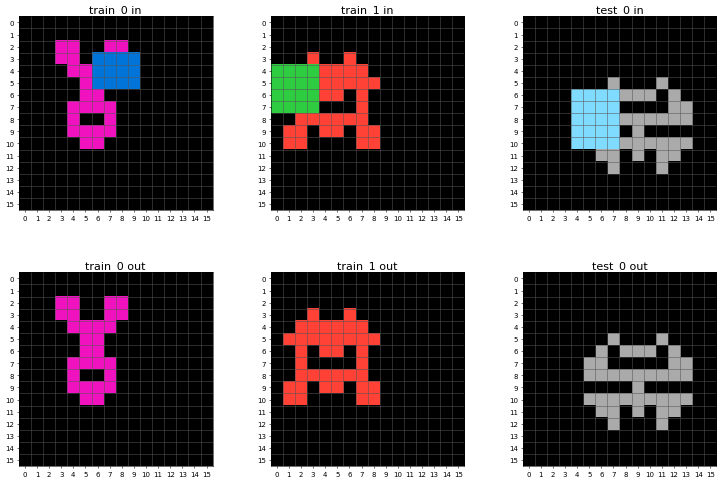

447fd412


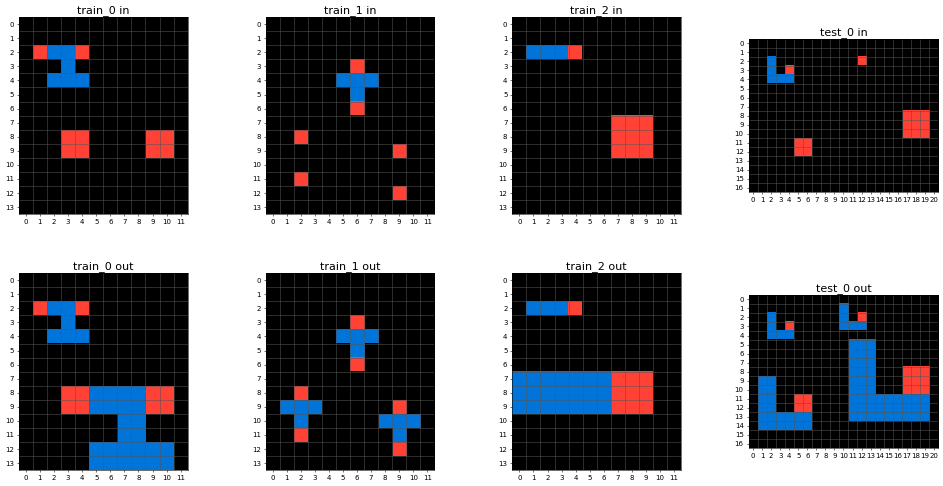

ded97339


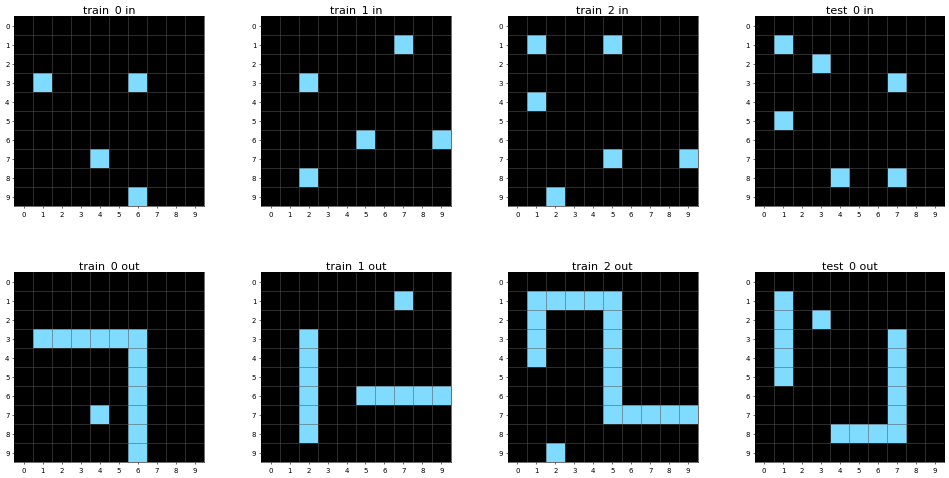

5582e5ca


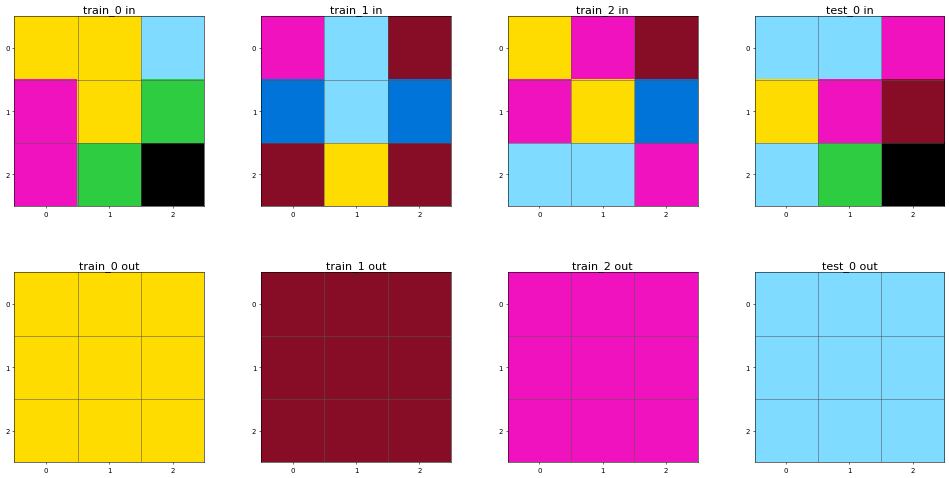

239be575


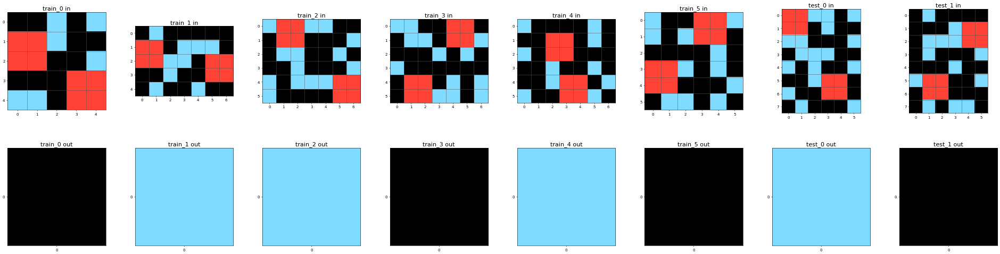

23581191


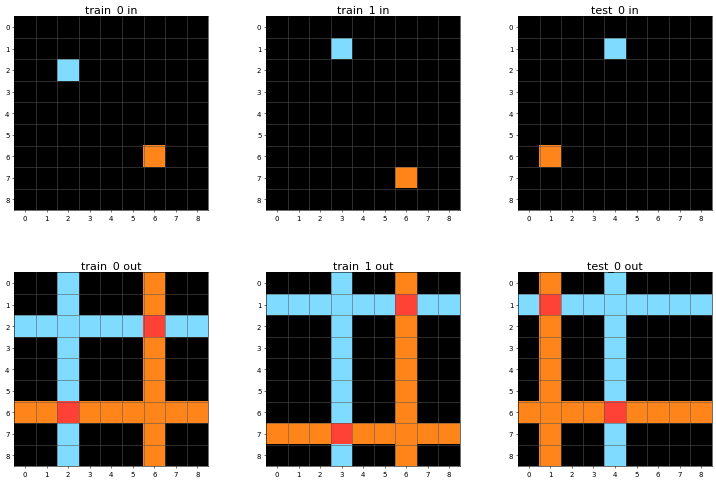

63613498


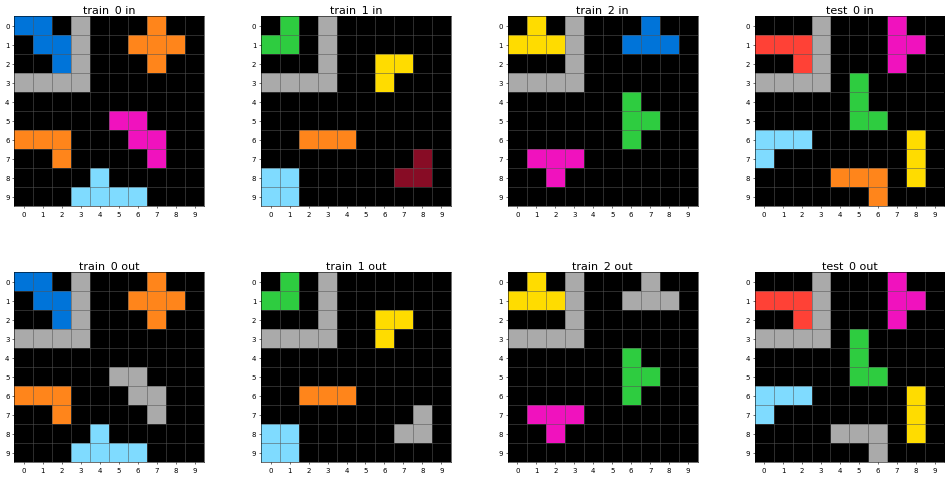

e6721834


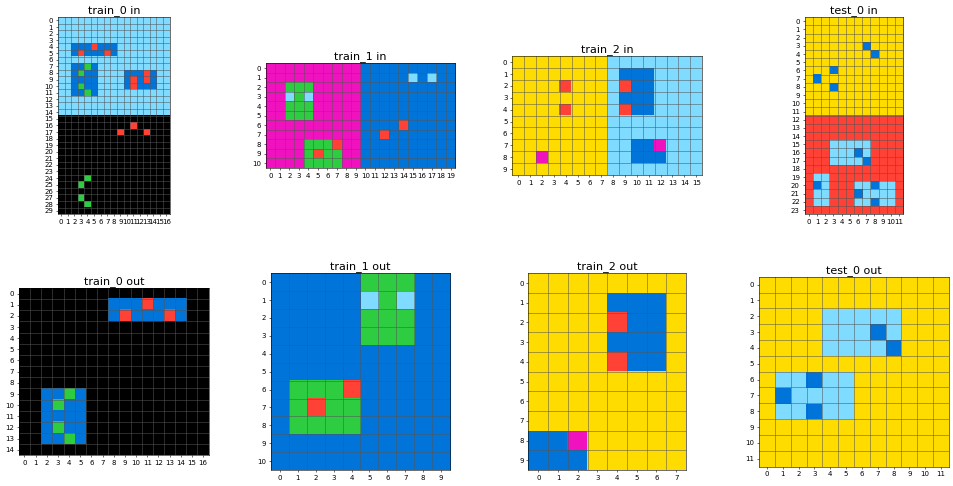

4258a5f9


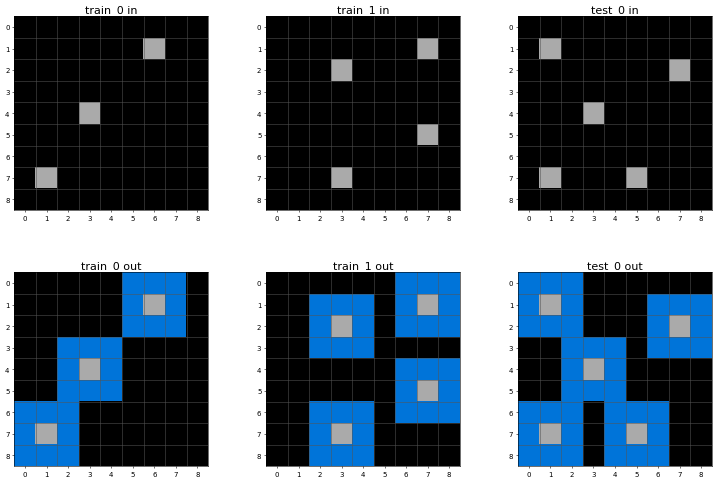

6ecd11f4


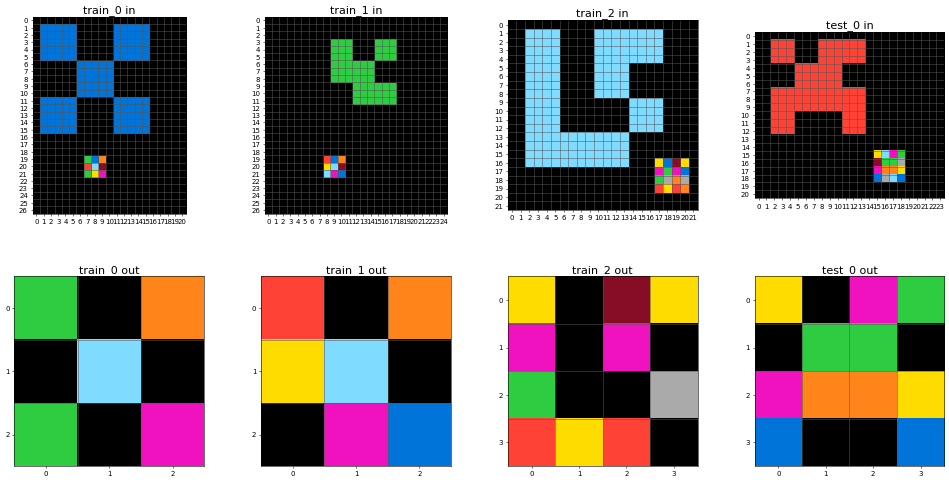

75b8110e


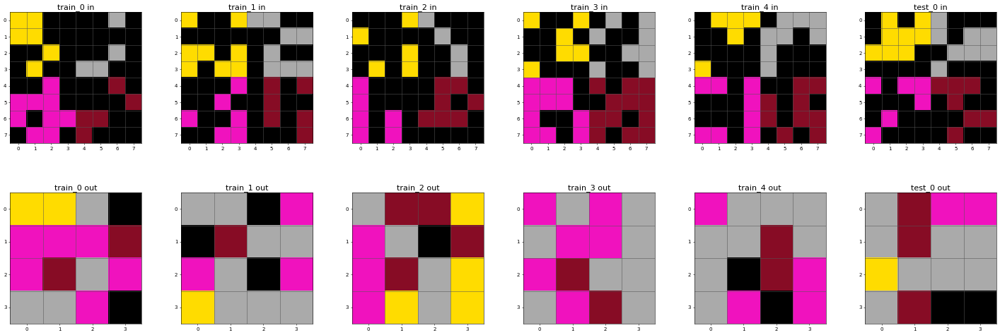

f9012d9b


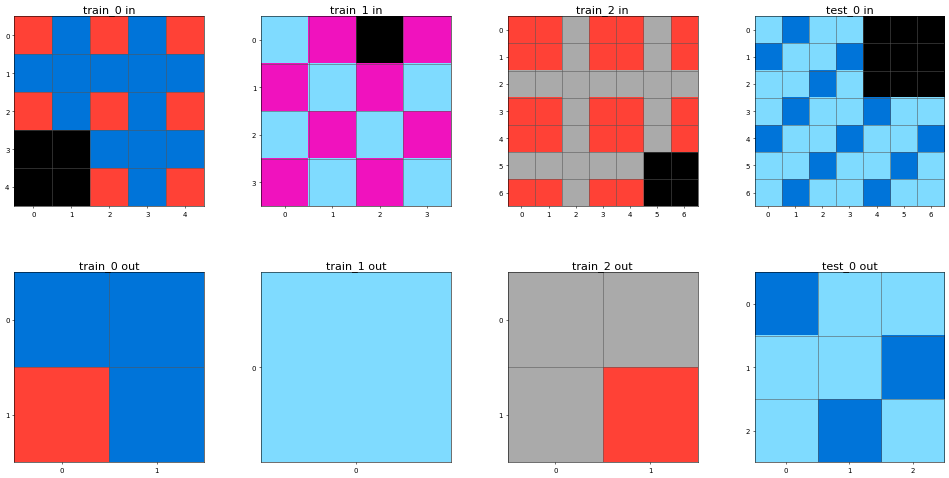

72ca375d


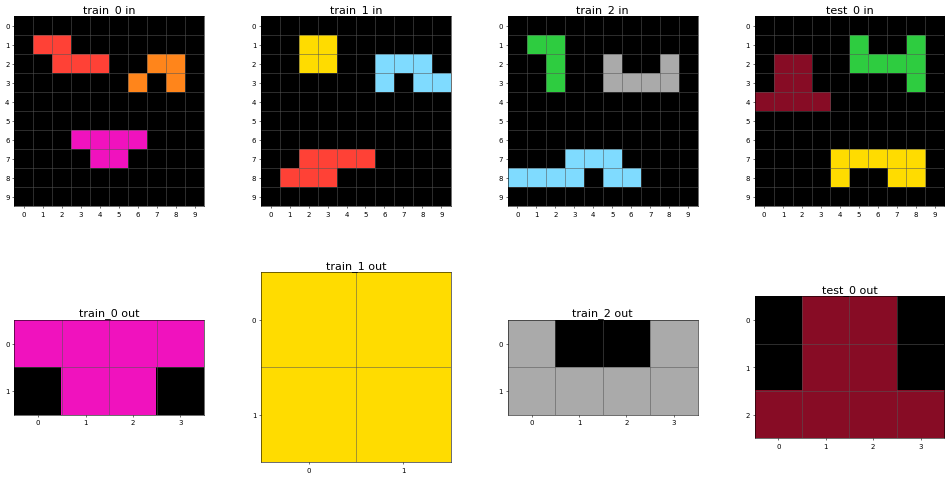

09629e4f


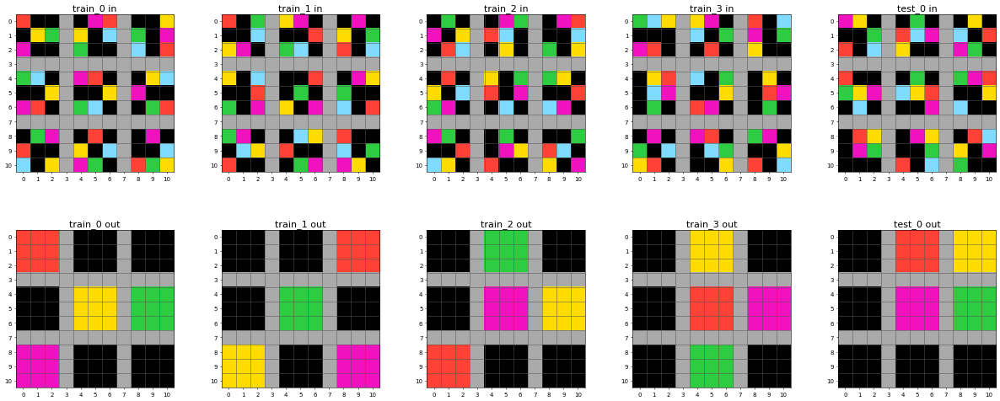

a65b410d


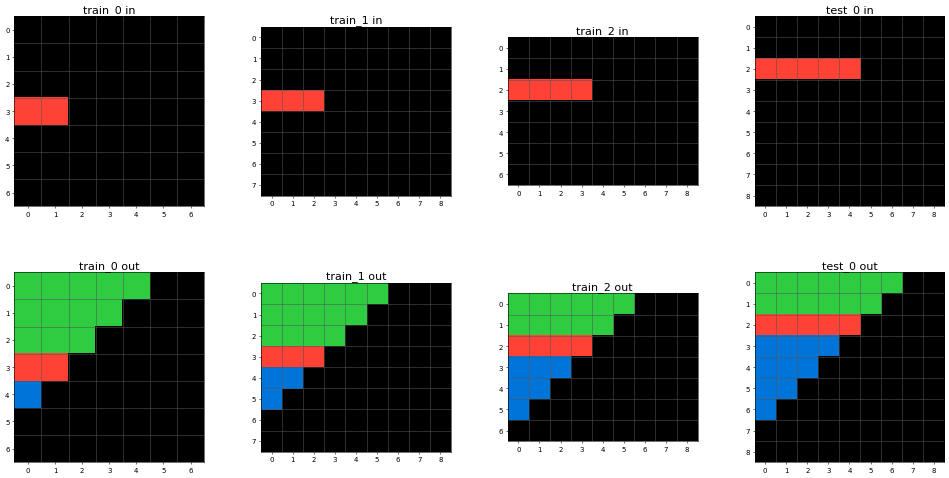

6d0160f0


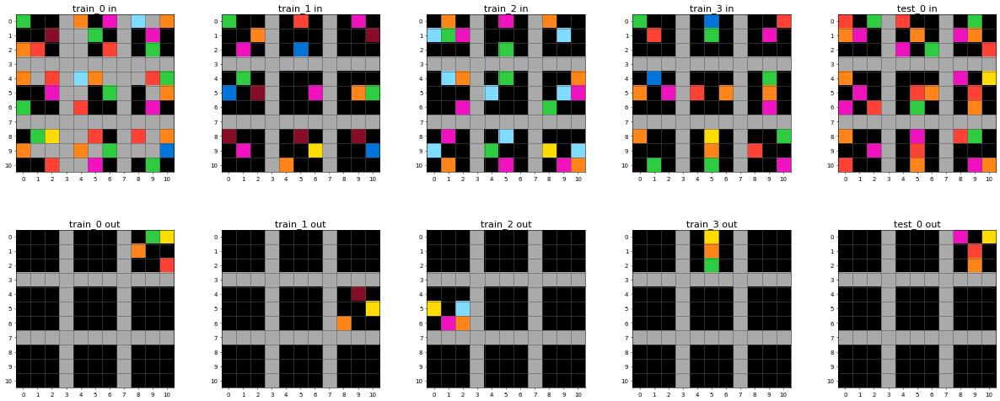

6d0aefbc


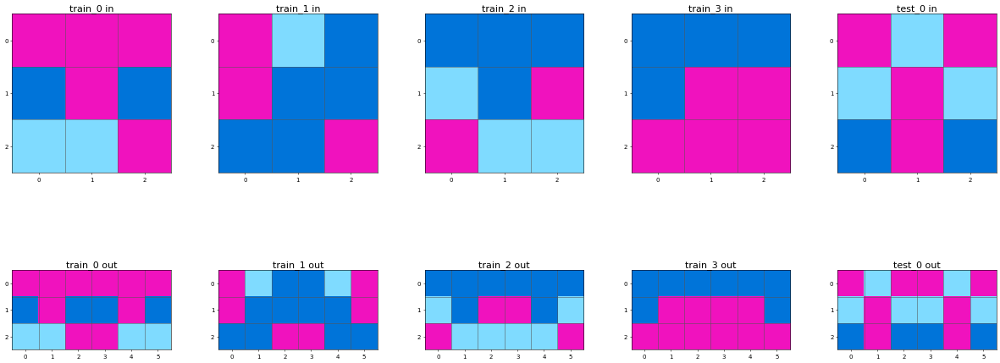

b548a754


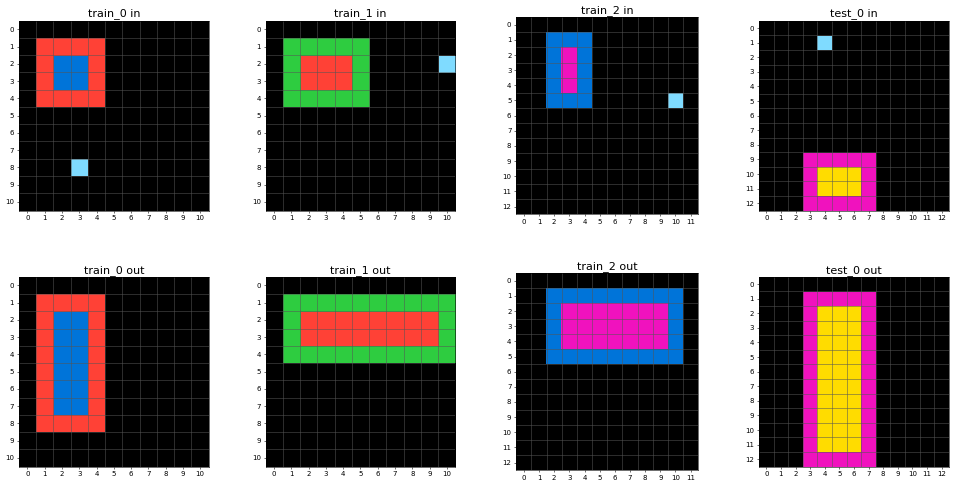

05269061


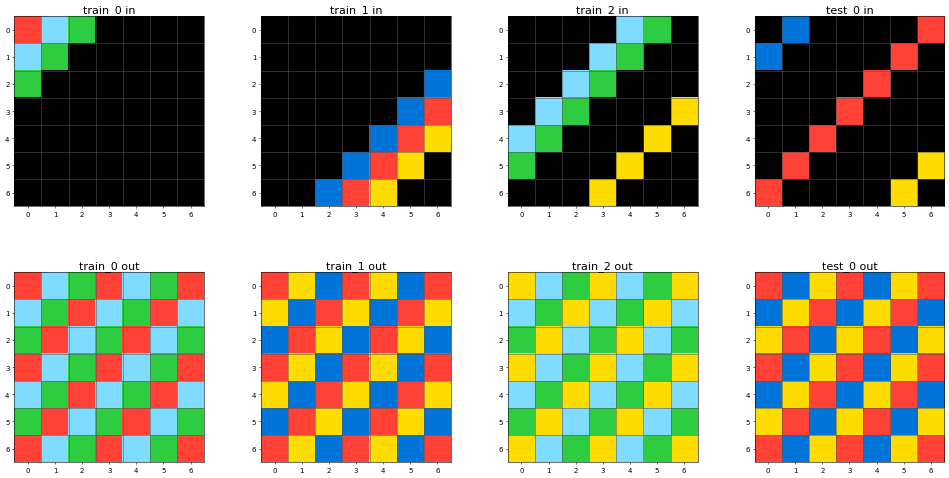

0a938d79


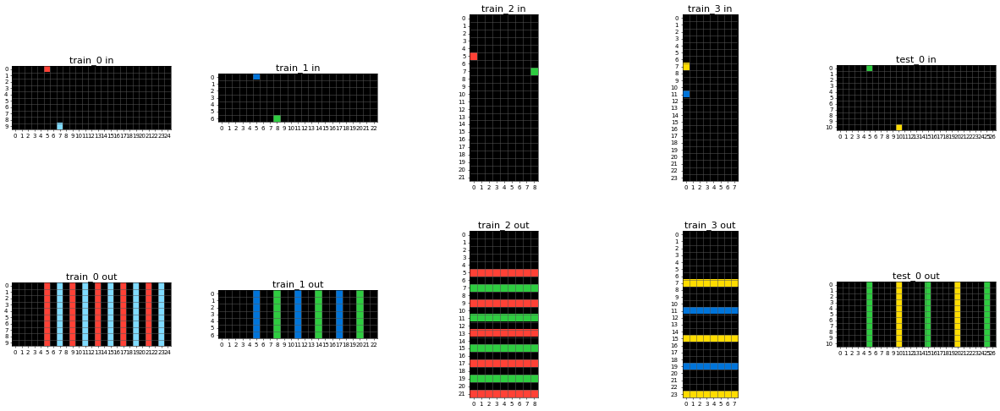

5daaa586


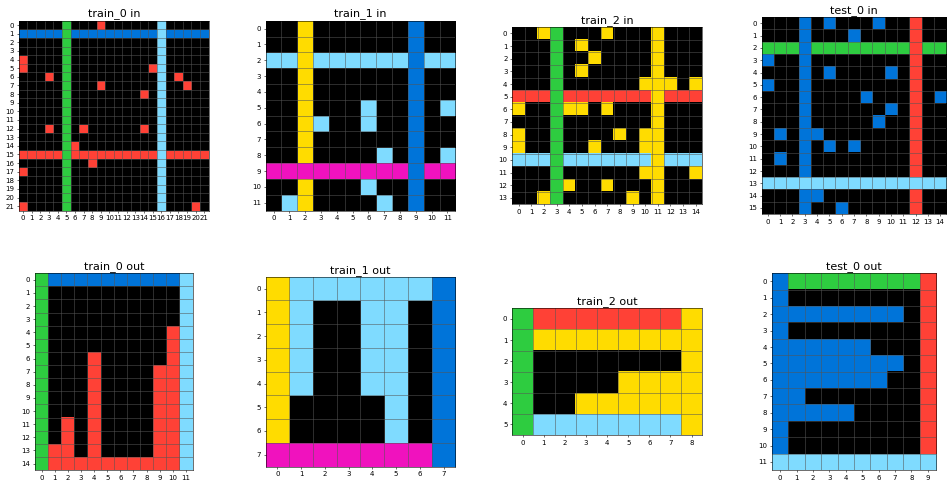

8403a5d5


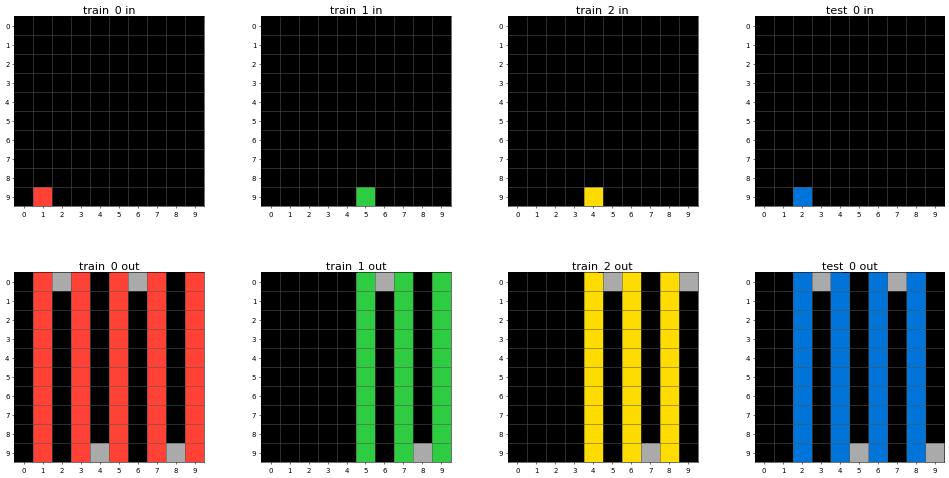

29ec7d0e


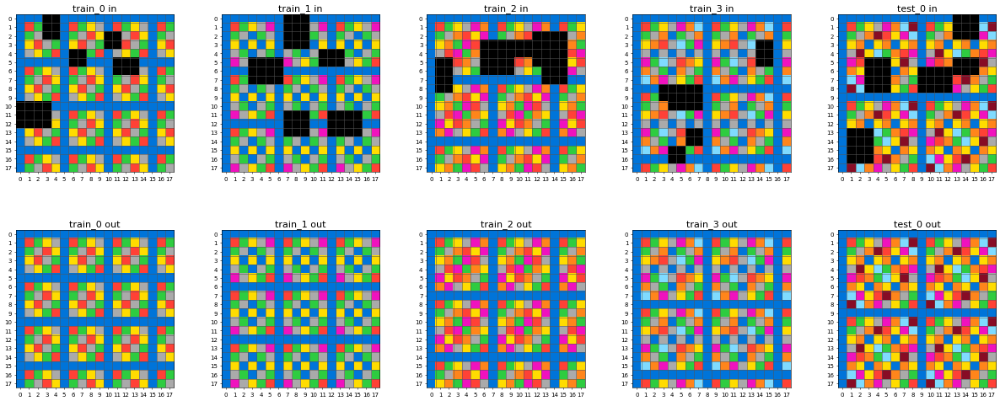

0e206a2e


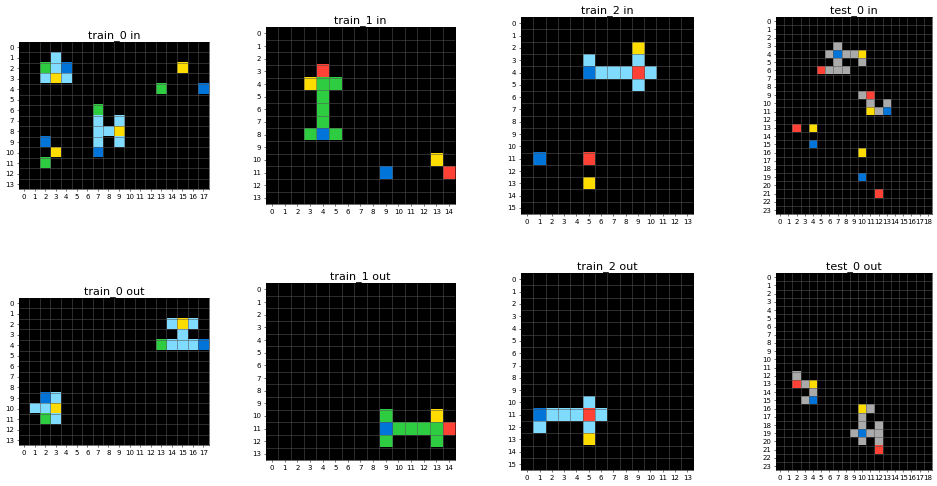

e5062a87


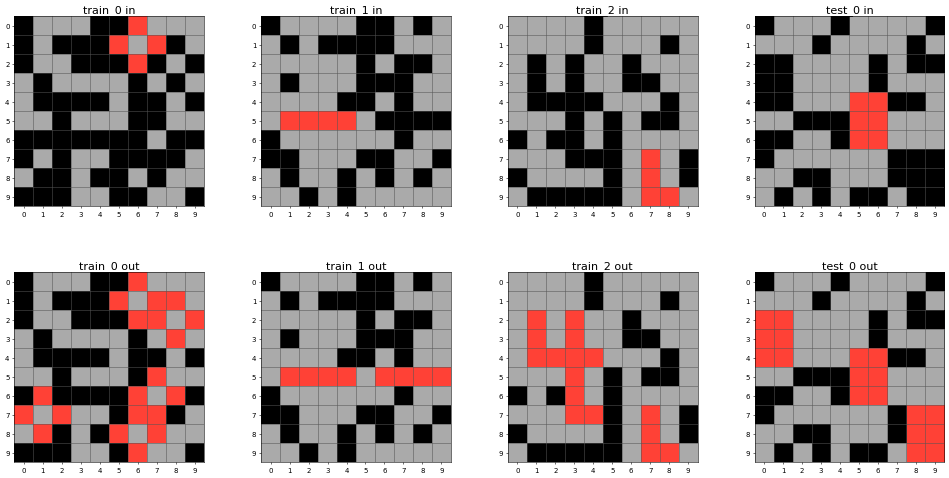

6430c8c4


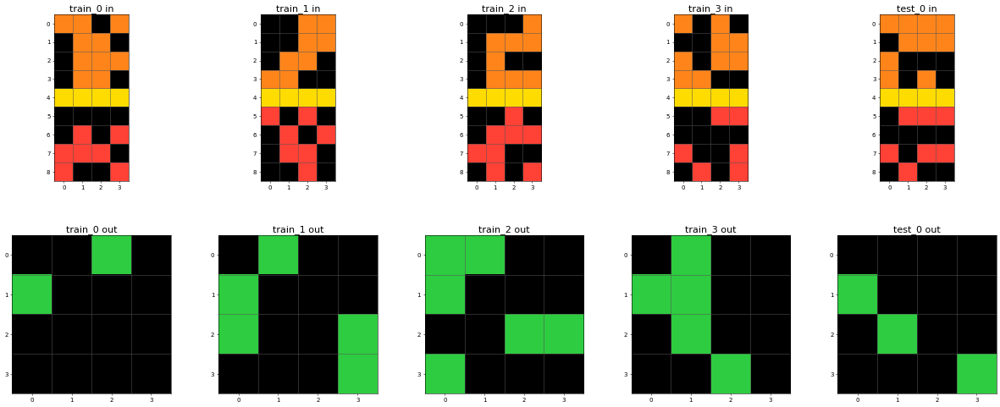

7ddcd7ec


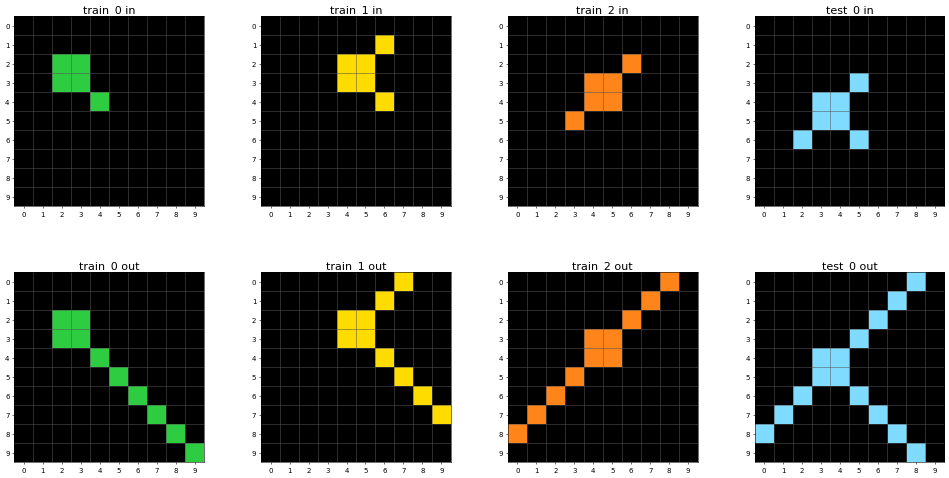

d4f3cd78


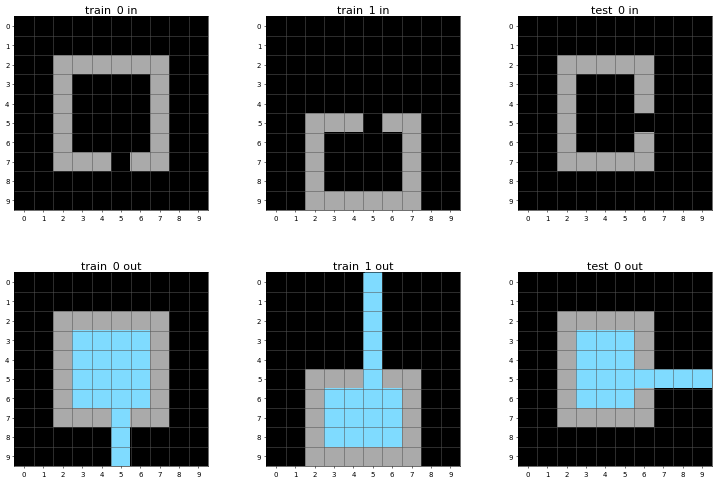

5ad4f10b


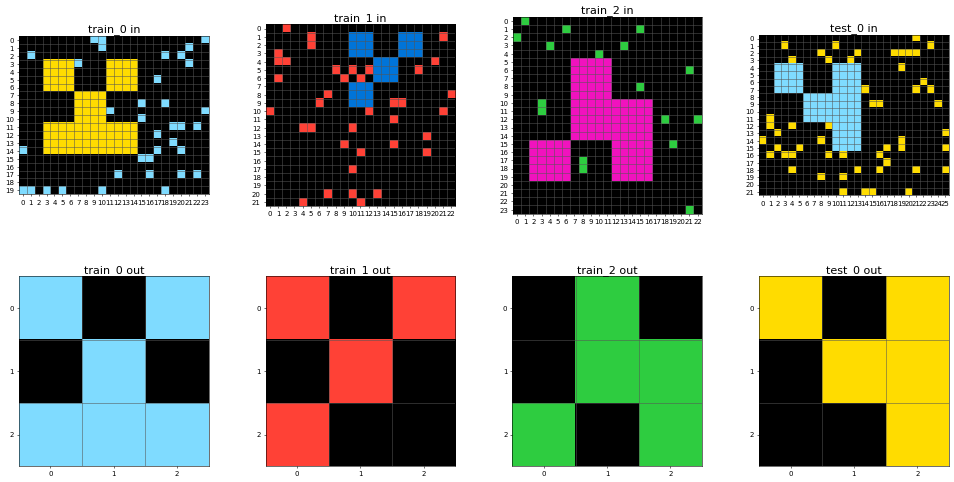

67a423a3


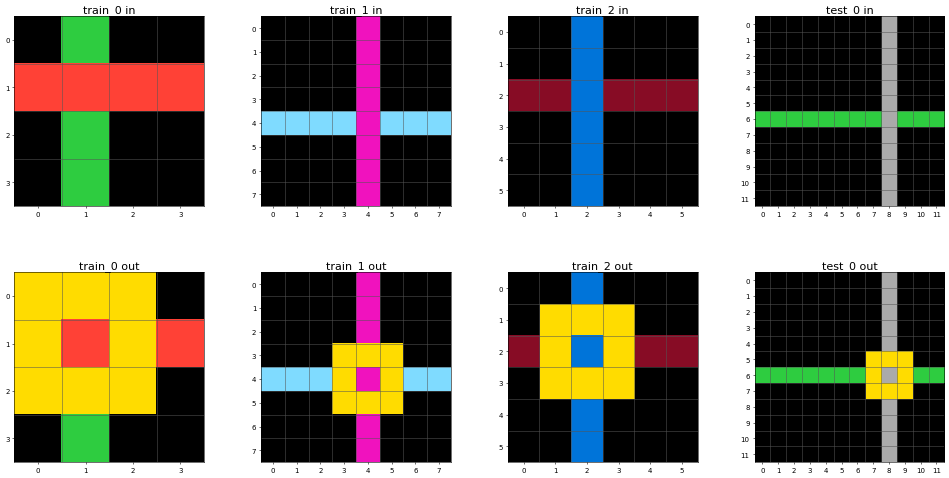

673ef223


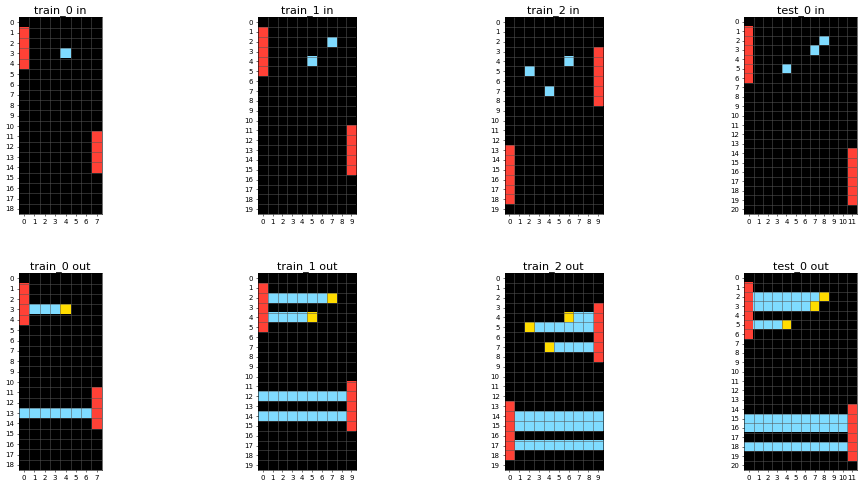

178fcbfb


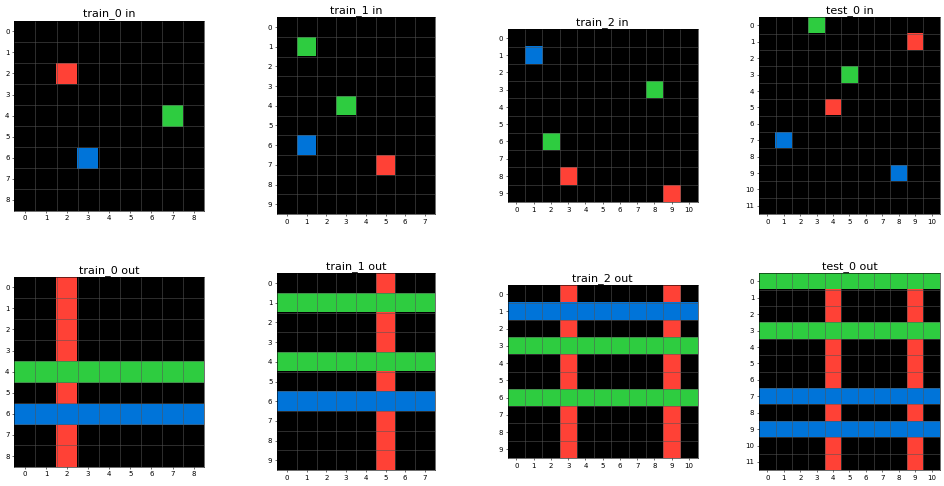

c3e719e8


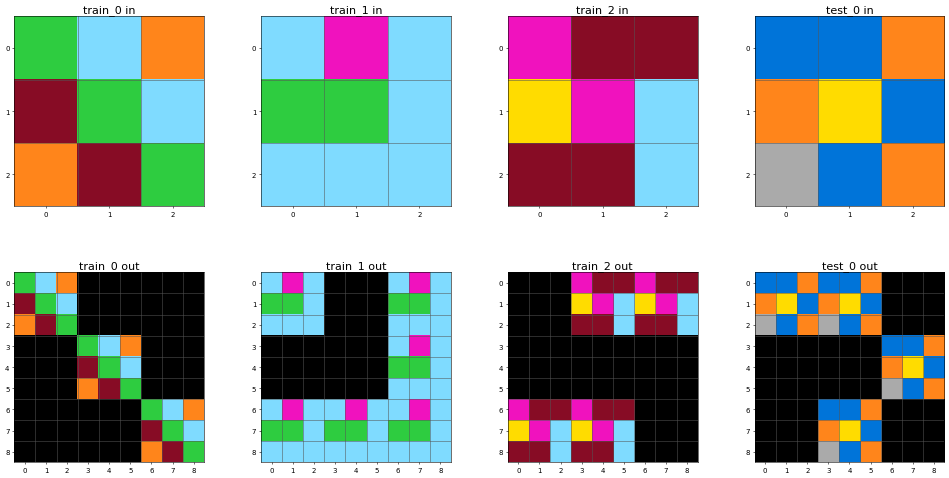

f8c80d96


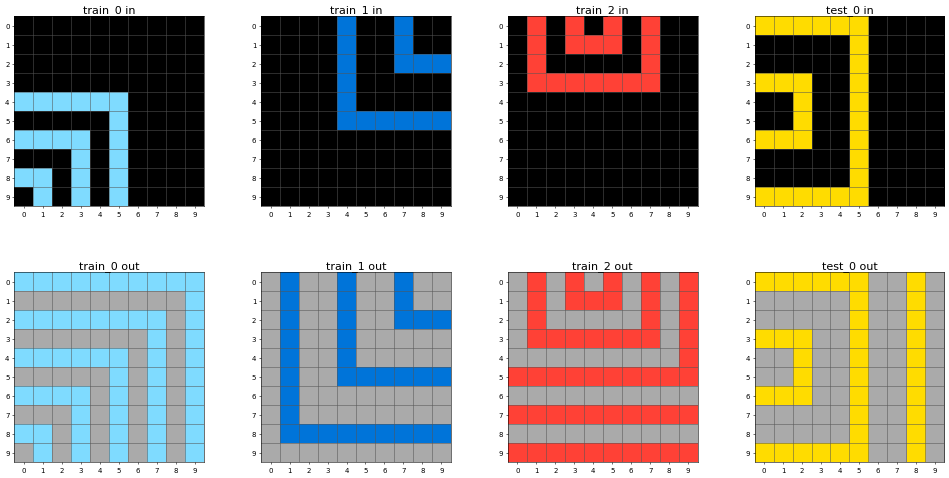

de1cd16c


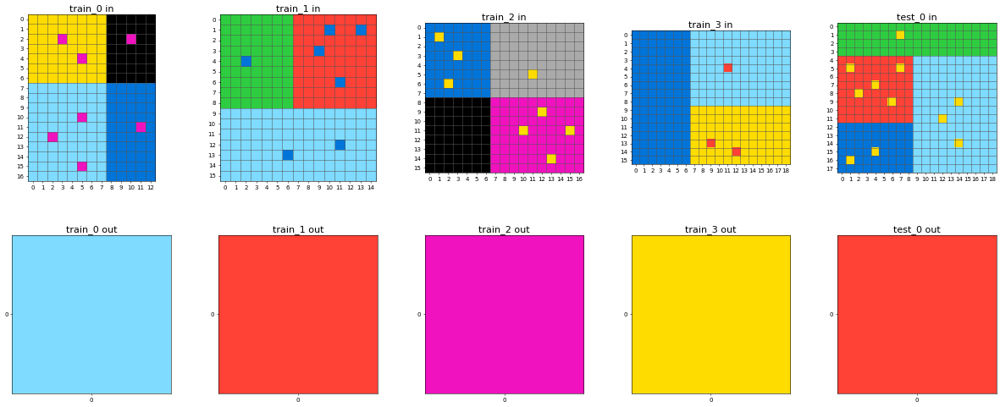

e21d9049


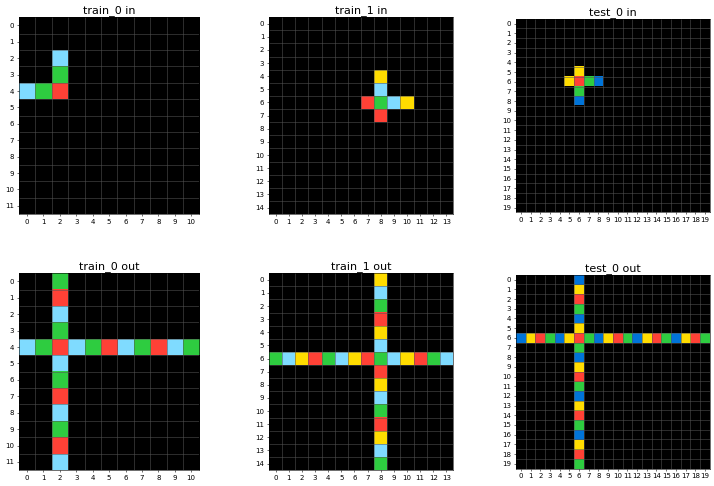

3ac3eb23


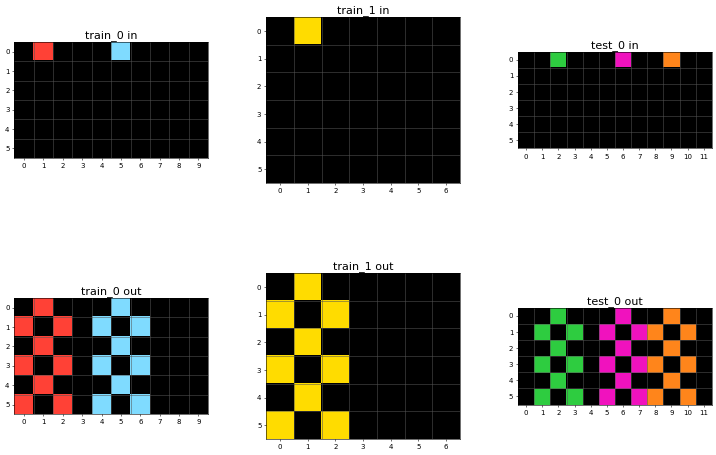

a61ba2ce


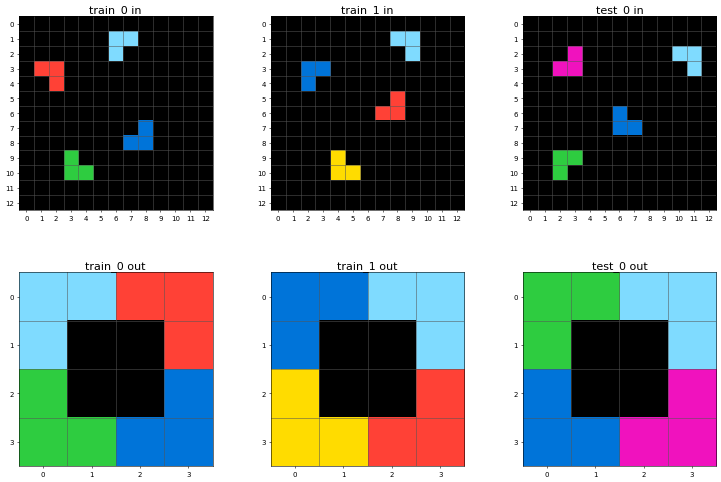

85c4e7cd


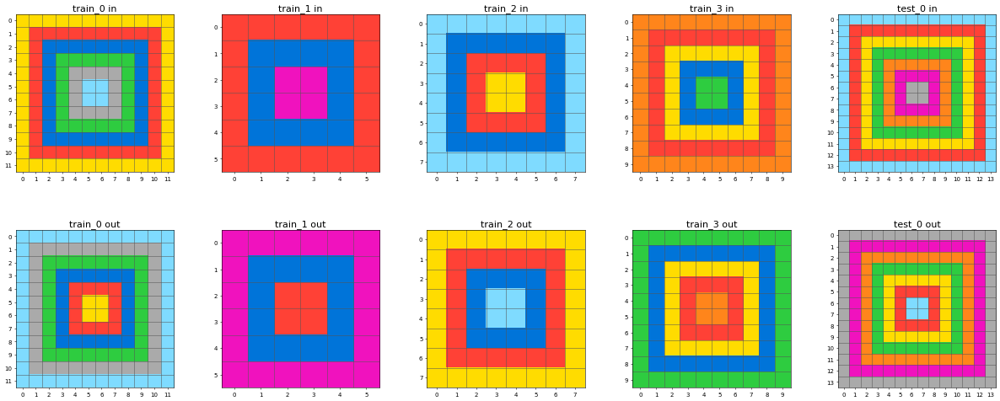

f35d900a


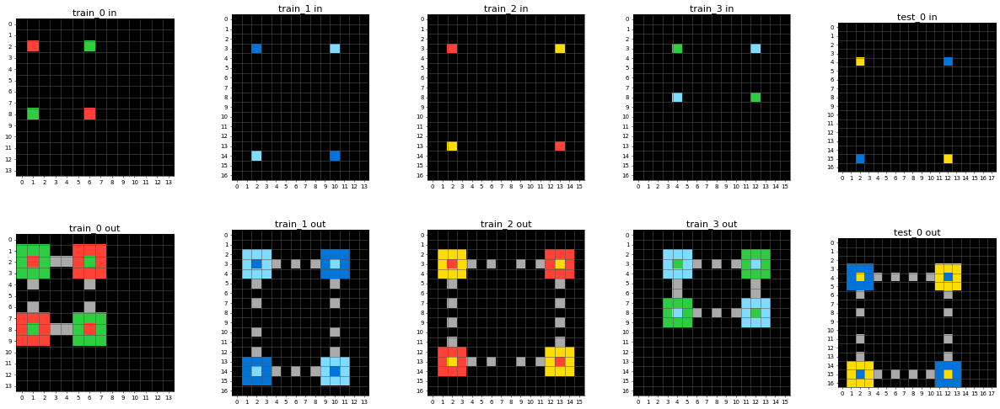

694f12f3


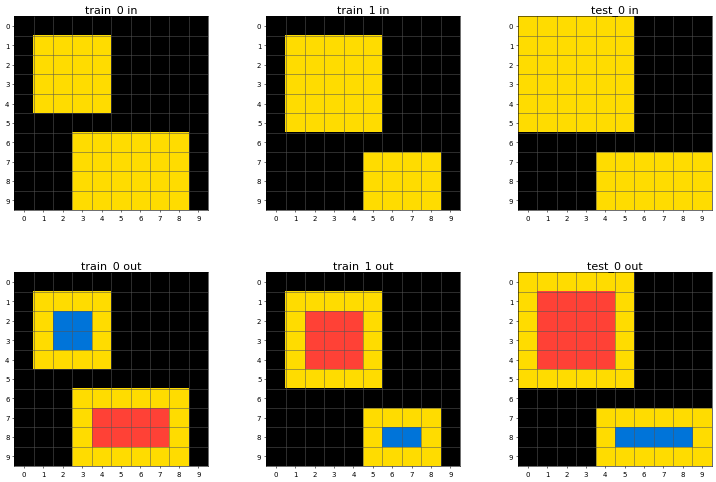

cbded52d


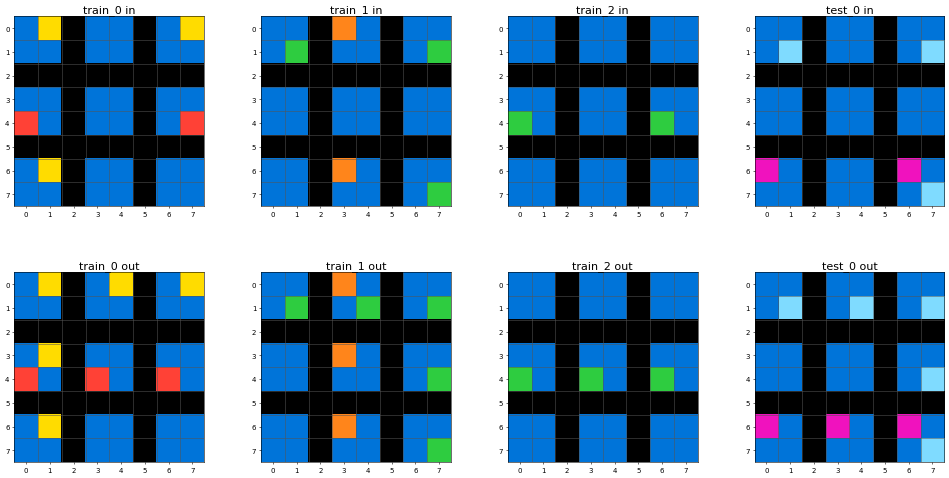

bbc9ae5d


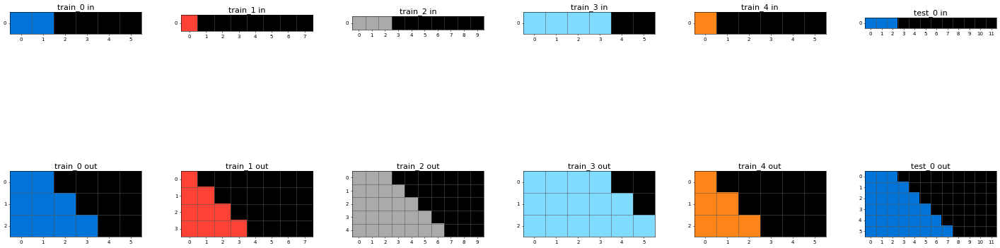

3f7978a0


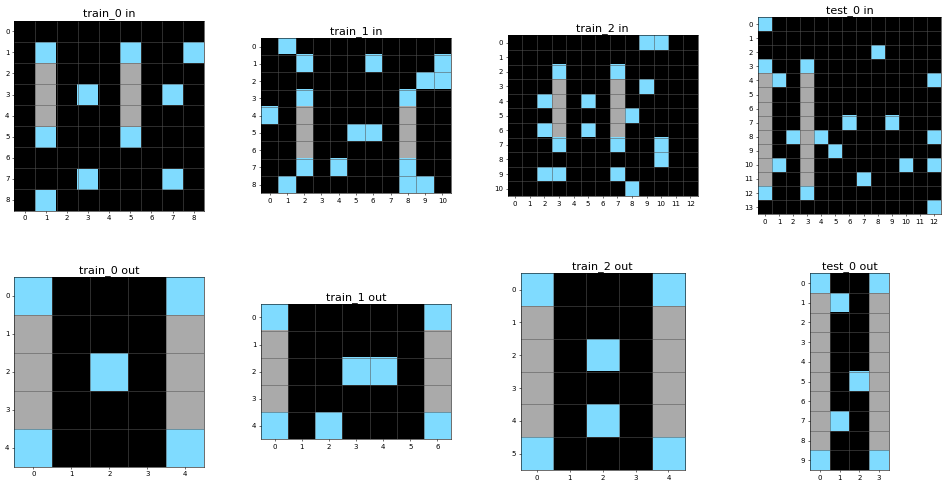

d13f3404


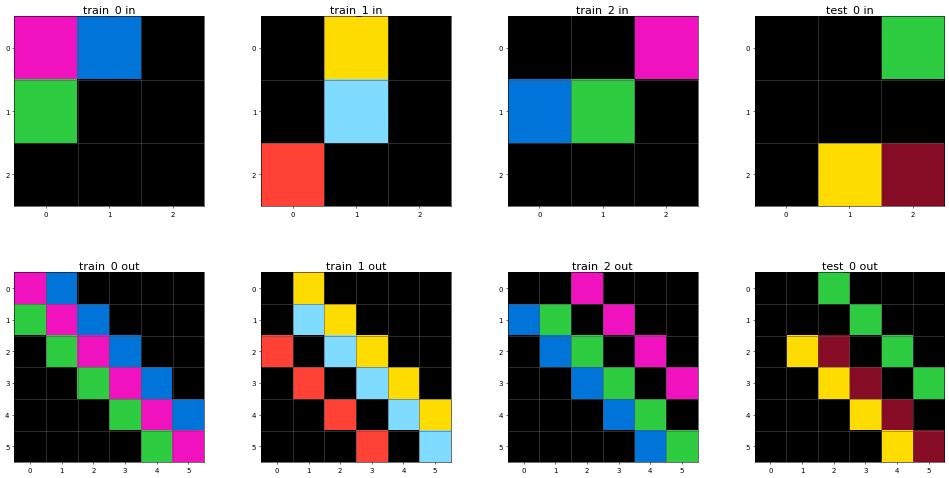

a68b268e


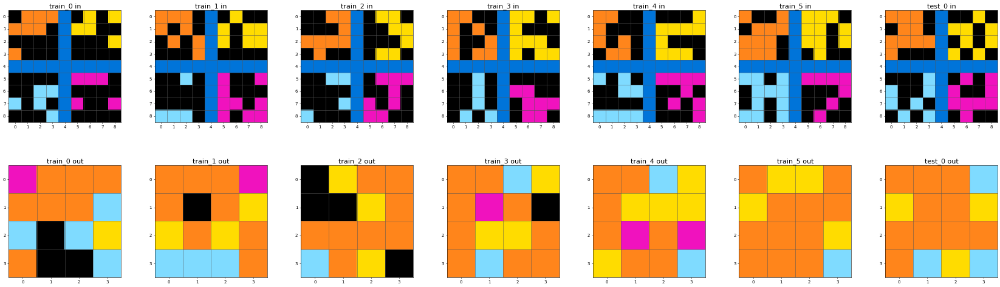

f1cefba8


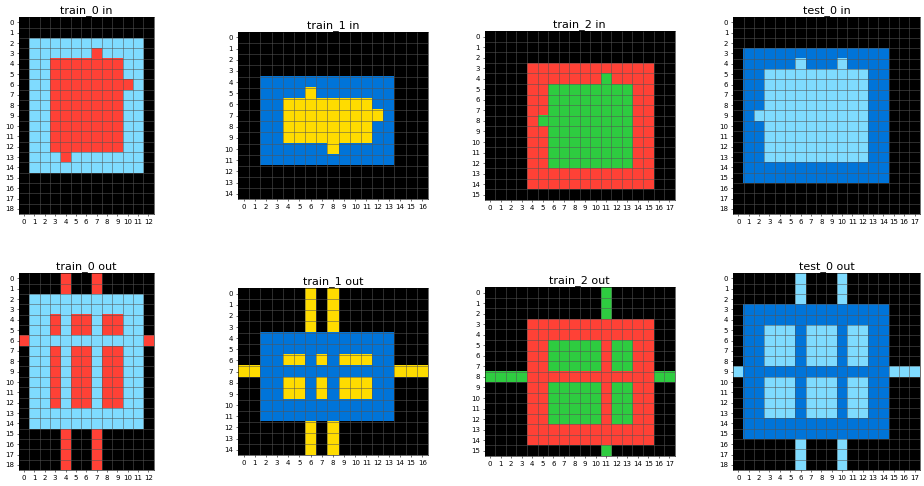

b230c067


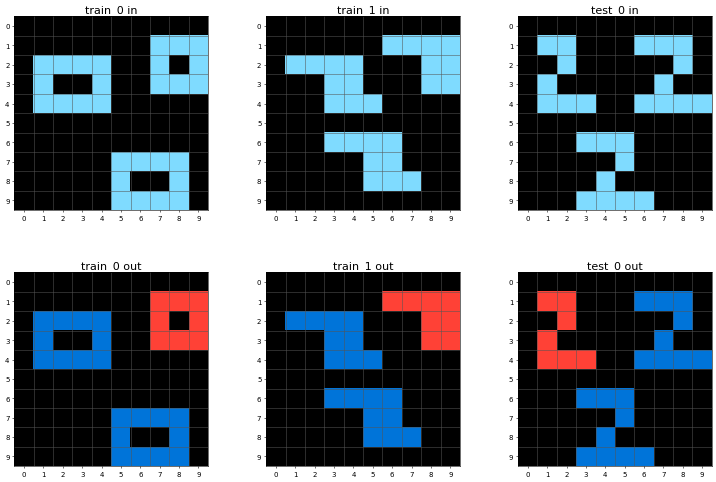

6f8cd79b


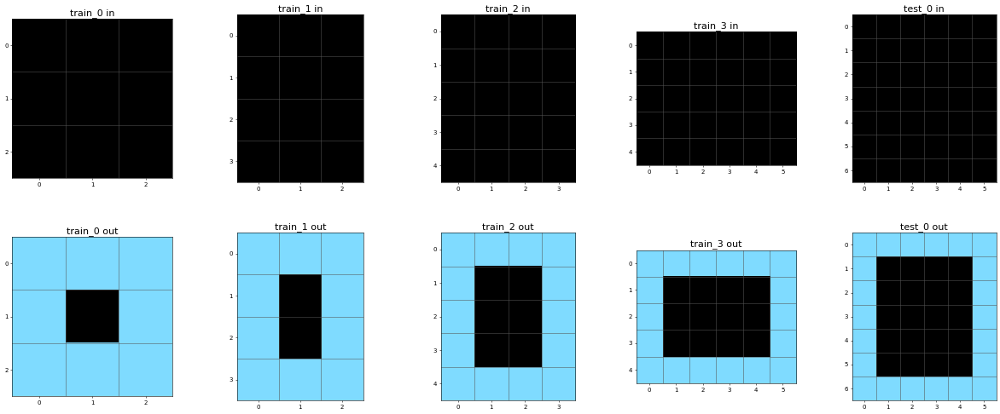

6fa7a44f


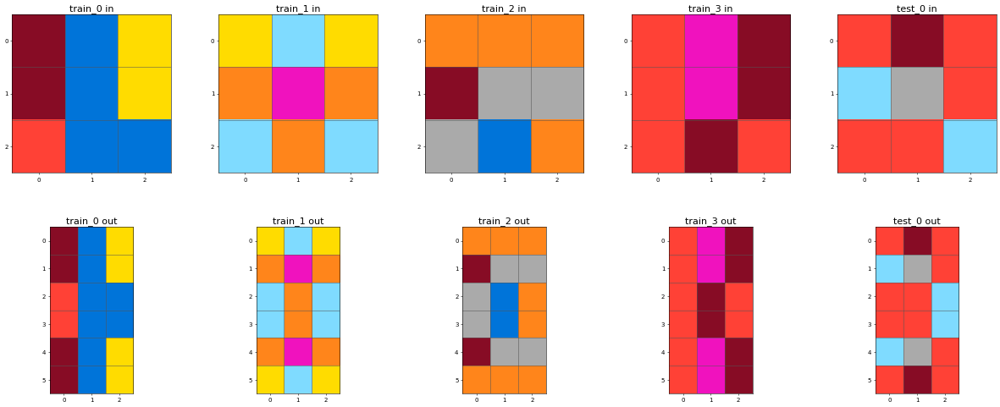

760b3cac


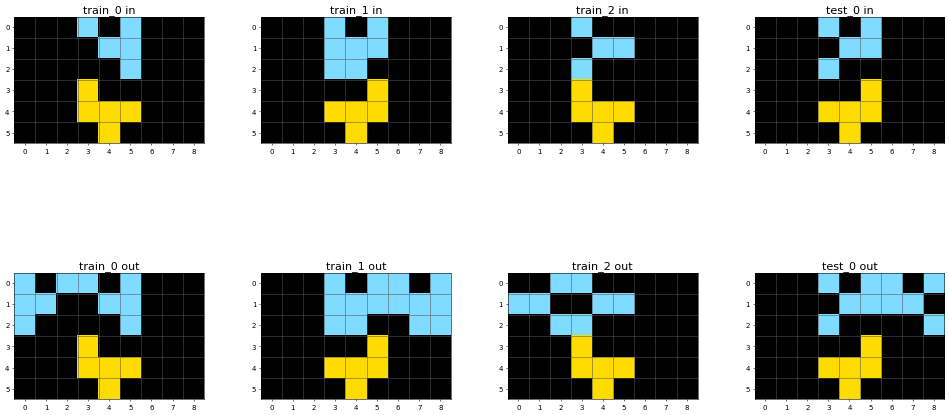

e26a3af2


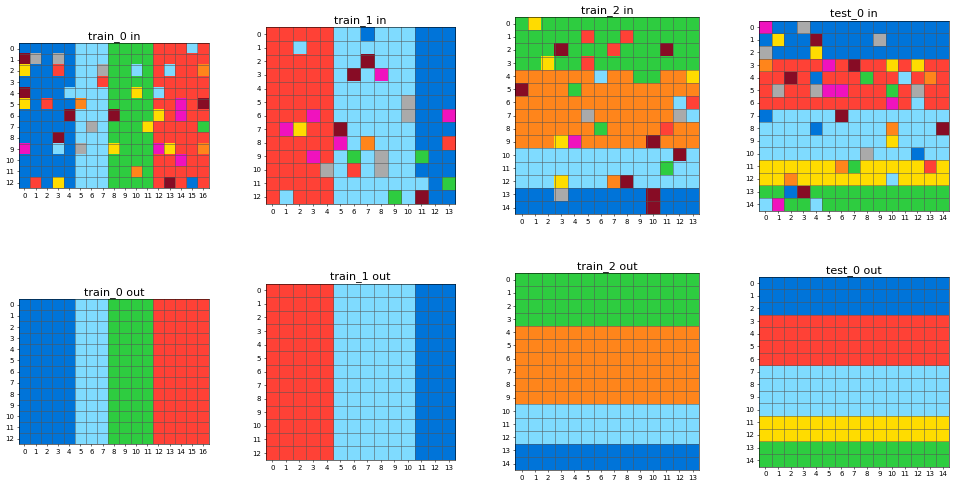

2dc579da


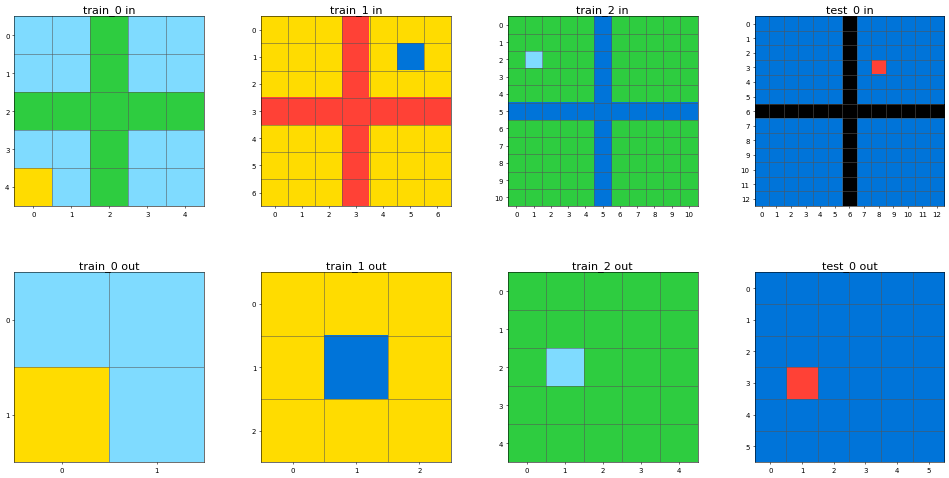

2c608aff


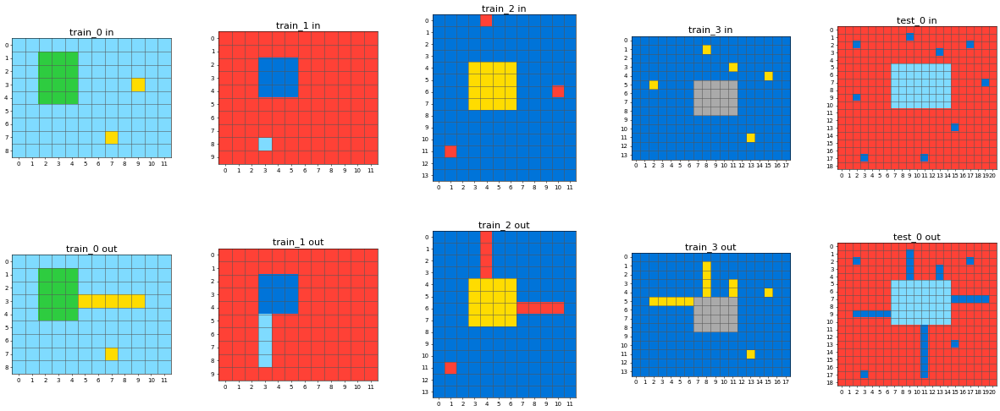

0b148d64


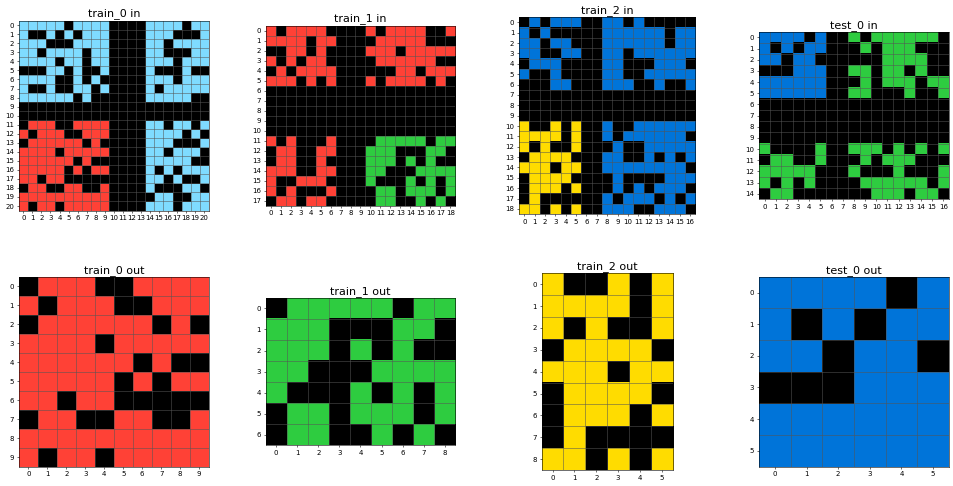

be94b721


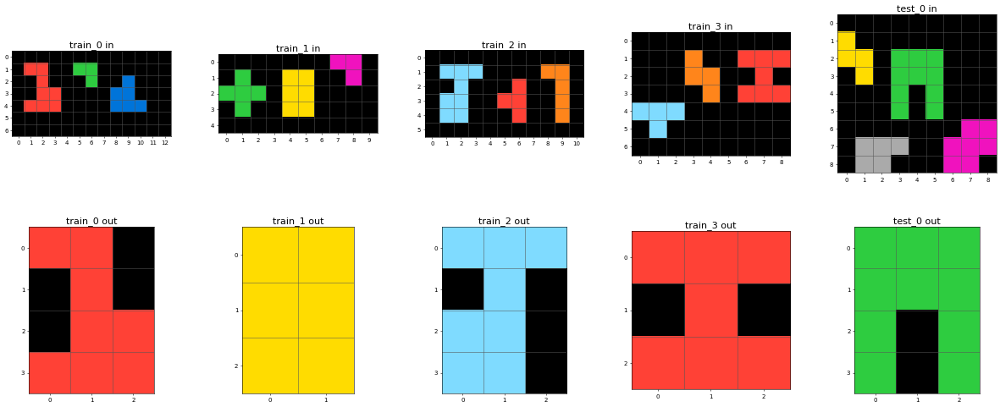

c1d99e64


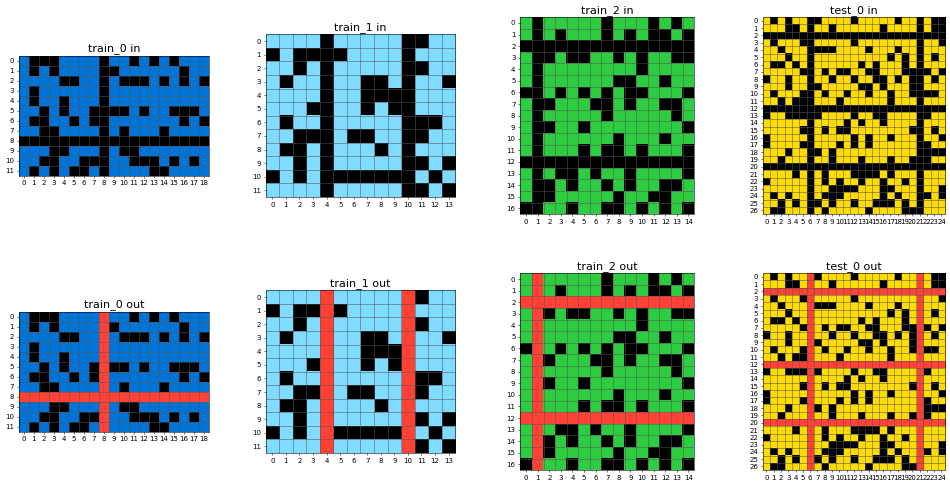

7df24a62


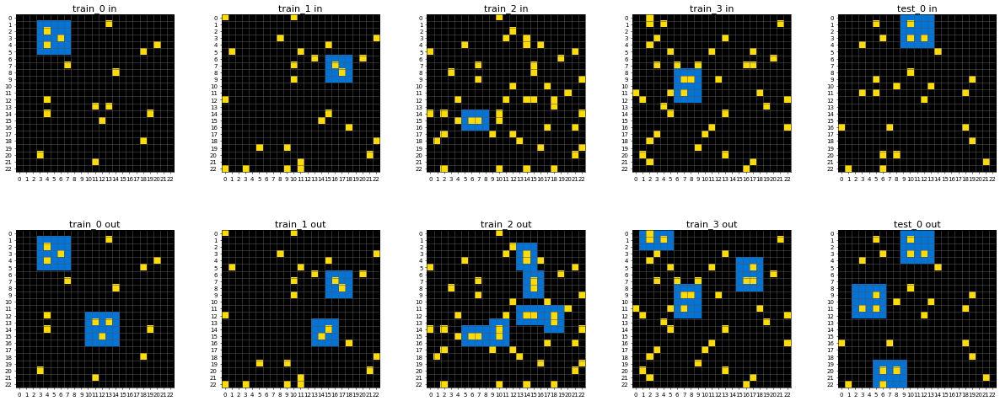

d406998b


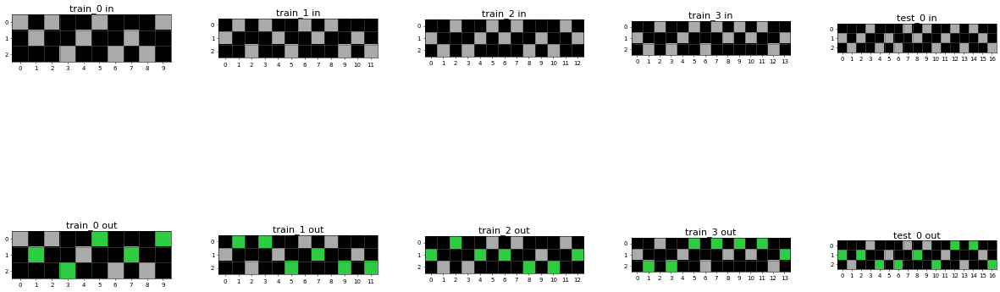

29623171


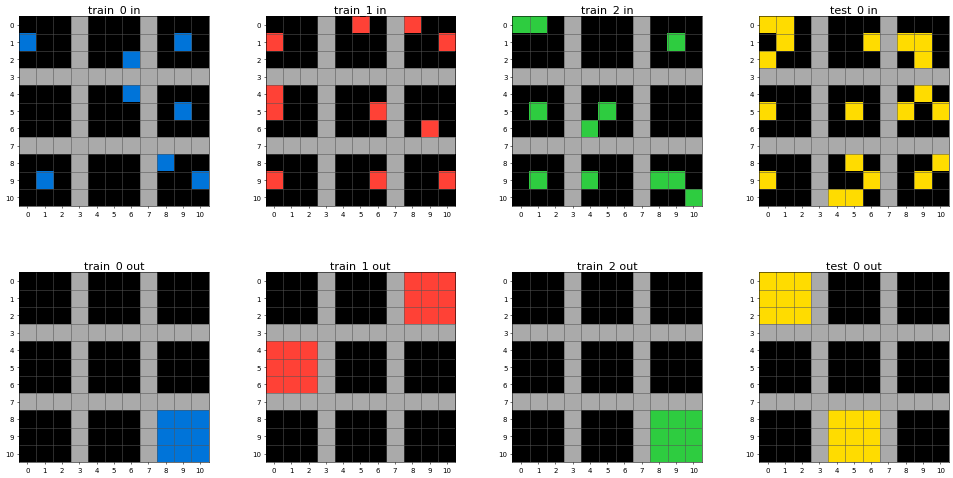

aabf363d


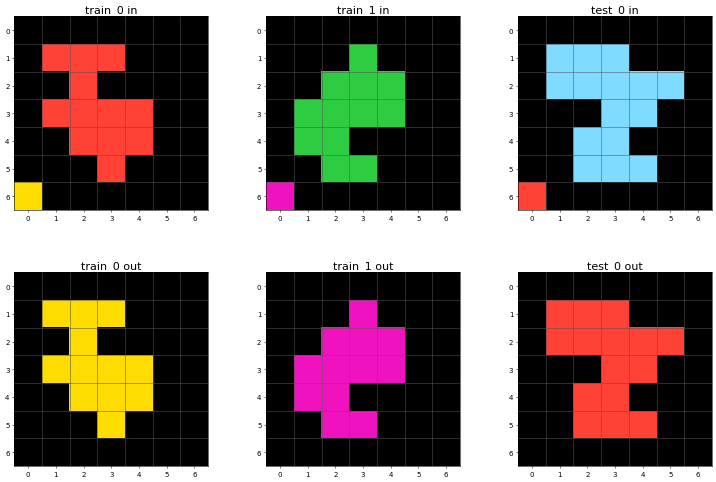

1bfc4729


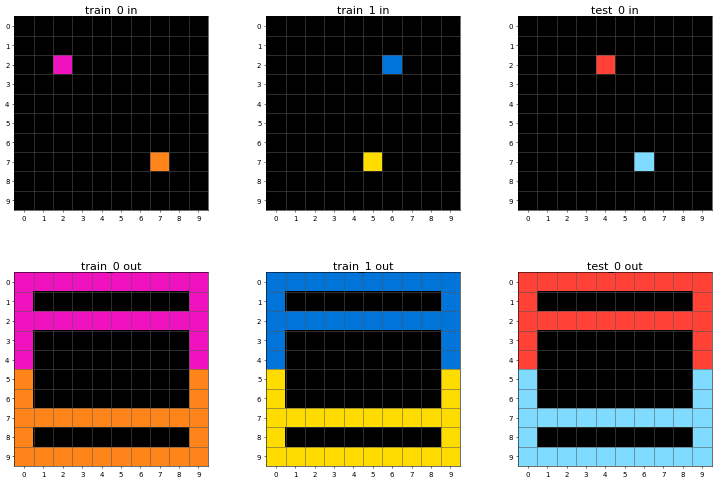

6e82a1ae


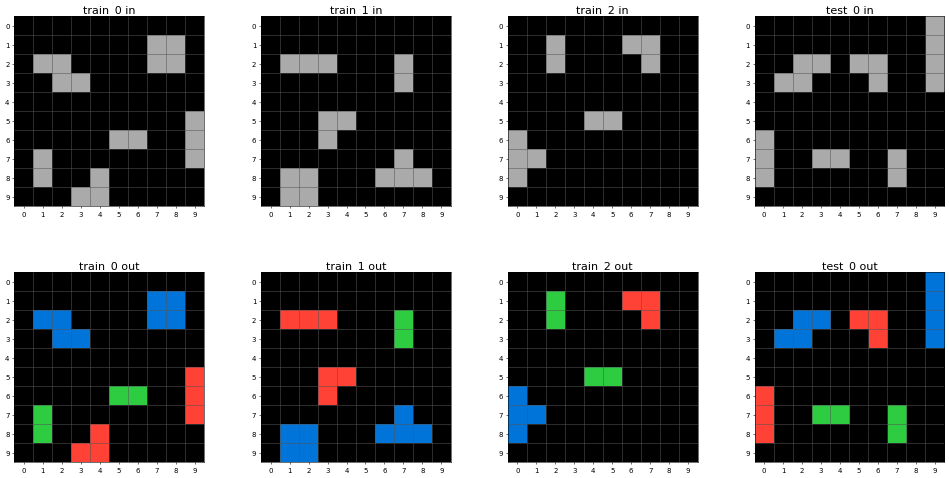

681b3aeb


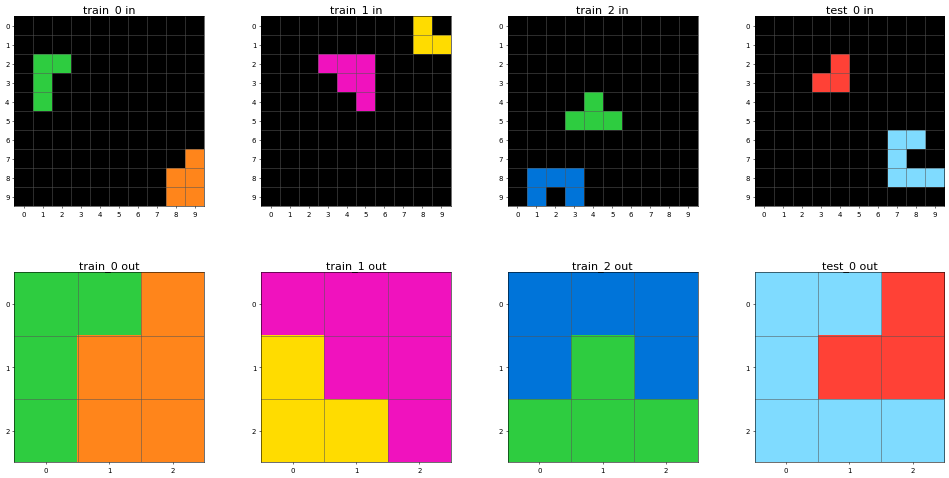

feca6190


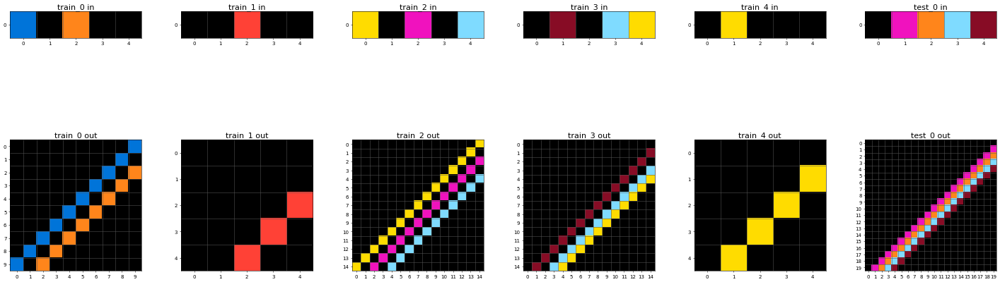

97a05b5b


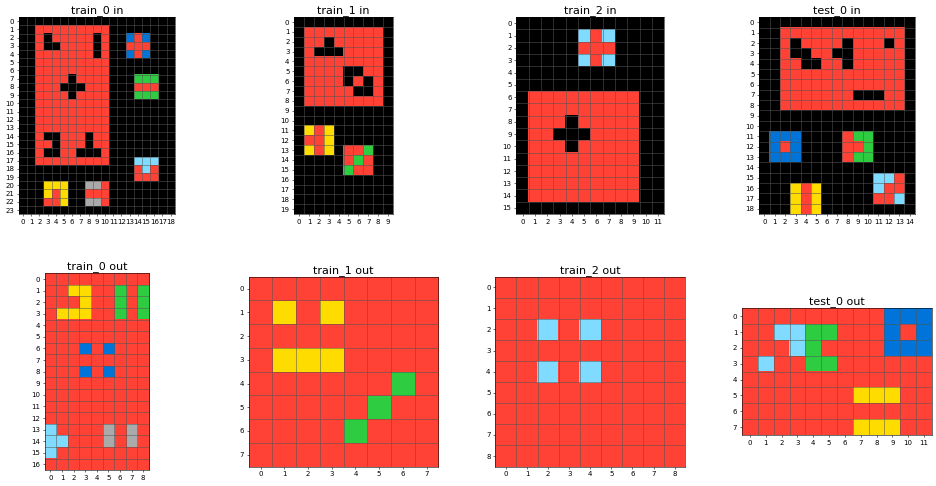

23b5c85d


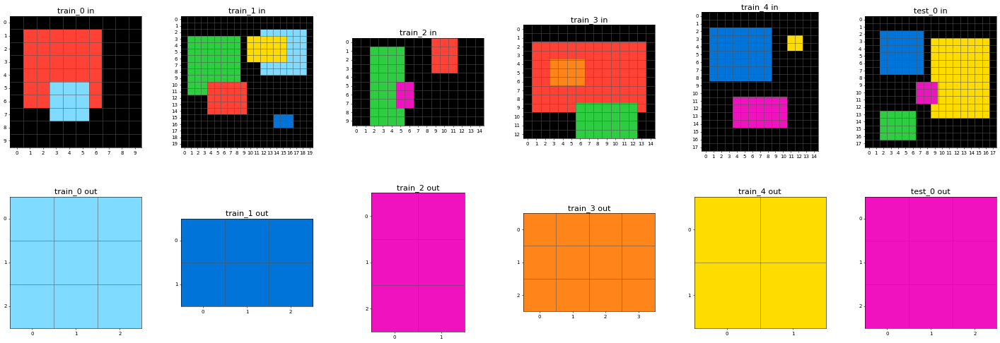

ce9e57f2


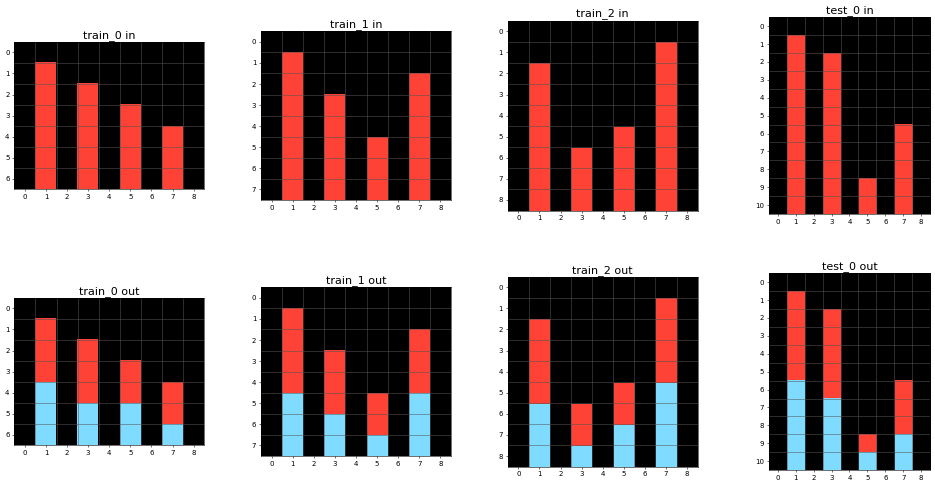

3eda0437


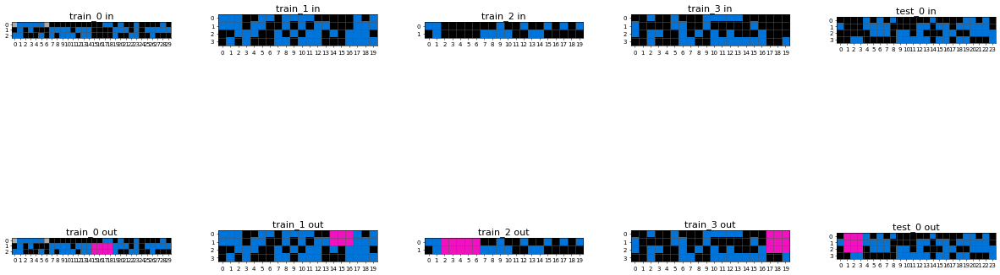

d364b489


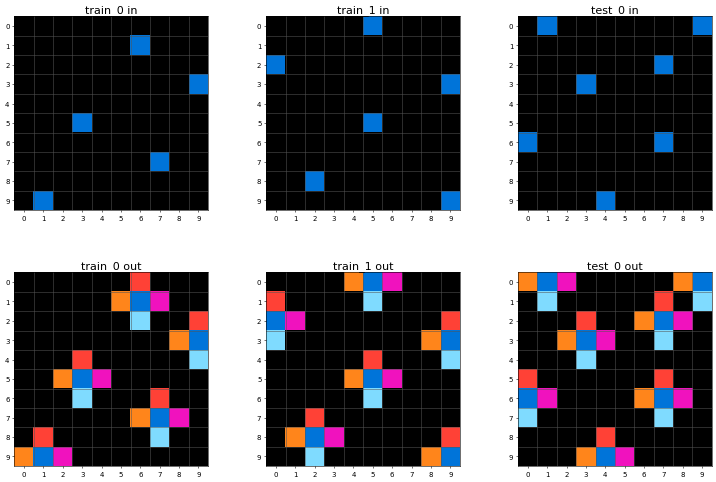

cdecee7f


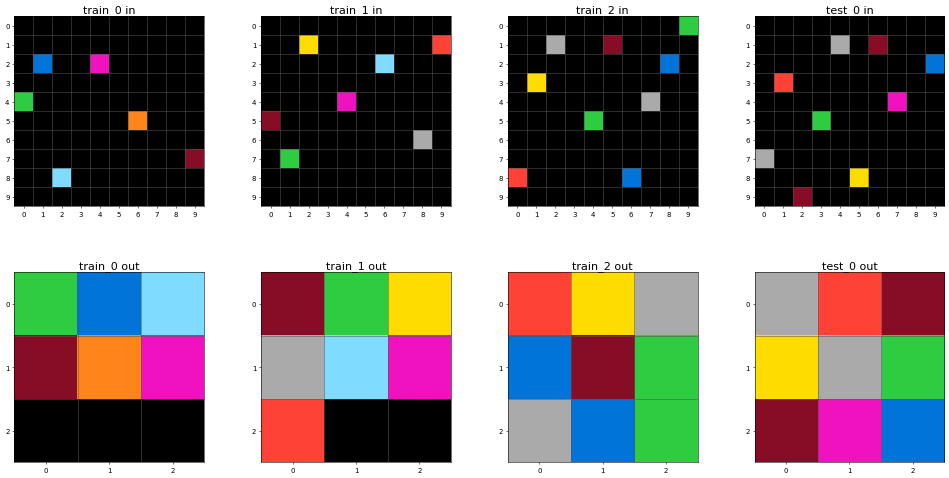

a9f96cdd


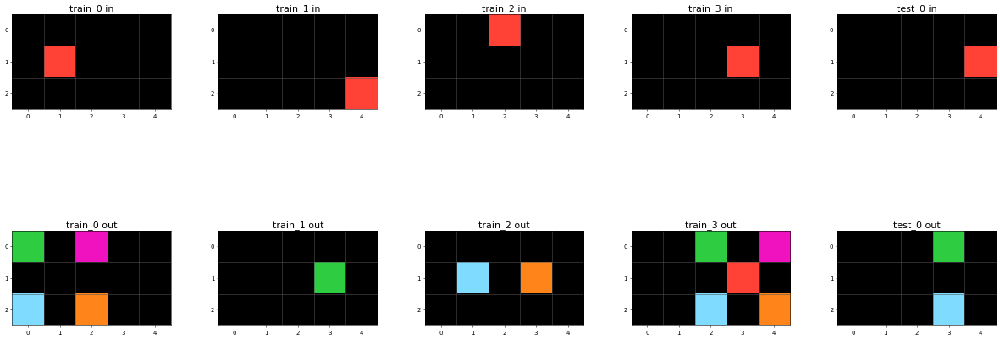

3618c87e


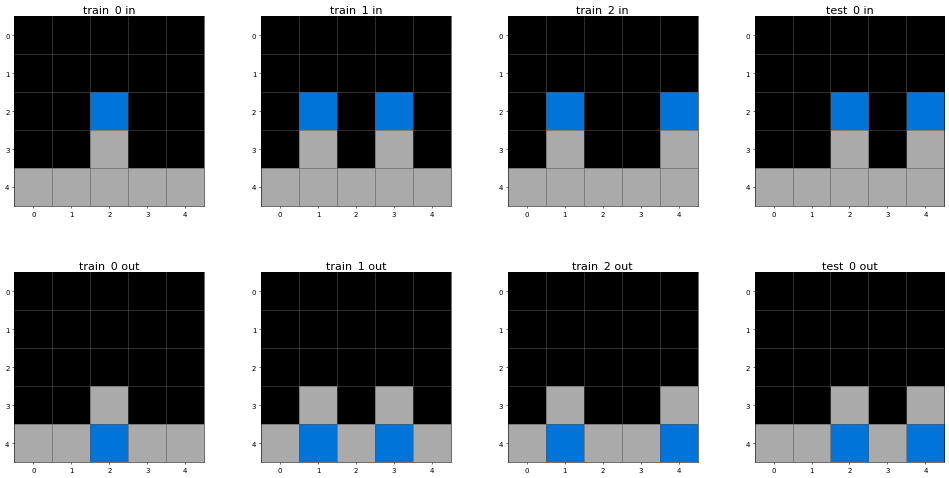

995c5fa3


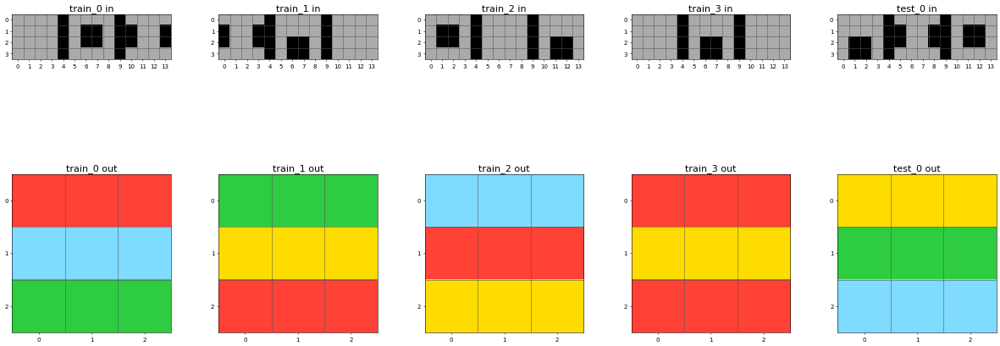

9172f3a0


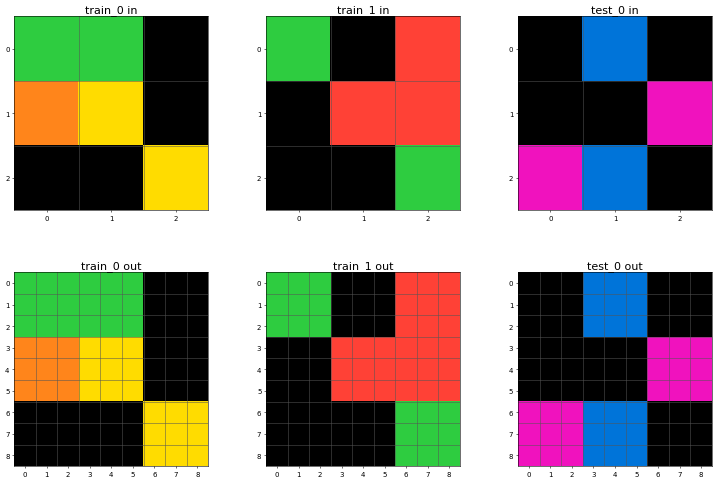

e98196ab


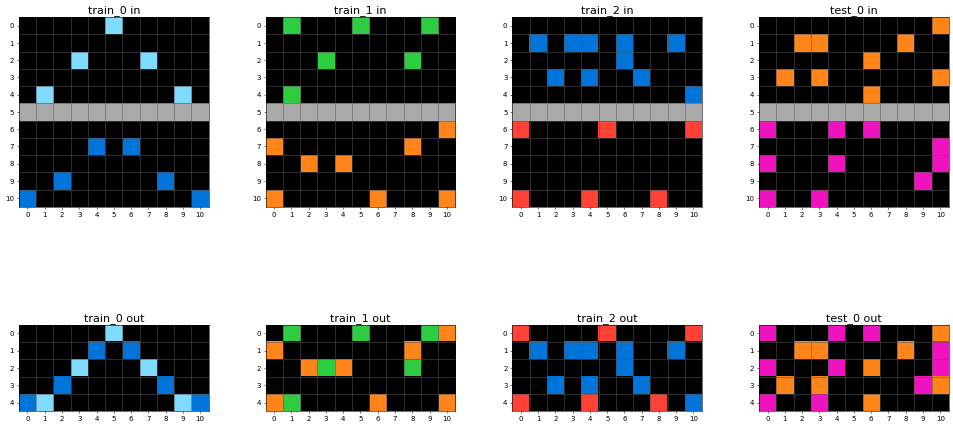

82819916


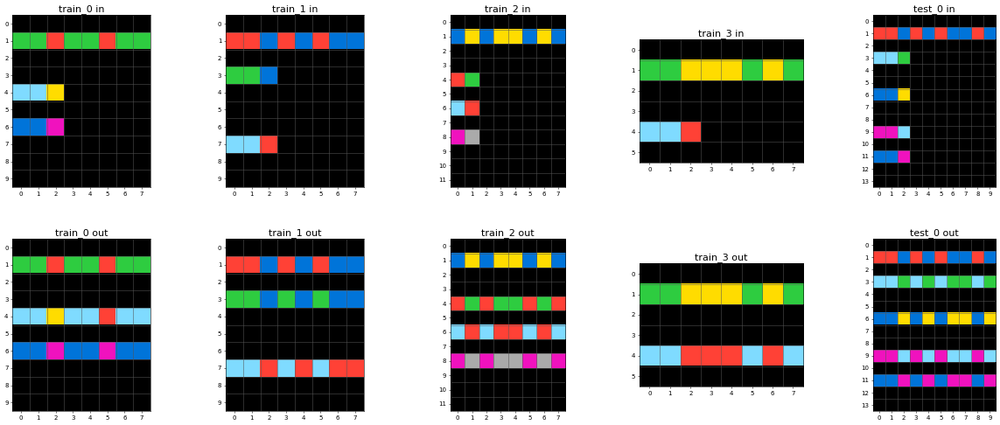

22168020


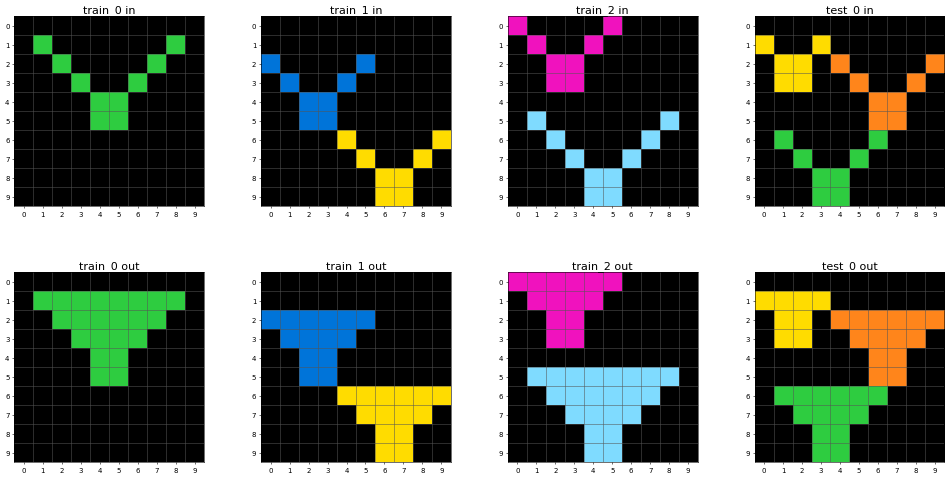

e9614598


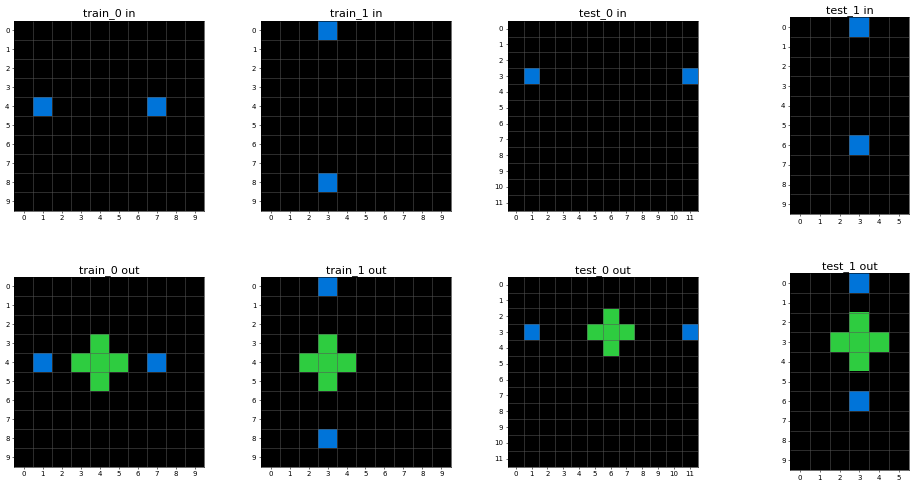

ba97ae07


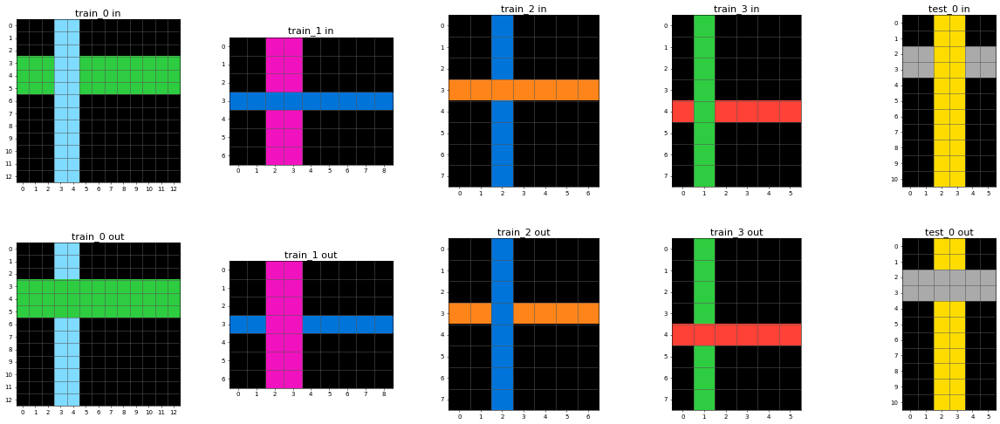

f8a8fe49


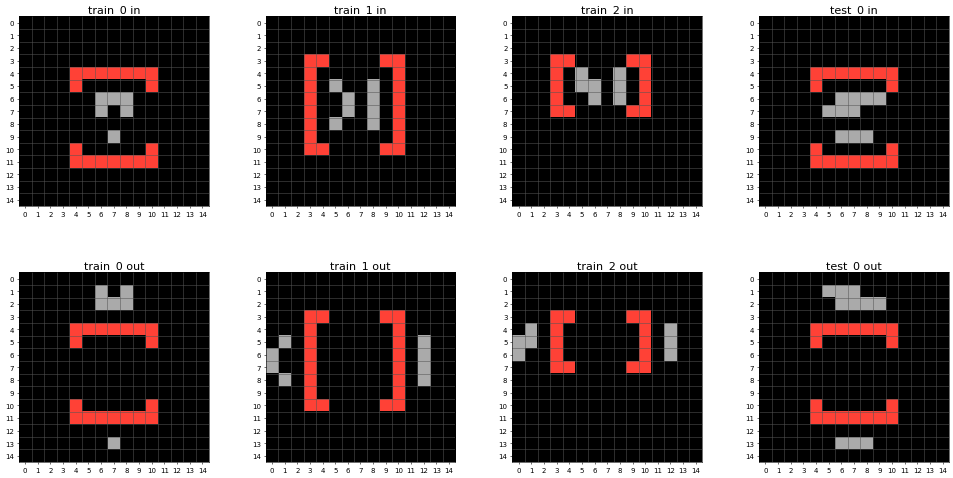

5c2c9af4


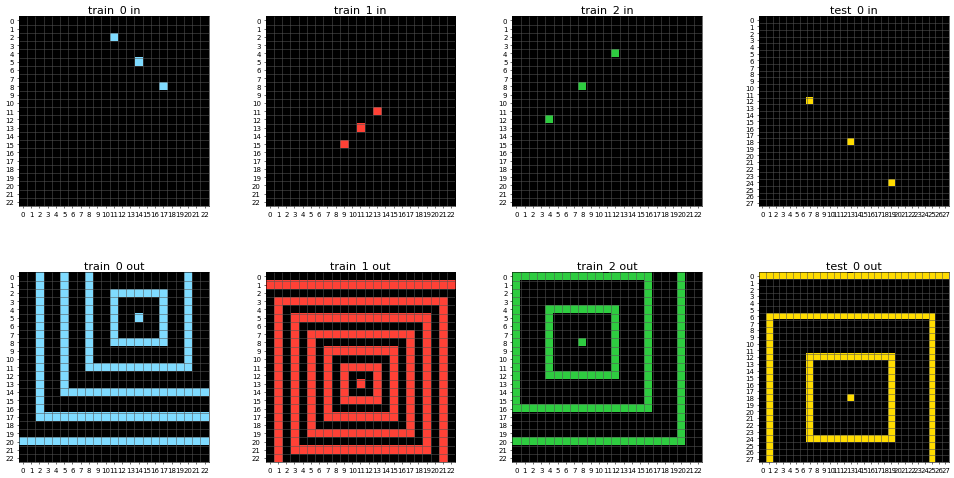

42a50994


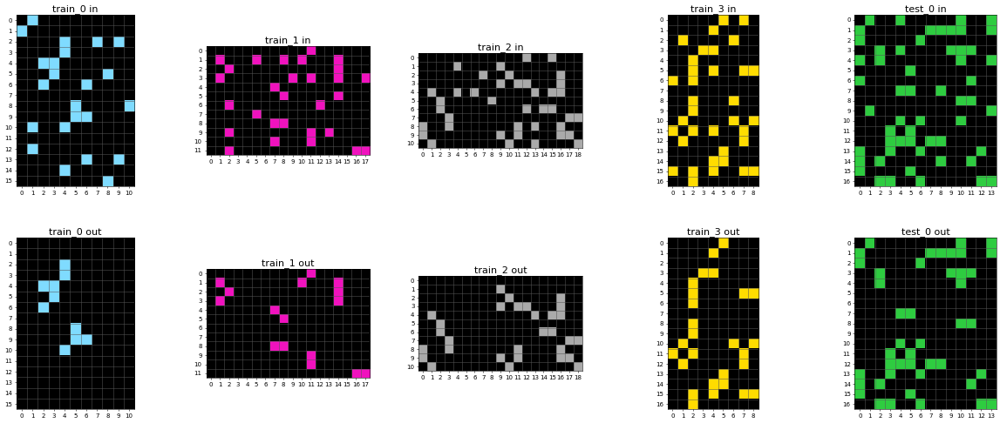

a79310a0


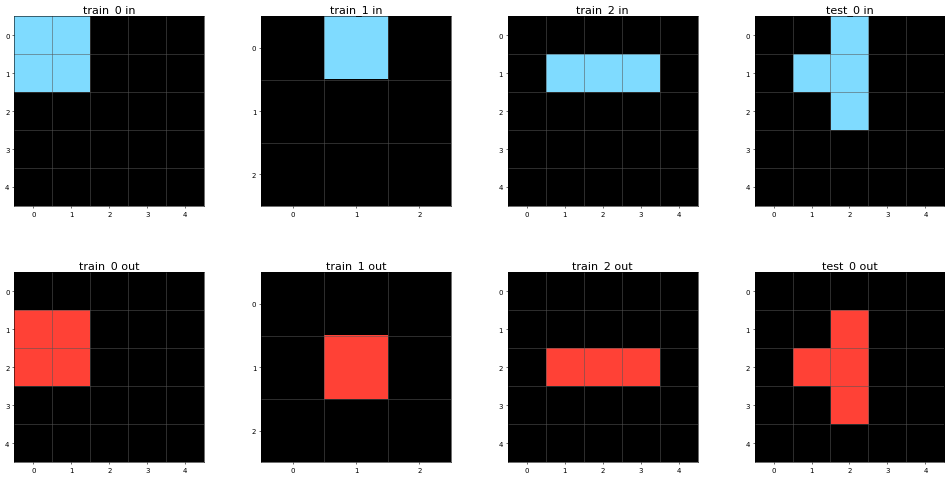

22eb0ac0


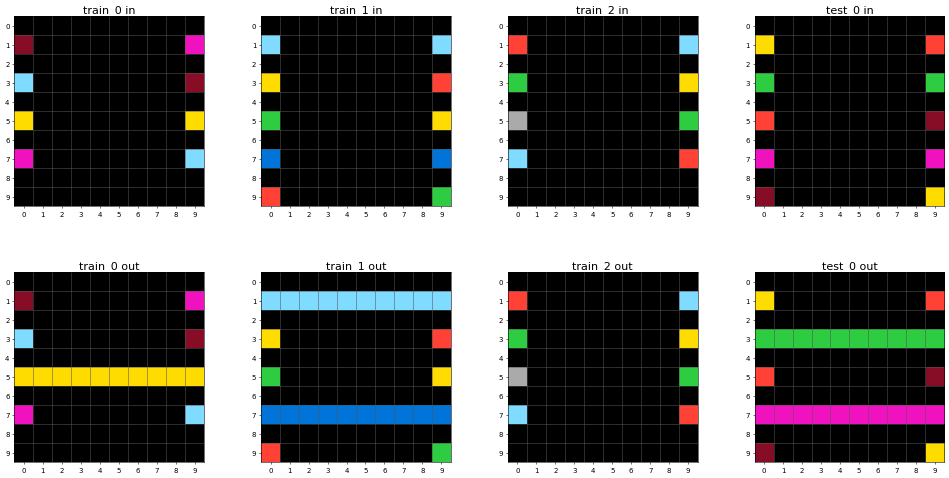

c0f76784


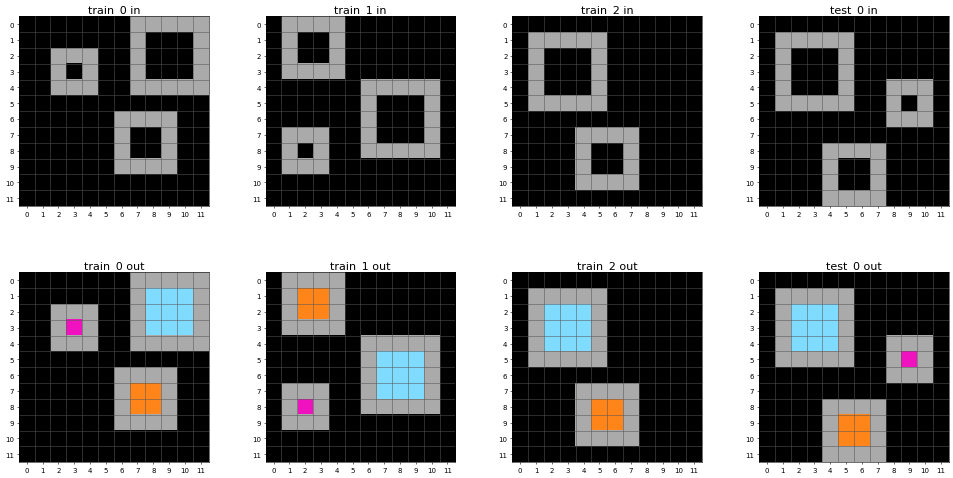

a8c38be5


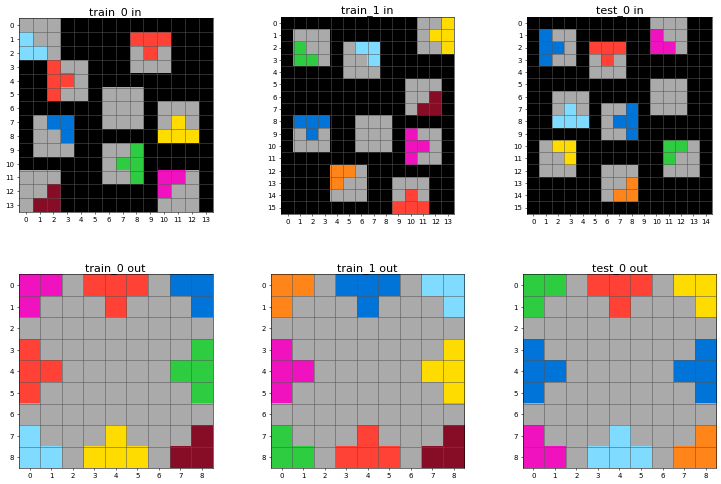

54d82841


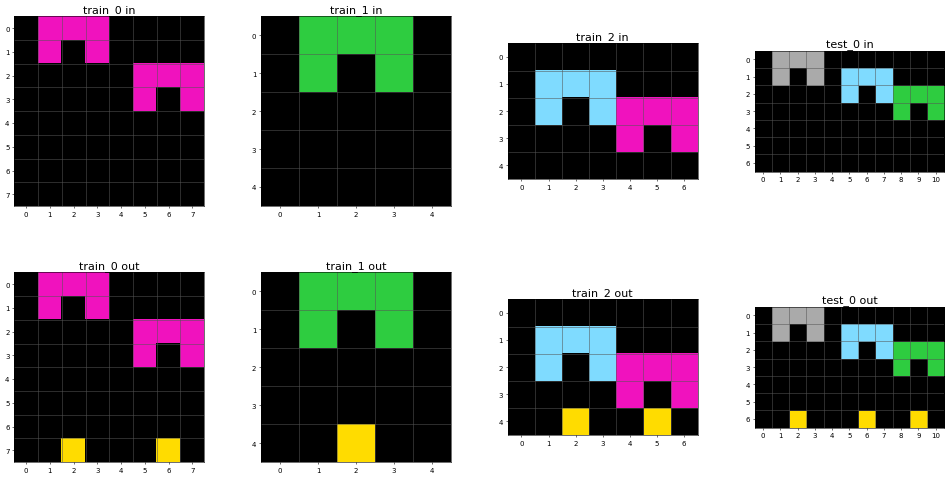

67e8384a


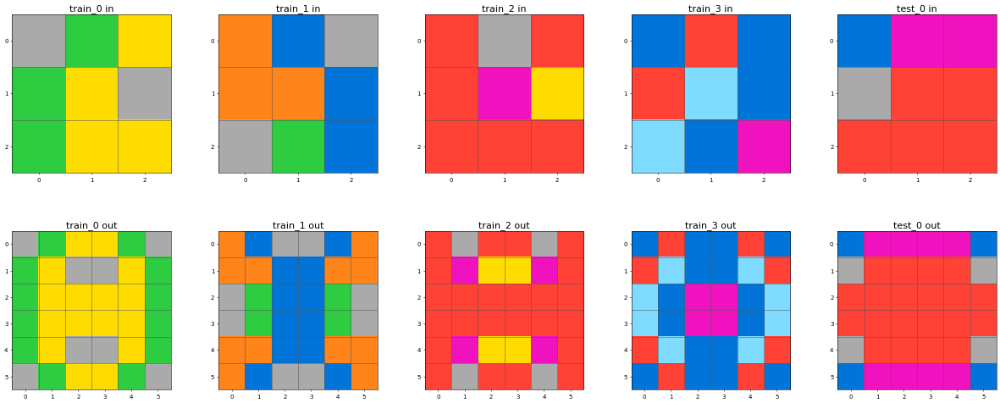

810b9b61


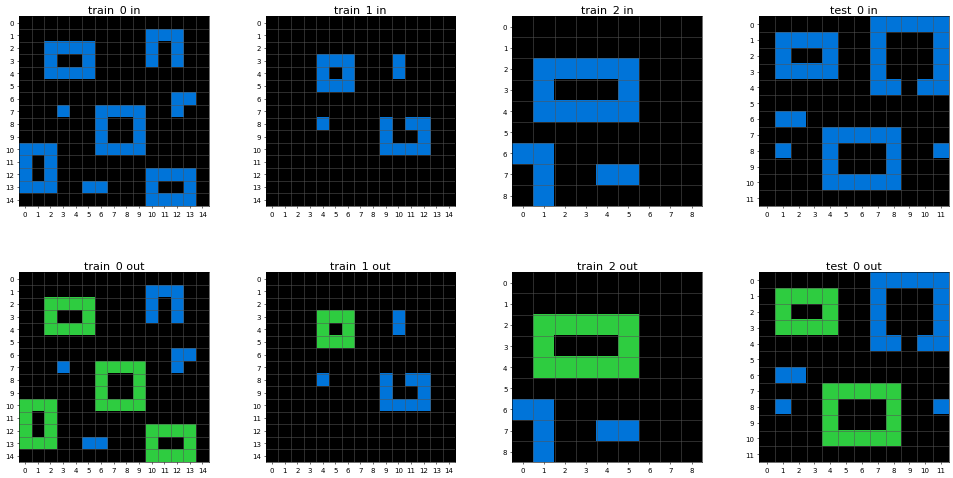

dc0a314f


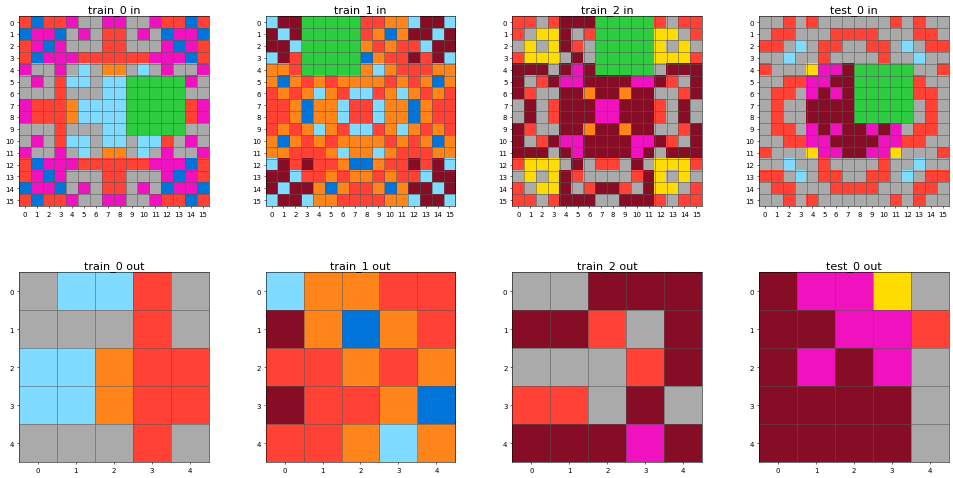

dbc1a6ce


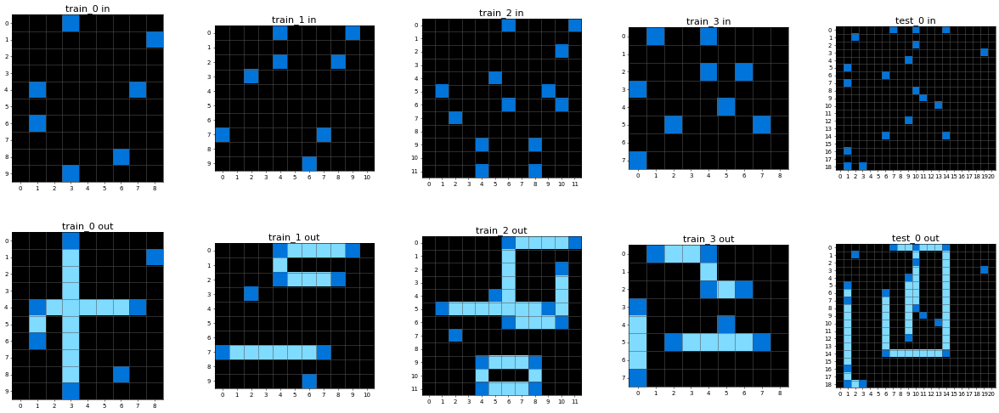

90f3ed37


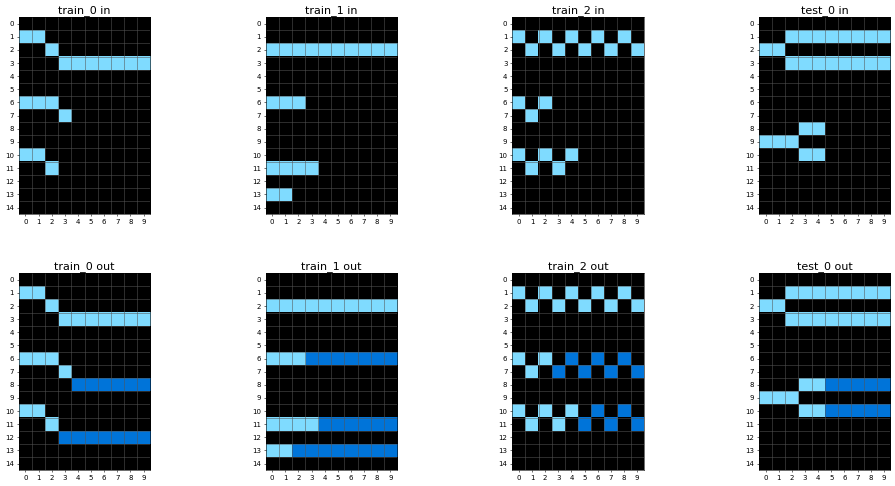

0dfd9992


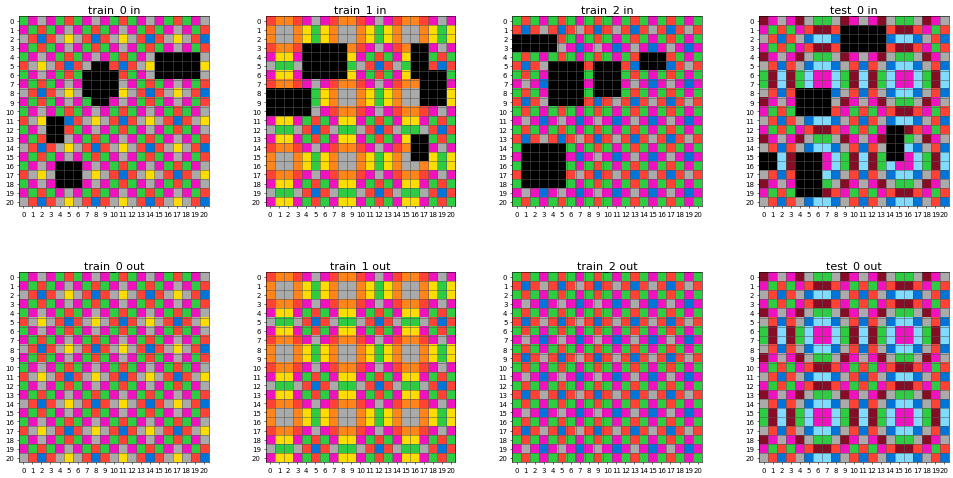

db93a21d


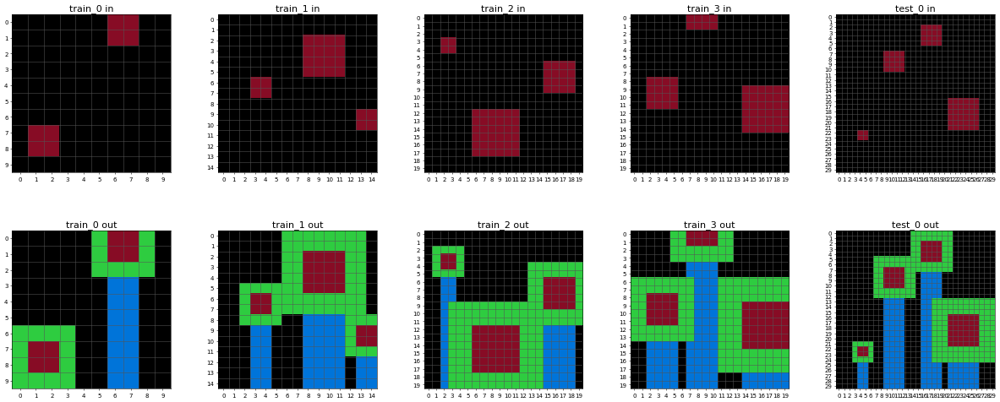

67a3c6ac


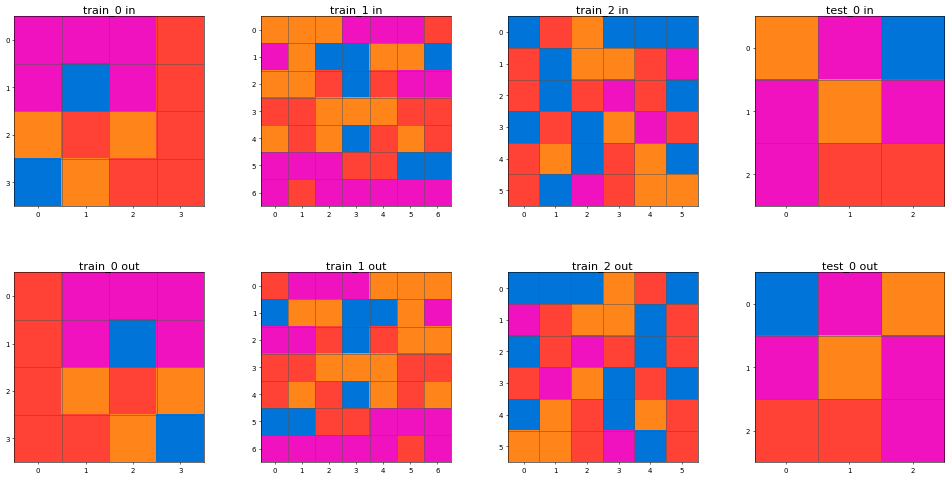

93b581b8


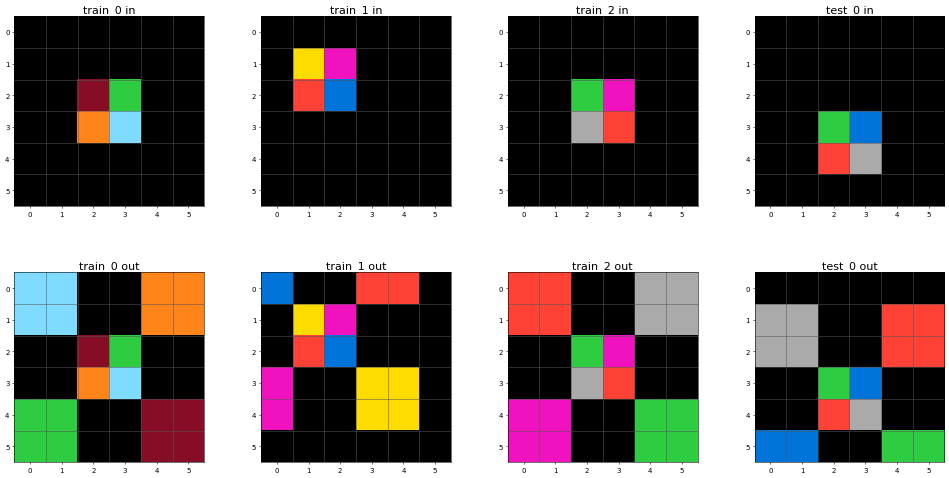

99b1bc43


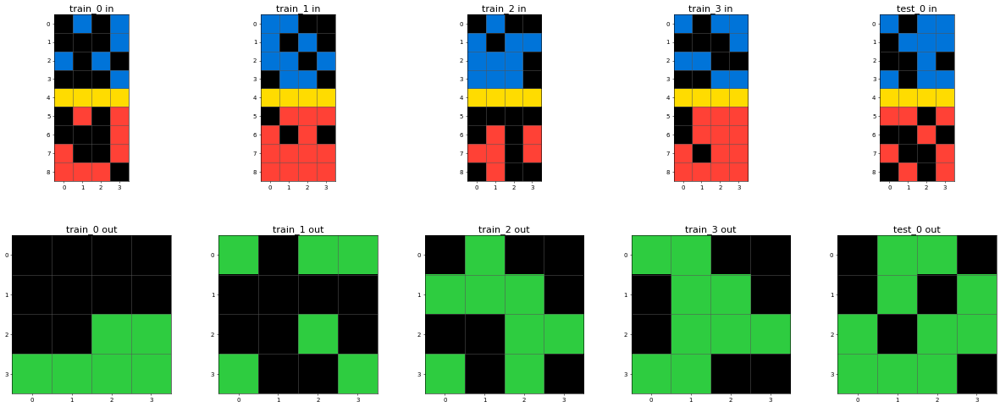

8731374e


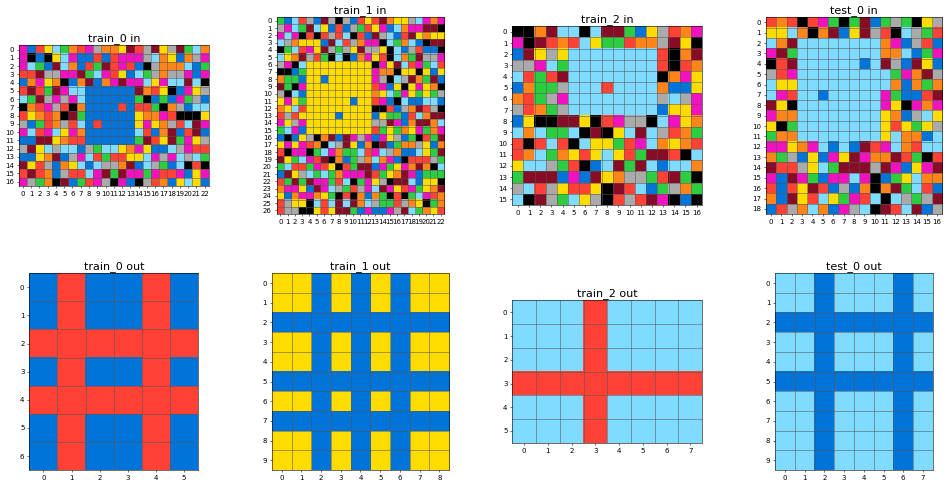

c909285e


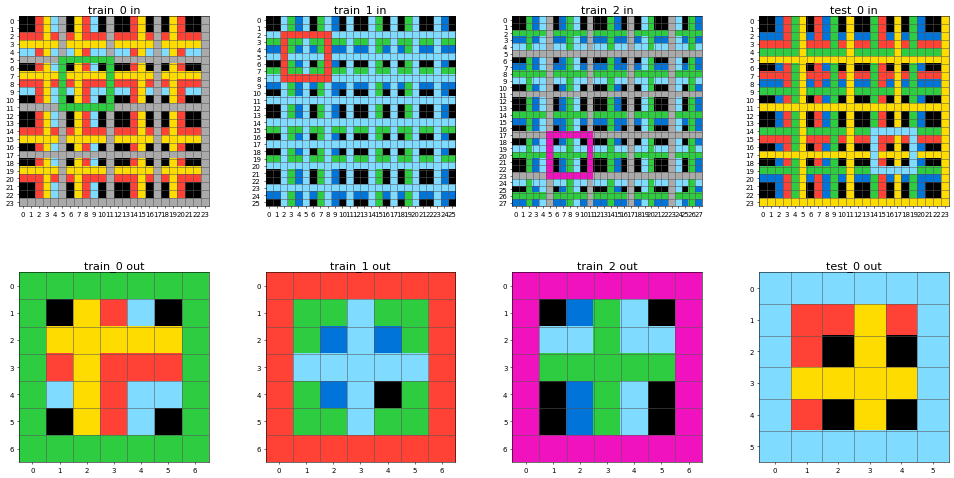

d037b0a7


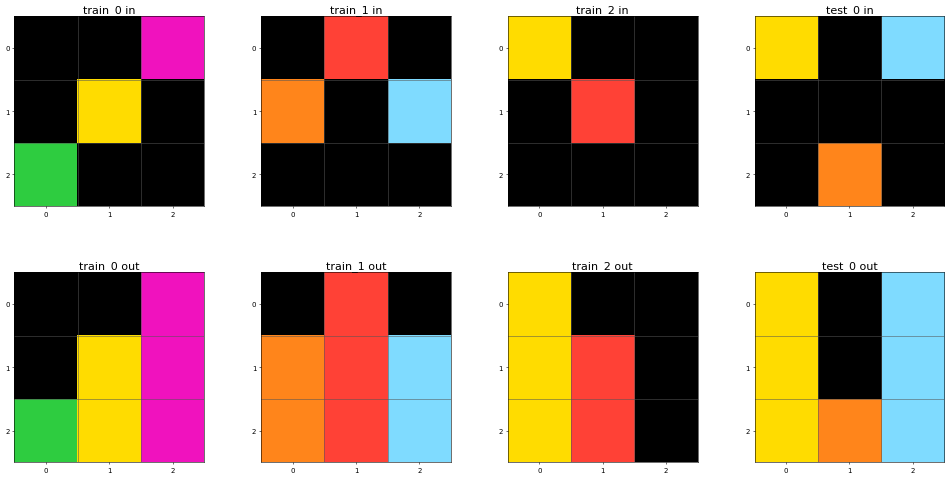

6773b310


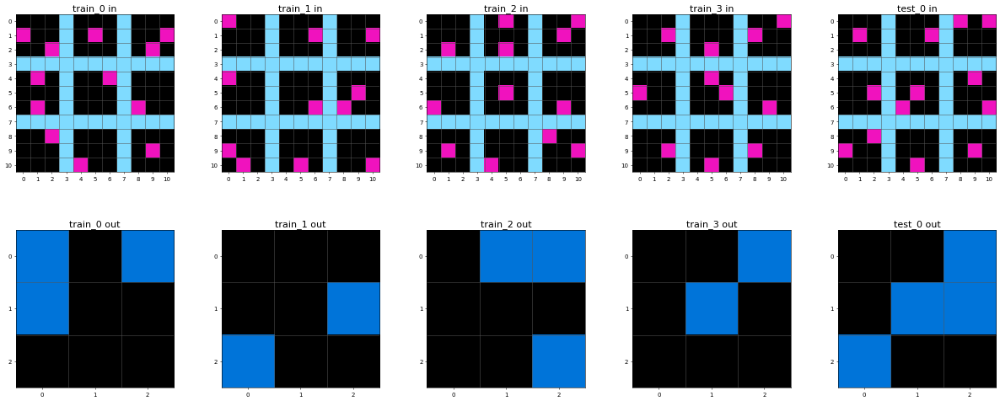

ff805c23


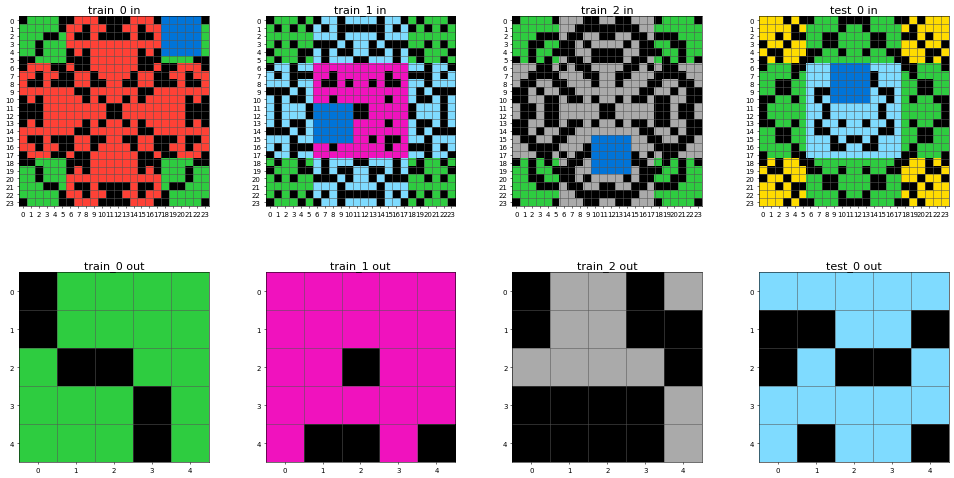

95990924


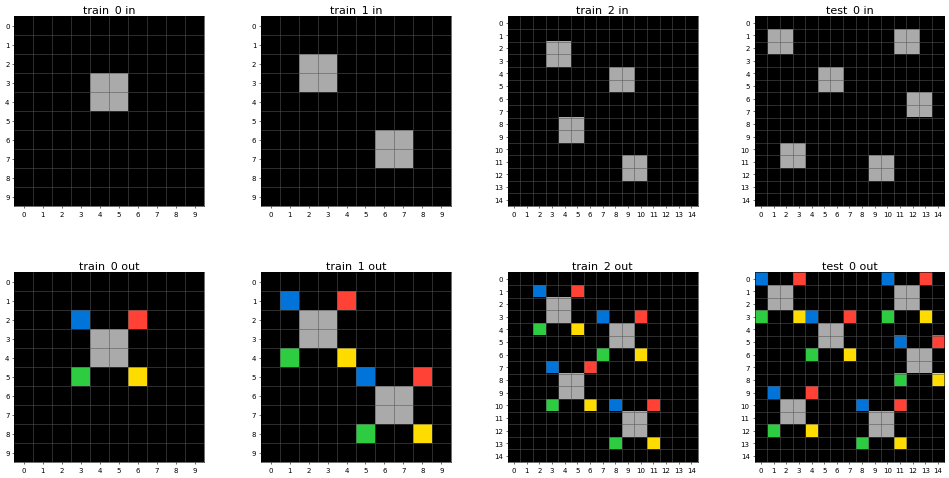

1f876c06


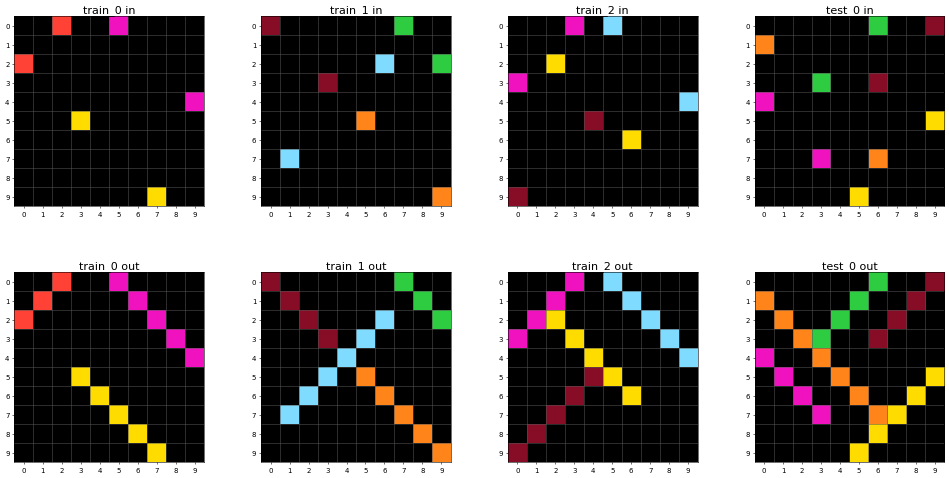

e3497940


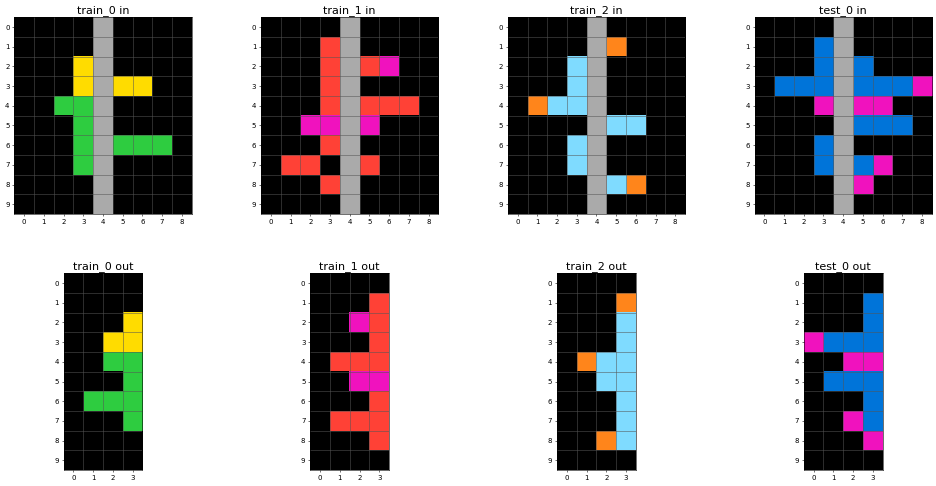

af902bf9


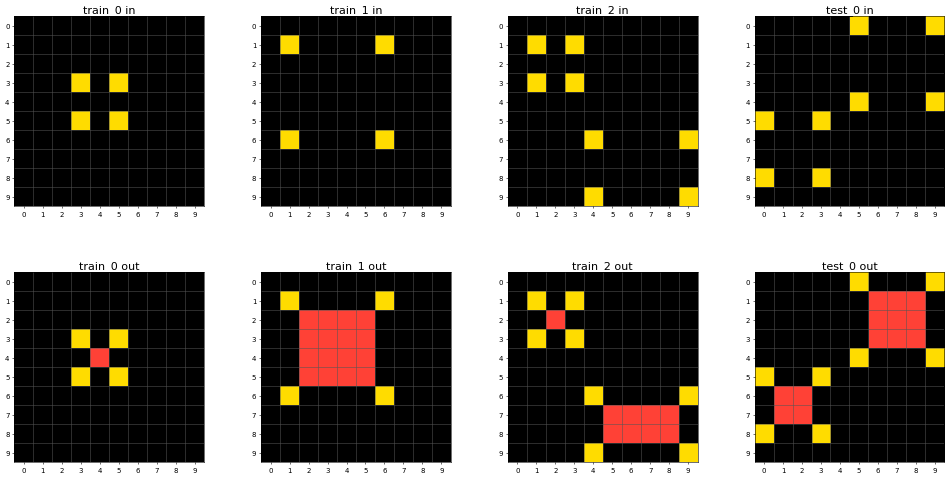

3e980e27


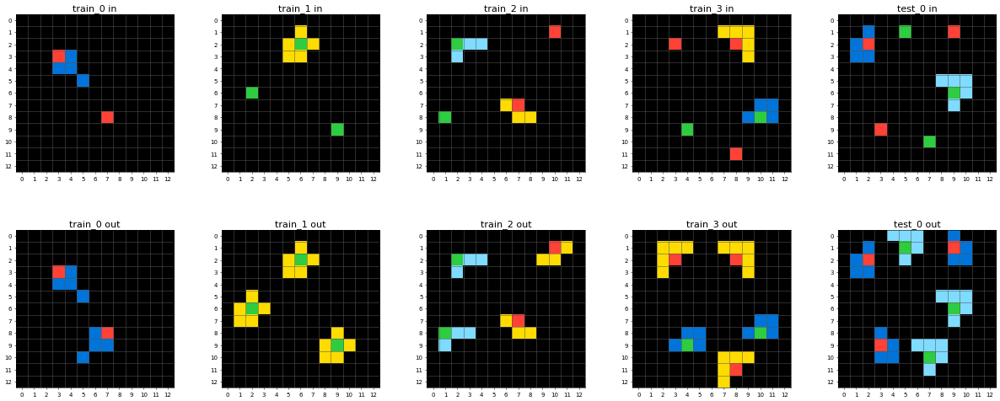

1190e5a7


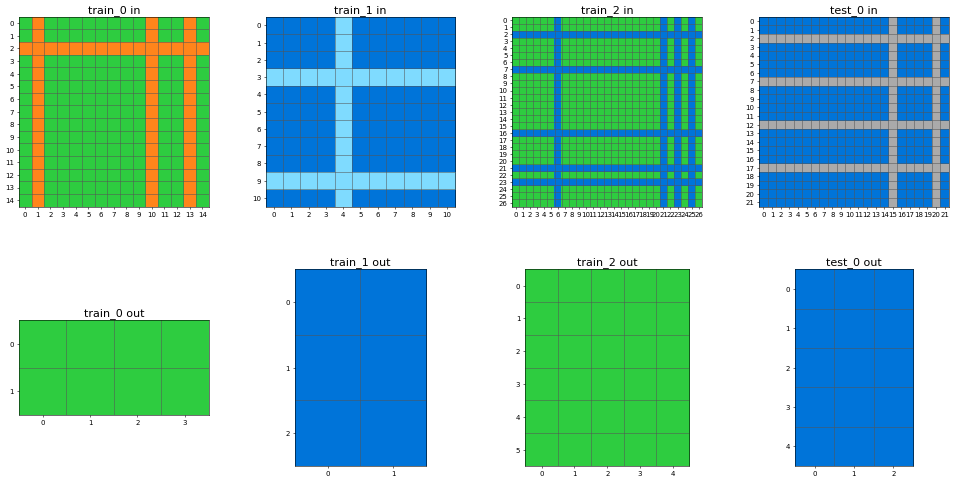

5117e062


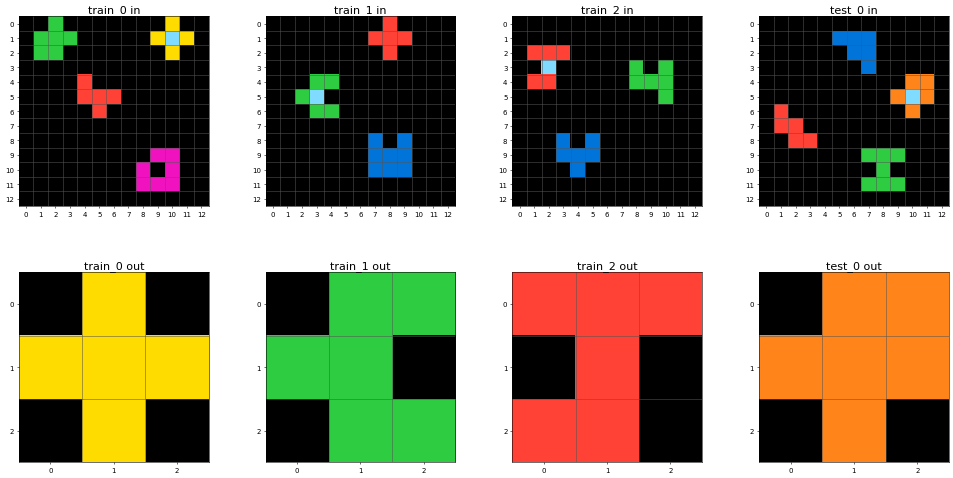

4347f46a


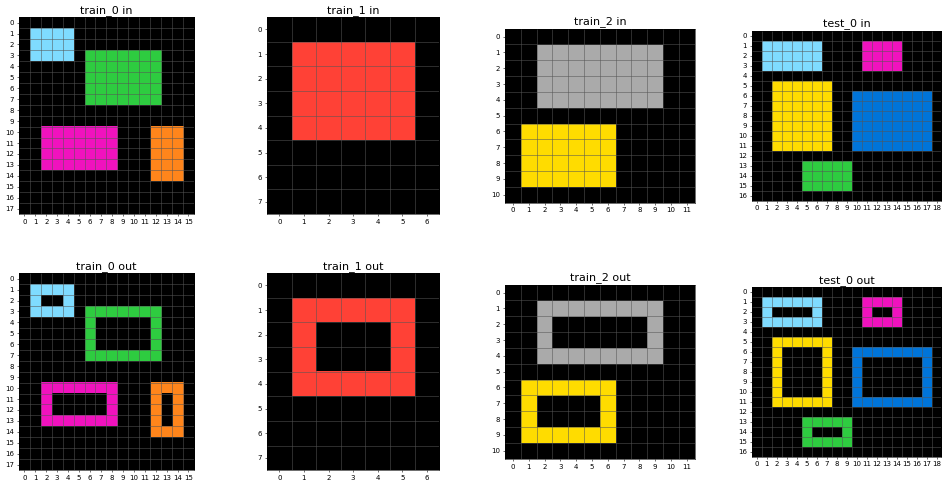

746b3537


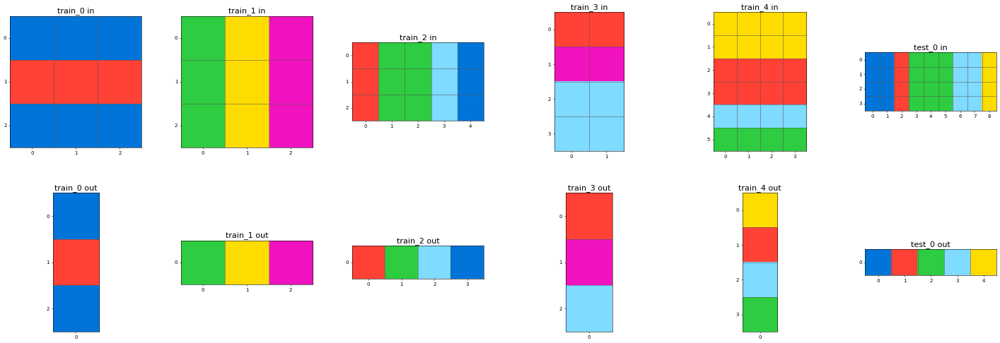

272f95fa


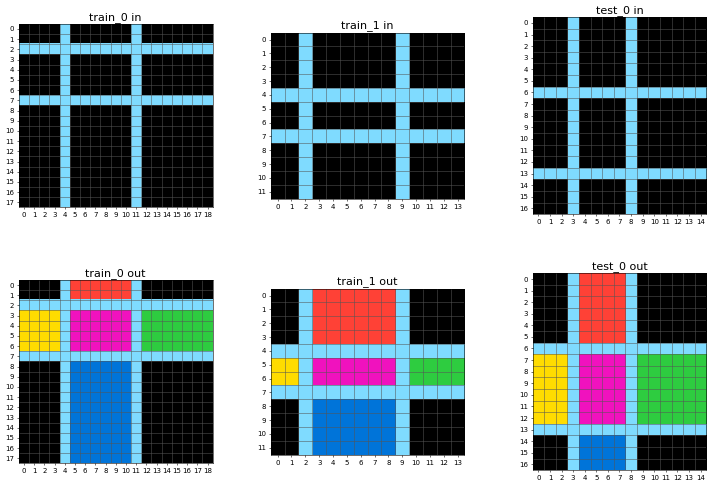

2dd70a9a


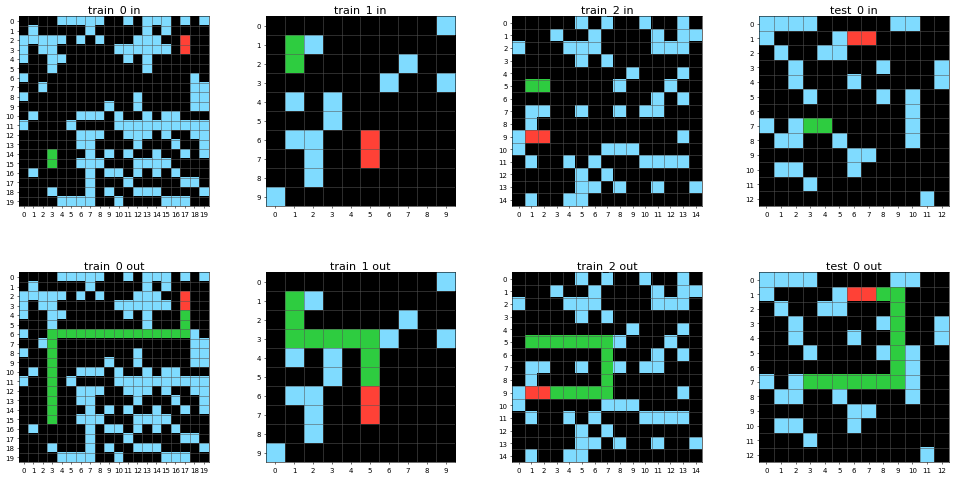

eb5a1d5d


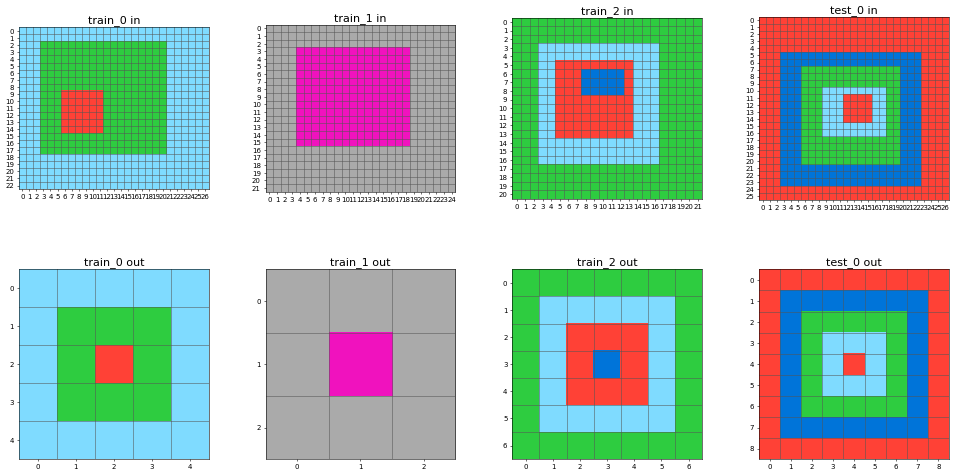

57aa92db


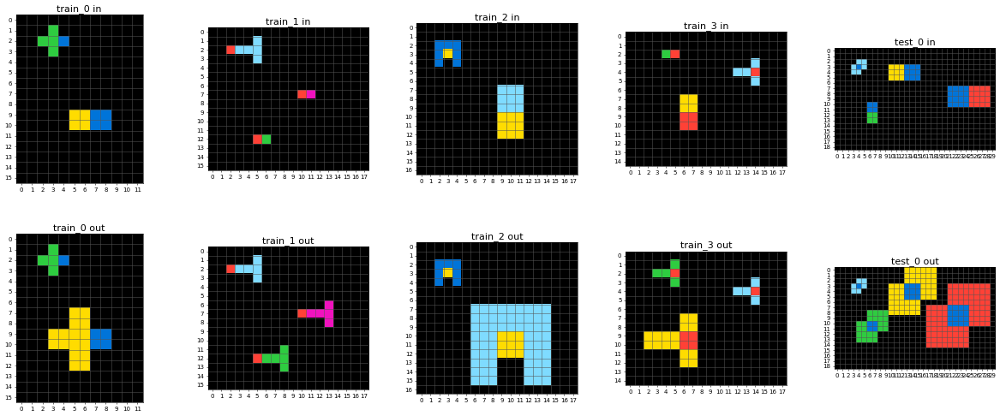

363442ee


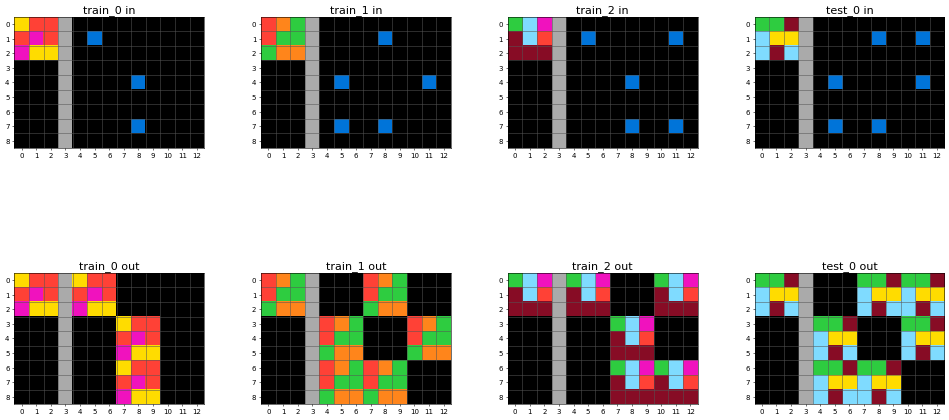

88a10436


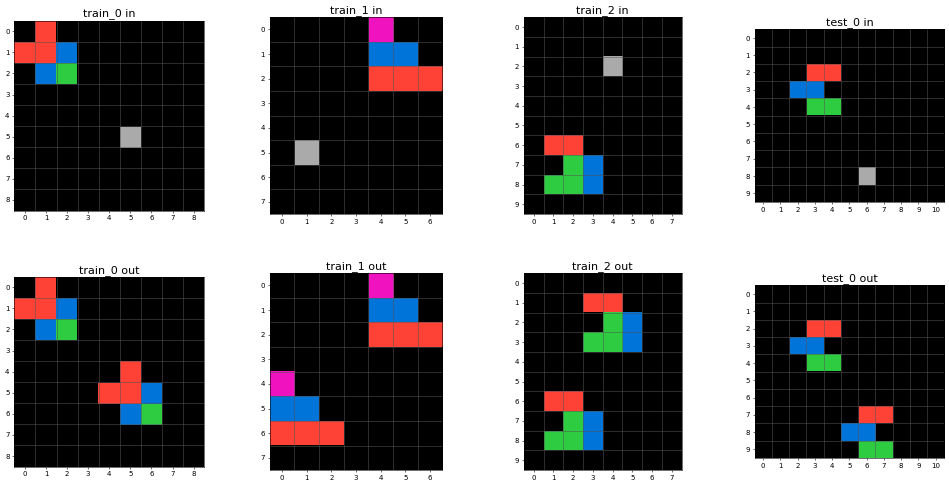

00d62c1b


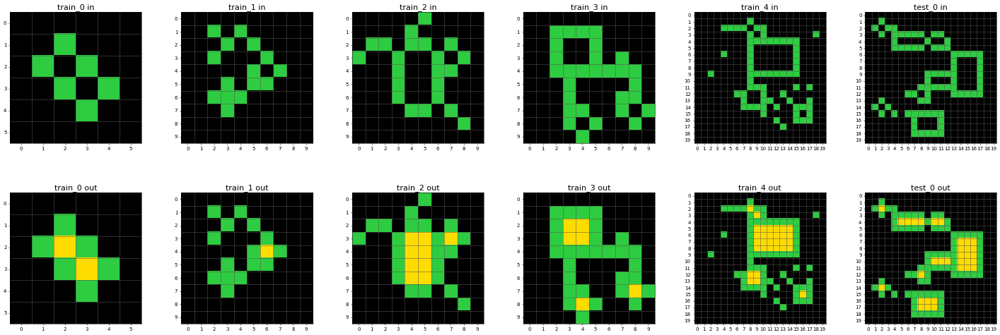

5168d44c


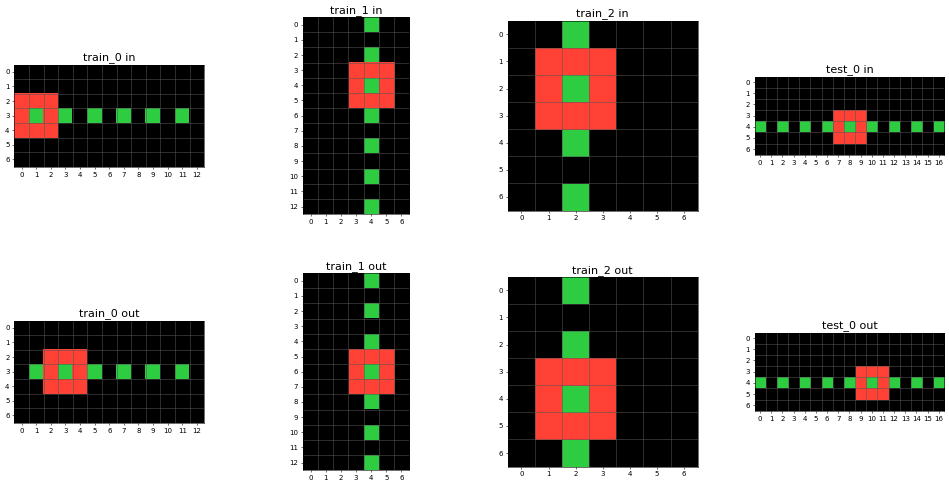

56dc2b01


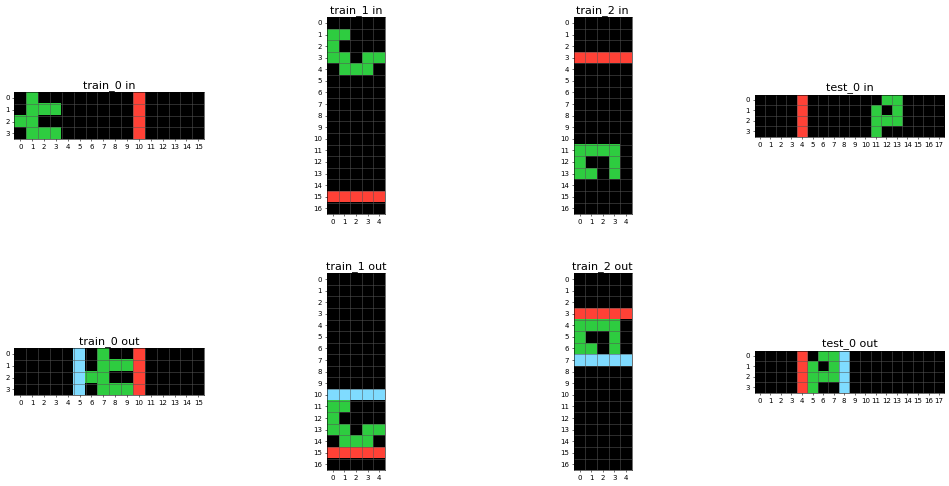

c3f564a4


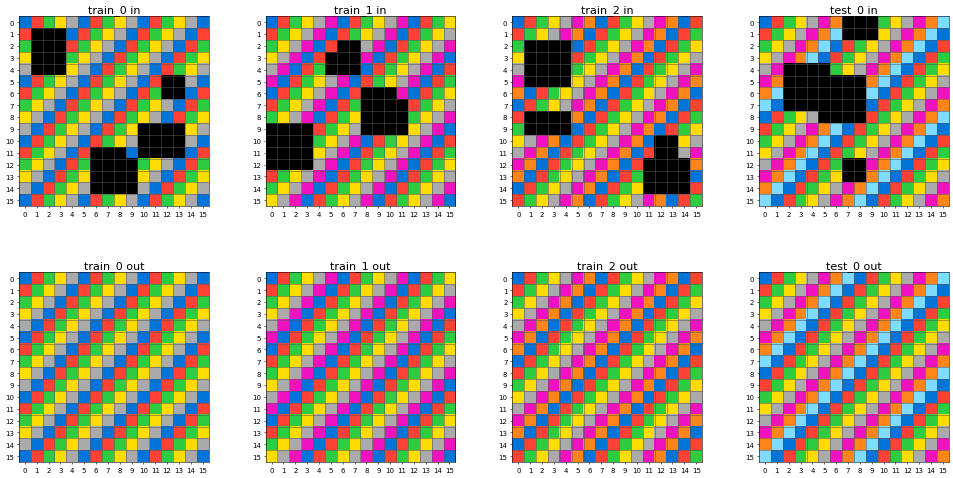

fafffa47


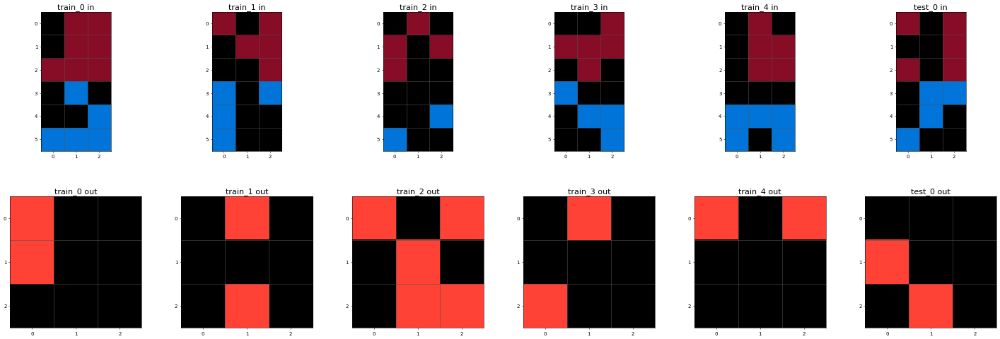

b7249182


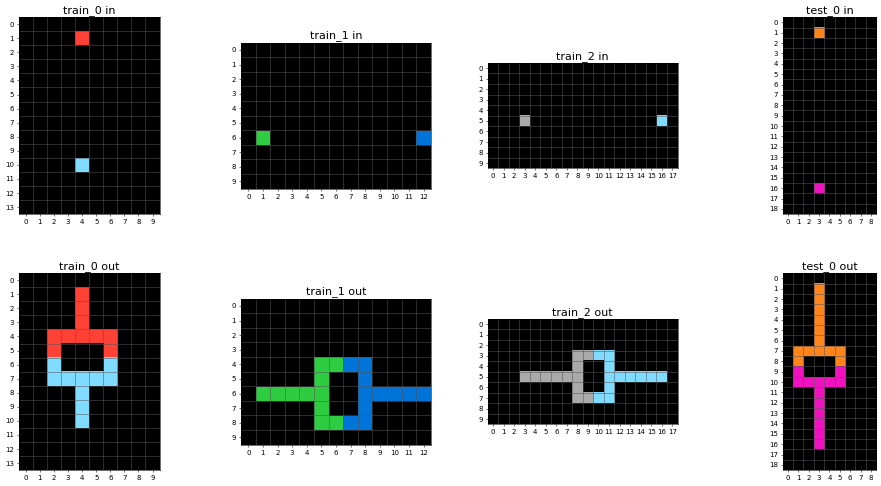

846bdb03


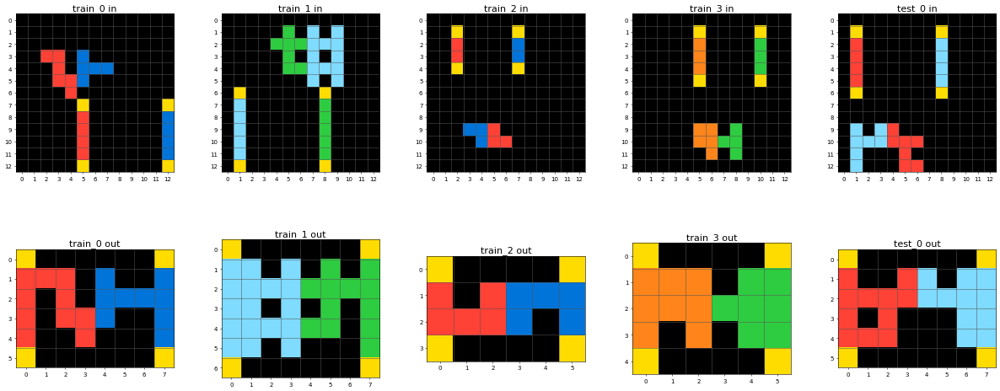

8be77c9e


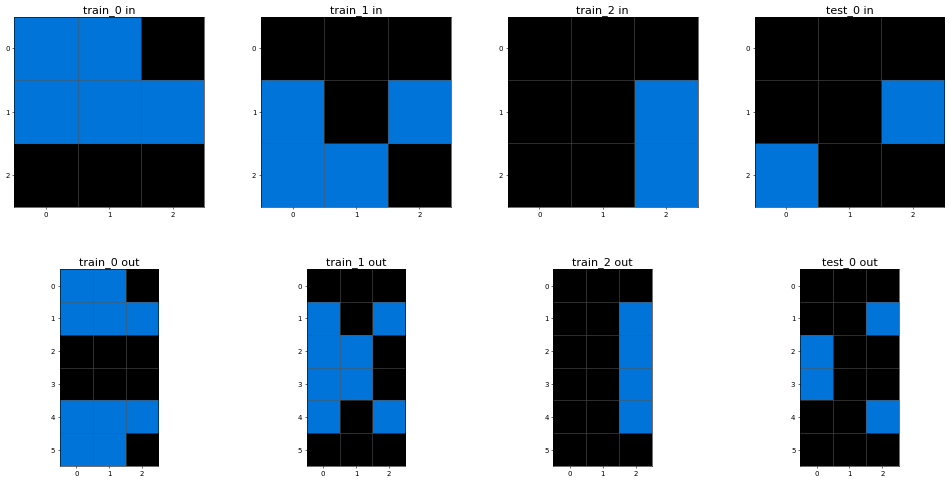

b0c4d837


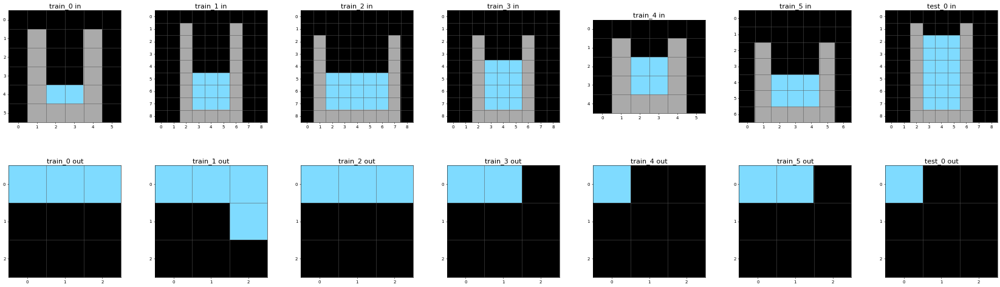

d9fac9be


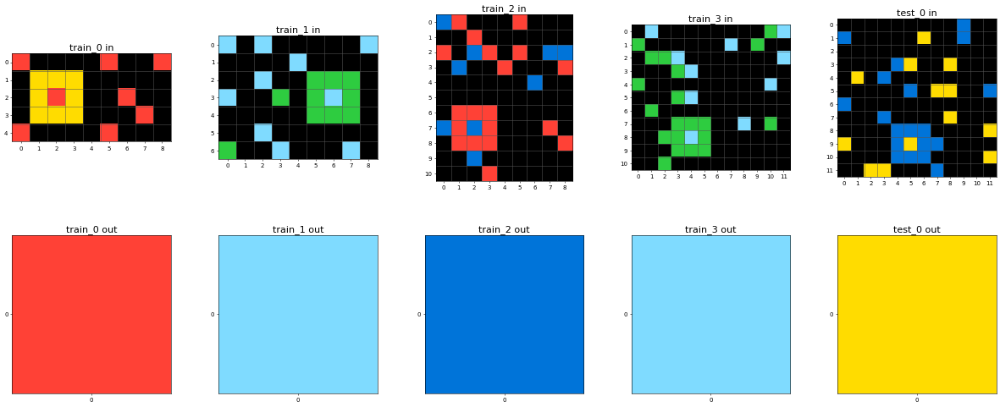

b6afb2da


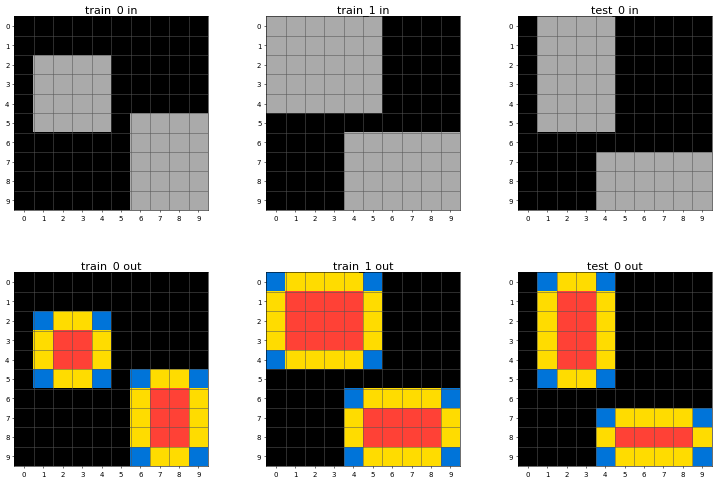

c9f8e694


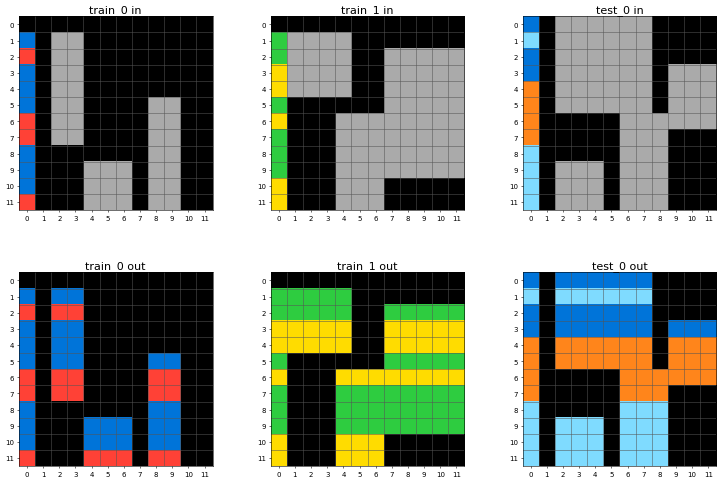

025d127b


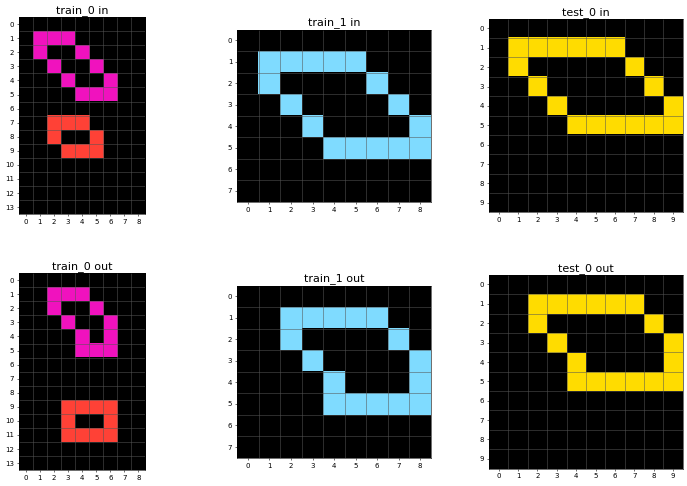

b190f7f5


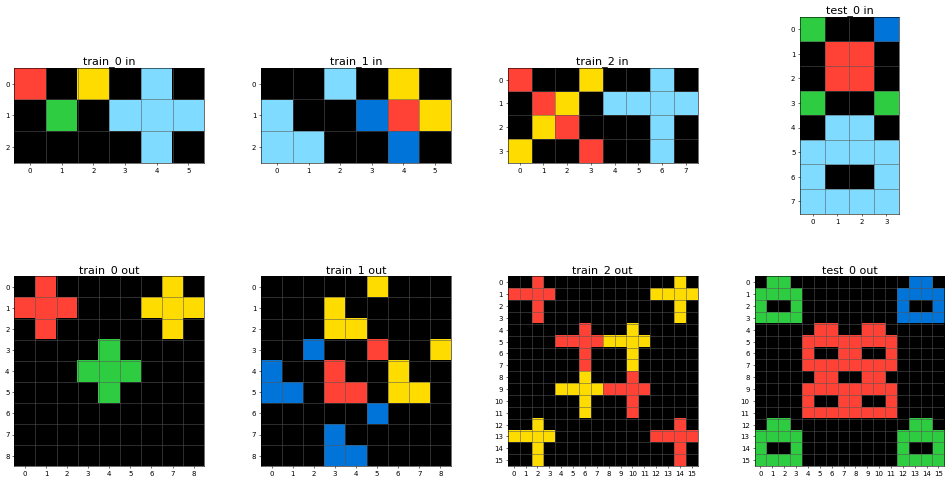

e509e548


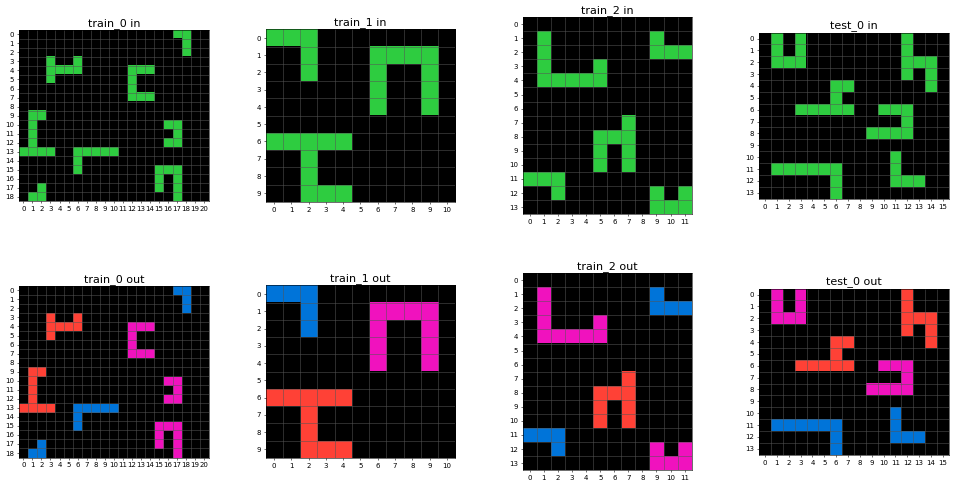

e48d4e1a


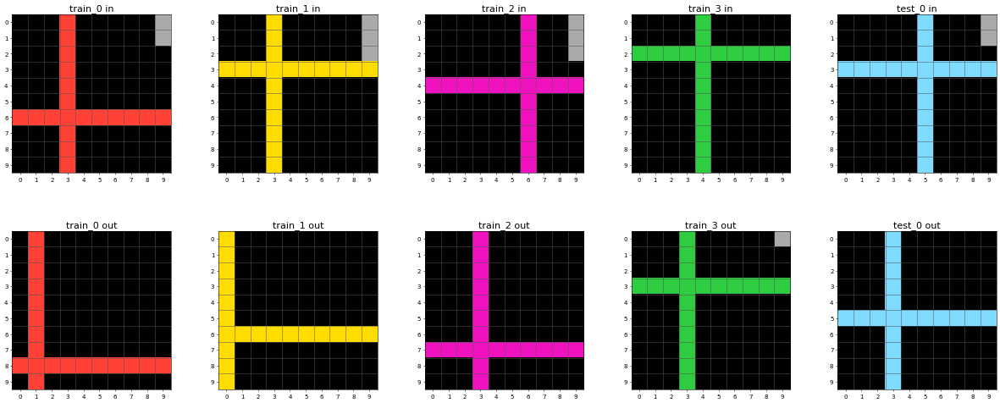

bd4472b8


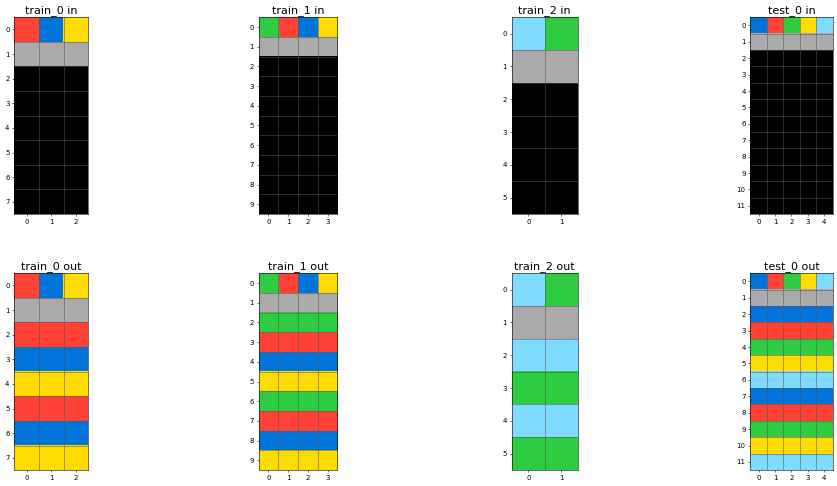

e40b9e2f


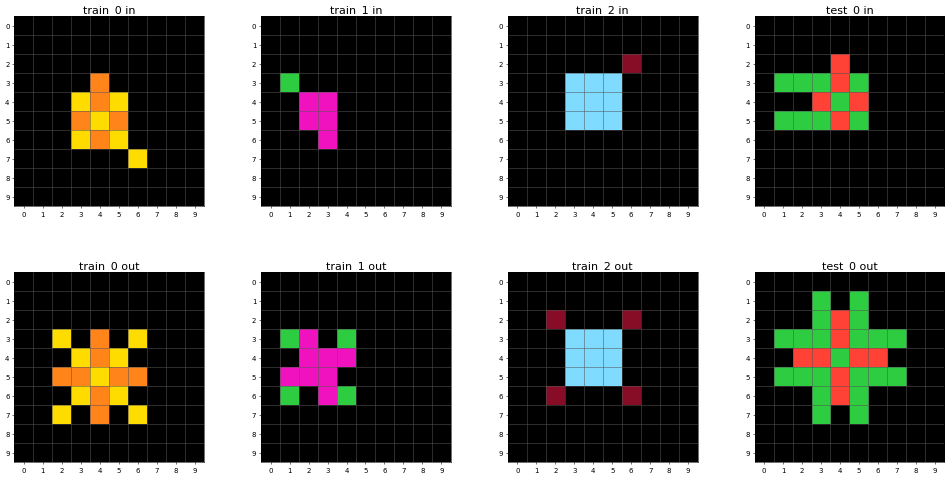

22233c11


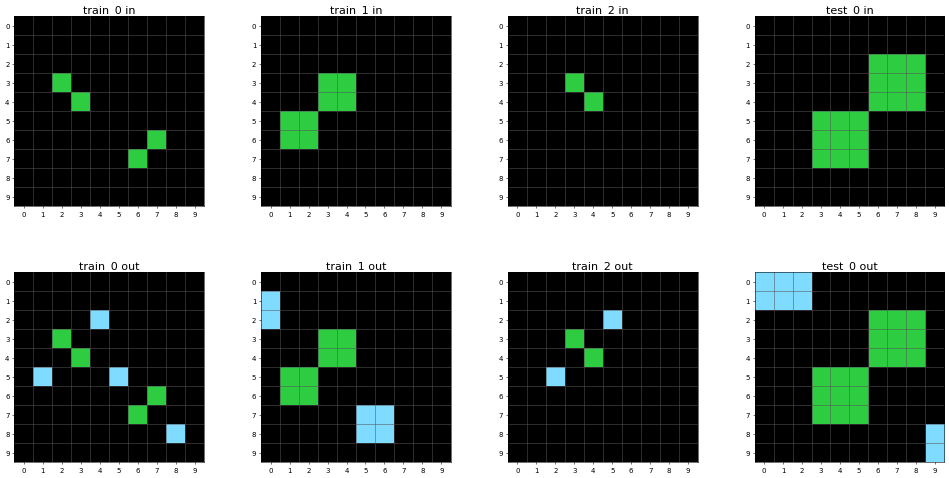

0ca9ddb6


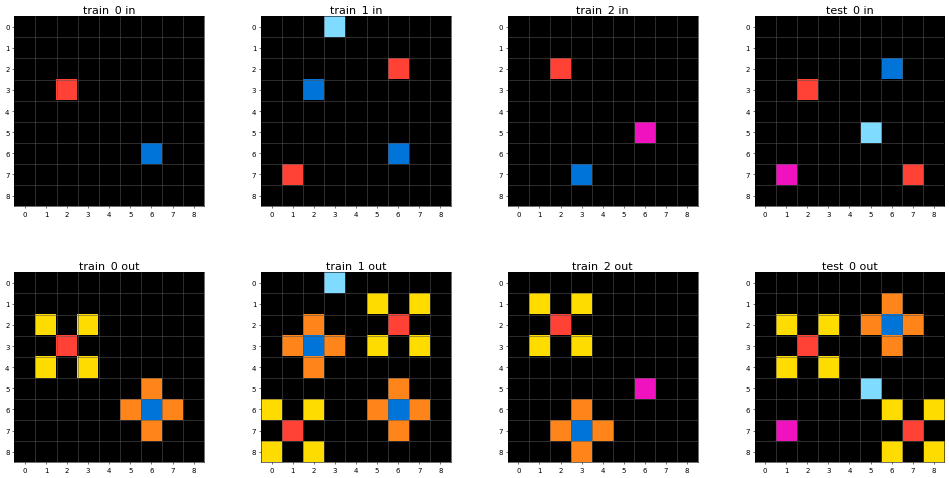

e73095fd


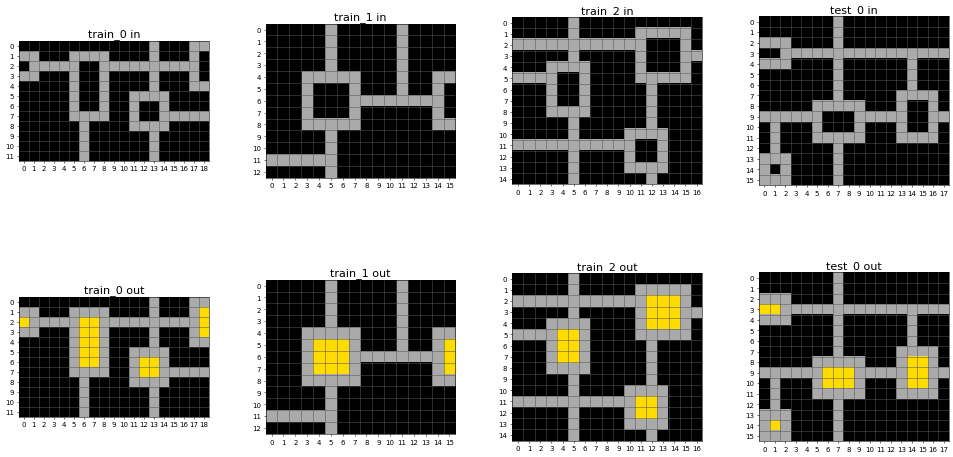

11852cab


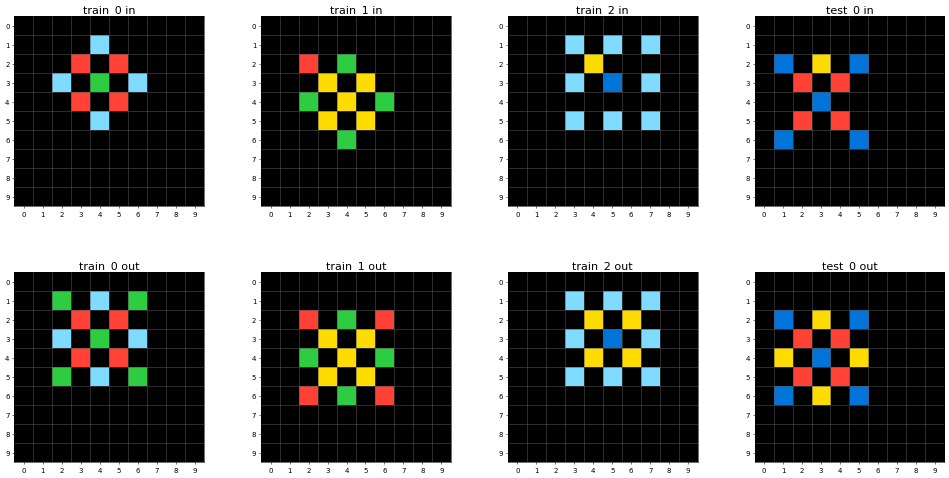

a8d7556c


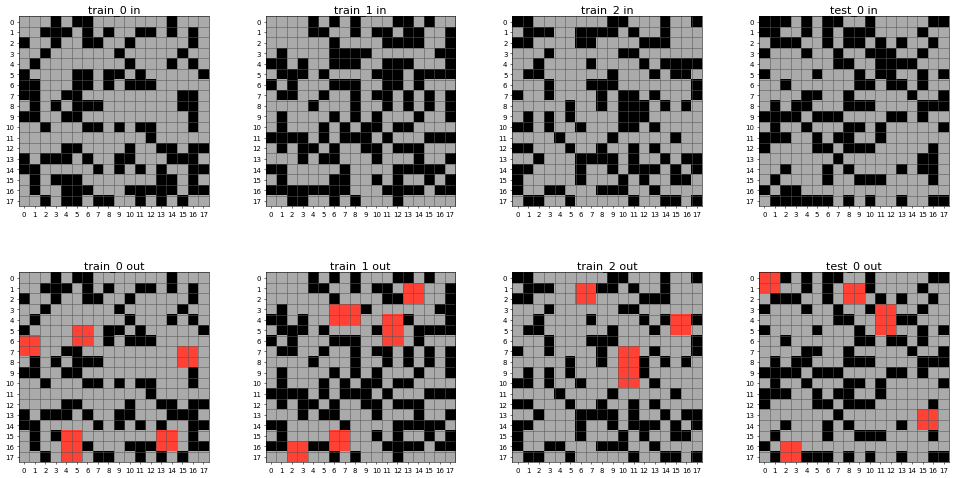

e8dc4411


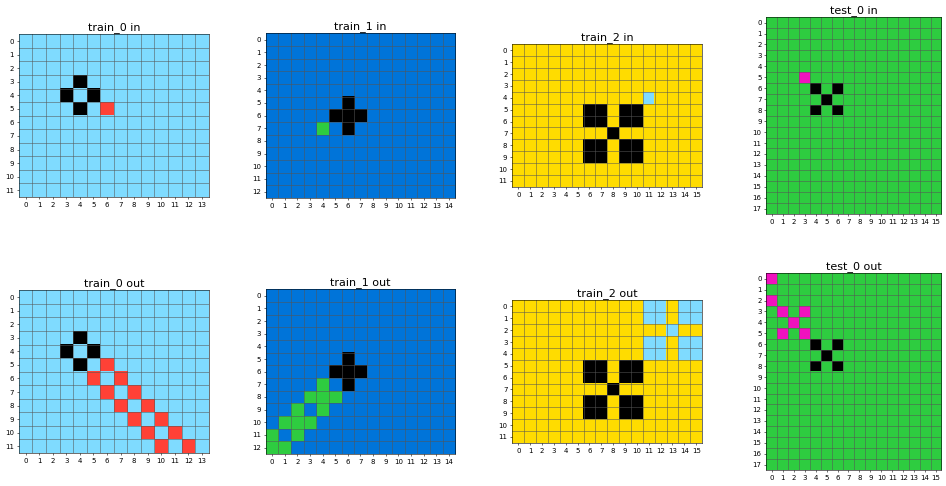

10fcaaa3


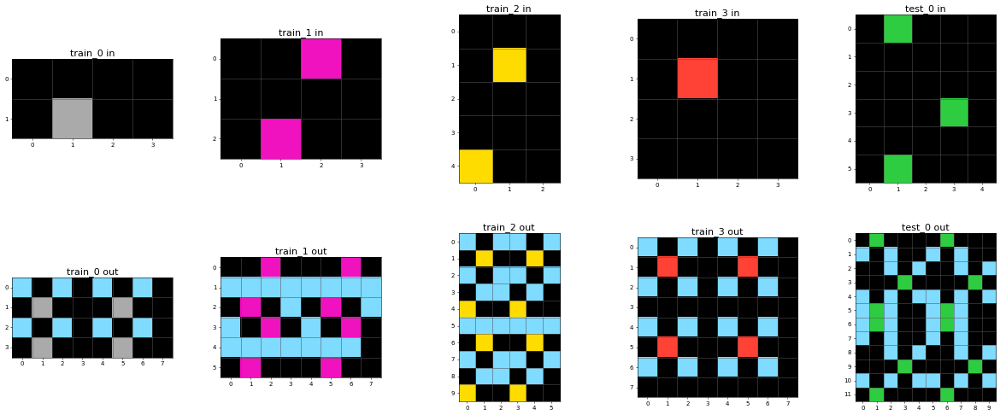

e50d258f


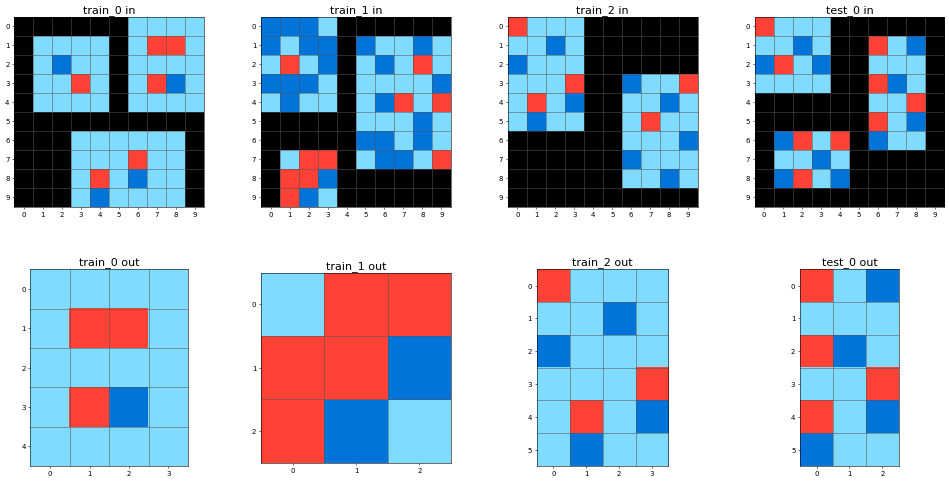

890034e9


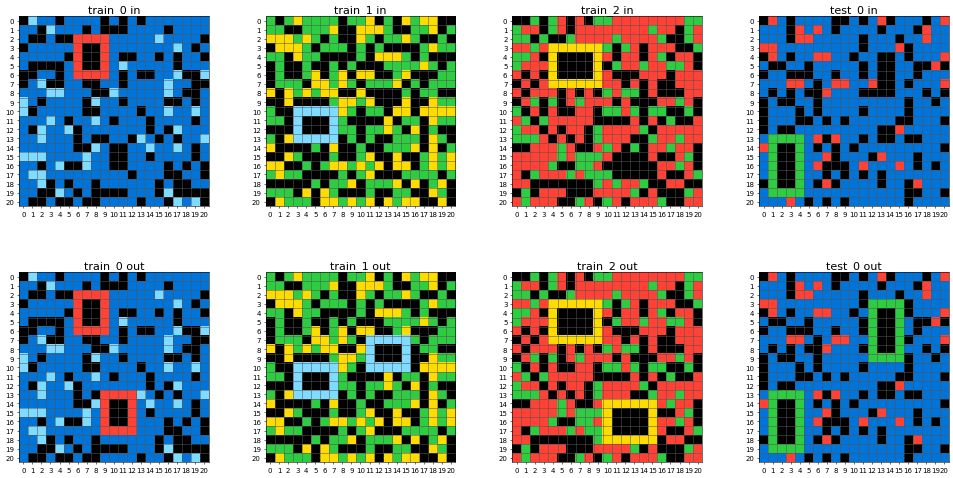

40853293


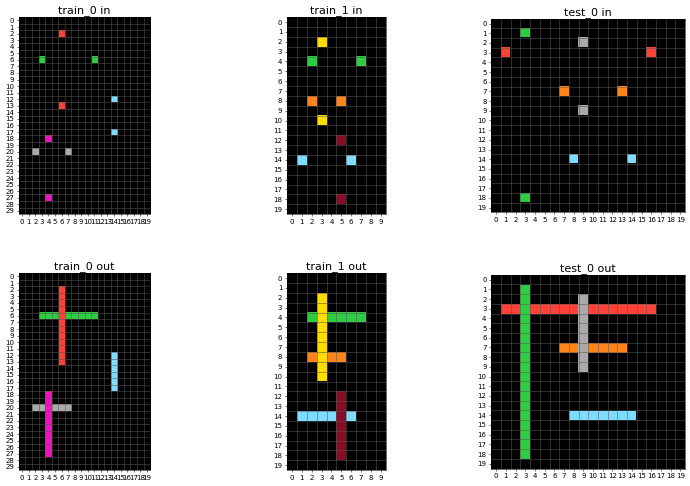

67385a82


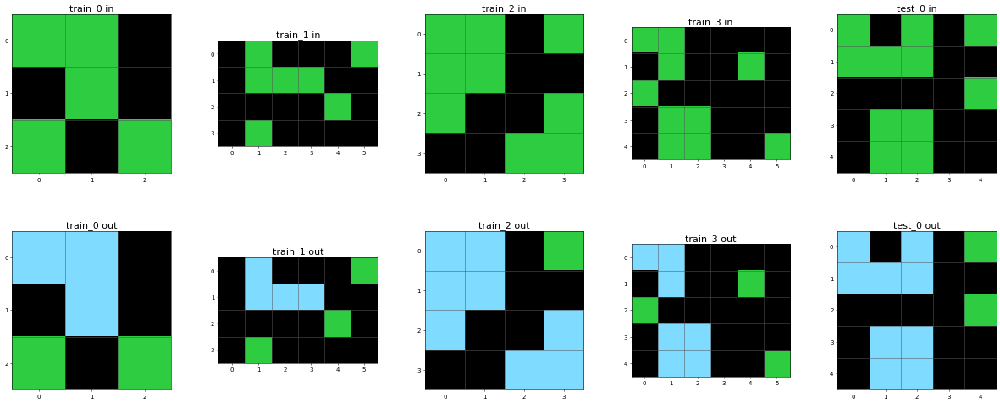

7b6016b9


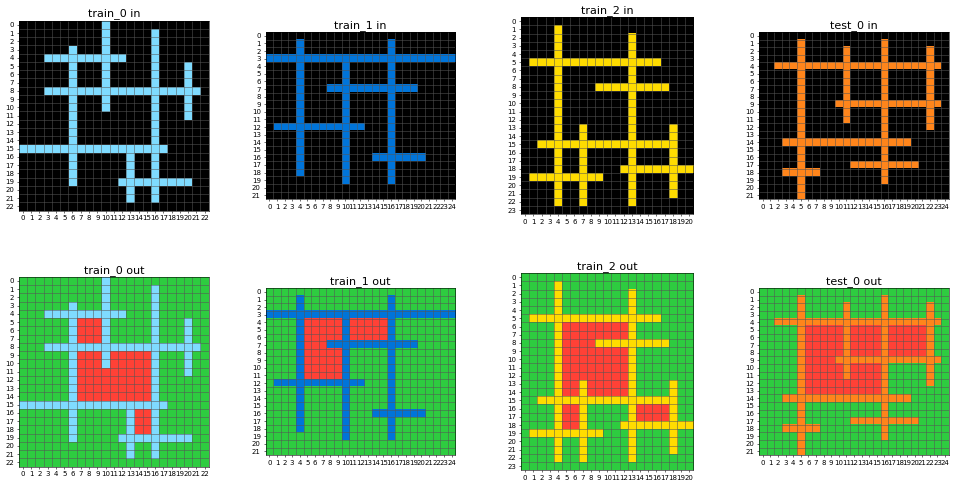

beb8660c


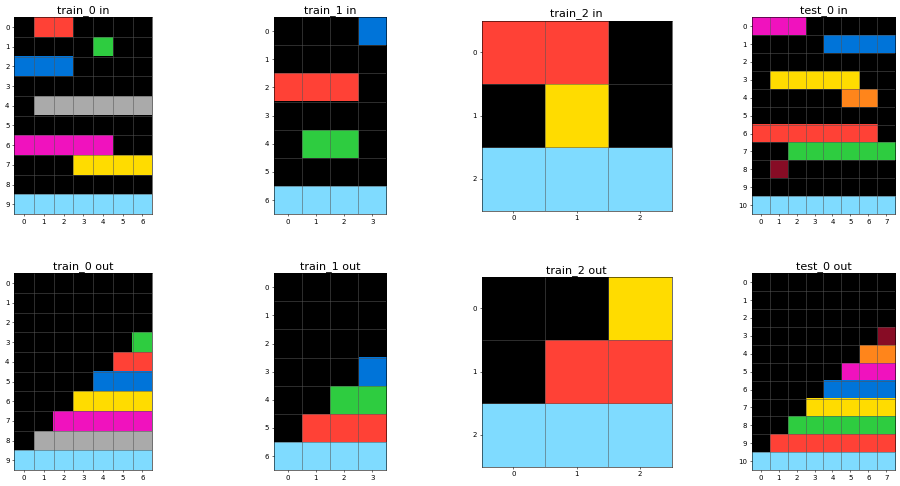

228f6490


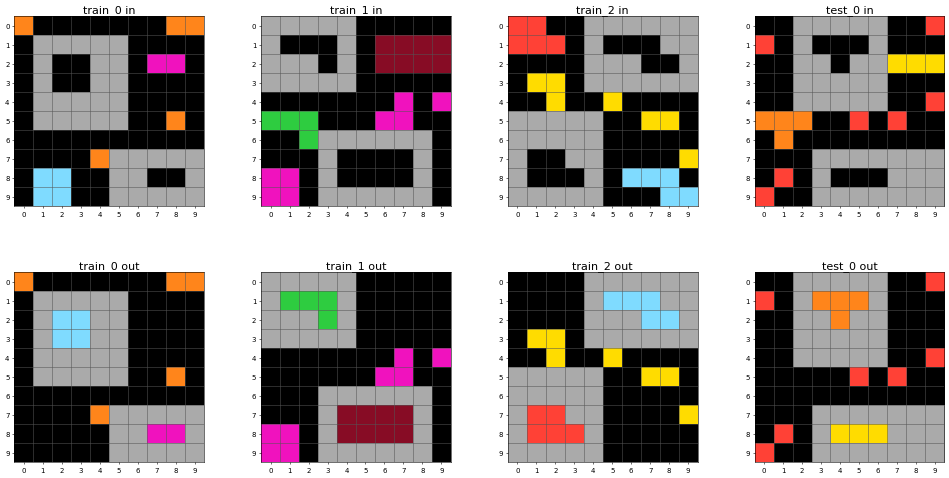

b527c5c6


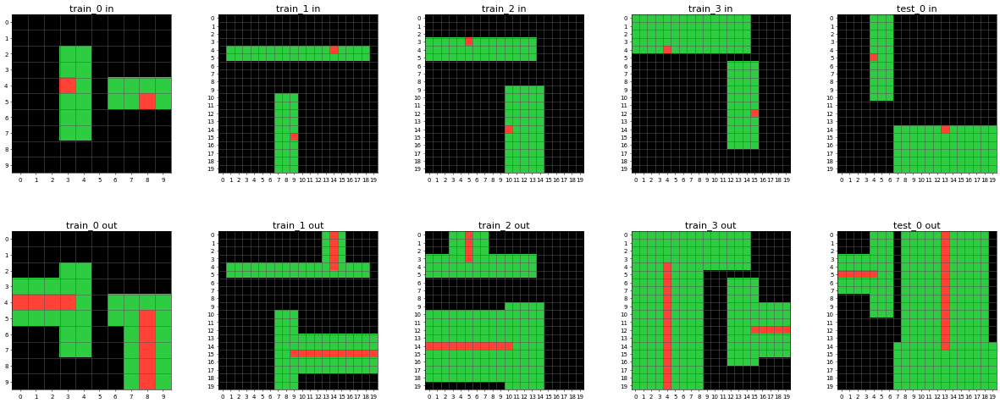

b2862040


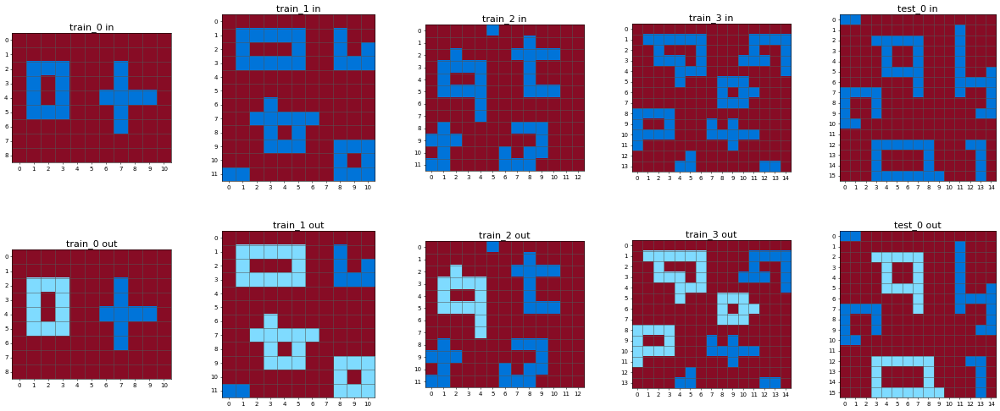

d90796e8


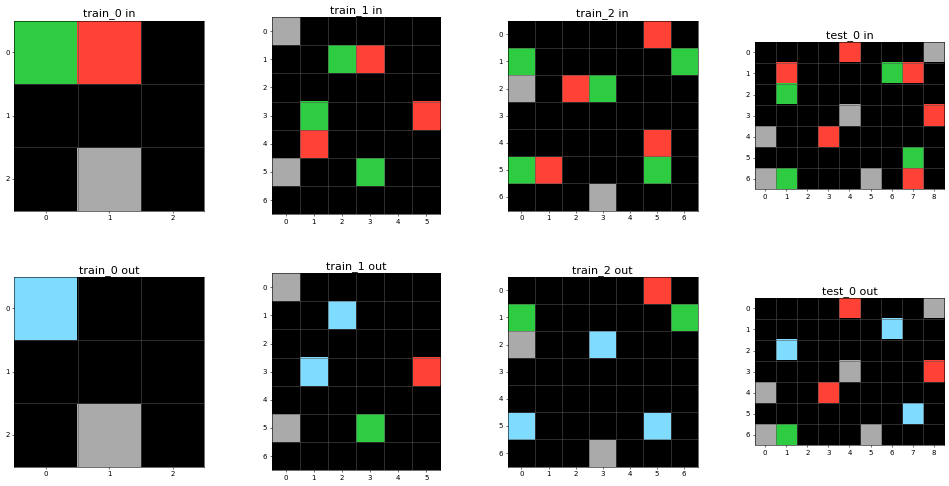

ddf7fa4f


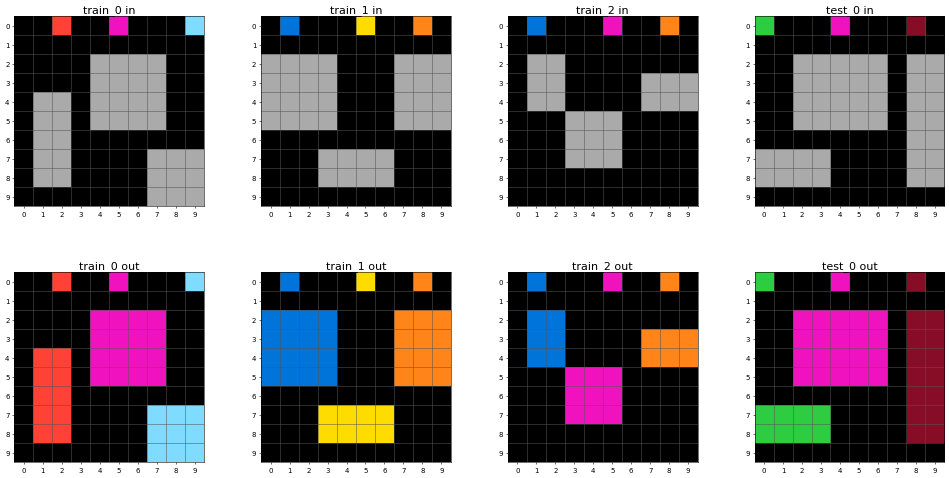

6e19193c


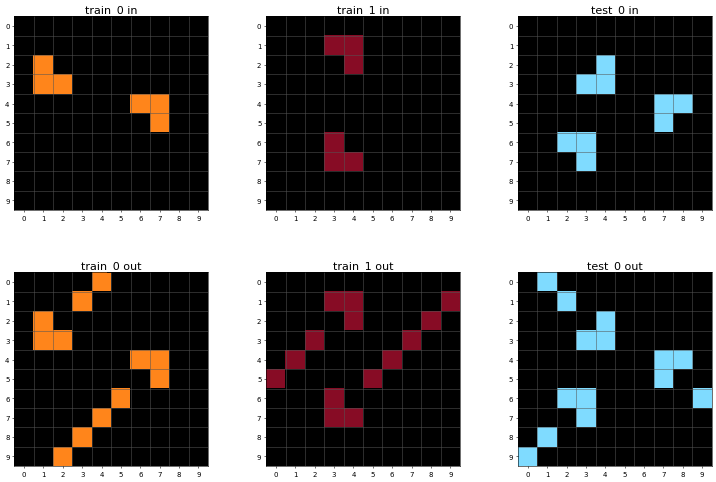

b60334d2


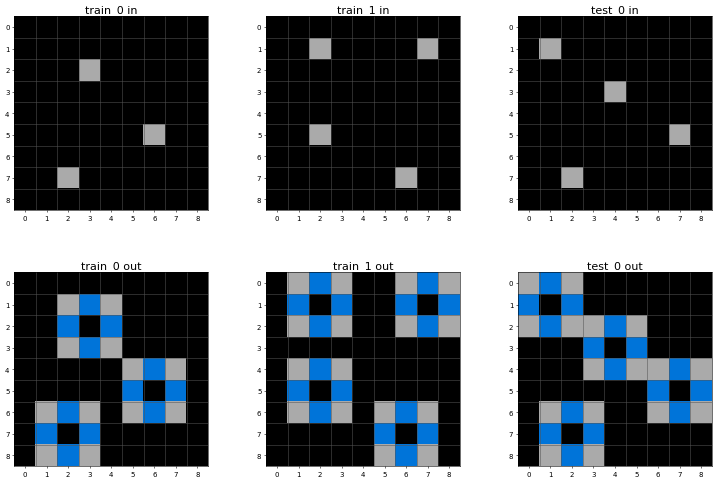

1f85a75f


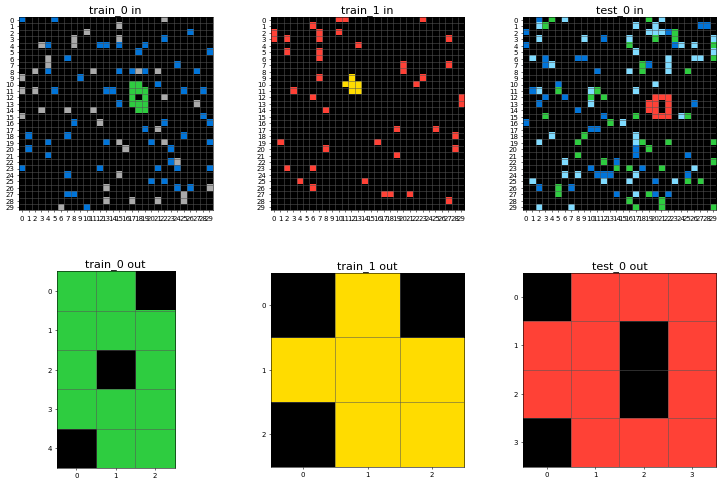

952a094c


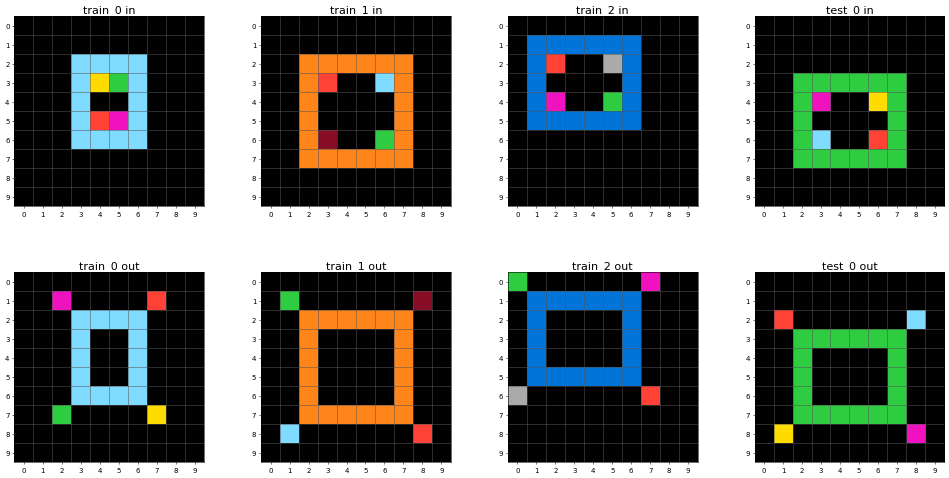

b27ca6d3


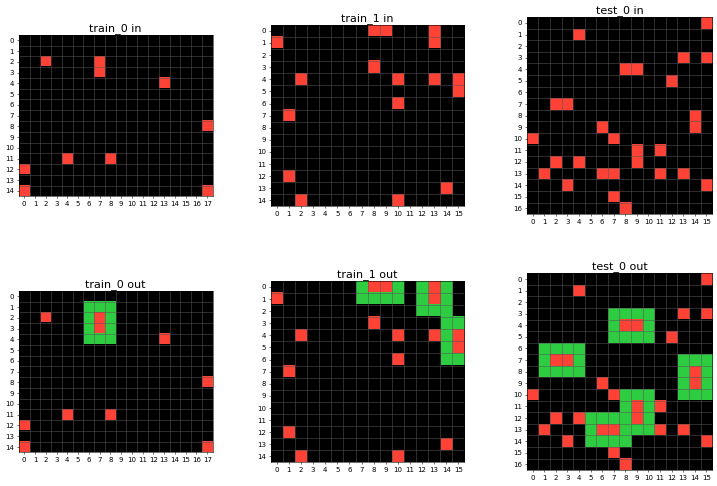

7f4411dc


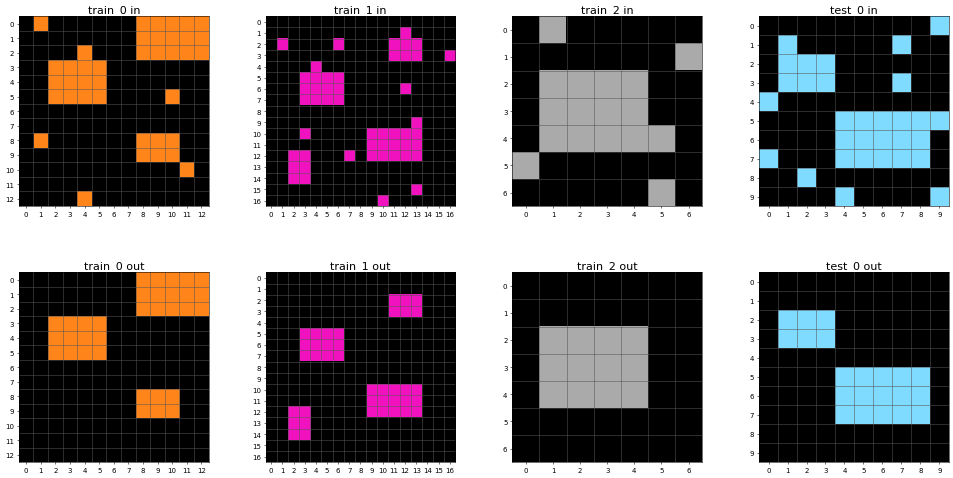

ce22a75a


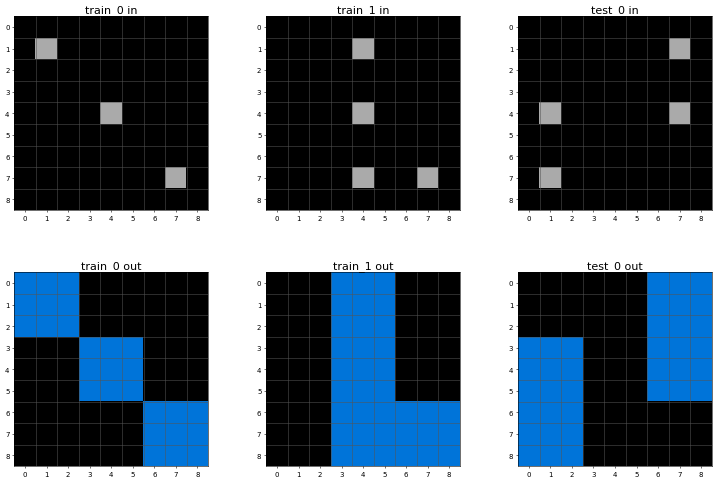

a64e4611


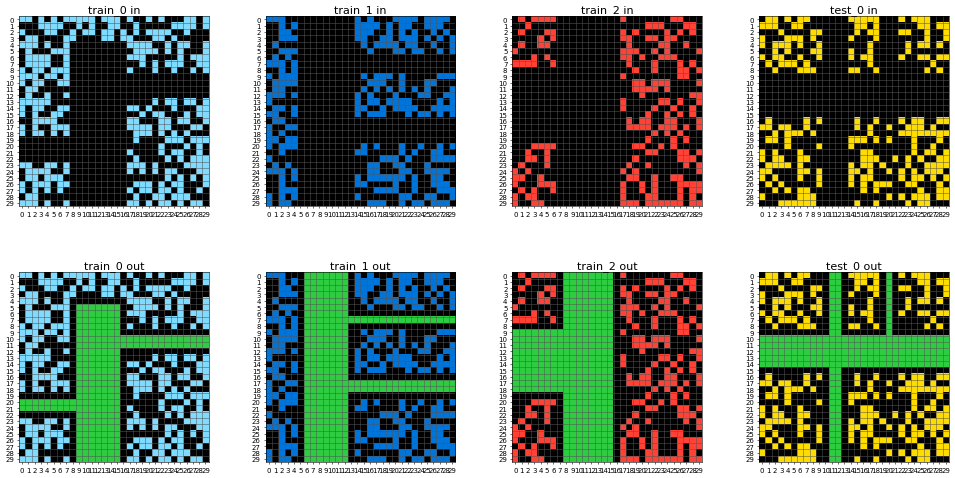

32597951


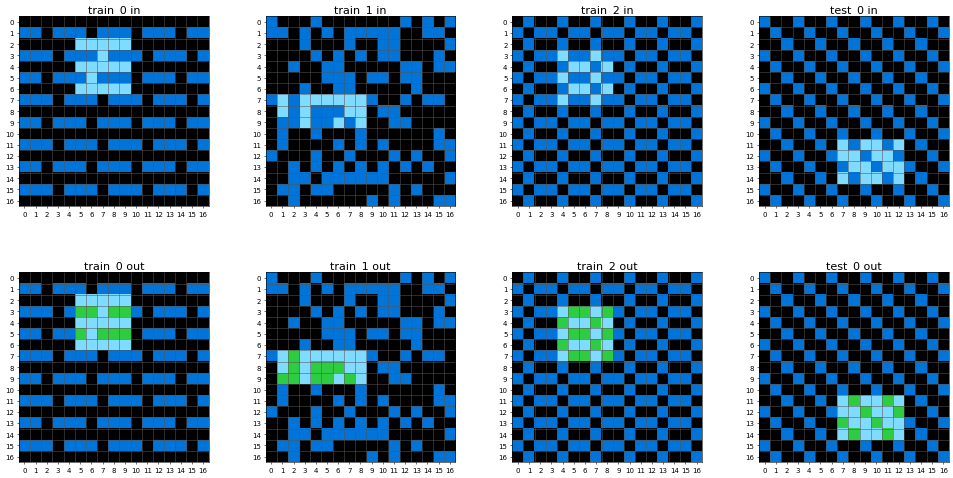

1fad071e


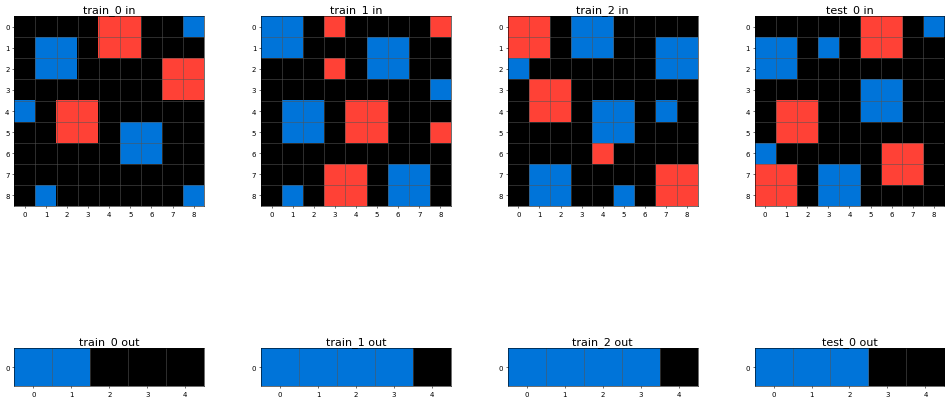

d2abd087


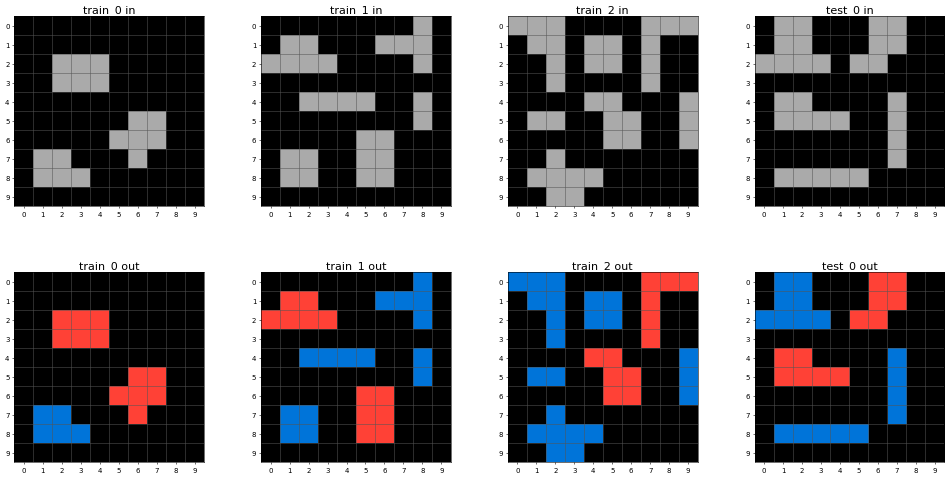

99fa7670


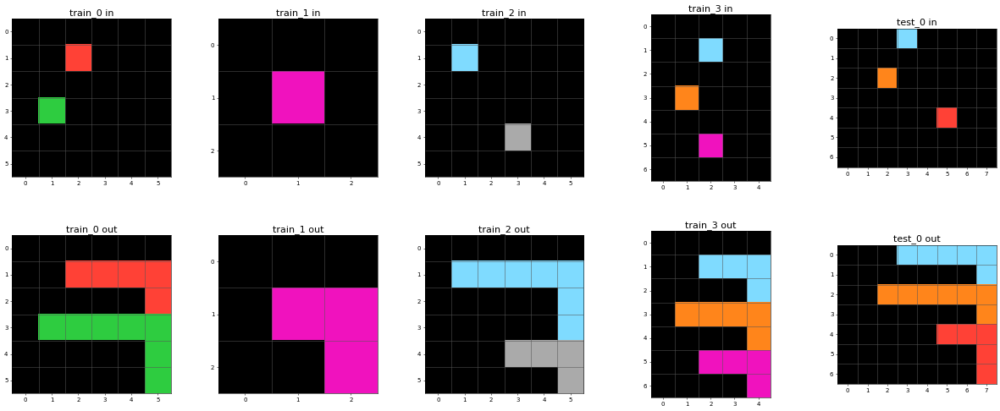

7468f01a


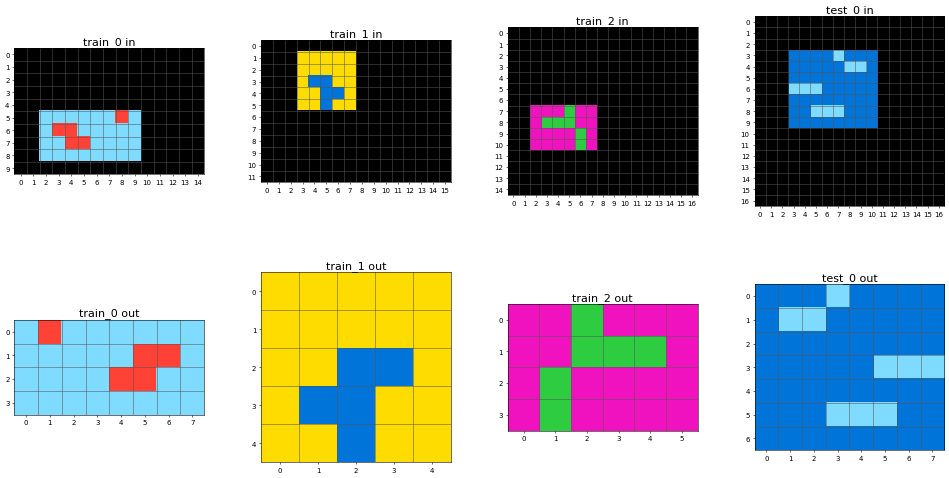

d06dbe63


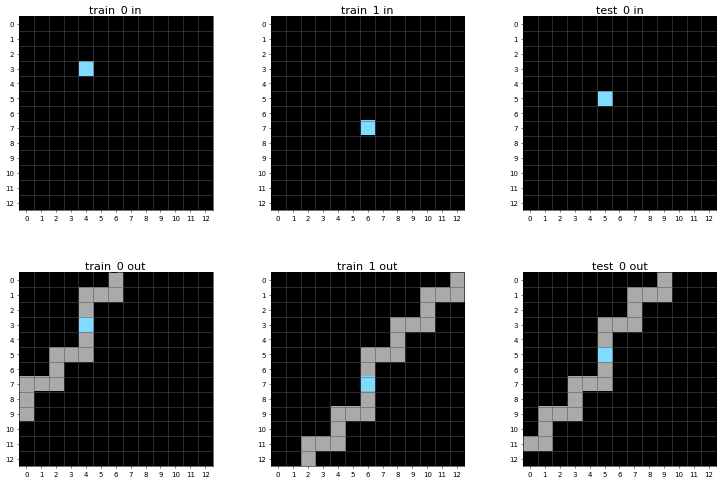

2204b7a8


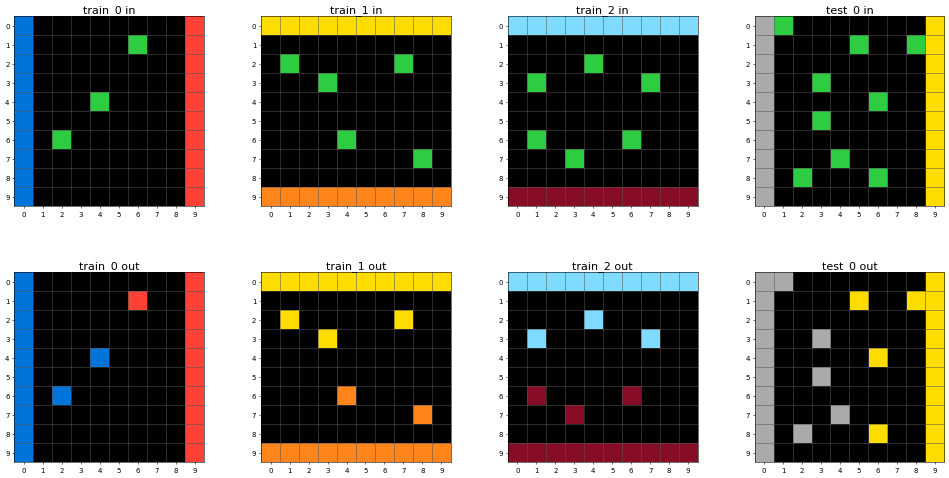

4522001f


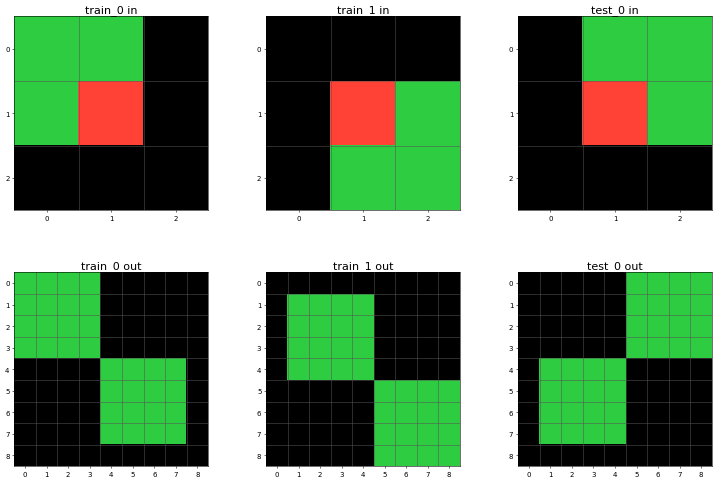

28bf18c6


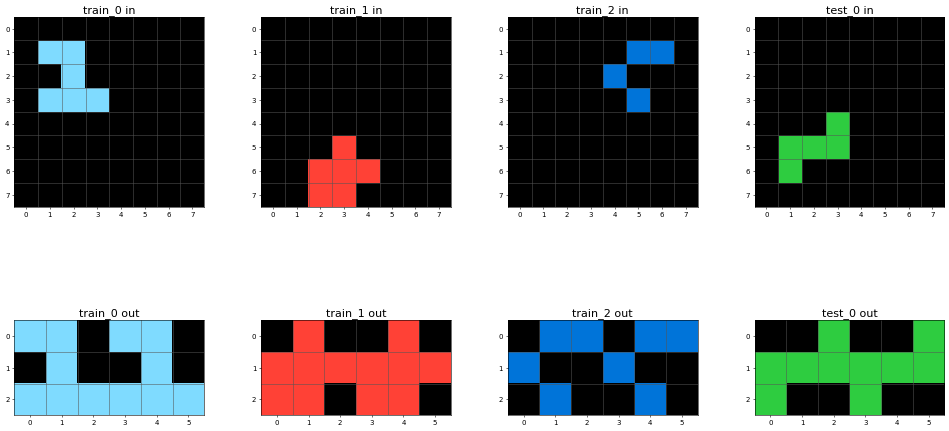

d5d6de2d


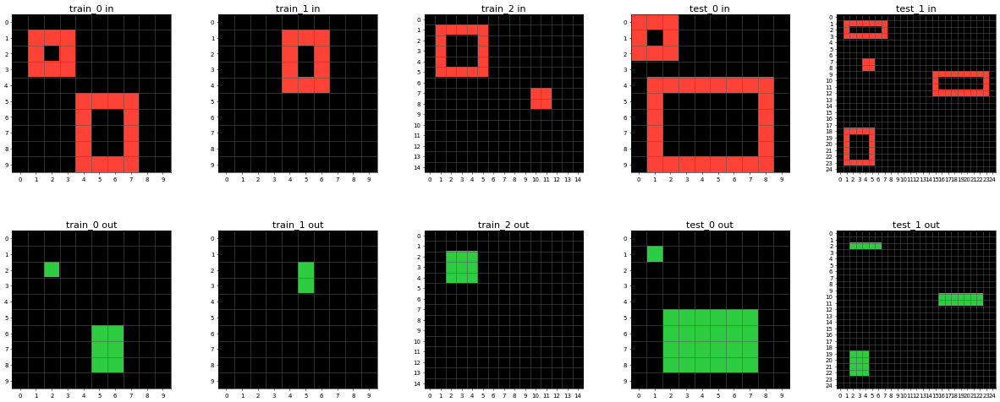

25ff71a9


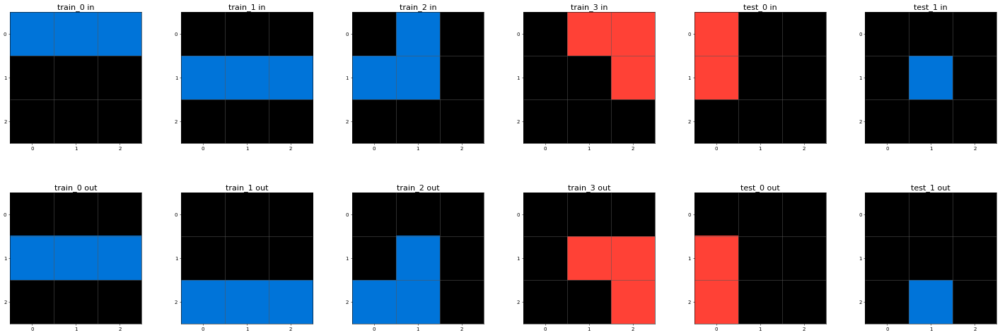

e9afcf9a


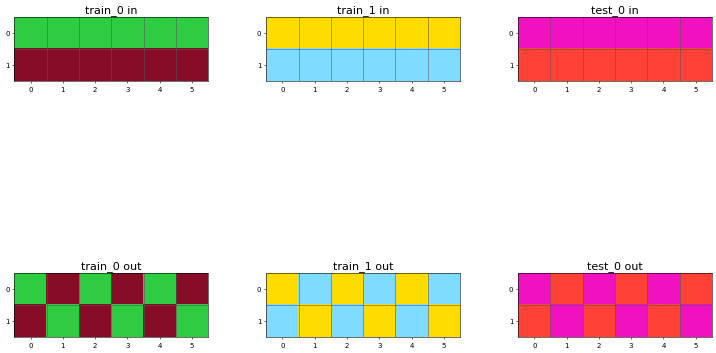

a1570a43


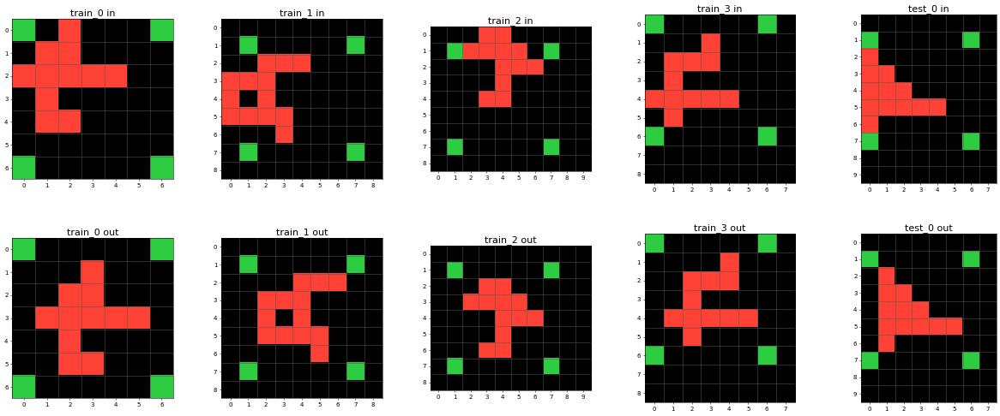

4938f0c2


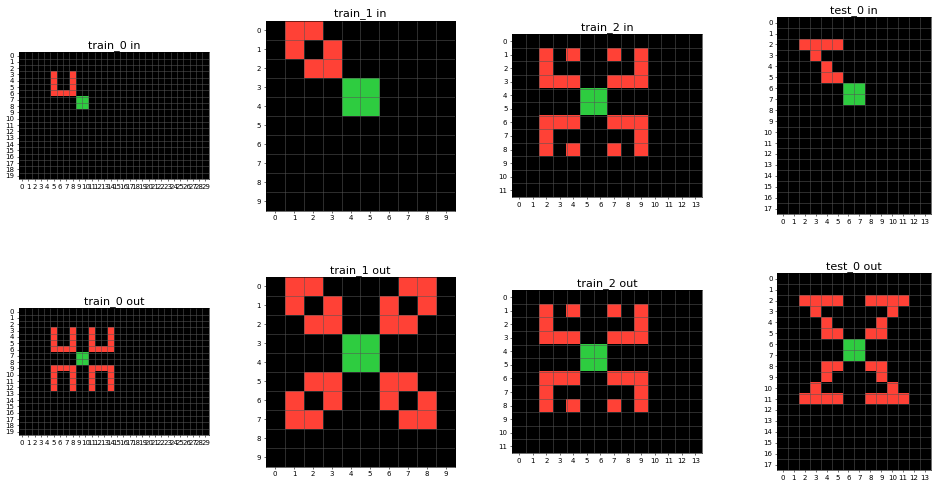

6d58a25d


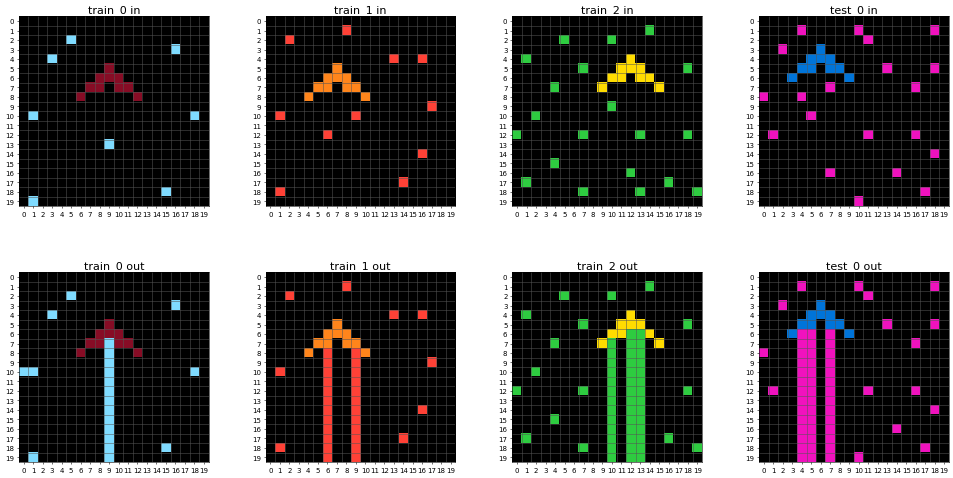

d4a91cb9


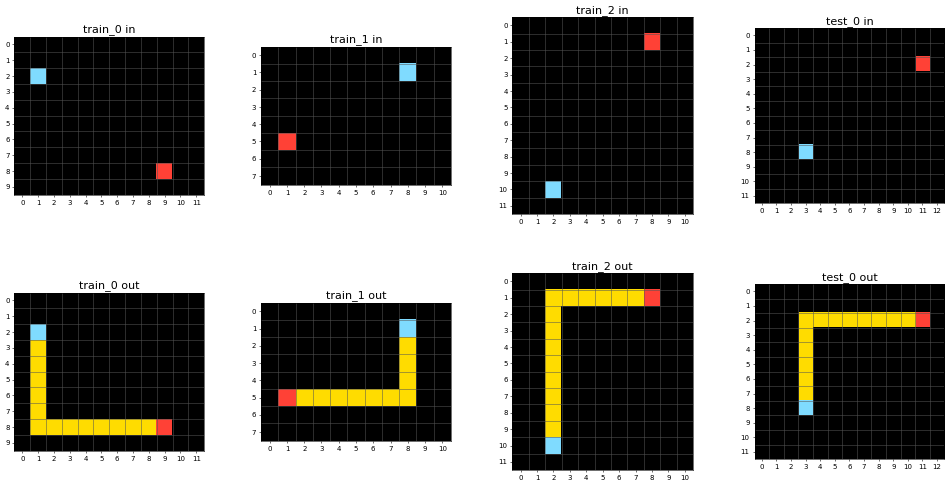

08ed6ac7


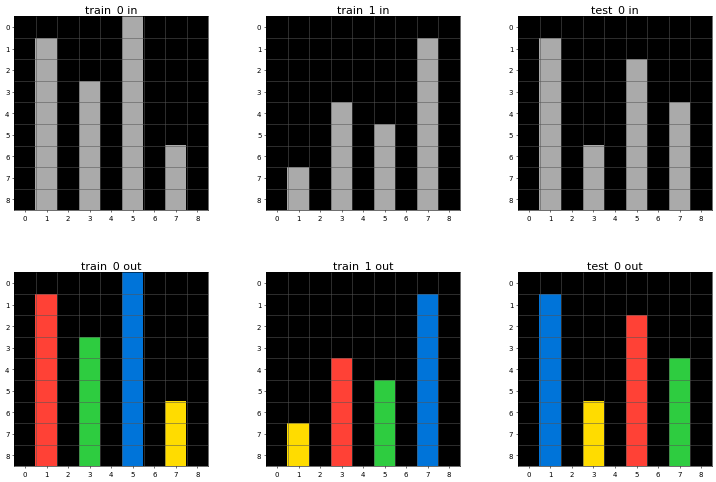

dae9d2b5


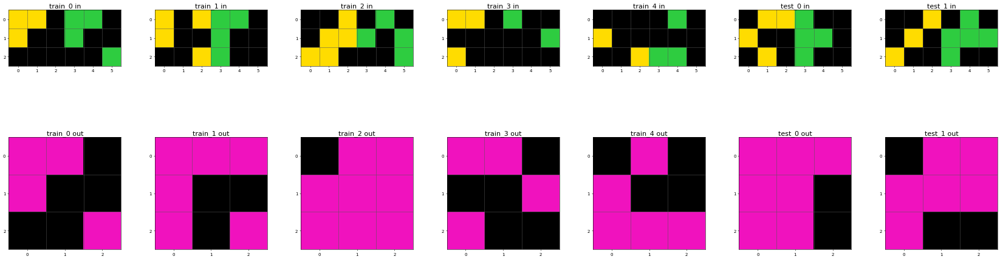

8e5a5113


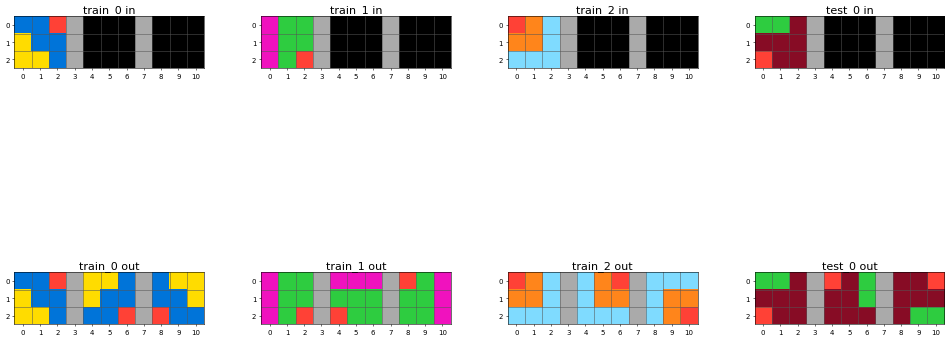

48d8fb45


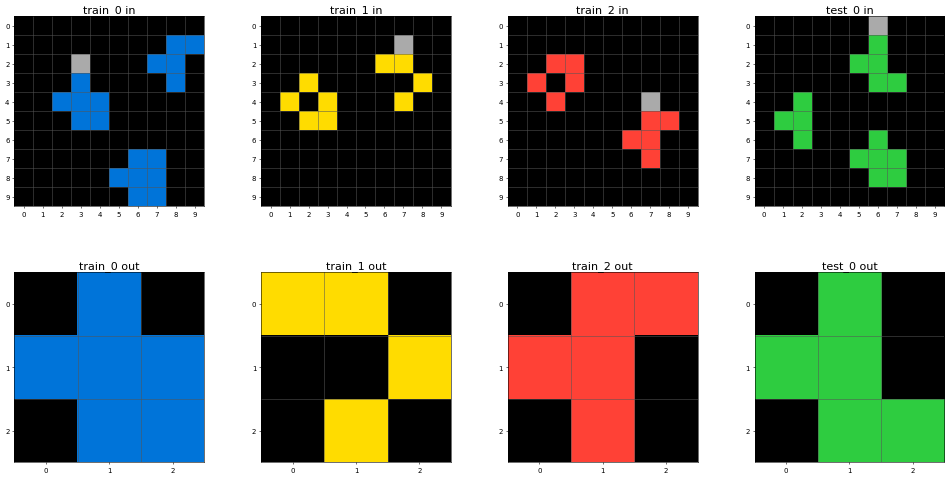

68b16354


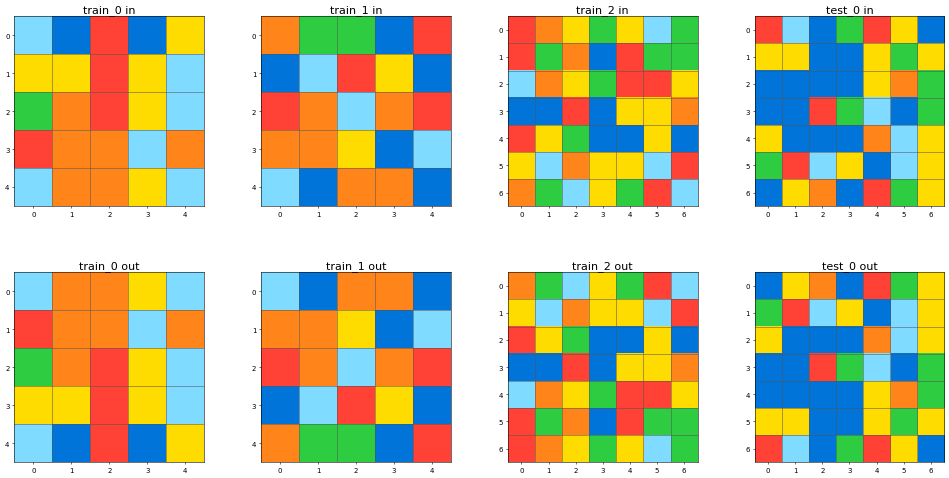

8eb1be9a


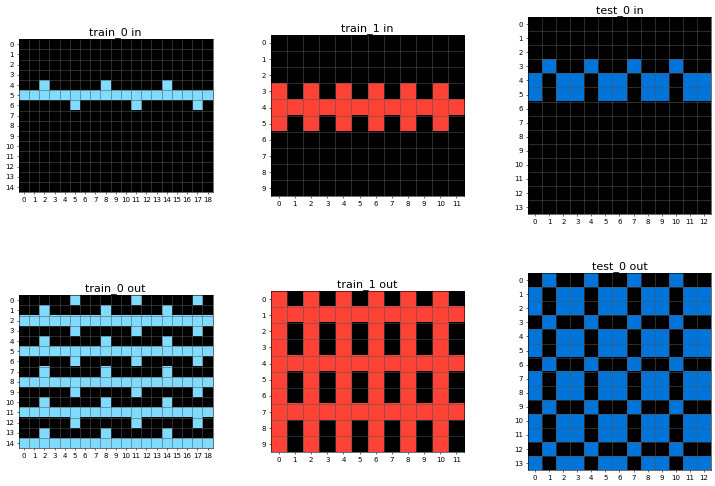

54d9e175


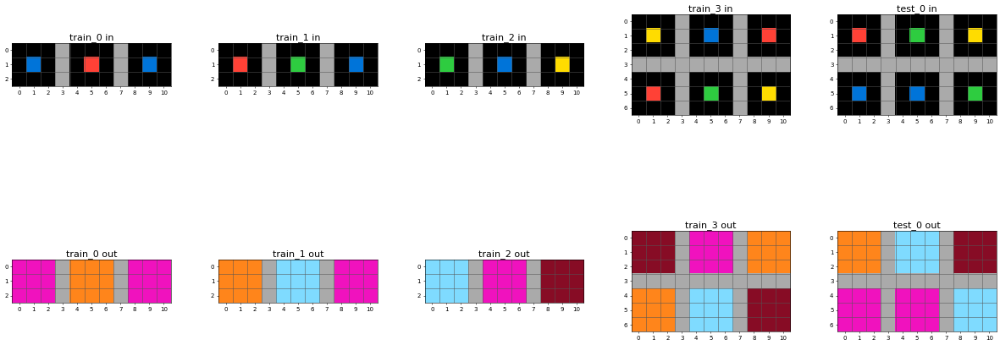

1f642eb9


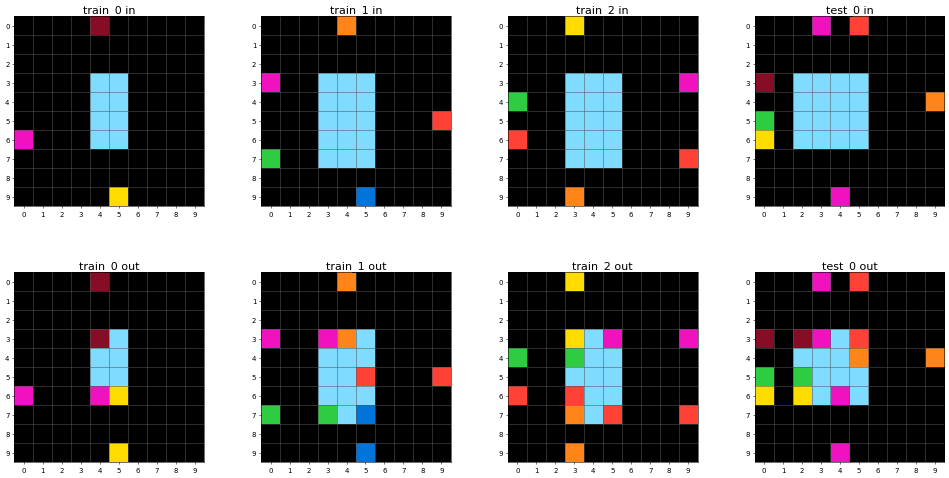

b91ae062


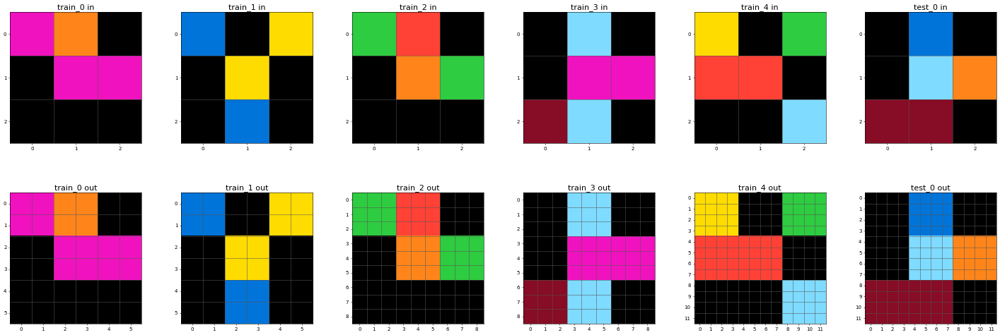

c8cbb738


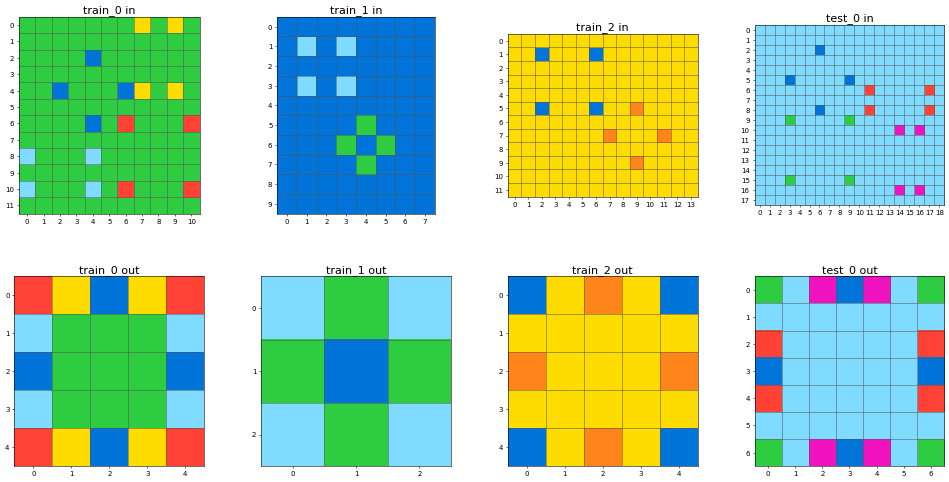

1cf80156


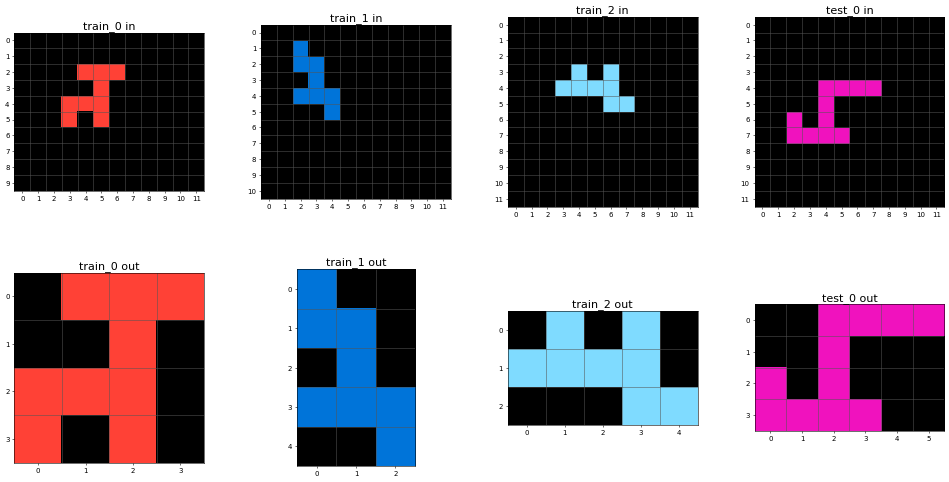

ae3edfdc


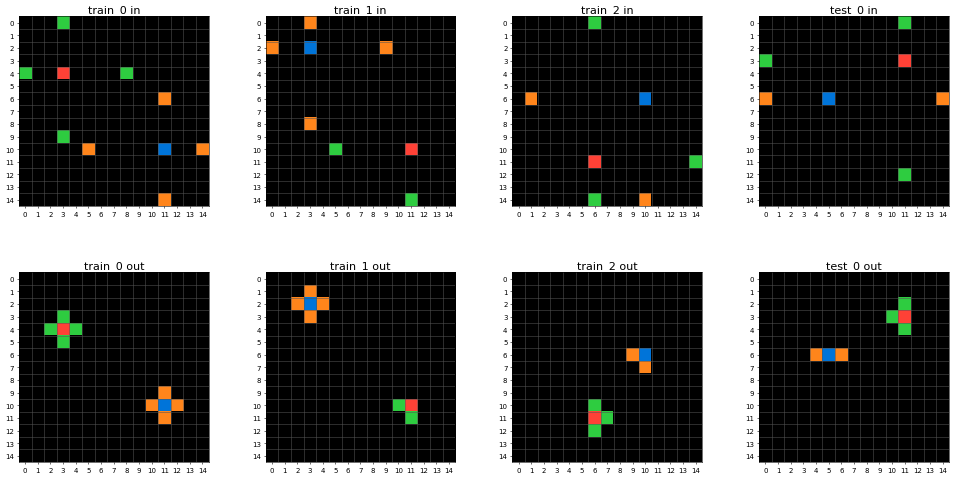

007bbfb7


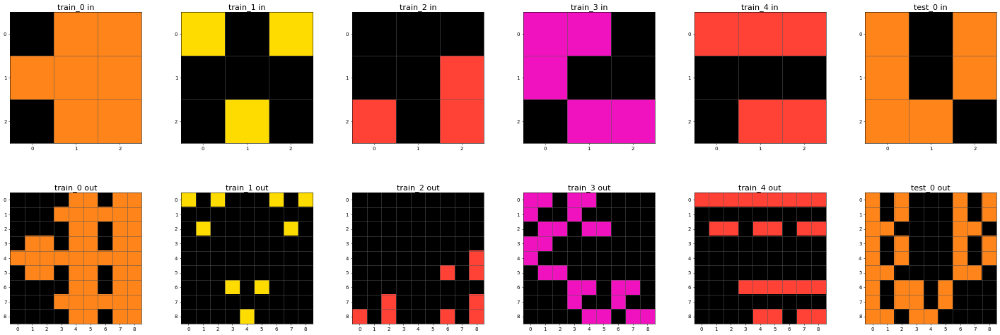

9dfd6313


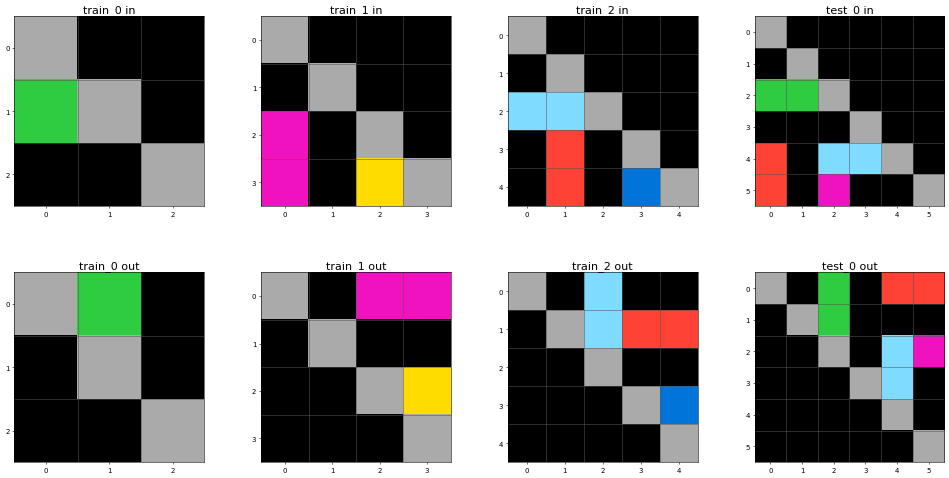

5c0a986e


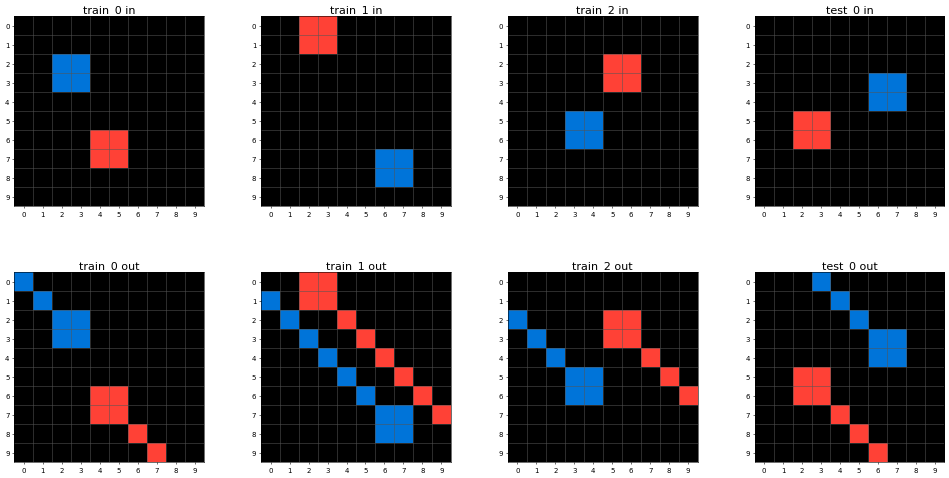

2dee498d


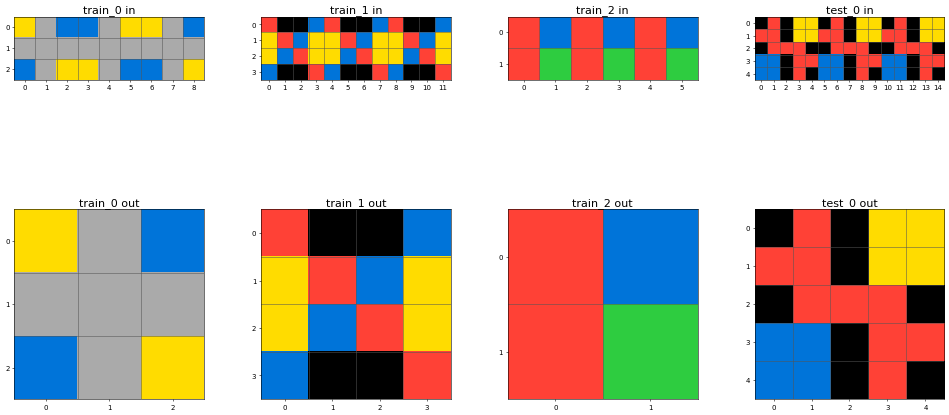

150deff5


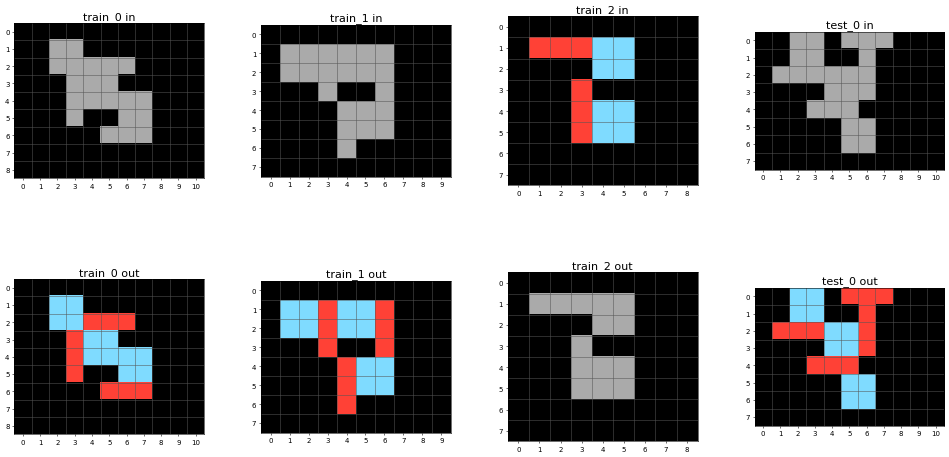

539a4f51


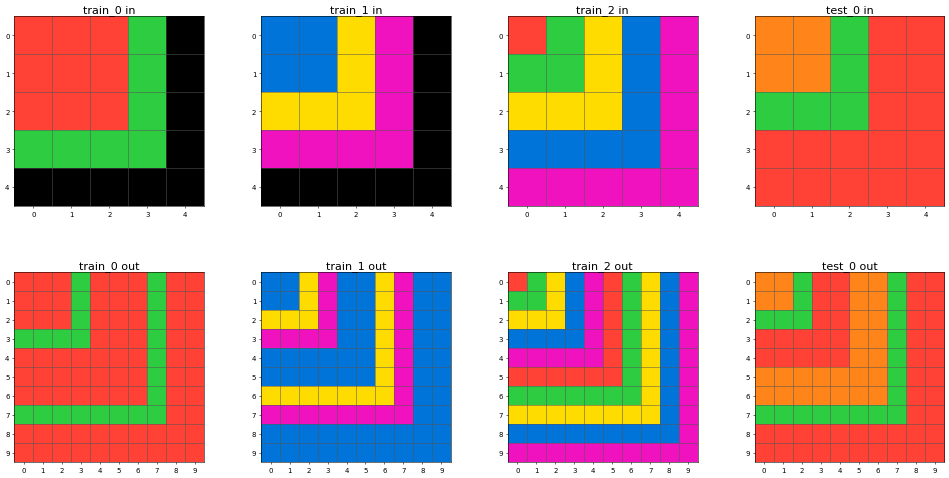

6aa20dc0


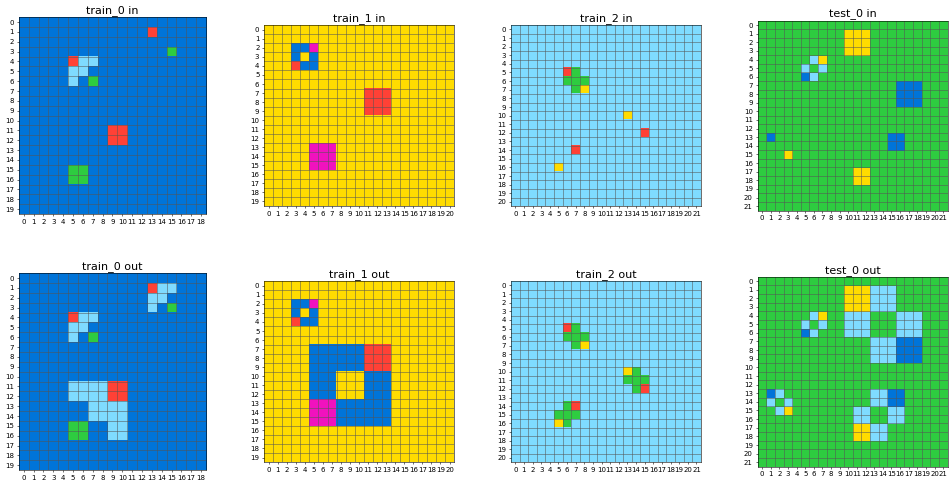

484b58aa


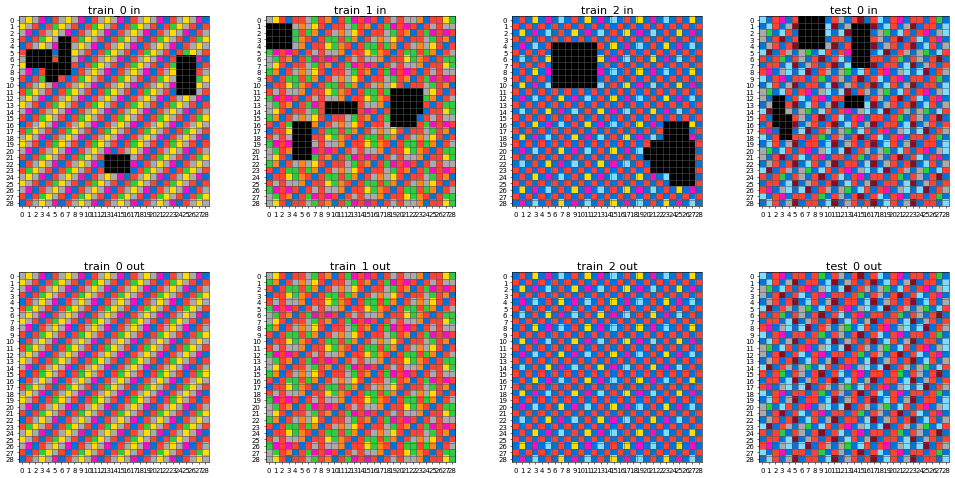

8a004b2b


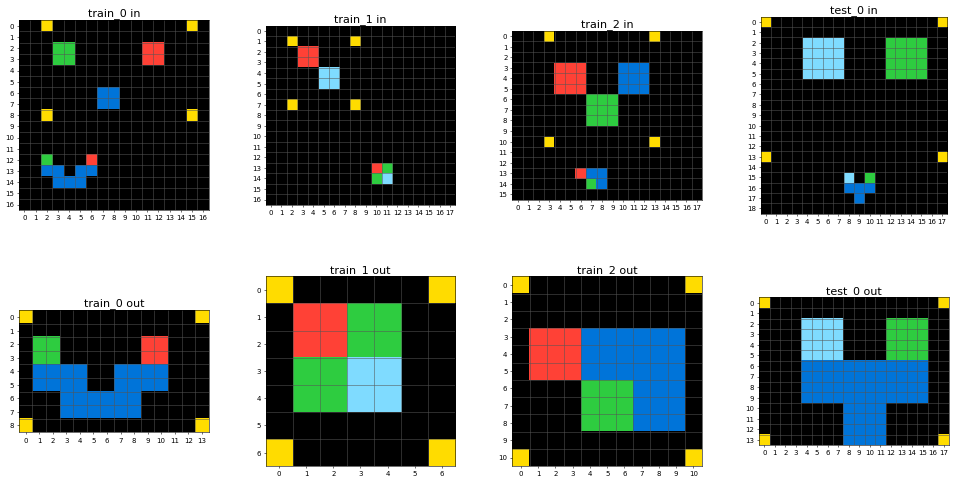

9565186b


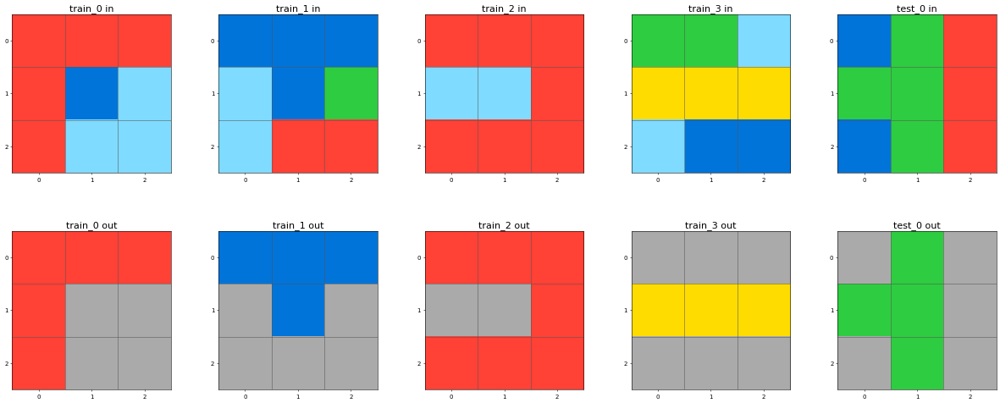

f2829549


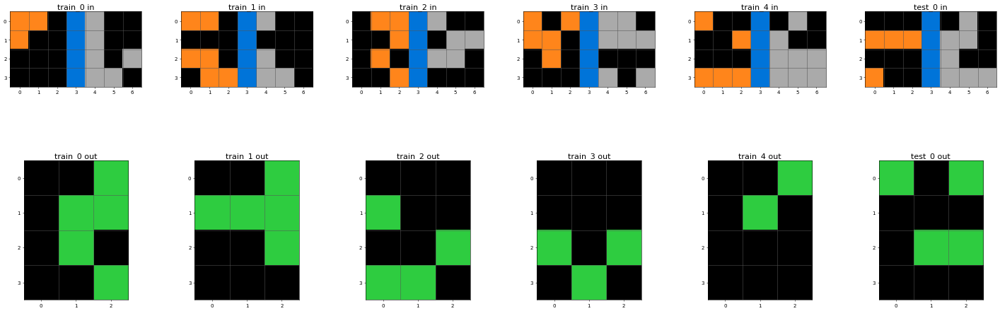

ed36ccf7


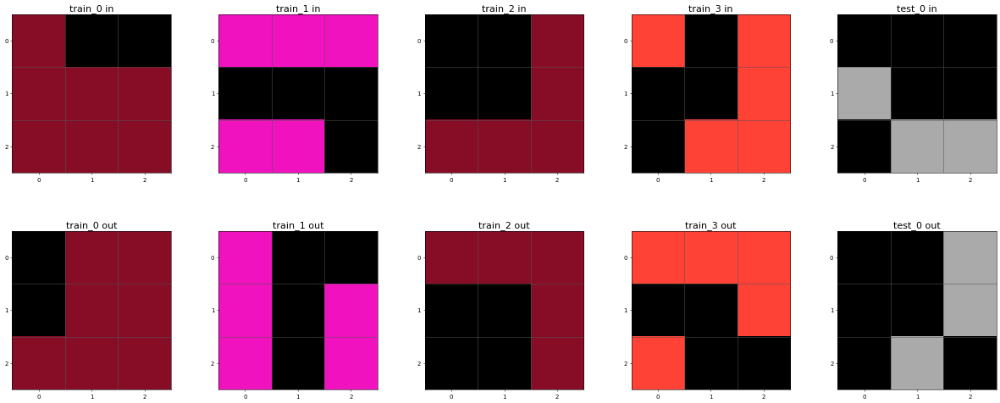

39a8645d


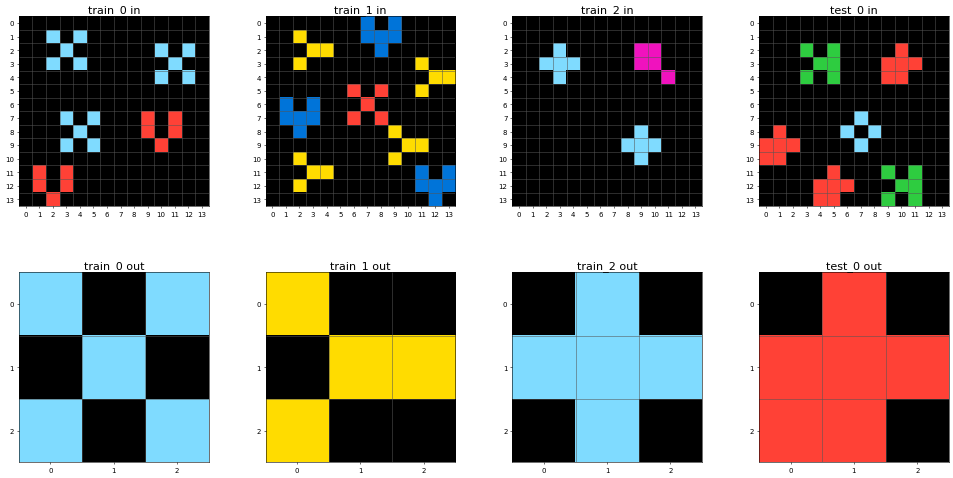

53b68214


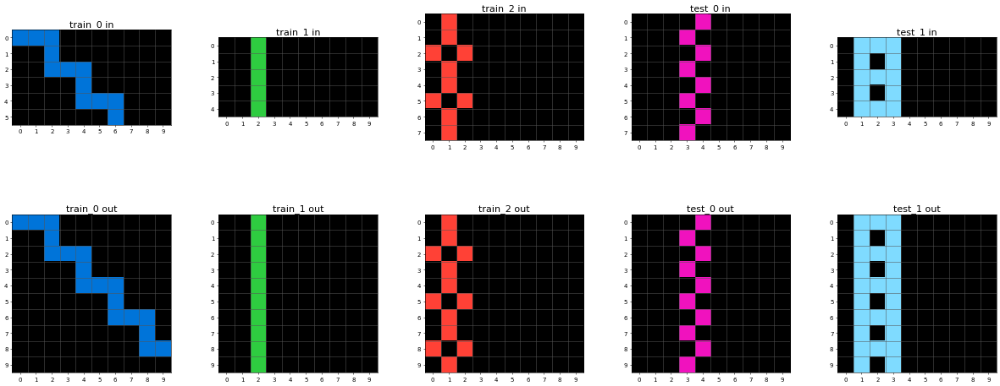

5614dbcf


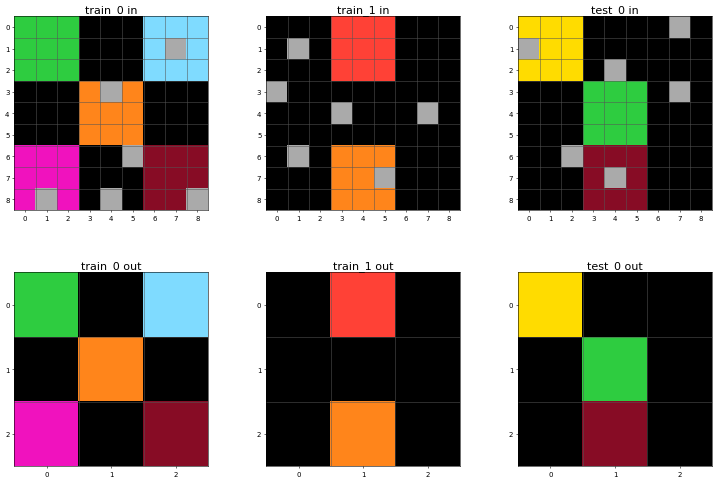

83302e8f


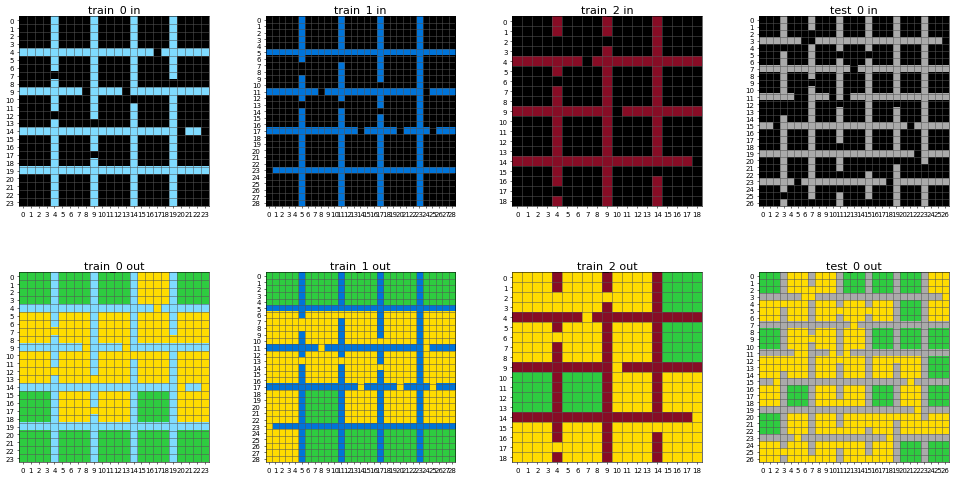

913fb3ed


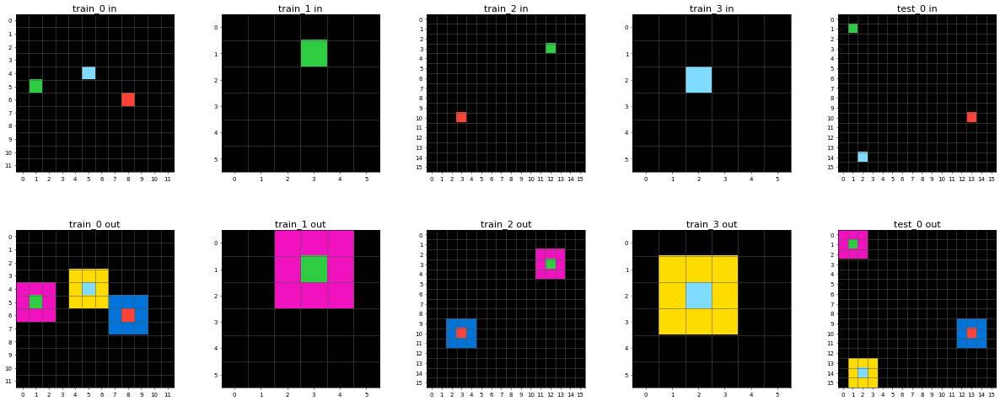

b8825c91


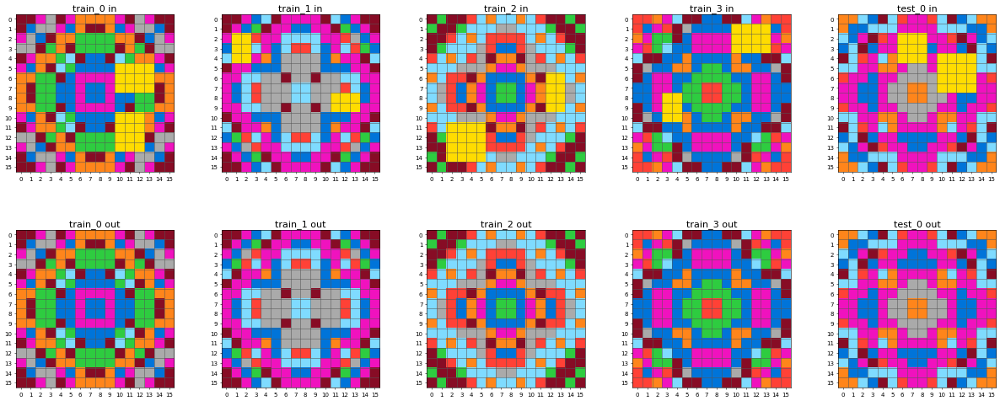

794b24be


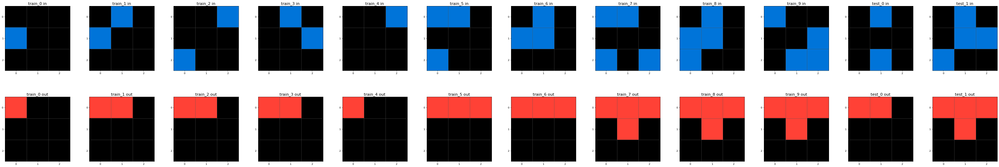

bdad9b1f


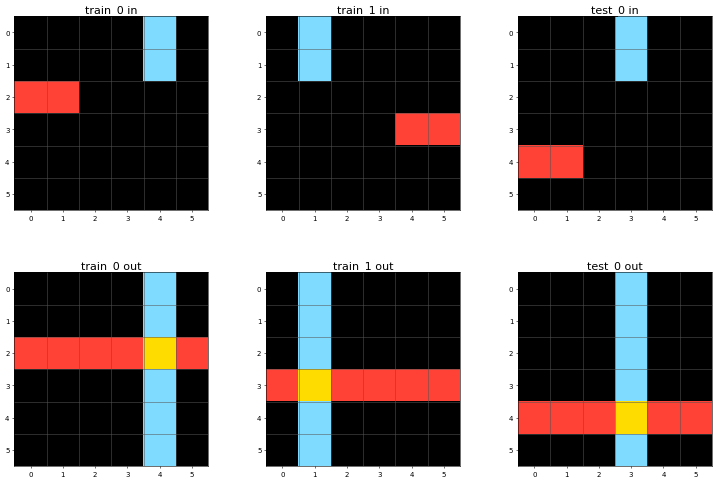

3de23699


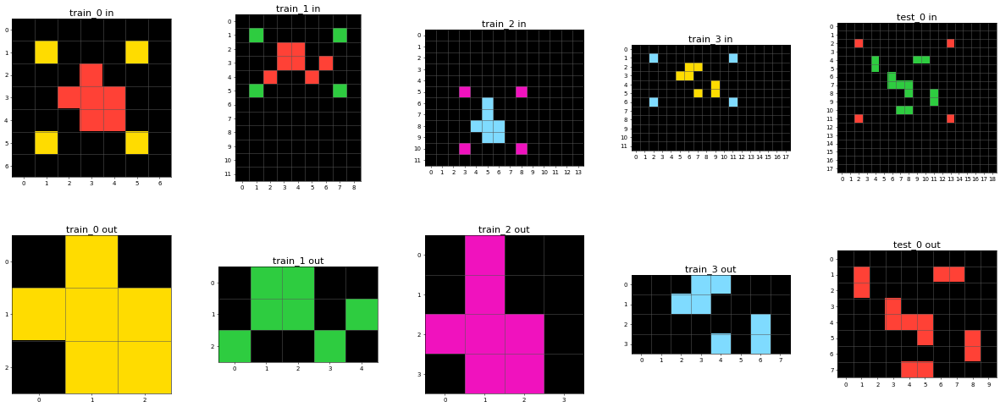

50846271


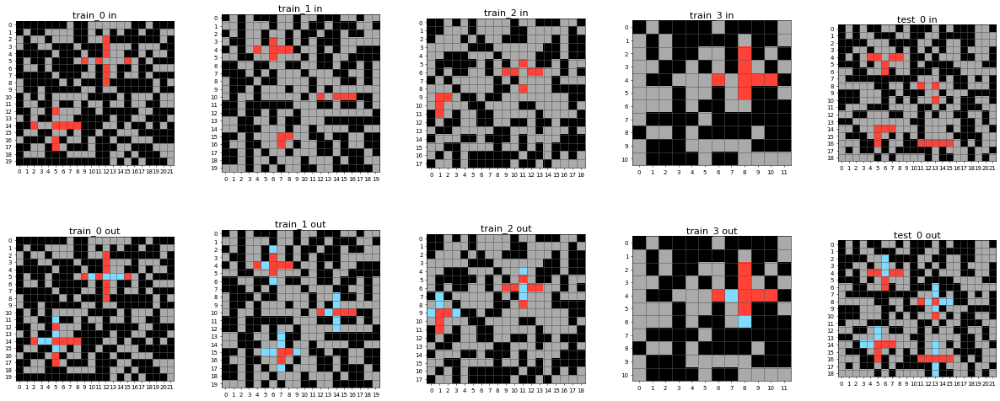

8f2ea7aa


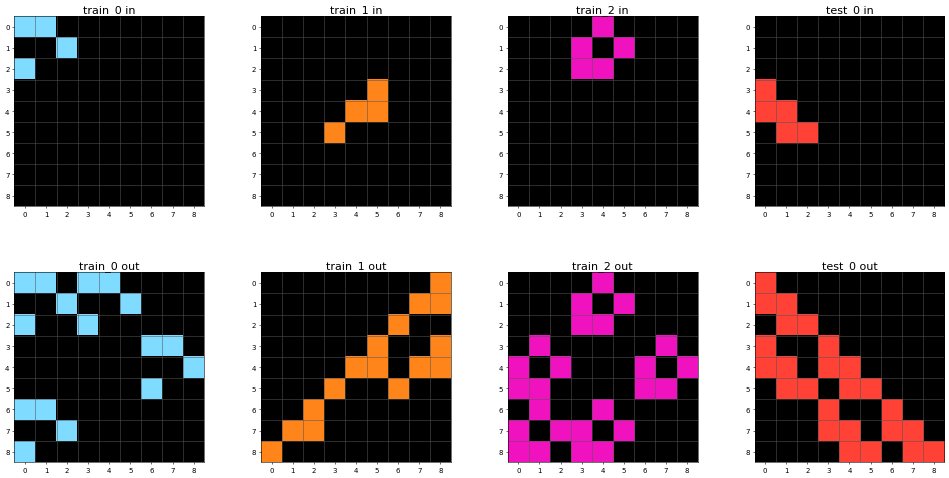

6150a2bd


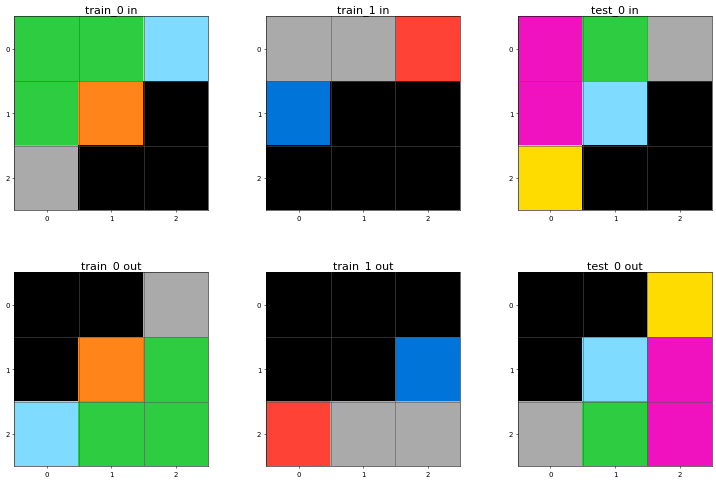

In [633]:
for task_id in train_ids:
    print(task_id)
    plot_task(load_task_from_id(task_id))

In [968]:
NUM_CHANNELS = len(COLORS)

def grid_to_rgb(x):
    """Returns a 3D array of RGB values of an ARC grid."""
    x_rgb = np.asarray(x)
    if x_rgb.ndim == 2:
        x_rgb = x_rgb[None, ...]
    if x_rgb.ndim == 3:
        x_rgb = x_rgb[..., None]
    
    x_rgb = np.repeat(x_rgb, 3, axis=-1)
    values = np.unique(x_rgb)
    for v in values:
        x_rgb[x_rgb[:,:,:,0] == v] = idx_to_rgb[v]
    return x_rgb[0] if x_rgb.shape[0] == 1 else x_rgb


def grid_to_rgba(x):
    """Returns a 3D array of RGB values of an ARC grid."""
    x = np.asarray(x)
    a = arc_conv2d((x != background_color).astype(np.float32), 
                   kernel=np.ones((3, 3), dtype=np.float32) / 9.,
                   padding='same')
    x_rgb = grid_to_rgb(x)
    x_rgba = np.concatenate([x_rgb, np.expand_dims(a, axis=-1)], axis=-1)
    return x_rgba.astype(np.float32)


def get_alpha(x, kernel=None, bkgr_color=0):
    """Returns a 3D array of RGB values of an ARC grid."""
    x = np.asarray(x, dtype=np.float32)
    ndim = x.ndim
    if ndim == 2:
        x = x[None, ..., None]
    if ndim == 3:
        raise ValueError(f"Expected 2 or 4 dims. Got {ndim}")
        
    if kernel is None:
        kernel = np.ones((3, 3, 1, 1)) / 9.
    else:
        kdim = kernel.ndim
        if kdim == 2:
            kernel = kernel[..., None]
        if kdim == 3:
            kernel = kernel[..., None]
    
    kernel = kernel.astype(np.float32)       
    a = tf.nn.depthwise_conv2d(x, kernel, [1,1,1,1], 'SAME')[0, ..., 0].numpy()
    
    return np.clip(a.astype(np.float32), 0, 1.)


def grid_to_channel(x, ch_to_symbol=None, background_color=0):
    """Transforms a 2D grid of color indices to a 3D tensor where each channel
    corresponds to a color.
    """
    x = np.asarray(x)
    if ch_to_symbol is None:
        ch_to_symbol = {i: i for i in range(NUM_CHANNELS)}
    
    x_channels = []
    for ch, v in ch_to_symbol.items():
        if v == background_color:
            x_channels.append(np.zeros_like(x, dtype=np.float32))
        else:
            x_channels.append((x == v).astype(np.float32))
    return np.stack(x_channels, axis=2)     

def channel_to_grid(x, 
                    ch_to_symbol=None,
                    mask_th=0,
                    num_channels=None,
                    background_color=0):
    """Transforms a binarized 3D matrix to a 2D grid of color indices."""
    x = np.array(x)
    if ch_to_symbol is None:
        ch_to_symbol = {i: i for i in range(NUM_CHANNELS)}
    num_channels = len(ch_to_symbol)
    
    mask = x[...,-1] > mask_th

    x_grid = np.argmax(x[..., :num_channels], axis=-1)
    x_grid = np.vectorize(ch_to_symbol.__getitem__)(x_grid)
    x_grid[np.where(mask == 0)] = background_color
    
    return x_grid


def unpad(x, output_shape):
    ndim = len(x.shape)
    if ndim == 2:
        h, w = x.shape
    elif ndim == 4:
        h, w = x.shape[1:3]
    else:
        raise ValueError(f"Expected 2 or 4 dims, got {x.ndim}")
    
    hp = h - output_shape[0]
    wp = w - output_shape[1]
    if hp > 0:
        hp = (hp//2, h-hp//2) if hp % 2 == 0 else (hp//2+1, h-hp//2)
    else:
        hp = (0, h)
    if wp > 0:
        wp = (wp//2, w-wp//2) if wp % 2 == 0 else (wp//2+1, w-wp//2)
    else:
        wp = (0, w)
    
    if ndim == 2:
        if isinstance(x, np.ndarray):
            return x[hp[0]:hp[1], wp[0]:wp[1]]
        elif isinstance(x, tf.Tensor):
            return tf.slice(x, [hp[0], wp[0]], [hp[1]-hp[0], wp[1]-wp[0]])
        else:
            raise ValueError(f'Unrecognized data type {type(x)}')
    else:
        if isinstance(x, np.ndarray):
            return x[:,hp[0]:hp[1], wp[0]:wp[1],:]
        elif isinstance(x, tf.Tensor):
            return tf.slice(x, 
                            begin=[0, hp[0], wp[0], 0], 
                            size=[-1, hp[1]-hp[0], wp[1]-wp[0], -1])
        else:
            raise ValueError(f'Unrecognized data type {type(x)}')
        
def plot_numeric(x, bold_th=None, figsize=None):
    h,w = x.shape
    s = 1
    figsize = figsize or (int(w*.8),int(h*.8))
    
    bold_th = bold_th or 0
    
    fig = plt.figure(figsize=figsize)
    ax = fig.gca()
    ax.set_ylim(0, h*s+1)
    ax.set_xlim(0, w*s+1)
    
    for i in range(0, h*s, s):
        for j in range(0, w*s, s):
            v = x[i//s,j//s]
            weight = 'bold' if v > bold_th else None
            ax.text(j+.5, h-i+.5, f' {v:.3f} ', weight=weight)

    ax.set(frame_on=False)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()
    
def arc_conv2d(x_input, kernel, padding='same', strides=1):
    """Slides a filter (object) across a state and checks for matches."""
    x_input = np.asarray(x_input)
    kernel_h, kernel_w = kernel.shape
    
    if padding == 'same':
        hp = kernel_h // 2
        wp = kernel_w // 2
        x_input = np.pad(x_input, [(hp, wp), (hp, wp)])
    
    x_input_1d = x_input.ravel()
    kernel_1d = np.ravel(kernel)
    
    input_h, input_w = x_input.shape
    strided_h = (input_h - kernel_h + 1) // strides
    strided_w = (input_w - kernel_w + 1) // strides
    y_output = np.zeros((strided_h, strided_w), np.float32)

    indices = project_to_1d(input_w, list(product(range(kernel_h), range(kernel_w))))

    # slide the object across every possible region and check for matches
    for i in range(strided_h):
        for j in range(strided_w):
            strided_indices = indices + j + i * input_w
            dot = np.dot(x_input_1d[strided_indices], kernel_1d)
            y_output[i, j] = np.dot(x_input_1d[strided_indices], kernel_1d)
    
    return y_output

In [934]:
identity = np.outer([0,1,0], [0,1,0]).astype(np.float32)
sobel_x = np.outer([1, 2, 1], [-1, 0, 1]).astype(np.float32)
sobel_y = sobel_x.T

In [935]:
class AdapativeParam(object):
    
    def __init__(self, 
                 start_value,
                 factor=.9, 
                 update_fn=None,
                 patience=5,
                 mode='min',
                 min_delta=0,
                 cooldown=0,
                 lower_bound=0,
                 upper_bound=np.inf,
                 reset=False,
                 name=None,
                 update_params=None):
        self.start_value = start_value
        self.factor = factor
        self.patience = patience
        if update_fn is not None:
            self.update_fn = update_fn
        else:
            self.update_fn = lambda x, eps, *args, **kwargs: x * eps
        self.mode = mode
        self.min_delta = min_delta
        self.cooldown = cooldown
        self.lower_bound = lower_bound
        self.upper_bound = upper_bound
        self.reset = reset
        self.name = name
        self.update_params = update_params or {}
        
        self.value = self.start_value
        self.best = None
        self.monitor_op = None
        self.current_step = 0
        self.wait = 0
        self.cooldown_counter = 0
        self.best_step = 0
        self.history = {}
        
        self._reset()
    
    def __repr__(self):
        return f'<{self.__class__.__name__} ({self.name}): {self.value}>'
    
    def __add__(self, other):
        return self.value + other
    
    def __radd__(self, other):
        return self.value + other
    
    def __mul__(self, other):
        return self.value * other
    
    def __rmul__(self, other):
        return self.value * other
    
    def __truediv__(self, other):
        return self.value / float(other)
    
    def __rtruediv__(self, other):
        return float(other) / self.value
    
    def __sub__(self, other):
        return self.value - other
    
    def __rsub__(self, other):
        return other - self.value
    
    def __pow__(self, other):
        return self.value ** other
    
    def __rpow__(self, other):
        return other ** self.value
    
    def __le__(self, other):
        return self.value <= other
    
    def __lt__(self, other):
        return self.value < other
    
    def __ge__(self, other):
        return self.value >= other
    
    def __gt__(self, other):
        return self.value > other
    
    def __eq__(self, other):
        return self.value == other
    
    def __neq__(self, other):
        return self.value != other
    
    def __hash__(self):
        return hash(self.value)
    
    def _reset(self):
        if self.mode not in ['min', 'max', 'auto']:
            raise ValueError( 'Expected `mode` in (min, max, auto).' 
                             f'got {self.mode}')

        if self.mode == 'max':
            self.monitor_op = lambda a, b: np.greater(a, b + self.min_delta)
            self.best = -np.Inf
        else:
            self.monitor_op = lambda a, b: np.less(a, b - self.min_delta)
            self.best = np.Inf
        
        self.history['best'] = [self.best]
        self.history['best_step'] = [self.best_step]
        self.history['value'] = [self.value]
    
    def step(self, current, step=None, **kwargs):
        if step is None:
            self.current_step += 1
        
        if self.monitor_op(current, self.best):
            self.best = current
            self.best_step = self.current_step
            self.history['best'].append(self.best)
            self.history['best_step'].append(self.best_step)
            self.history['value'].append(self.value)
            
            self.wait = 0
            self.cooldown_counter = 0
        else:
            self.cooldown_counter += 1
            if self.cooldown_counter > self.cooldown:
                self.wait += 1
                if self.wait > self.patience:
                    new_value = self.update_fn(self.value, 
                                               self.factor,
                                               step=self.current_step,
                                               **self.update_params,
                                               **kwargs)
                    if new_value > self.lower_bound and new_value < self.upper_bound:
                        print(f'Updating {self.name} from {self.value} to {new_value} '
                              f'at step {self.current_step}')
                        self.value = new_value
                    elif self.reset:
                        print(f'Resetting {self.name} from {self.value} to '
                              f'{self.start_value} at step {self.current_step}.')
                        self.value = self.start_value
                        
                    self.wait = 0
                    self.cooldown_counter = 0
                    
    def __array__(self):
        return np.array(self.value)
    

class Scheduler(object):
    
    def __init__(self, params):
        self.params = params
        
    def __call__(self, current, step=None, **kwargs):
        for key, param in self.params.items():
            param.step(current, step, **kwargs)
            
    def __repr__(self):
        _params_str = '\n\t'.join([p.__repr__() for p in self.params.values()])
        return f"<{self.__class__.__name__}: \n\t{_params_str}>"

In [944]:
def get_living_mask(x, mask_th=.1):
    """As long as one neighbor has a value > `th` it will be considered 'alive'.
    Any cells with no neighbors > `th` will be considered dead (zero'd out)
    """
    a = x[:,:,:,-1:]
    return tf.nn.max_pool2d(a, 3, [1, 1, 1, 1], 'SAME') > mask_th


class CASampler:
    def __init__(self, data_source, parent=None, parent_indices=None):
        self.data_source = data_source
        self._parent = parent
        self._parent_indices = parent_indices
        
        self._num_samples = len(self.data_source)
        
    def __len__(self):
        return self.num_samples
    
    @property
    def num_samples(self):
        if self._num_samples is None:
            return len(self.data_source)
        return self._num_samples
    
    @property
    def data(self):
        return self.data_source
    
    def get(self):
        return [np.asarray(x, dtype=np.float32) if i < 2 else list(x) 
                for i, x 
                in enumerate(zip(*self.data))]
    
    def sample(self, n):
        indices = np.random.choice(range(self.num_samples), n, replace=False)
        batch = [self.data_source[i] for i in indices]
        batch_sampler = CASampler(batch, parent=self, parent_indices=indices)
        return batch_sampler

    def update(self, batch):
        self.data_source[:] = batch
        for i, idx in enumerate(self._parent_indices):
            self._parent.data_source[idx] = self.data_source[i]
            

class CAModel(tf.keras.Model):

    def __init__(self, num_channels=11, dropout=.5, mask_th=.1):
        super().__init__()
        self.num_channels = num_channels
        self.dropout = dropout
        self.mask_th = mask_th
        self.kernel = None
        
        identity = np.array([0, 1, 0], dtype=np.float32)
        identity = np.outer(identity, identity)
        self.identity = np.repeat(identity[..., None, None], self.num_channels, 2)
        
        # add a switcharoo too???
        dx = np.array(np.outer([1, 2, 1], [-1, 0, 1]) / 8., dtype=np.float32)
        dy = dx.T
        self.dx_a = np.repeat(dx[..., None, None], self.num_channels, 2)
        self.dy_a = np.repeat(dy[..., None, None], self.num_channels, 2)
        self.dx_b = self.dx_a * -1.
        self.dy_b = self.dy_a * -1.
        
        self.dcontext = tf.keras.layers.Conv2D(self.num_channels * 3, 
                                               1,
                                               padding='same',
                                               activation=tf.nn.relu,
                                               use_bias=False)
        self.dmodel = tf.keras.Sequential([
              tf.keras.layers.Conv2D(128,
                                     1,
                                     activation=tf.nn.relu,
                                     use_bias=False
                                    ),
              tf.keras.layers.Conv2D(self.num_channels, 
                                     1,
                                     activation=None,
                                     use_bias=False,
                                     kernel_initializer=tf.zeros_initializer
                                    )
            
        ])
        
        self._set_inputs(tf.zeros([1, 3, 3, self.num_channels]))

    @tf.function
    def perceive(self, x):
        h, w = x.shape[1:3]
#         h = h or 3
#         w = w or 3
#         x = pad(x, h, w, pad_value=0.1)
        
        y = tf.concat([
            tf.nn.depthwise_conv2d(x, self.identity, [1,1,1,1], 'SAME'),
            tf.nn.depthwise_conv2d(x, self.dx_a, [1,1,1,1], 'SAME'),
            tf.nn.depthwise_conv2d(x, self.dy_a, [1,1,1,1], 'SAME'),
#             tf.nn.depthwise_conv2d(x, self.dx_b, [1,1,1,1], 'SAME'),
#             tf.nn.depthwise_conv2d(x, self.dy_b, [1,1,1,1], 'SAME'),
#             self.dcontext(x)
        ], axis=-1)
#         y = tf.slice(y, [0, 1, 1, 0], [-1, h, w, -1])
        return y

    @tf.function
    def call(self, x, dropout=0.5, step_size=1.0, mask_th=0.1):
        mask_th = self.mask_th if mask_th is None else mask_th
        dropout = self.dropout if dropout is None else self.dropout
        step_size = self.step_size if step_size is None else step_size
        
        # get alive mask from input (before any updates)
        pre_life_mask = get_living_mask(x, mask_th)

        y = self.perceive(x)
        dx = self.dmodel(y) * step_size
        # "dropout out" - only update `rate_rate` of the spatial features
        update_mask = tf.random.uniform(tf.shape(x[:, :, :, :1])) <= dropout
        x += dx * tf.cast(update_mask, tf.float32)
        
        # get alive mask from input (before any updates)
        post_life_mask = get_living_mask(x, mask_th)
        # only keep cells who are alive before and after
        # thought (but not true) i need to use the alpha fro the output, but remember it's a 3x3 pool
        life_mask = pre_life_mask & post_life_mask
        return x * tf.cast(life_mask, tf.float32)

In [24]:
# # 423a55dc next
# # task = load_task_from_id('21f83797')
# # task = load_task('../data/evaluation/21f83797.json')
# # task = load_task_from_id('639f5a19')
# task = load_task_from_id('da2b0fe3')
# # task = load_task_from_id('5207a7b5')
# # task = load_task_from_id('db3e9e38')
# plot_task(task)
# x_train, y_train = get_input_output(task['train'])
# x_test, y_test = get_input_output(task['test'])
# x_grid , y_grid = x_train[0], y_train[0]

In [945]:
################################################################################
# loss functions
################################################################################


def mean_squared_error(y_true, y_pred, axis=None):
    if axis is None:
        axis = [-3, -2, -1]
    return tf.reduce_mean(tf.square(y_true-y_pred), axis=axis)

def bernoulli_loss(y_true, y_pred, from_logits=True):
    """Computes the bernoulli loss (log loss) between the targets (input)
    and predictions (reconstruction).
    """
    if from_logits:
        loss = tf.reduce_sum(
            tf.nn.sigmoid_cross_entropy_with_logits(
                labels=y_true, logits=y_pred
            ),
            axis=1,
        )
    else:
        loss = - tf.reduce_sum(
            y_true * tf.math.log(y_pred) + (1 - y_true) * tf.math.log(1 - y_pred),
            axis=1
        )
    return tf.reduce_mean(loss)

In [1103]:
################################################################################
# preprocess functions
################################################################################

def preprocess(x, 
               shape,
               ch_to_symbol=None,
               alpha=None,
               input_template=None,
               add_channels=0,
               background_color=0,
               pad_value=0.):
    h, w = x.shape[:2]
    hp = (shape[0] - h)
    wp = (shape[1] - w)
    
    hp = (hp//2,)*2 if hp % 2 == 0 else (hp//2+1, hp//2)
    wp = (wp//2,)*2 if wp % 2 == 0 else (wp//2+1, wp//2)
    
    x_padded = pad(x, hp, wp, pad_value=pad_value)
    x_channel = grid_to_channel(x_padded, 
                                ch_to_symbol,
                                background_color=background_color)
    
#     x_channel = generate_checkerboard(x_channel)
    if alpha is None:
        alpha = get_alpha(x_padded) * x_padded.astype(bool)
        if input_template is not None:
            alpha = alpha + pad(input_template, hp, wp)
        alpha = np.clip(alpha, 0., 1.)
#     elif alpha.shape != shape:
#         alpha = np.pad(alpha, [hp, wp], pad_value=pad_value)
    if add_channels > 0:
        padded_template = np.repeat(pad(input_template, hp, wp)[...,None], 
                                    repeats=add_channels, 
                                    axis=-1)
        x_channel = np.concatenate([x_channel, padded_template], 
                                   axis=-1)
    
    x_channel[x_channel == 0] = pad_value
    x_output = np.concatenate([x_channel, alpha[..., None]], axis=-1)
    return x_output


def alpha_checkerboard(x, n_iter=30):
    ndim = x.ndim
    if ndim == 3:
        x = x[None,...]
    num_channels = x.shape[-1]
    sx = np.repeat(sobel_x[...,None,None], num_channels, axis=2)
    sy = np.repeat(sobel_y[...,None,None], num_channels, axis=2)
    
    for _ in range(n_iter):
        dx = tf.nn.depthwise_conv2d(x, sx / 8., [1,1,1,1], 'SAME').numpy()
        dy = tf.nn.depthwise_conv2d(x, sy / 8., [1,1,1,1], 'SAME').numpy()
        x = x + dx * dy
        
    return x[0] if ndim == 3 else x


def pad(x, hp=0, wp=0, dp=0, pad_value=0):
    ndim = len(x.shape)
    if not isinstance(hp, (list, tuple)):
        hp = (hp, hp)
    if not isinstance(wp, (list, tuple)):
        wp = (wp, wp)
    if not isinstance(dp, (list, tuple)):
        dp = (dp, dp)

    if ndim == 2:
        pad_width = [hp, wp]
    elif ndim == 4:
        pad_width = [(0,0), hp, wp, dp]
    else:
        pad_width = [hp, wp, dp]
    
    if isinstance(x, np.ndarray):
        return np.pad(x, pad_width, constant_values=pad_value)
    elif isinstance(x, tf.Tensor):
        return tf.pad(x, pad_width, constant_values=pad_value)
    else:
        raise ValueError(f'Unrecognized data type {type(x)}')
        

def generate_augmentations(x, y, num_samples=8, max_shift=3, pad_value=0.):
    """Generates shifted samples of an input and output."""
    x_new = []
    y_new = []
    max_shift = max(max_shift, 1)
    
    h, w = x.shape[:2]
    h_indices = np.arange(h)
    w_indices = np.arange(w)

    for i in range(num_samples):
        shift_w = np.random.choice(range(-max_shift+1, max_shift))
        shift_h = np.random.choice(range(-max_shift+1, max_shift))
        
        h_idx = h_indices[:shift_h] if shift_h < 0 else h_indices[shift_h:]
        w_idx = w_indices[:shift_w] if shift_w < 0 else w_indices[shift_w:]
        
        hp = (-shift_h, 0) if shift_h < 0 else (0, shift_h)
        wp = (-shift_w, 0) if shift_w < 0 else (0, shift_w)
        x_new_ch = pad(x[h_idx,:,:-1][:,w_idx,:], hp, wp, pad_value=pad_value)
        x_new_a = pad(x[h_idx,:,-1:][:,w_idx,:], hp, wp, pad_value=0)
        x_new.append(np.concatenate([x_new_ch, x_new_a], axis=-1))
        
        y_new_ch = pad(y[h_idx,:,:-1][:,w_idx,:], hp, wp, pad_value=pad_value)
        y_new_a = pad(y[h_idx,:,-1:][:,w_idx,:], hp, wp, pad_value=0)
        y_new.append(np.concatenate([y_new_ch, y_new_a], axis=-1))
        
    return np.stack(x_new), np.stack(y_new)


def score_ca(y_true, y_pred, ch_to_symbols=None, mask_th=0.1, output_shape=None):
    if ch_to_symbols is not None:
        y_true_grid = []
        y_pred_grid = []
        if not isinstance(ch_to_symbols, list):
            ch_to_symbols = [ch_to_symbols]
        for i in range(len(y_true)):
            y_true_grid.append(channel_to_grid(y_true[i], 
                                               ch_to_symbols[i],
                                               0))
            y_pred_grid.append(channel_to_grid(y_pred[i], 
                                               ch_to_symbols[i],
                                               mask_th))
        y_true = np.asarray(y_true_grid)
        y_pred = np.asarray(y_pred_grid)
        if output_shape is not None:
            y_true = unpad(y_true[0], output_shape)
            y_pred = unpad(y_pred[0], output_shape)
    
    acc = score_task(y_true, y_pred)
    return acc


def get_active_ch(x, num_colors=10):
    chs = tuple(range(num_colors)) + (-1,)
    if x.ndim == 3:
        values = (x[:,:,:num_colors], x[:,:,-1:])
        if isinstance(x, tf.Tensor):
            return tf.concat(values, axis=-1)
        else:
            return np.concatenate(v, axis=-1)
    else:
        values = [x[:,:,:,:num_colors], x[:,:,:,-1:]]
        if isinstance(x, tf.Tensor):
            return tf.concat(values, axis=-1)
        else:
            return np.concatenate(v, axis=-1)
        return x[:,:,chs]

In [1025]:
padding = 3
padded_shape = task.max_shape + padding * 2
add_samples = 3
add_channels = 8
pad_value = 0.1

input_train = []
output_train = []
input_test = []
output_test = []
ch_to_symbols = []

for i in range(task.num_train):
    input_template = task.train_input[i].astype(bool).astype(np.float32)
    background_color = task.background_colors[i]
    ch_to_symbol = task.ch_to_colors[i]
    
    input_example = preprocess(
        task.train_input[i], 
        padded_shape, 
        ch_to_symbol=ch_to_symbol,
        input_template=task.train_input[i].astype(bool).astype(np.float32),
        add_channels=add_channels,
        background_color=background_color,
        pad_value=pad_value
    )
    output_example = preprocess(
        task.train_output[i], 
        padded_shape,
        ch_to_symbol=ch_to_symbol,
        input_template=task.train_output[i].astype(bool).astype(np.float32),
        background_color=background_color,
    )
    if add_samples > 0:
        train_pairs = generate_augmentations(input_example, 
                                             output_example,
                                             add_samples, 
                                             max_shift=padding,
                                             pad_value=pad_value)
        input_train.append(train_pairs[0])
        output_train.append(train_pairs[1])
    else:
        input_train.append(input_example[None, ...])
        output_train.append(output_example[None, ...])
    
    ch_to_symbols.extend([ch_to_symbol for _ in range(max(add_samples, 1))])
    
input_train = np.vstack(input_train)#[...,:-1]
output_train = np.vstack(output_train)#[...,:-1]

for i in range(task.num_test):
    input_template = task.train_input[i].astype(bool).astype(np.float32)
    ch_to_symbol = task.ch_to_colors[task.num_train + i]
    background_color = task.background_colors[task.num_train + i]
    input_test.append(
        preprocess(
            task.test_input[i], 
            padded_shape, 
            ch_to_symbol=ch_to_symbol,
            add_channels=add_channels,
            input_template=task.test_input[i].astype(bool).astype(np.float32),
            background_color=background_color,
            pad_value=pad_value
        )
    )
    output_test.append(
        preprocess(
            task.test_output[i], 
            padded_shape, 
            ch_to_symbol=ch_to_symbol,
            input_template=task.test_output[i].astype(bool).astype(np.float32),
            background_color=background_color,
        )
    )
    
    ch_to_symbols.append(ch_to_symbol)
    
input_test = np.stack(input_test)#[...,:-1]
output_test = np.stack(output_test)#[...,:-1]

num_channels = input_train.shape[-1] - 1 - 1

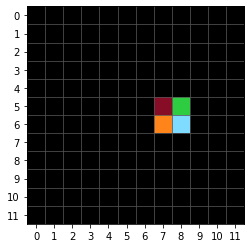

In [1026]:
plot_grid(channel_to_grid(input_train[0], ch_to_symbols[0]))

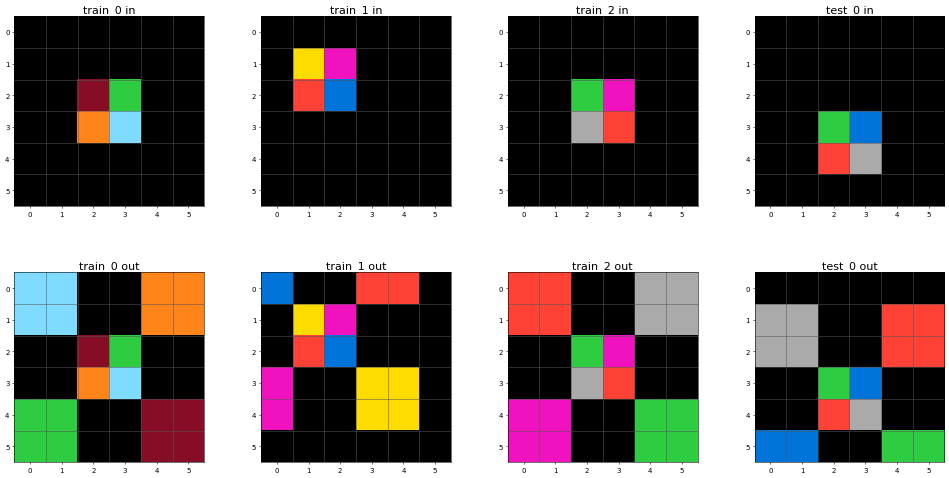

In [941]:
task.plot()

In [1028]:
patience = 10
cooldown = 32

def log_scale(x, factor, step=None, *args, **kwargs):
    return x**factor

def duration_fn(x, factor, **kwargs):
    return int(x**factor)

def get_pred(x, ch):
    return tf.concat([x[...,:ch], x[...,-1:]], axis=-1)

dropout = AdapativeParam(start_value=0.5, 
                         factor=.95,
                         update_fn=log_scale,
                         mode='min', 
                         upper_bound=1.,
                         patience=20,
                         name='dropout')

step_size = AdapativeParam(start_value=1., 
                           factor=.975,
                           mode='min',
                           lower_bound=.5,
                           patience=25,
                           name='step_size')

mask_th = AdapativeParam(start_value=0.1, 
                         factor=.95,
                         mode='min', 
                         update_fn=log_scale,
                         upper_bound=.5,
                         patience=20,
                         name='mask_th')

sim_duration = AdapativeParam(start_value=16,
                              factor=1.1,
                              upper_bound=96,
                              patience=10,
                              reset=True,
                              update_fn=duration_fn,
                              name='sim_duration')

params = {
    'dropout': dropout, 
    'step_size': step_size, 
    'mask_th': mask_th,
    'sim_duration': sim_duration
}
sched = Scheduler(params)

num_input_channels = input_train.shape[-1]
num_channels = len(ch_to_symbols[0])

model = CAModel(mask_th=mask_th, num_channels=num_input_channels)
lr = 3e-4
lr_sched = tf.keras.optimizers.schedules.PiecewiseConstantDecay(
    [100, 250, 500], [lr, lr*.1 ,lr*.01, lr*.001])
optim = tf.keras.optimizers.Adam(lr)

pool_size = 128
batch_size = 8
num_reset = 2
sampler = CASampler(
     list(zip(*[np.repeat(input_train, pool_size, axis=0), 
                np.repeat(output_train, pool_size, axis=0),
                ch_to_symbols[:len(input_train)] * pool_size]))
)

cleanup()
dt_str = datetime.datetime.now().strftime('%Y%m%d_%H-%M-%S')
ckpt_dir = os.path.join(LOG_DIR, f'{task.name}_{dt_str}')
if not os.path.exists(ckpt_dir):
    os.makedirs(ckpt_dir)

use_sampler = True
print(sched)

<Scheduler: 
	<AdapativeParam (dropout): 0.5>
	<AdapativeParam (step_size): 1.0>
	<AdapativeParam (mask_th): 0.1>
	<AdapativeParam (sim_duration): 16>>


step 0 - loss : 0.0340 - acc : 0.9193  - best : 0.0340 (0)  - 0.9193 (0)


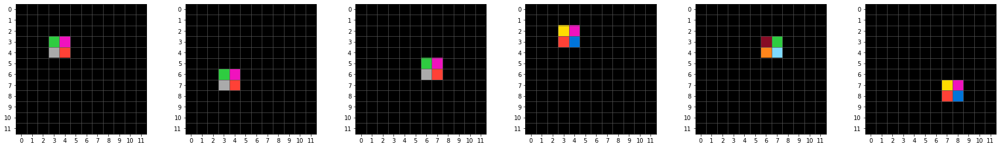

step 1 - loss : 0.0387 - acc : 0.9071  - best : 0.0340 (0)  - 0.9193 (0)
step 2 - loss : 0.0433 - acc : 0.8950  - best : 0.0340 (0)  - 0.9193 (0)
step 3 - loss : 0.0361 - acc : 0.9123  - best : 0.0340 (0)  - 0.9193 (0)
step 4 - loss : 0.0406 - acc : 0.8785  - best : 0.0340 (0)  - 0.9193 (0)
step 5 - loss : 0.0332 - acc : 0.8898  - best : 0.0332 (5)  - 0.9193 (0)


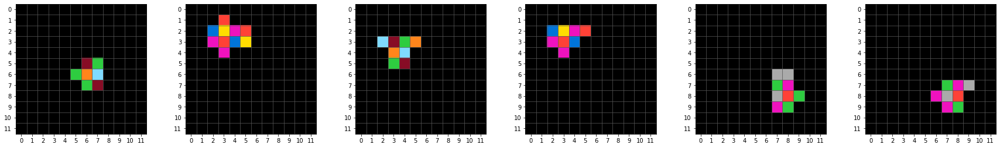

step 6 - loss : 0.0330 - acc : 0.8707  - best : 0.0330 (6)  - 0.9193 (0)


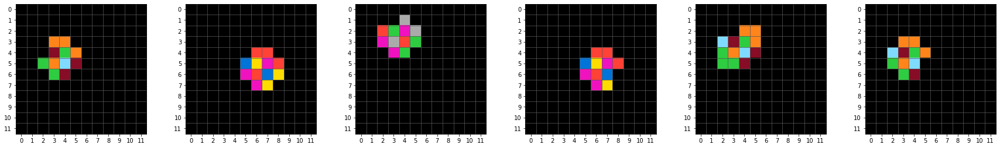

step 7 - loss : 0.0330 - acc : 0.8837  - best : 0.0330 (7)  - 0.9193 (0)


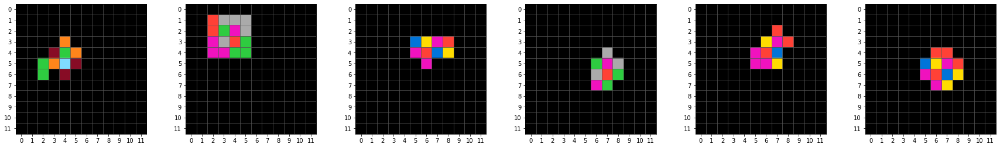

step 8 - loss : 0.0356 - acc : 0.8793  - best : 0.0330 (7)  - 0.9193 (0)
step 9 - loss : 0.0397 - acc : 0.8550  - best : 0.0330 (7)  - 0.9193 (0)
step 10 - loss : 0.0355 - acc : 0.8733  - best : 0.0330 (7)  - 0.9193 (0)
step 11 - loss : 0.0300 - acc : 0.8785  - best : 0.0300 (11)  - 0.9193 (0)


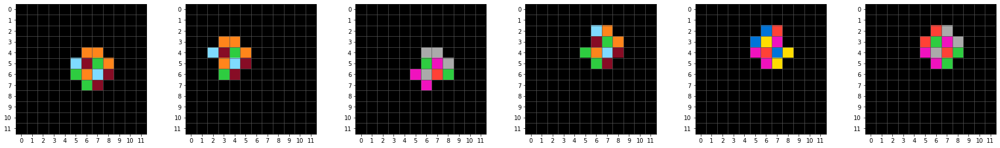

step 12 - loss : 0.0375 - acc : 0.8698  - best : 0.0300 (11)  - 0.9193 (0)
step 13 - loss : 0.0399 - acc : 0.8516  - best : 0.0300 (11)  - 0.9193 (0)
step 14 - loss : 0.0422 - acc : 0.8542  - best : 0.0300 (11)  - 0.9193 (0)
step 15 - loss : 0.0349 - acc : 0.8724  - best : 0.0300 (11)  - 0.9193 (0)
step 16 - loss : 0.0328 - acc : 0.8724  - best : 0.0300 (11)  - 0.9193 (0)
step 17 - loss : 0.0394 - acc : 0.8707  - best : 0.0300 (11)  - 0.9193 (0)
step 18 - loss : 0.0343 - acc : 0.8837  - best : 0.0300 (11)  - 0.9193 (0)
step 19 - loss : 0.0296 - acc : 0.8958  - best : 0.0296 (19)  - 0.9193 (0)


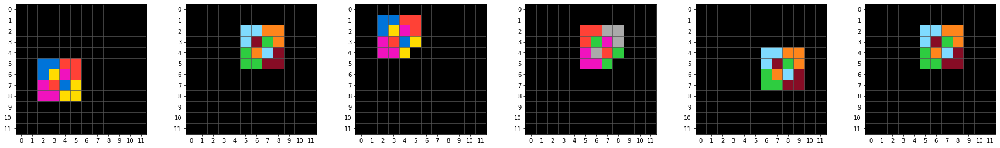

step 20 - loss : 0.0370 - acc : 0.8655  - best : 0.0296 (19)  - 0.9193 (0)
step 21 - loss : 0.0397 - acc : 0.8620  - best : 0.0296 (19)  - 0.9193 (0)
step 22 - loss : 0.0371 - acc : 0.8637  - best : 0.0296 (19)  - 0.9193 (0)
step 23 - loss : 0.0368 - acc : 0.8750  - best : 0.0296 (19)  - 0.9193 (0)
step 24 - loss : 0.0360 - acc : 0.8785  - best : 0.0296 (19)  - 0.9193 (0)
step 25 - loss : 0.0369 - acc : 0.8698  - best : 0.0296 (19)  - 0.9193 (0)
step 26 - loss : 0.0316 - acc : 0.8880  - best : 0.0296 (19)  - 0.9193 (0)
step 27 - loss : 0.0385 - acc : 0.8733  - best : 0.0296 (19)  - 0.9193 (0)
step 28 - loss : 0.0386 - acc : 0.8715  - best : 0.0296 (19)  - 0.9193 (0)
step 29 - loss : 0.0312 - acc : 0.8915  - best : 0.0296 (19)  - 0.9193 (0)
step 30 - loss : 0.0357 - acc : 0.8793  - best : 0.0296 (19)  - 0.9193 (0)
Updating sim_duration from 16 to 21 at step 0
step 31 - loss : 0.0364 - acc : 0.8759  - best : 0.0296 (19)  - 0.9193 (0)
step 32 - loss : 0.0358 - acc : 0.8741  - best : 0.029

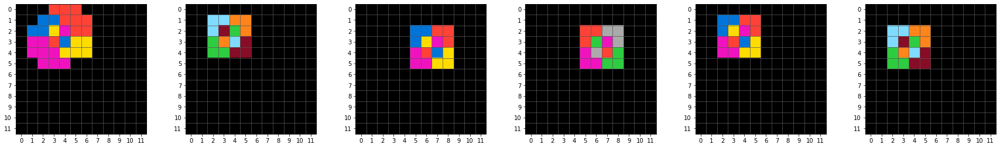

step 34 - loss : 0.0398 - acc : 0.8663  - best : 0.0288 (33)  - 0.9193 (0)
step 35 - loss : 0.0381 - acc : 0.8698  - best : 0.0288 (33)  - 0.9193 (0)
step 36 - loss : 0.0354 - acc : 0.8759  - best : 0.0288 (33)  - 0.9193 (0)
step 37 - loss : 0.0311 - acc : 0.8837  - best : 0.0288 (33)  - 0.9193 (0)
step 38 - loss : 0.0400 - acc : 0.8663  - best : 0.0288 (33)  - 0.9193 (0)
step 39 - loss : 0.0349 - acc : 0.8750  - best : 0.0288 (33)  - 0.9193 (0)
step 40 - loss : 0.0346 - acc : 0.8785  - best : 0.0288 (33)  - 0.9193 (0)
step 41 - loss : 0.0292 - acc : 0.8950  - best : 0.0288 (33)  - 0.9193 (0)
step 42 - loss : 0.0353 - acc : 0.8767  - best : 0.0288 (33)  - 0.9193 (0)
step 43 - loss : 0.0306 - acc : 0.8898  - best : 0.0288 (33)  - 0.9193 (0)
step 44 - loss : 0.0389 - acc : 0.8646  - best : 0.0288 (33)  - 0.9193 (0)
Updating sim_duration from 21 to 28 at step 0
step 45 - loss : 0.0377 - acc : 0.8733  - best : 0.0288 (33)  - 0.9193 (0)
step 46 - loss : 0.0323 - acc : 0.8811  - best : 0.028

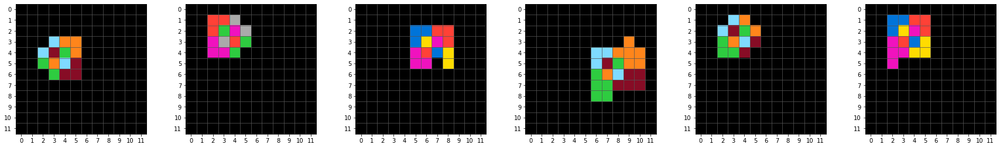

step 59 - loss : 0.0309 - acc : 0.8811  - best : 0.0277 (58)  - 0.9193 (0)
step 60 - loss : 0.0326 - acc : 0.8819  - best : 0.0277 (58)  - 0.9193 (0)
step 61 - loss : 0.0390 - acc : 0.8663  - best : 0.0277 (58)  - 0.9193 (0)
step 62 - loss : 0.0376 - acc : 0.8663  - best : 0.0277 (58)  - 0.9193 (0)
step 63 - loss : 0.0296 - acc : 0.8802  - best : 0.0277 (58)  - 0.9193 (0)
step 64 - loss : 0.0369 - acc : 0.8733  - best : 0.0277 (58)  - 0.9193 (0)
step 65 - loss : 0.0356 - acc : 0.8733  - best : 0.0277 (58)  - 0.9193 (0)
step 66 - loss : 0.0359 - acc : 0.8741  - best : 0.0277 (58)  - 0.9193 (0)
step 67 - loss : 0.0304 - acc : 0.8767  - best : 0.0277 (58)  - 0.9193 (0)
step 68 - loss : 0.0341 - acc : 0.8733  - best : 0.0277 (58)  - 0.9193 (0)
step 69 - loss : 0.0273 - acc : 0.8776  - best : 0.0273 (69)  - 0.9193 (0)


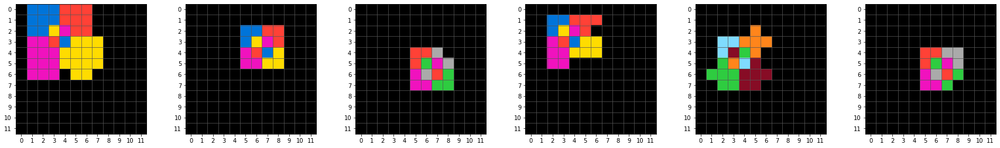

step 70 - loss : 0.0300 - acc : 0.8872  - best : 0.0273 (69)  - 0.9193 (0)
step 71 - loss : 0.0206 - acc : 0.8915  - best : 0.0206 (71)  - 0.9193 (0)


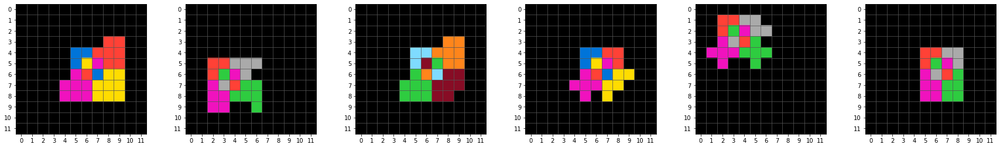

step 72 - loss : 0.0274 - acc : 0.8837  - best : 0.0206 (71)  - 0.9193 (0)
step 73 - loss : 0.0290 - acc : 0.8733  - best : 0.0206 (71)  - 0.9193 (0)
step 74 - loss : 0.0357 - acc : 0.8646  - best : 0.0206 (71)  - 0.9193 (0)
step 75 - loss : 0.0295 - acc : 0.8854  - best : 0.0206 (71)  - 0.9193 (0)
step 76 - loss : 0.0384 - acc : 0.8698  - best : 0.0206 (71)  - 0.9193 (0)
step 77 - loss : 0.0358 - acc : 0.8741  - best : 0.0206 (71)  - 0.9193 (0)
step 78 - loss : 0.0213 - acc : 0.8924  - best : 0.0206 (71)  - 0.9193 (0)
step 79 - loss : 0.0263 - acc : 0.8941  - best : 0.0206 (71)  - 0.9193 (0)
step 80 - loss : 0.0210 - acc : 0.8811  - best : 0.0206 (71)  - 0.9193 (0)
step 81 - loss : 0.0254 - acc : 0.8811  - best : 0.0206 (71)  - 0.9193 (0)
step 82 - loss : 0.0222 - acc : 0.9054  - best : 0.0206 (71)  - 0.9193 (0)
Updating sim_duration from 39 to 56 at step 0
step 83 - loss : 0.0293 - acc : 0.8854  - best : 0.0206 (71)  - 0.9193 (0)
step 84 - loss : 0.0306 - acc : 0.8863  - best : 0.020

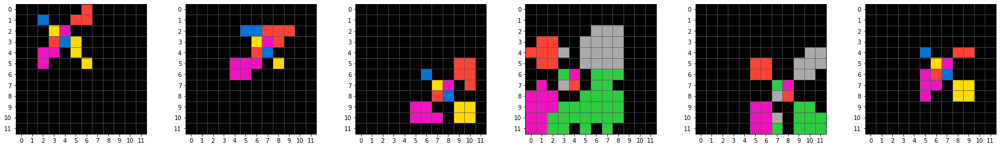

step 128 - loss : 0.0321 - acc : 0.8411  - best : 0.0200 (127)  - 0.9193 (0)
step 129 - loss : 0.0245 - acc : 0.8802  - best : 0.0200 (127)  - 0.9193 (0)
step 130 - loss : 0.0206 - acc : 0.9115  - best : 0.0200 (127)  - 0.9193 (0)
step 131 - loss : 0.0215 - acc : 0.9019  - best : 0.0200 (127)  - 0.9193 (0)
step 132 - loss : 0.0235 - acc : 0.9323  - best : 0.0200 (127)  - 0.9323 (132)


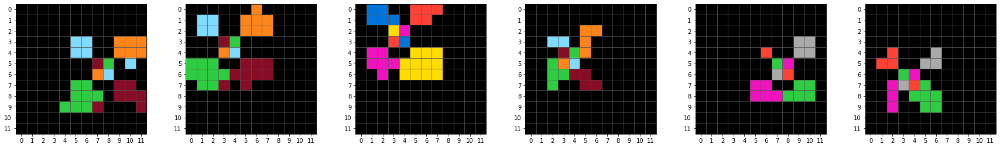

step 133 - loss : 0.0244 - acc : 0.9123  - best : 0.0200 (127)  - 0.9323 (132)
step 134 - loss : 0.0243 - acc : 0.9106  - best : 0.0200 (127)  - 0.9323 (132)
step 135 - loss : 0.0230 - acc : 0.8715  - best : 0.0200 (127)  - 0.9323 (132)
step 136 - loss : 0.0220 - acc : 0.9071  - best : 0.0200 (127)  - 0.9323 (132)
step 137 - loss : 0.0255 - acc : 0.8819  - best : 0.0200 (127)  - 0.9323 (132)
step 138 - loss : 0.0273 - acc : 0.8325  - best : 0.0200 (127)  - 0.9323 (132)
Updating sim_duration from 28 to 39 at step 0
step 139 - loss : 0.0254 - acc : 0.8255  - best : 0.0200 (127)  - 0.9323 (132)
step 140 - loss : 0.0256 - acc : 0.8785  - best : 0.0200 (127)  - 0.9323 (132)
step 141 - loss : 0.0265 - acc : 0.8542  - best : 0.0200 (127)  - 0.9323 (132)
step 142 - loss : 0.0186 - acc : 0.8550  - best : 0.0186 (142)  - 0.9323 (132)


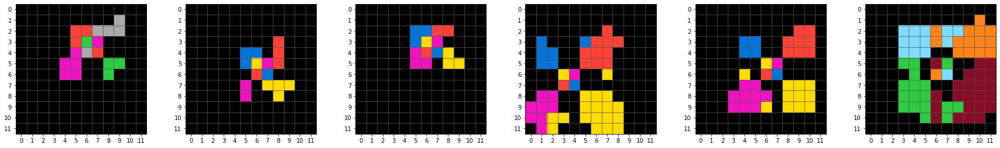

step 143 - loss : 0.0279 - acc : 0.8733  - best : 0.0186 (142)  - 0.9323 (132)
step 144 - loss : 0.0243 - acc : 0.8976  - best : 0.0186 (142)  - 0.9323 (132)
step 145 - loss : 0.0253 - acc : 0.9340  - best : 0.0186 (142)  - 0.9340 (145)


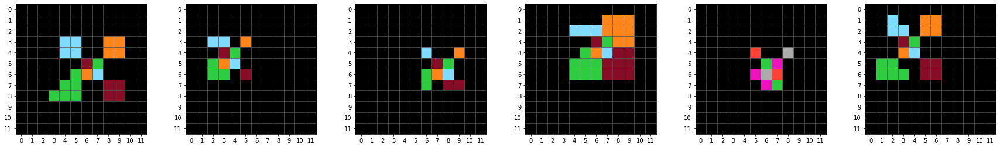

step 146 - loss : 0.0304 - acc : 0.8516  - best : 0.0186 (142)  - 0.9340 (145)
step 147 - loss : 0.0183 - acc : 0.8889  - best : 0.0183 (147)  - 0.9340 (145)


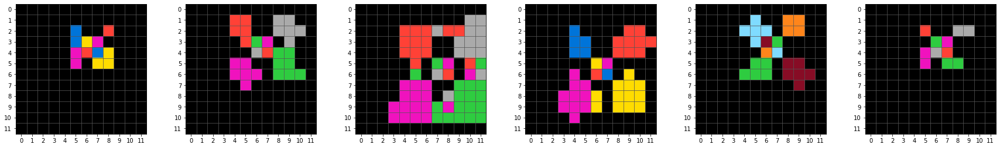

step 148 - loss : 0.0248 - acc : 0.9045  - best : 0.0183 (147)  - 0.9340 (145)
step 149 - loss : 0.0222 - acc : 0.8932  - best : 0.0183 (147)  - 0.9340 (145)
step 150 - loss : 0.0296 - acc : 0.8368  - best : 0.0183 (147)  - 0.9340 (145)
step 151 - loss : 0.0256 - acc : 0.8932  - best : 0.0183 (147)  - 0.9340 (145)
step 152 - loss : 0.0306 - acc : 0.8637  - best : 0.0183 (147)  - 0.9340 (145)
step 153 - loss : 0.0236 - acc : 0.8655  - best : 0.0183 (147)  - 0.9340 (145)
step 154 - loss : 0.0372 - acc : 0.7821  - best : 0.0183 (147)  - 0.9340 (145)
step 155 - loss : 0.0236 - acc : 0.8863  - best : 0.0183 (147)  - 0.9340 (145)
step 156 - loss : 0.0194 - acc : 0.9062  - best : 0.0183 (147)  - 0.9340 (145)
step 157 - loss : 0.0313 - acc : 0.8420  - best : 0.0183 (147)  - 0.9340 (145)
step 158 - loss : 0.0198 - acc : 0.9340  - best : 0.0183 (147)  - 0.9340 (145)
Updating sim_duration from 39 to 56 at step 0
step 159 - loss : 0.0242 - acc : 0.8767  - best : 0.0183 (147)  - 0.9340 (145)
step 1

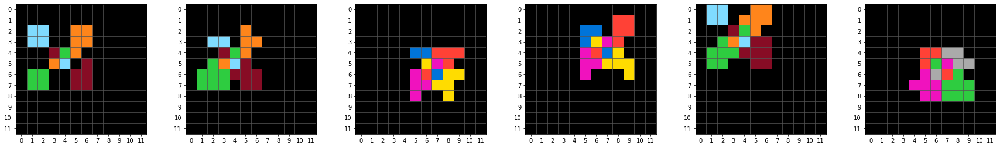

step 168 - loss : 0.0180 - acc : 0.8863  - best : 0.0180 (168)  - 0.9358 (167)


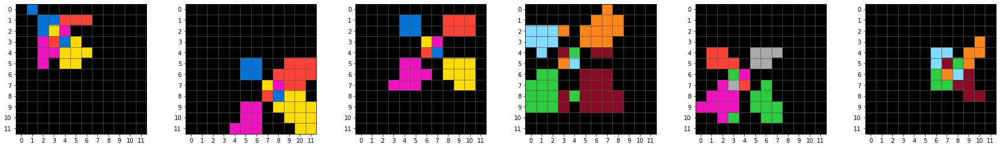

step 169 - loss : 0.0303 - acc : 0.8351  - best : 0.0180 (168)  - 0.9358 (167)
step 170 - loss : 0.0196 - acc : 0.9167  - best : 0.0180 (168)  - 0.9358 (167)
step 171 - loss : 0.0244 - acc : 0.8759  - best : 0.0180 (168)  - 0.9358 (167)
step 172 - loss : 0.0211 - acc : 0.9349  - best : 0.0180 (168)  - 0.9358 (167)
step 173 - loss : 0.0230 - acc : 0.8941  - best : 0.0180 (168)  - 0.9358 (167)
step 174 - loss : 0.0297 - acc : 0.8802  - best : 0.0180 (168)  - 0.9358 (167)
step 175 - loss : 0.0248 - acc : 0.9002  - best : 0.0180 (168)  - 0.9358 (167)
step 176 - loss : 0.0286 - acc : 0.8264  - best : 0.0180 (168)  - 0.9358 (167)
step 177 - loss : 0.0176 - acc : 0.9036  - best : 0.0176 (177)  - 0.9358 (167)


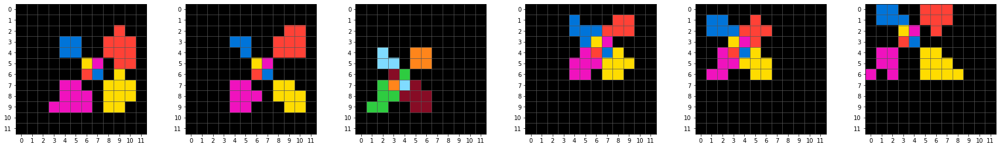

step 178 - loss : 0.0180 - acc : 0.9028  - best : 0.0176 (177)  - 0.9358 (167)
step 179 - loss : 0.0269 - acc : 0.8620  - best : 0.0176 (177)  - 0.9358 (167)
step 180 - loss : 0.0221 - acc : 0.8941  - best : 0.0176 (177)  - 0.9358 (167)
step 181 - loss : 0.0206 - acc : 0.9080  - best : 0.0176 (177)  - 0.9358 (167)
step 182 - loss : 0.0179 - acc : 0.8828  - best : 0.0176 (177)  - 0.9358 (167)
step 183 - loss : 0.0186 - acc : 0.8924  - best : 0.0176 (177)  - 0.9358 (167)
step 184 - loss : 0.0222 - acc : 0.8889  - best : 0.0176 (177)  - 0.9358 (167)
step 185 - loss : 0.0189 - acc : 0.8715  - best : 0.0176 (177)  - 0.9358 (167)
step 186 - loss : 0.0244 - acc : 0.8958  - best : 0.0176 (177)  - 0.9358 (167)
step 187 - loss : 0.0204 - acc : 0.8273  - best : 0.0176 (177)  - 0.9358 (167)
step 188 - loss : 0.0226 - acc : 0.8351  - best : 0.0176 (177)  - 0.9358 (167)
Updating sim_duration from 56 to 83 at step 0
step 189 - loss : 0.0213 - acc : 0.9097  - best : 0.0176 (177)  - 0.9358 (167)
step 1

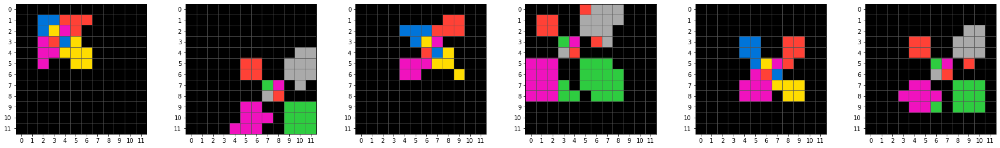

step 191 - loss : 0.0169 - acc : 0.9106  - best : 0.0159 (190)  - 0.9358 (167)
step 192 - loss : 0.0200 - acc : 0.8793  - best : 0.0159 (190)  - 0.9358 (167)
step 193 - loss : 0.0258 - acc : 0.8481  - best : 0.0159 (190)  - 0.9358 (167)
step 194 - loss : 0.0254 - acc : 0.8490  - best : 0.0159 (190)  - 0.9358 (167)
step 195 - loss : 0.0286 - acc : 0.8073  - best : 0.0159 (190)  - 0.9358 (167)
step 196 - loss : 0.0199 - acc : 0.8863  - best : 0.0159 (190)  - 0.9358 (167)
step 197 - loss : 0.0250 - acc : 0.8828  - best : 0.0159 (190)  - 0.9358 (167)
step 198 - loss : 0.0175 - acc : 0.9097  - best : 0.0159 (190)  - 0.9358 (167)
step 199 - loss : 0.0274 - acc : 0.8663  - best : 0.0159 (190)  - 0.9358 (167)
step 200 - loss : 0.0223 - acc : 0.8924  - best : 0.0159 (190)  - 0.9358 (167)
step 201 - loss : 0.0231 - acc : 0.8845  - best : 0.0159 (190)  - 0.9358 (167)
Resetting sim_duration from 83 to 16 at step 0.
step 202 - loss : 0.0260 - acc : 0.8828  - best : 0.0159 (190)  - 0.9358 (167)
step

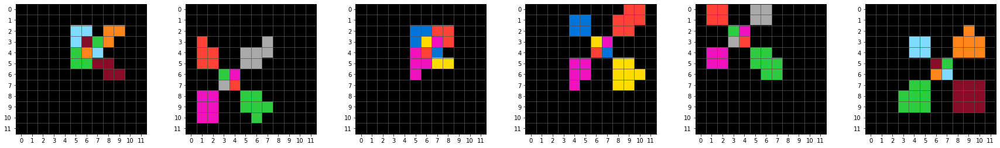

step 241 - loss : 0.0200 - acc : 0.8750  - best : 0.0140 (240)  - 0.9358 (167)
step 242 - loss : 0.0186 - acc : 0.9010  - best : 0.0140 (240)  - 0.9358 (167)
step 243 - loss : 0.0192 - acc : 0.8872  - best : 0.0140 (240)  - 0.9358 (167)
step 244 - loss : 0.0248 - acc : 0.8559  - best : 0.0140 (240)  - 0.9358 (167)
step 245 - loss : 0.0225 - acc : 0.8802  - best : 0.0140 (240)  - 0.9358 (167)
step 246 - loss : 0.0221 - acc : 0.8924  - best : 0.0140 (240)  - 0.9358 (167)
step 247 - loss : 0.0232 - acc : 0.8898  - best : 0.0140 (240)  - 0.9358 (167)
step 248 - loss : 0.0204 - acc : 0.8915  - best : 0.0140 (240)  - 0.9358 (167)
step 249 - loss : 0.0247 - acc : 0.8802  - best : 0.0140 (240)  - 0.9358 (167)
step 250 - loss : 0.0218 - acc : 0.9262  - best : 0.0140 (240)  - 0.9358 (167)
step 251 - loss : 0.0154 - acc : 0.9236  - best : 0.0140 (240)  - 0.9358 (167)
Updating sim_duration from 39 to 56 at step 0
step 252 - loss : 0.0234 - acc : 0.9175  - best : 0.0140 (240)  - 0.9358 (167)
step 2

ValueError: setting an array element with a sequence.

In [1029]:
x = input_train.copy()
y = output_train.copy()
cmap = ch_to_symbols

input_states = []
output_states = []
grads_x = []
grads_w = []
losses = []
accs = []
dx = []

best_loss = np.inf
best_acc = 0
best_loss_step = 0
best_acc_step = 0

steps = 300
sim_range = range(16, 64)
new_best = False

for _ in range(steps):
    step = optim.iterations.numpy()
    
    step_input_states = []
    step_output_states = []
    step_grads_x = []
    step_grads_w = []
    step_losses = []
    step_accs = []
    step_dx = []

#     sim_bound = int(sim_duration.value)
#     sims = np.random.choice(range(int(sim_bound*.75), sim_bound))
    sims = np.random.choice(range(16, 32))
    
    # update inputs when using sampler
    if use_sampler:
        batch = sampler.sample(batch_size)
        x, y, cmap = batch.get()
        loss_rank = mean_squared_error(y, get_pred(x, num_channels)).numpy().argsort()[::-1]
        x = x[loss_rank]
        y = y[loss_rank]
        cmap = [cmap[i] for i in loss_rank]
        indices = np.random.choice(range(len(input_train)), num_reset)
        x[:num_reset] = input_train[indices].copy()
        y[:num_reset] = output_train[indices].copy()
        cmap[:num_reset] = [ch_to_symbols[i] for i in indices]
    
    for _ in range(sims):
        step_input_states.append(x)
        
        with tf.GradientTape(persistent=True) as g:
            x = model(x, 
                      dropout=tf.constant(dropout.value),
                      step_size=tf.constant(step_size.value), 
                      mask_th=tf.constant(mask_th.value))
            loss = tf.reduce_mean(mean_squared_error(y, get_pred(x, num_channels)))
        
        # backprop
        gw = g.gradient(loss, model.weights)
        gw = [g/(tf.norm(g)+1e-8) for g in gw]
#         gx = g.gradient(loss, x)
        acc = score_ca(y, get_pred(x, num_channels), cmap, mask_th=mask_th)
        
#         step_output_states.append(x.numpy())
#         step_losses.append(loss.numpy())
#         step_grads_w.append(gw)
#         step_grads_x.append(gx.numpy())
#         step_accs.append(acc)
#         step_dx.append(model.perceive(x).numpy())
    
    # apply gradients and score response
    optim.apply_gradients(zip(gw, model.weights))
    acc = score_ca(y, get_pred(x, num_channels), cmap, mask_th=mask_th)
    
    if loss < best_loss:
        best_loss = loss
        best_loss_step = step
        new_best = True
#         save_model(model, os.path.join(ckpt_dir, f'{step:04d}_{loss}_{acc}'), sched)
    if acc > best_acc:
        best_acc = acc
        best_acc_step = step
        new_best = True
        save_model(model, os.path.join(ckpt_dir, f'{step:04d}_{loss}_{acc}'), sched)
    
    print(f'step {step} - loss : {loss.numpy():.4f} - acc : {acc:.4f} '
          f' - best : {best_loss:.4f} ({best_loss_step}) '
          f' - {best_acc:.4f} ({best_acc_step})')
    
#     if new_best:
#         plot_grids(get_pred(x, num_channels), cmap, mask_th, 6)
        
    sched(loss, step)
    
    input_states.append(step_input_states)
    output_states.append(step_output_states)
#     grads_x.append(step_grads_x)
    grads_w.append(step_grads_w)
    losses.append(step_losses)
    accs.append(step_accs)
#     dx.append(step_dx)
    
    if use_sampler:
        batch.update(list(zip(*[x, y, cmap])))
    else:
        x = input_train.copy()
    
    new_best = False

In [1009]:
m = CAModel(model.num_channels)
m.load_weights(os.path.join(ckpt_dir,'0245_0.07549794763326645_0.9814814814814815'))

In [1030]:
preds = []
perc = []
for _ in range(50):
    perc.append(model.perceive(x_ex)[0].numpy())
    x_ex = model(x_ex, 
                 dropout=tf.constant(dropout.value),
              step_size=tf.constant(step_size.value), 
              mask_th=tf.constant(mask_th.value))
    preds.append(x_ex)

NameError: name 'x_ex' is not defined

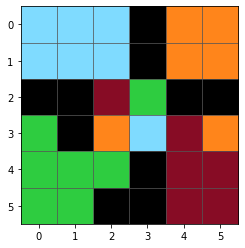

In [950]:
plot_grid(channel_to_grid(output_states[-1][-1][0], ch_to_symbols[0], .1))

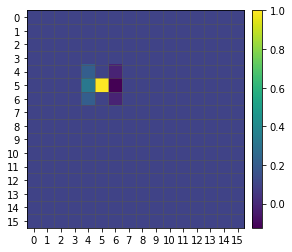

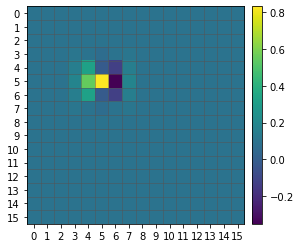

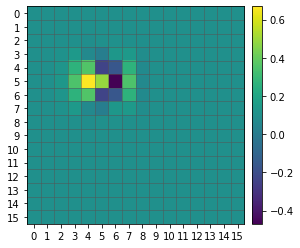

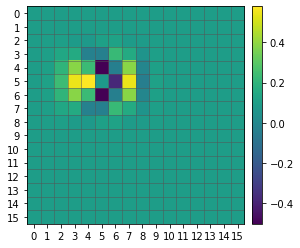

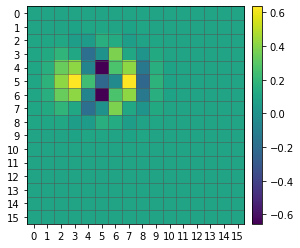

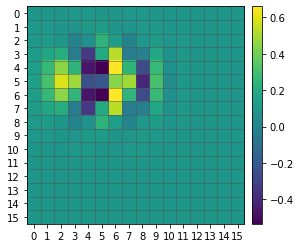

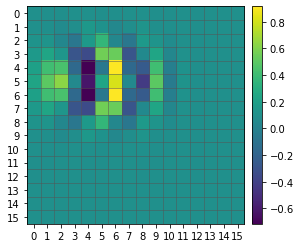

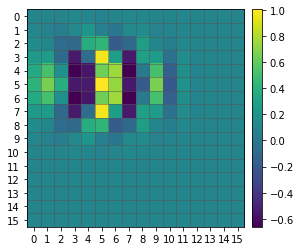

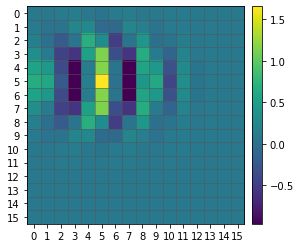

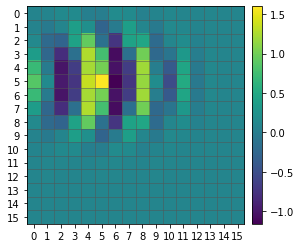

In [209]:
x = input_train[0,...,2]
for _ in range(10):
    y = tf.nn.depthwise_conv2d(pad(x[None,...,None], 1,1, pad_value=.1), sobel_x[...,None,None]/8.,[1,1,1,1], 'SAME').numpy()
    x = x + unpad(y[0,...,0], x.shape)
    plot_gradient(x)
    plt.show()


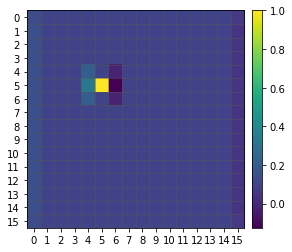

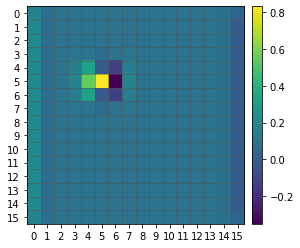

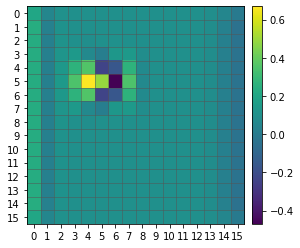

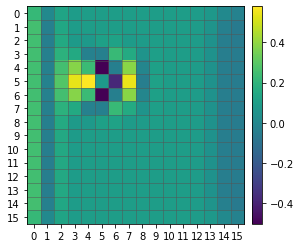

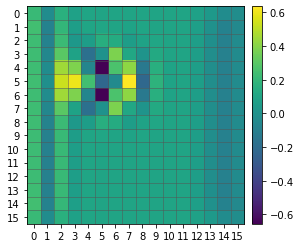

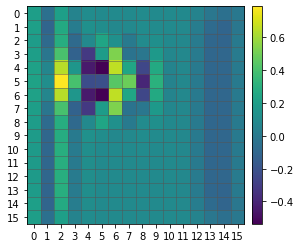

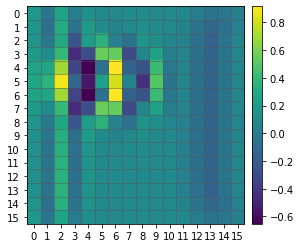

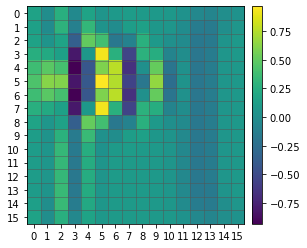

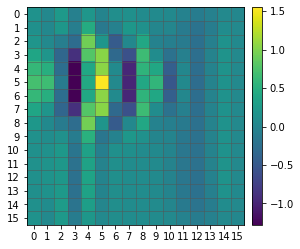

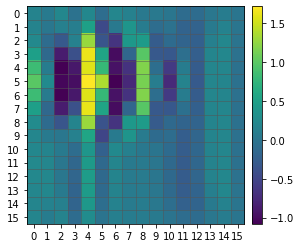

In [210]:
# x = unpad(input_train[0,...,0], task.shapes[0])
x = input_train[0,...,2]
for _ in range(10):
    y = tf.nn.depthwise_conv2d(x[None,...,None], sobel_x[...,None,None]/8.,[1,1,1,1], 'SAME').numpy()
    x = x + y[0,...,0]
    plot_gradient(x)
    plt.show()

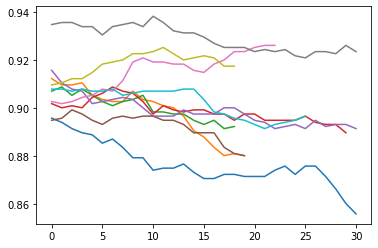

In [1031]:
fig = plt.figure()
_a = accs[-10:]
for i in range(len(_a)):
    plt.plot(_a[i], label=i)
# plt.legend()

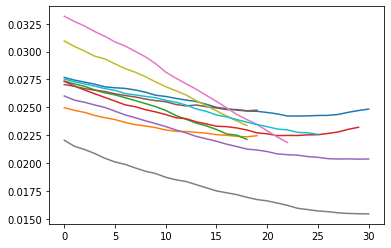

In [1032]:
fig = plt.figure()
_l = losses[-10:]
for i in range(len(_l)):
    plt.plot(_l[i], label=i)
# plt.legend()

--------------------------------------------------------------------------------
69
--------------------------------------------------------------------------------


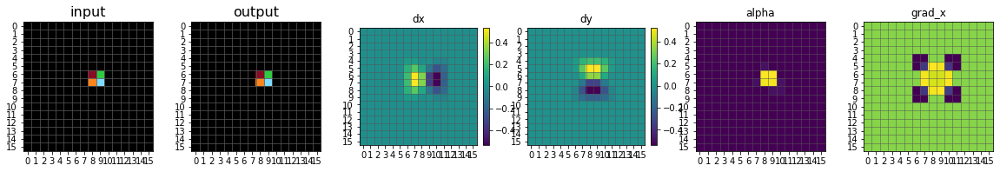

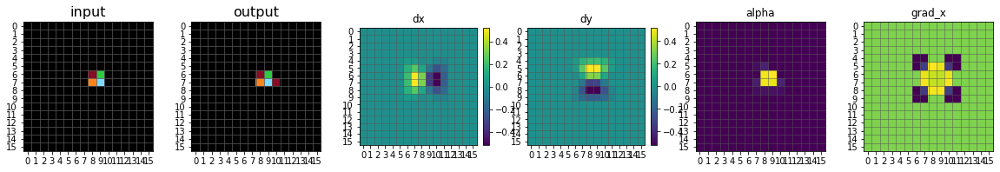

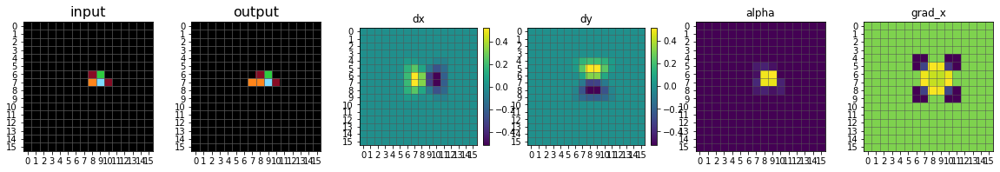

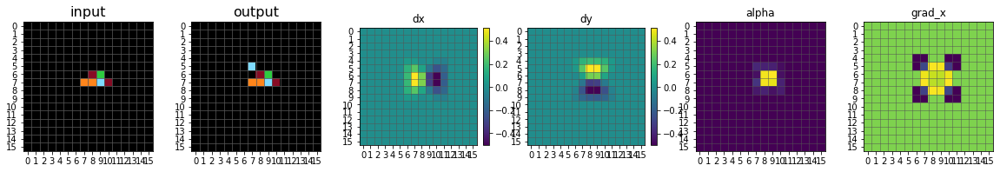

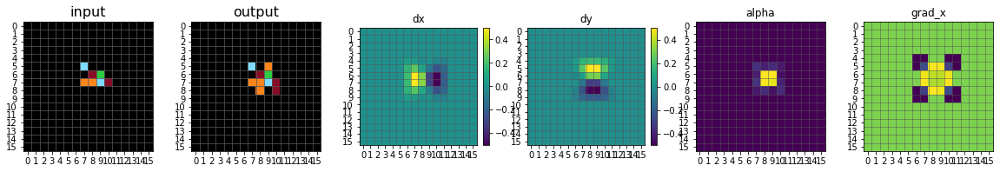

...

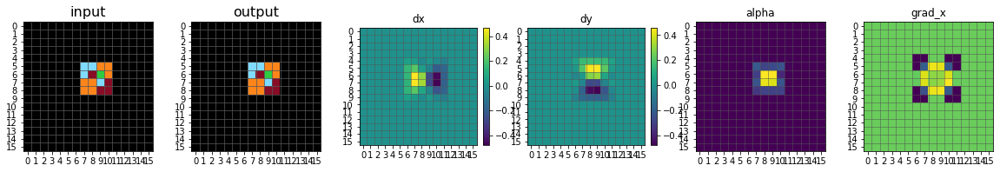

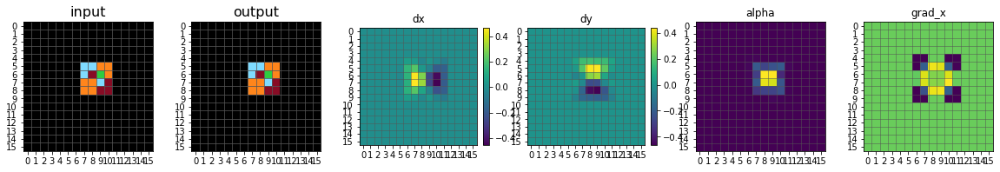

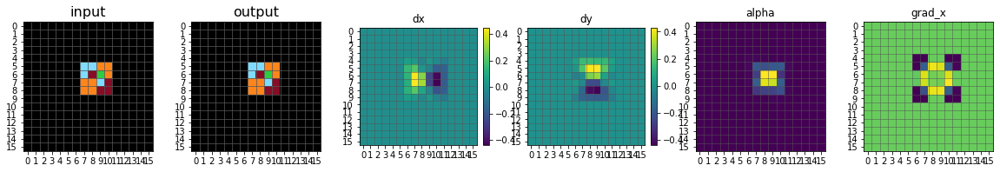

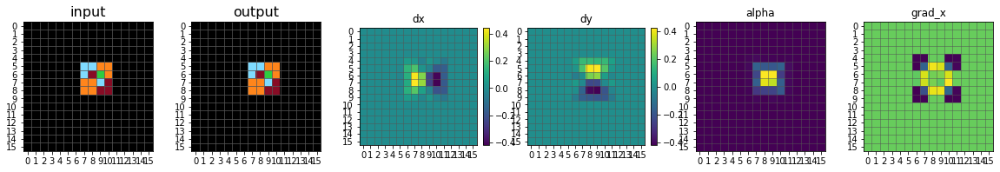

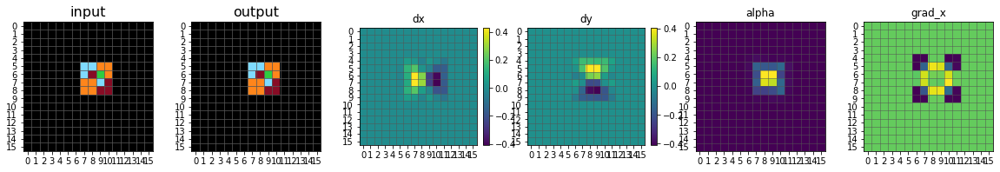

In [94]:
alive_th =  .1 #mask_th.value
idx = 0
ch_to_symbol = ch_to_symbols[idx]
last_n = 20

steps = [69]

for step in steps:
    print('-'*80)
    print(step)
    print('-'*80)
    
    num_examples = len(input_states[step])
    last_n = num_examples if last_n == -1 else num_examples
    for i in range(num_examples-last_n, num_examples):
        inp = input_states[step][i][idx]
        out = output_states[step][i][idx]
        gx = grads_x[step][i][idx]
        
        fig, ax = plt.subplots(1, 6, figsize=(20,12))
        plt.subplots_adjust(wspace=0.3, hspace=0.3)
        plot_grid(channel_to_grid(inp, mask_th=alive_th, ch_to_symbol=ch_to_symbol), ax[0], title='input')
        plot_grid(channel_to_grid(out, mask_th=alive_th, ch_to_symbol=ch_to_symbol), ax[1], title='output')
        
        ax_dx = plot_gradient(dx[step][i][idx,...,13:17].sum(axis=-1), ax[2])
        ax_dx.set_title('dx')
        ax_dy = plot_gradient(dx[step][i][idx,...,26:30].sum(axis=-1), ax[3])
        ax_dy.set_title('dy')
        
        ax_a = plot_gradient(out[:,:,-1], ax[-2], False)
        ax_a.set_title('alpha', size=12)
        
        ax_g = plot_gradient(gx.sum(axis=-1), ax[-1], False)
        ax_g.set_title('grad_x', size=12)
        plt.show();
    break

In [1100]:
def generate_preds(model, 
                   x,
                   y,
                   cmap, 
                   dropout=.5,
                   step_size=.1,
                   mask_th=.1,
                   steps=100,
                   output_shape=None):
    y_preds = []
    losses, accs = [], []

    for i in range(steps):
        x = model(x, dropout=dropout, step_size=step_size)
        losses.append(tf.reduce_mean(mean_squared_error(y, get_pred(x, len(cmap)))).numpy())
        accs.append(score_ca(y, x, cmap, mask_th, output_shape))
        print(f'step {i} - loss : {losses[i]:.4f} - acc : {accs[i]:.4f}')
        y_preds.append(x.numpy())
    
    best_idx = np.argmax(accs)
    print(f'\nbest step - {best_idx} - acc : {accs[best_idx]:.4f} - loss : {losses[best_idx]:.4f}')
    return y_preds

In [1102]:
idx = 0
x = input_test[idx:idx+1]
y = output_test[idx:idx+1]
cmap = task.ch_to_colors[-1]
shape = task.output_shapes[idx+1]
params = {
    'step_size': 1,
    'dropout': 1.,
    'mask_th': mask_th.value,
    'steps': 150,
    'output_shape': shape
}
p = generate_preds(model, x, y, cmap, **params)

step 0 - loss : 0.0329 - acc : 0.6667
step 1 - loss : 0.0328 - acc : 0.6667
step 2 - loss : 0.0324 - acc : 0.6667
step 3 - loss : 0.0320 - acc : 0.6667
step 4 - loss : 0.0316 - acc : 0.6667
step 5 - loss : 0.0310 - acc : 0.6667
step 6 - loss : 0.0302 - acc : 0.7222
step 7 - loss : 0.0297 - acc : 0.7222
step 8 - loss : 0.0292 - acc : 0.7500
step 9 - loss : 0.0286 - acc : 0.7778
step 10 - loss : 0.0280 - acc : 0.7500
step 11 - loss : 0.0275 - acc : 0.7222
step 12 - loss : 0.0267 - acc : 0.7222
step 13 - loss : 0.0264 - acc : 0.7222
step 14 - loss : 0.0258 - acc : 0.7222
step 15 - loss : 0.0249 - acc : 0.7222
step 16 - loss : 0.0243 - acc : 0.6667
step 17 - loss : 0.0237 - acc : 0.6667
step 18 - loss : 0.0233 - acc : 0.6389
step 19 - loss : 0.0226 - acc : 0.6389
step 20 - loss : 0.0217 - acc : 0.6667
step 21 - loss : 0.0212 - acc : 0.6389
step 22 - loss : 0.0207 - acc : 0.6389
step 23 - loss : 0.0202 - acc : 0.7222
step 24 - loss : 0.0199 - acc : 0.7500
step 25 - loss : 0.0195 - acc : 0.7

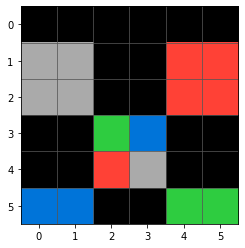

In [1052]:
y_padded = unpad(y, shape)
y_test = channel_to_grid(y_padded[0], cmap)
plot_grid(y_test)

1.0


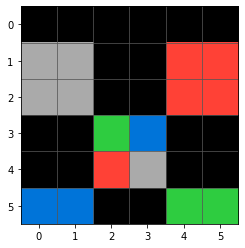

In [1082]:
p_idx = 50
pred_padded = unpad(p[p_idx], shape)
y_pred = channel_to_grid(pred_padded[0], cmap, mask_th.value)
print(score_ca(y_test, y_pred))
plot_grid(y_pred)

In [1058]:
score_ca(y_test, y_pred)

1.0

In [1054]:
p_idx = 35
pred_padded = unpad(preds[p_idx], task.output_shapes[-1])
y_pred = channel_to_grid(pred_padded[0], ch_to_symbols[-1], .5)
plot_grid(y_pred)


IndexError: list index out of range

In [1815]:
def visualize_batch_2(x0, x, step_i):
    vis0 = np.hstack(channel_to_grid(x0))
    vis1 = np.hstack(channel_to_grid(x.numpy()))
    vis = np.vstack([vis0, vis1])
    plt.imshow(vis)